This notebook goes from the point where we can follow the growth of a falling and growing
particle to the problem of evaluating the growth rate of the inner core (and doing a reasonably
self consistent calculation). It is very much a work in progress, but with the current rough
approach we would need a particle nucleation rate of about 1E-14 particles/m^.sec to account for
1 km/Myr of inner core growth. This is much larger than we expect (1E-30??).

But there is a lot that I have not done. Specifically:

1. Let pressure, temperature and oxygen content be functions of height above the ICB. This
is easy to fix (just set up functions that return the value on the basis of z, pass these
in as 'args' to the solver and evaluate inside the derivative function). But we need to choose
sensible functions / profiles.
2. Set a sensible spacing between the particles. This should determine rtot and thus should
(maybe) be a function of depth. The rough approach would be to
* Choose a value for rtot and solve the problem as a function of z_init
* Evaluate the number density (and volume density) of particles as a function of depth.
(this needs some thinking about the maths)
* Set rtot as a function and iterate until the density of particles is constant. This
means we wrap the whole thing in a root finding loop. Joy
3. Actually use rootfinding to work out what nucleation rate we need. If nucleation rate
is fixed (w.r.t. P, T & X). This should be easy and fast (we can extract it from the integral over the
sperical shell). However, if we make the rate depend on depth (i.e. P, T and X) things get a bit
more complicated - but I think we can still seperate the integrals.
4. Make the evaluation of the total composition inside rtot consistnet.
* At the moment we use xi in the calculation of the density difference. We should probably
solve this self consistently so we use the 'correct' composition. Needs rootfinding inside the
derivative function. Ouch. 
* Should we exclude the particle itself from the calclation? The logic would be that a particle
has replaced a volume of liquid, so it's only the liquid that needs to match the set composition.
But then I don't think growth would ever stop. Probably depends on what we want to simulate. 
5. Decide exactly what sort of calculation we want to do
6. Calculate F-layer seismic properties. Quite easy once we've done the second bullet under 2
above.
7. Comparison equilibrium calculation. This is going to be massivly different as we are so far
from equilibrium. 
8. See if anything changes as we alter the parameters

Also, note that things get a little computationally expensive from here on in. Even with only
ca.20 function evaluations to get the falling profile of a particle we need to (1) integrate
the results over starting height and (2) probably do that inside a optimisation loop. Maybe do 
(1) in parallel?



In [1]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import boundary_layer

Pr =  0.09075  Sc =  999.9999999999999


In [2]:
initial_particle_size = 1.0E-10 # initial radius, m
t = 5000.0 # temperature, K
p = 330.0 # GPa
xi = 0.95 # Overall composition, mol frac Fe
k0 = 150.0 # growth rate prefactor, m/s
rtot = 1.0 # initial box radius
dl = 1.0E-9 # diffusion
radius_inner_core = 1221.0e3
radius_top_flayer = radius_inner_core + 200.0e3
initial_particle_position = radius_top_flayer
mu = 1.0e-6 # kinematic viscosity
g = 3.7 # ICB gravity - from PREM
start_time = 0 # s
max_time = 1000000 # s

Derivative evaluation at 0.0 s, at z= 1421000.0 ,rp =  1e-10
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -102.1866073690195 intgration error: 1.0903195754527187e-12
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 27.6662314333024 intgration error: 3.5133653906004836e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277430.4081272609
Composition error: 6.999315631528447e-05 intgration error: 4.418044472157974e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277430.3796520638
Composition error: 4.6846526657873255e-11 intgration error: 4.4179667641962766e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277430.3796520447
Composition error: -8.038014698286133e-14 intgration error: 4.417966764144177e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277430.3796520447
Composition error: -7.682743330406083e-14 intgration error: 4.417966764144181e-14
HCP Fe mu: 1277142.2491326

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2495659143
Composition error: 1.7748432023623195e-05 intgration error: 4.41798646886215e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2495659036
Composition error: 2.982091493741734e-07 intgration error: 4.41796709522293e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2495659036
Composition error: 2.9820914582145974e-07 intgration error: 4.417967095222926e-14
      converged: True
           flag: 'converged'
 function_calls: 9
     iterations: 8
           root: 0.7815058246586217
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2495659033
Thermodynamic growth rate: 1.5633244865309592e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2495659033
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.011664426961549937 m/s and BL thickness 0.00013791245674611485 m
Gives growth rate 1.5633244865309592e-06 m/s, boundary composition 0.7815058246586217 bulk compos

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.00022787918817365887 m/s and BL thickness 0.00010527422416162508 m
Gives growth rate 2.048003416854627e-06 m/s, boundary composition 0.7815058271838137 bulk composition 0.9500000237083005 and error 9.930741118324704e-08
Derivative evaluation at 0.0017728880942133967 s, at z= 1420999.999999064 ,rp =  9.114925273756765e-05
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -51693468.804182015 intgration error: 5.739127487117837e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 14452462.84346263 intgration error: 1.6045461429318536e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2800808235
Composition error: 37.77691007408901 intgration error: 4.635876212759191e-13


HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002303
Composition error: -1.4560779693084669e-08 intgration error: 4.4179667479785535e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700231
Composition error: 8.520461696193138e-07 intgration error: 4.417967710105542e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002303
Composition error: -1.456077836081704e-08 intgration error: 4.4179667479785554e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002308
Composition error: 5.650902159537452e-07 intgration error: 4.4179673915204353e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002303
Composition error: -1.45607765844602e-08 intgration error: 4.417966747978557e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002305
Composition error: 2.723951606498076e-07 intgration error: 4.4179670665636456e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002305
Composition error: 2.723951473271313e-07 intgration error: 4.417967066563631e-14
      converged: True

HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 14452762.911357958 intgration error: 1.6045794571604878e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2800808116
Composition error: 37.77769430035695 intgration error: 4.63596327936511e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002415
Composition error: 2.7215966706073402e-05 intgration error: 4.417996979937141e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002196
Composition error: 5.507030387263967e-10 intgration error: 4.417966764755669e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002196
Composition error: 5.507017064587671e-10 intgration error: 4.417966764755668e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1248326.5180920528
Composition error: -25847186.237749003 intgration error: 2.8696136864956655e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002196
Composition error: 5.506994860127179e-10 intgration error: 4.4179667647556654e-14
HCP Fe mu: 1277142.24913263
Liquid

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497001907
Composition error: -1.2998745635428577e-08 intgration error: 4.4179667497127594e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700191
Composition error: 2.797167231172182e-07 intgration error: 4.417967074692212e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700191
Composition error: 2.797167106827203e-07 intgration error: 4.4179670746921983e-14
      converged: True
           flag: 'converged'
 function_calls: 20
     iterations: 19
           root: 0.7815058271830514
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497001907
Thermodynamic growth rate: 2.047856401121706e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497001907
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.00023072500524627473 m/s and BL thickness 0.00010528176505238518 m
Gives growth rate 2.047856401121706e-06 m/s, boundary composition 0.7815058271830514 bulk co

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.280080265
Composition error: 37.8141138426164 intgration error: 4.640006660801384e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496996948
Composition error: 2.7206104720622903e-05 intgration error: 4.417996968988137e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249699673
Composition error: -3.554829142160543e-08 intgration error: 4.417966724677735e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249699673
Composition error: -3.554828831298096e-08 intgration error: 4.417966724677738e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496996839
Composition error: 1.3585278216154961e-05 intgration error: 4.417981846832938e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249699673
Composition error: -3.55482856484457e-08 intgration error: 4.417966724677741e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496996785
Composition error: 6.9213563409498136e-06 intgration error: 4.4179744483934374e-14
HCP Fe mu: 1277142.24913263
Li

HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 14641757.751374893 intgration error: 1.625562099452703e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2800734853
Composition error: 38.271703080347805 intgration error: 4.690809271556393e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249692915
Composition error: 2.748473747749003e-05 intgration error: 4.4179972783326396e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496928931
Composition error: -8.656706773635392e-08 intgration error: 4.417966668035514e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496928931
Composition error: -8.656706063092656e-08 intgration error: 4.4179666680355225e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249692904
Composition error: 1.369908520887364e-05 intgration error: 4.4179819731840817e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496928931
Composition error: -8.65670535254992e-08 intgration error: 4.41796666803553e-14
HCP Fe mu: 1277142.24913263
Liqu

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496145752
Composition error: -4.723765112402134e-08 intgration error: 4.417966711699938e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496145752
Composition error: -4.723764801539687e-08 intgration error: 4.417966711699942e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496145861
Composition error: 1.5978636713320782e-05 intgration error: 4.4179845039946475e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496145752
Composition error: -4.723764579495082e-08 intgration error: 4.417966711699944e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496145805
Composition error: 7.793341976647383e-06 intgration error: 4.417975416491968e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496145752
Composition error: -4.7237641798147934e-08 intgration error: 4.4179667116999486e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249614578
Composition error: 4.042030165241073e-06 intgration error: 4.417971251699222e-14
HCP Fe mu: 1277142.2

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494612357
Composition error: 9.386781352205276e-08 intgration error: 4.417966868358474e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494612357
Composition error: 9.386780952524987e-08 intgration error: 4.4179668683584695e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1248326.5178530691
Composition error: -44644978.160273485 intgration error: 4.956587826945622e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494612357
Composition error: 9.386780464026856e-08 intgration error: 4.4179668683584644e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2486668453
Composition error: -1.7062096262246387 intgration error: 2.52369355227259e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494612357
Composition error: 9.386780153164409e-08 intgration error: 4.4179668683584607e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2490640404
Composition error: -0.8531050172020271 intgration error: 3.4708299316233355e-14
HCP Fe mu: 1277142.24913263
Li

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494486335
Initial guess at liquid composition: 0.9499999958644317
Gives density contrast of: 443.53737093761447 kg/m^3, falling velocity -0.04728345200136994 m/s and BL thickness 0.00018909217868497152 m
Gives growth rate 1.14019495511819e-06 m/s, boundary composition 0.7815058224540966 bulk composition 0.9500000002961777 and error 1.287949125128307e-08
Derivative evaluation at 3822.5465349572623 s, at z= 1420881.0637908329 ,rp =  0.004998758244312237
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -94442415.64708391 intgration error: 1.0485213993464608e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 26404216.493260738 intgration error: 2.9314573515972144e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2798239028
Composition error: 69.0172844082295 intgration error: 8.104254501126347e-13
HCP Fe 

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249398057
Composition error: -1.21366374727927e-07 intgration error: 4.4179666294005226e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249398057
Composition error: -1.213663702870349e-07 intgration error: 4.4179666294005277e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249398068
Composition error: 2.8977267858110167e-05 intgration error: 4.417998935374233e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249398057
Composition error: -1.213663658461428e-07 intgration error: 4.417966629400532e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493980627
Composition error: 1.474090525777072e-05 intgration error: 4.417983129836687e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493980573
Composition error: 4.922699354814597e-07 intgration error: 4.4179673106736834e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493980573
Composition error: 4.92269931928746e-07 intgration error: 4.4179673106736796e-14
      converged: True
   

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493301923
Composition error: -3.147643923284704e-08 intgration error: 4.4179667291983994e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249330195
Composition error: 9.118974203303765e-06 intgration error: 4.4179768882393876e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493301923
Composition error: -3.14764374564902e-08 intgration error: 4.417966729198401e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493301937
Composition error: 4.9641749817475045e-06 intgration error: 4.417972275485629e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493301923
Composition error: -3.1476435680133363e-08 intgration error: 4.417966729198403e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249330193
Composition error: 2.45810562482518e-06 intgration error: 4.417969493189728e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493301923
Composition error: -3.1476433903776524e-08 intgration error: 4.417966729198405e-14
HCP Fe mu: 1277142.249

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493009767
Composition error: 4.378120102010996e-07 intgration error: 4.4179672502132404e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1248326.51769281
Composition error: -87109082.95948319 intgration error: 9.671050514060153e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493009765
Composition error: -5.486350054262346e-07 intgration error: 4.4179661550370506e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493009765
Composition error: -5.486349996530748e-07 intgration error: 4.417966155037057e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493009765
Composition error: -5.486349983208072e-07 intgration error: 4.417966155037059e-14
      converged: True
           flag: 'converged'
 function_calls: 10
     iterations: 9
           root: 0.7815058196783398
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493009767
Thermodynamic growth rate: 6.074240610498549e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493009767
Initial guess 

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492684014
Composition error: -0.016467352811395664 intgration error: 4.3996843298984293e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249271657
Composition error: 6.527936857736449e-09 intgration error: 4.417966771391732e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492700294
Composition error: -0.008233089511043623 intgration error: 4.4088261986053055e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249271657
Composition error: 6.5279346372904e-09 intgration error: 4.417966771391729e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249270843
Composition error: -0.004117113450023524 intgration error: 4.413395849997056e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492716569
Composition error: -1.1607340857366921e-06 intgration error: 4.417965475470559e-14
      converged: True
           flag: 'converged'
 function_calls: 22
     iterations: 21
           root: 0.7815058191271679
HCP Fe mu: 1277142.24913263
Liquid mu: 1

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249247159
Composition error: 3.5898886396878993e-07 intgration error: 4.417967162701968e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249247159
Composition error: 3.58988857751541e-07 intgration error: 4.417967162701961e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1248326.5176389923
Composition error: -123327190.98293969 intgration error: 1.369206828406011e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249247159
Composition error: 3.5898885242247047e-07 intgration error: 4.4179671627019556e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.245268729
Composition error: -23.60458258758512 intgration error: 2.2055422582922296e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492471589
Composition error: -1.0102177658843914e-06 intgration error: 4.4179656425772426e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492471589
Composition error: -1.0102177614434993e-06 intgration error: 4.4179656425772477e-14
      converged: True
     

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.27961502
Composition error: 182.84574238723005 intgration error: 2.07417519917127e-12
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492344466
Composition error: 0.00013104099487781795 intgration error: 4.418112248873949e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249234425
Composition error: 7.338543279722387e-07 intgration error: 4.417967578886238e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492344247
Composition error: -6.550514459746637e-07 intgration error: 4.417966036891069e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492344247
Composition error: -6.550514410896824e-07 intgration error: 4.417966036891074e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492344247
Composition error: -6.550514370928795e-07 intgration error: 4.417966036891078e-14
      converged: True
           flag: 'converged'
 function_calls: 8
     iterations: 7
           root: 0.7815058184272508
HCP Fe mu: 1277142.24913263
Liquid mu: 12771

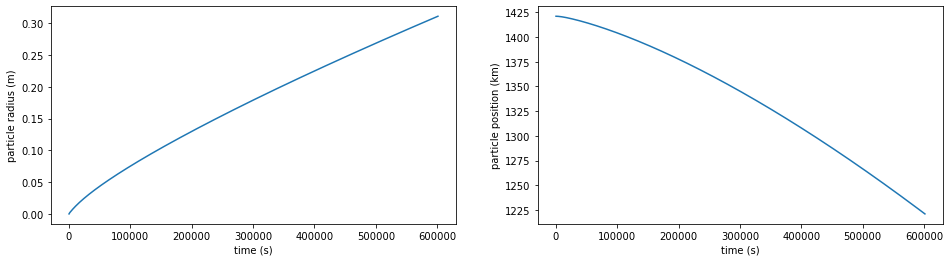

In [3]:
sol = boundary_layer.falling_growing_particle_solution(start_time, max_time, initial_particle_size, initial_particle_position,
                                        xi, rtot, t, p, dl, k0, g, mu, radius_inner_core)

print('Finished because: ', sol.message)
# Interpolate solution (using 5th order polynomial interpolation)
times = np.linspace(sol.sol.ts[0], sol.sol.ts[-1], 500)
rps = sol.sol(times)[0]
lps = sol.sol(times)[1]

# Plot
fig, ax = plt.subplots(ncols=2, figsize=(16,4))
ax[0].plot(times, rps)
ax[0].set_xlabel('time (s)')
ax[0].set_ylabel('particle radius (m)')

ax[1].plot(times, lps/1000)
ax[1].set_xlabel('time (s)')
ax[1].set_ylabel('particle position (km)')

plt.show()

## How does the final particle radius vary with neucleation height

We ultimatly want to integrate the final volumes of the particles hitting the ICB over the volume
of the starting location (i.e. over the F-layer) with an assumed constant nuclation rate and solve
to find the growth rate ... then check the composition is consistent with what we assumed.

In [4]:
starting_radii = np.linspace(radius_inner_core, radius_top_flayer, 10) 
falling_times = np.zeros_like(starting_radii)
final_volumes = np.zeros_like(starting_radii)

for i, initial_particle_position in enumerate(starting_radii):
    sol = boundary_layer.falling_growing_particle_solution(start_time, max_time, initial_particle_size, 
                                                           initial_particle_position,
                                                           xi, rtot, t, p, dl, k0, g, mu, radius_inner_core)
    falling_times[i] = sol.t[-1]
    final_volumes[i] = 4/3 * np.pi * sol.y[0][-1]**3
    

Derivative evaluation at 0.0 s, at z= 1221000.0 ,rp =  1e-10
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -102.1866073690195 intgration error: 1.0903195754527187e-12
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 27.6662314333024 intgration error: 3.5133653906004836e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277430.4081272609
Composition error: 6.999315631528447e-05 intgration error: 4.418044472157974e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277430.3796520638
Composition error: 4.6846526657873255e-11 intgration error: 4.4179667641962766e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277430.3796520447
Composition error: -8.038014698286133e-14 intgration error: 4.417966764144177e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277430.3796520447
Composition error: -7.682743330406083e-14 intgration error: 4.417966764144181e-14
HCP Fe mu: 1277142.2491326

HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -90509059.62633364 intgration error: 1.0048523751636023e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 25304528.532532237 intgration error: 2.8093674622068276e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2798374044
Composition error: 66.1428392554291 intgration error: 7.785126981960228e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494568322
Composition error: 4.6992734152873084e-05 intgration error: 4.4180189365597124e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494568108
Composition error: 3.576941600691441e-07 intgration error: 4.417967161264558e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494568105
Composition error: -1.547787991107441e-07 intgration error: 4.4179665923052795e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494568105
Composition error: -1.54778794669852e-07 intgration error: 4.4179665923052845e-14
HCP Fe mu: 1277142.24913263
Liqu

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497012888
Composition error: 2.716112349832045e-05 intgration error: 4.4179969190489487e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497012669
Composition error: -4.168952738581311e-09 intgration error: 4.417966759515799e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497012669
Composition error: -4.168951850402891e-09 intgration error: 4.4179667595158e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497012778
Composition error: 1.3578477273679113e-05 intgration error: 4.417981839282375e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497012669
Composition error: -4.168949185867632e-09 intgration error: 4.4179667595158026e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497012722
Composition error: 6.641073414304088e-06 intgration error: 4.417974137216879e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497012669
Composition error: -4.1689478536000024e-09 intgration error: 4.4179667595158045e-14
HCP Fe mu: 1277142.2

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002317
Composition error: 2.620236783101859e-07 intgration error: 4.417967055048987e-14
      converged: True
           flag: 'converged'
 function_calls: 14
     iterations: 13
           root: 0.7815058271838176
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Thermodynamic growth rate: 2.048003416854627e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.00022787187031079567 m/s and BL thickness 0.00010527420477425165 m
Gives growth rate 2.048003416854627e-06 m/s, boundary composition 0.7815058271838176 bulk composition 0.9499999926782983 and error -3.067075882157155e-08
Derivative evaluation at 0.0011469478793819587 s, at z= 1243222.2222214288 ,rp =  9.114797080069682e-05
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liqu

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Thermodynamic growth rate: 2.048003416854627e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.00022788000122631136 m/s and BL thickness 0.00010527422631566432 m
Gives growth rate 2.048003416854627e-06 m/s, boundary composition 0.7815058271838137 bulk composition 0.9500000271558977 and error 1.1374867359137397e-07
Derivative evaluation at 0.0018738461931898738 s, at z= 1243222.2222212632 ,rp =  9.11494594909272e-05
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -51693470.12633864 intgration error: 5.73912763390671e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 14452463.213111278 intgration error: 1.6045461839710975e-07
HCP Fe mu: 1277142.24913263


HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002303
Composition error: -1.4561587047268176e-08 intgration error: 4.4179667479776573e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700236
Composition error: 6.9355113758717835e-06 intgration error: 4.417974464108684e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002303
Composition error: -1.4561585715000547e-08 intgration error: 4.4179667479776586e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700233
Composition error: 3.457605336265601e-06 intgration error: 4.417970602857321e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002303
Composition error: -1.4561583494554498e-08 intgration error: 4.417966747977661e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002317
Composition error: 1.7243914354203582e-06 intgration error: 4.4179686786033414e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002303
Composition error: -1.4561582162286868e-08 intgration error: 4.417966747977663e-14
HCP Fe mu: 12771

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002275
Composition error: 8.903153281281107e-08 intgration error: 4.4179668629891243e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002275
Composition error: 8.903152615147292e-08 intgration error: 4.417966862989117e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1248326.5180920607
Composition error: -25846828.8127035 intgration error: 2.8695740043441563e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002273
Composition error: -2.03665004860909e-07 intgration error: 4.417966538030689e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002273
Composition error: -2.036650004200169e-07 intgration error: 4.417966538030694e-14
      converged: True
           flag: 'converged'
 function_calls: 9
     iterations: 8
           root: 0.7815058271837391
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002275
Thermodynamic growth rate: 2.0479891449376453e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002275
Initial guess a

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700217
Composition error: 7.688977721187484e-08 intgration error: 4.417966849509067e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700217
Composition error: 7.68897709946259e-08 intgration error: 4.4179668495090604e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1248326.5180920502
Composition error: -25847305.474158667 intgration error: 2.869626924396404e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002168
Composition error: -2.158121570339233e-07 intgration error: 4.417966524544641e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700217
Composition error: 7.688976921826907e-08 intgration error: 4.4179668495090585e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700217
Composition error: 7.688976655373381e-08 intgration error: 4.417966849509055e-14
      converged: True
           flag: 'converged'
 function_calls: 10
     iterations: 9
           root: 0.781505827183542
HCP Fe mu: 1277142.24913263
Liquid mu: 127714

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497001777
Thermodynamic growth rate: 2.0478093554210375e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497001777
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.00023164588501302564 m/s and BL thickness 0.00010528420581147823 m
Gives growth rate 2.0478093554210375e-06 m/s, boundary composition 0.7815058271828021 bulk composition 0.9500000321856987 and error 1.348174354376397e-07
Derivative evaluation at 0.8287206781496932 s, at z= 1243222.2220293796 ,rp =  9.284266749015388e-05
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -51704397.51830306 intgration error: 5.74034081812251e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 14455518.294146925 intgration error: 1.6048853661018847e-07
HCP Fe mu: 1277142.24913263
L

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496998126
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.000257161013121433 m/s and BL thickness 0.00010535194457509754 m
Gives growth rate 2.046492092455665e-06 m/s, boundary composition 0.7815058271759434 bulk composition 0.9499999851767768 and error -6.209319503014399e-08
Derivative evaluation at 3.7363139333813535 s, at z= 1243222.2212982478 ,rp =  9.879388883878556e-05
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -51744378.19021282 intgration error: 5.744779564371929e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 14466696.09329072 intgration error: 1.6061263510992924e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.280080265
Composition error: 37.81411384256588 intgration error: 4.640006660795776e-13
HCP F

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496986254
Composition error: -5.1782630627883464e-08 intgration error: 4.4179667066539973e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496986254
Composition error: -5.1782627075169785e-08 intgration error: 4.417966706654002e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496986364
Composition error: 1.3594252024518028e-05 intgration error: 4.417981856795867e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496986256
Composition error: 2.417423519140982e-07 intgration error: 4.417967032532192e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496986256
Composition error: 2.4174234880547374e-07 intgration error: 4.417967032532188e-14
      converged: True
           flag: 'converged'
 function_calls: 9
     iterations: 8
           root: 0.7815058271536256
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496986254
Thermodynamic growth rate: 2.0422084523463724e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496986254
Initial

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496774767
Composition error: 1.7130473928261836e-08 intgration error: 4.417966783162913e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249673917
Composition error: -0.00461122881589926 intgration error: 4.41284727174104e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496774767
Composition error: 1.7130471707815786e-08 intgration error: 4.4179667831629104e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249675697
Composition error: -0.002305453383595779 intgration error: 4.4154071967155983e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496774767
Composition error: 1.7130470375548157e-08 intgration error: 4.417966783162909e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496765868
Composition error: -0.0011527181265873487 intgration error: 4.416686989939226e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496774765
Composition error: -2.818091728862271e-07 intgration error: 4.417966451273234e-14
      converged: True
  

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2798958416
Composition error: 56.04076796450041 intgration error: 6.663571767600848e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.24951527
Composition error: 4.0149976023862166e-05 intgration error: 4.4180113395720864e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2495152485
Composition error: 2.0335577133323568e-07 intgration error: 4.417966989914526e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2495152482
Composition error: -2.2233283880623844e-07 intgration error: 4.4179665173052295e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2495152482
Composition error: -2.2233283347716792e-07 intgration error: 4.417966517305235e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2495152485
Composition error: 2.033557682246112e-07 intgration error: 4.417966989914523e-14
      converged: True
           flag: 'converged'
 function_calls: 8
     iterations: 7
           root: 0.7815058237063717
HCP Fe mu: 1277142.24913263
Liquid mu: 

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494612355
Composition error: -4.11710596726067e-07 intgration error: 4.417966307053682e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494612357
Composition error: 9.386130139787952e-08 intgration error: 4.417966868351244e-14
      converged: True
           flag: 'converged'
 function_calls: 13
     iterations: 12
           root: 0.7815058226910014
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494612357
Thermodynamic growth rate: 1.1856658155284805e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494612357
Initial guess at liquid composition: 0.9499999958644317
Gives density contrast of: 443.53737093761447 kg/m^3, falling velocity -0.027331466390366297 m/s and BL thickness 0.00018184042492283775 m
Gives growth rate 1.1856658155284805e-06 m/s, boundary composition 0.7815058226910014 bulk composition 0.9500000220937554 and error 9.386130139787952e-08
Derivative evaluation at 1614.5125936712939 s, at z= 1243195.0938927564 ,rp =  0

HCP Fe mu: 1277142.24913263
Liquid mu: 1248326.5178404667
Composition error: -46425406.370782726 intgration error: 5.154255066245633e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494486335
Composition error: 1.2850570385580795e-08 intgration error: 4.4179667784112654e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249363185
Composition error: -0.19084751158975877 intgration error: 4.2060834625849e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494486335
Composition error: 1.2850568165134746e-08 intgration error: 4.417966778411263e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494059093
Composition error: -0.09542348660068756 intgration error: 4.312025412230172e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494486335
Composition error: 1.2850566388777906e-08 intgration error: 4.417966778411261e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494272713
Composition error: -0.047712004920807516 intgration error: 4.3649957977301566e-14
HCP Fe mu: 1277142.24913263
L

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249427187
Composition error: -6.020590870292608e-08 intgration error: 4.4179666973022804e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249427187
Composition error: -6.020590737065845e-08 intgration error: 4.4179666973022816e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249427198
Composition error: 2.6160820745690927e-05 intgration error: 4.4179958084898014e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249427187
Composition error: -6.020590470612319e-08 intgration error: 4.417966697302285e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494271926
Composition error: 1.3332313388847439e-05 intgration error: 4.417981565985562e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249427187
Composition error: -6.020590292976635e-08 intgration error: 4.417966697302287e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494271898
Composition error: 6.630524214124023e-06 intgration error: 4.417974125504914e-14
HCP Fe mu: 1277142.2491

HCP Fe mu: 1277142.24913263
Liquid mu: 1248326.517744874
Composition error: -66558467.21921565 intgration error: 7.389473837275168e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249353041
Composition error: 1.9100324433196647e-07 intgration error: 4.4179669762004657e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2470438487
Composition error: -7.394165330246135 intgration error: 3.791393408862172e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493530407
Composition error: -5.627229882065876e-07 intgration error: 4.4179661393962486e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493530407
Composition error: -5.627229837656955e-07 intgration error: 4.417966139396254e-14
      converged: True
           flag: 'converged'
 function_calls: 11
     iterations: 10
           root: 0.7815058206570795
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249353041
Thermodynamic growth rate: 7.952805747279967e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249353041
Initial guess at l

HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 41518999.141789 intgration error: 4.6095353224573025e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2797107869
Composition error: 108.52541706698459 intgration error: 1.2490538354895848e-12
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493302142
Composition error: 7.799589693080478e-05 intgration error: 4.418053356984865e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493301923
Composition error: -1.8685500702275704e-07 intgration error: 4.4179665566935354e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493301923
Composition error: -1.8685500302595415e-07 intgration error: 4.41796655669354e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493302033
Composition error: 3.89045209643335e-05 intgration error: 4.418009956839203e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493301926
Composition error: 6.375097196809065e-07 intgration error: 4.4179674719222356e-14
HCP Fe mu: 1277142.24913263
Liq

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492995562
Composition error: -5.526987929549421e-07 intgration error: 4.4179661505253405e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492995562
Composition error: -5.526987862936039e-07 intgration error: 4.417966150525348e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492995562
Composition error: -5.526987845172471e-07 intgration error: 4.41796615052535e-14
      converged: True
           flag: 'converged'
 function_calls: 10
     iterations: 9
           root: 0.7815058196516406
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492995565
Thermodynamic growth rate: 6.022994936127901e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492995565
Initial guess at liquid composition: 0.949982511980774
Gives density contrast of: 443.5982095436575 kg/m^3, falling velocity -0.22271994548512045 m/s and BL thickness 0.0003579287184472672 m
Gives growth rate 6.022994936127901e-07 m/s, boundary composition 0.7815058196516406 bulk composit

HCP Fe mu: 1277142.24913263
Liquid mu: 1248326.5176628255
Composition error: -105620048.37815365 intgration error: 1.1726180518123295e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492709921
Composition error: -7.498144722895006e-07 intgration error: 4.417965931682975e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492709924
Composition error: 4.228034051756424e-07 intgration error: 4.417967233550342e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492709921
Composition error: -7.49814470957233e-07 intgration error: 4.417965931682976e-14
      converged: True
           flag: 'converged'
 function_calls: 10
     iterations: 9
           root: 0.7815058191146721
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492709924
Thermodynamic growth rate: 4.992352198307515e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492709924
Initial guess at liquid composition: 0.9498503724964895
Gives density contrast of: 444.0579770862769 kg/m^3, falling velocity -0.313175297236508 m/s and 

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497012669
Composition error: -4.168869249809859e-09 intgration error: 4.4179667595158916e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497012683
Composition error: 1.731614257760583e-06 intgration error: 4.417968686622285e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497012669
Composition error: -4.1688674734530196e-09 intgration error: 4.4179667595158935e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497012676
Composition error: 8.608583663693992e-07 intgration error: 4.4179677198890454e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497012669
Composition error: -4.16886614118539e-09 intgration error: 4.417966759515895e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497012673
Composition error: 5.744254973905072e-07 intgration error: 4.417967401884679e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497012669
Composition error: -4.168863920739341e-09 intgration error: 4.417966759515897e-14
HCP Fe mu: 1277142.2

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002312
Composition error: -2.851318599006447e-07 intgration error: 4.4179664475843105e-14
      converged: True
           flag: 'converged'
 function_calls: 12
     iterations: 11
           root: 0.7815058271838133
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Thermodynamic growth rate: 2.048003416854627e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.0002278736997611235 m/s and BL thickness 0.0001052742096210525 m
Gives growth rate 2.048003416854627e-06 m/s, boundary composition 0.7815058271838133 bulk composition 0.9500000004357269 and error 1.8234818099926997e-09
Derivative evaluation at 0.0012378101686247268 s, at z= 1265444.4444436303 ,rp =  9.11481568882631e-05
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liqui

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Thermodynamic growth rate: 2.048003416854627e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.00022788101760675057 m/s and BL thickness 0.00010527422900838494 m
Gives growth rate 2.048003416854627e-06 m/s, boundary composition 0.7815058271838133 bulk composition 0.9500000314656682 and error 1.3180139690760484e-07
Derivative evaluation at 0.0036910919777547427 s, at z= 1265444.4444430713 ,rp =  9.11531812177907e-05
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -51693493.92673006 intgration error: 5.739130276280965e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 14452469.86722643 intgration error: 1.6045469227262826e-07
HCP Fe mu: 1277142.24913263


HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -51693589.138072 intgration error: 5.739140846863367e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 14452496.486420292 intgration error: 1.604549878050475e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.280080822
Composition error: 37.776997922259575 intgration error: 4.635885965865354e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700252
Composition error: 2.723266575621608e-05 intgration error: 4.417996998476811e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.24970023
Composition error: 1.7751445202662808e-08 intgration error: 4.4179667838523294e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.24970023
Composition error: 1.775144342630597e-08 intgration error: 4.4179667838523275e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1248326.5180920633
Composition error: -25846709.765907954 intgration error: 2.8695607874948136e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002264
Composition error: 2.6287946397474116e-07 intgration error: 4.4179670559991e-14
      converged: True
           flag: 'converged'
 function_calls: 18
     iterations: 17
           root: 0.7815058271837169
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002261
Thermodynamic growth rate: 2.0479840989739984e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002261
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.00022824705019679848 m/s and BL thickness 0.00010527519877046596 m
Gives growth rate 2.0479840989739984e-06 m/s, boundary composition 0.7815058271837169 bulk composition 0.9499999942520663 and error -2.4078576021935305e-08
Derivative evaluation at 0.08364990649754785 s, at z= 1265444.4444248166 ,rp =  9.13169352697931e-05
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liqui

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497001963
Composition error: 6.9375582318897955e-06 intgration error: 4.41797446638115e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497001907
Composition error: -1.299944862864777e-08 intgration error: 4.417966749711979e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497001935
Composition error: 3.4594096334217284e-06 intgration error: 4.417970604860493e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497001907
Composition error: -1.299944596411251e-08 intgration error: 4.417966749711982e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497001921
Composition error: 1.7260748528258318e-06 intgration error: 4.41796868047231e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497001907
Composition error: -1.299944507593409e-08 intgration error: 4.4179667497119825e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497001914
Composition error: 8.536679443338357e-07 intgration error: 4.4179677119060734e-14
HCP Fe mu: 1277142.24

HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 14456197.110877592 intgration error: 1.6049607298982736e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2800806768
Composition error: 37.786670897509616 intgration error: 4.636959881849277e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497001067
Composition error: 2.7257074538322712e-05 intgration error: 4.417997025576003e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497000846
Composition error: -2.518378012794642e-07 intgration error: 4.417966484548141e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497000848
Composition error: 3.5191749070406786e-08 intgration error: 4.417966803214956e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497000848
Composition error: 3.5191746849960737e-08 intgration error: 4.4179668032149544e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497000848
Composition error: 3.519173796817654e-08 intgration error: 4.417966803214944e-14
HCP Fe mu: 1277142.24913263


HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2800793918
Composition error: 37.872440210994974 intgration error: 4.646482188513051e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496988215
Composition error: 2.7173030646032714e-05 intgration error: 4.4179969322685384e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496987996
Composition error: -1.1064108695890695e-07 intgration error: 4.417966641307984e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496987996
Composition error: -1.1064107852121197e-07 intgration error: 4.4179666413079936e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496988105
Composition error: 1.353119478419984e-05 intgration error: 4.417981786788267e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496987998
Composition error: 1.7703996801898825e-07 intgration error: 4.417966960698116e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496987996
Composition error: -1.106410754125875e-07 intgration error: 4.4179666413079974e-14
HCP Fe mu: 1277142.2

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496928931
Thermodynamic growth rate: 2.0215253804245492e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496928931
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.0007374010197681715 m/s and BL thickness 0.00010665308301920662 m
Gives growth rate 2.0215253804245492e-06 m/s, boundary composition 0.7815058270458659 bulk composition 0.9499999793340497 and error -8.65690643614414e-08
Derivative evaluation at 82.78650556094722 s, at z= 1265444.3738227913 ,rp =  0.00025800074650069815
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -53601196.87995103 intgration error: 5.950927850562097e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 14985825.59684658 intgration error: 1.6637613038602868e-07
HCP Fe mu: 1277142.24913263
Li

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2799951679
Composition error: 44.49100444473911 intgration error: 5.381290428739381e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249614597
Composition error: 3.200449829909857e-05 intgration error: 4.4180022962751695e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496145752
Composition error: -4.7250428014677937e-08 intgration error: 4.417966711685753e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496145752
Composition error: -4.725042535014268e-08 intgration error: 4.417966711685756e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496145861
Composition error: 1.5978623937318304e-05 intgration error: 4.417984503980463e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496145752
Composition error: -4.725042224151821e-08 intgration error: 4.417966711685759e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496145805
Composition error: 7.793329199756727e-06 intgration error: 4.417975416477783e-14
HCP Fe mu: 1277142.2491326

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494992553
Thermodynamic growth rate: 1.3228470818749116e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494992553
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.020781559495956593 m/s and BL thickness 0.0001629832945894656 m
Gives growth rate 1.3228470818749116e-06 m/s, boundary composition 0.781505823405721 bulk composition 0.9500000229077487 and error 9.642570830692421e-08
Derivative evaluation at 978.114623938631 s, at z= 1265436.2413249149 ,rp =  0.0018049781961148026
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -82057210.09759396 intgration error: 9.110179956888598e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 22941559.830077954 intgration error: 2.5470252362134903e-07
HCP Fe mu: 1277142.24913263
Liquid

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494502047
Thermodynamic growth rate: 1.145863887108689e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494502047
Initial guess at liquid composition: 0.9499999958644316
Gives density contrast of: 443.53737093761265 kg/m^3, falling velocity -0.04504263667404101 m/s and BL thickness 0.0001881566331514091 m
Gives growth rate 1.145863887108689e-06 m/s, boundary composition 0.7815058224836359 bulk composition 0.9499999556762533 and error -1.7606760804866894e-07
Derivative evaluation at 2863.7382382037963 s, at z= 1265384.4380196582 ,rp =  0.004710362639552653
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -93887382.72813804 intgration error: 1.042359296086073e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 26249040.349643715 intgration error: 2.914229338845599e-07
HCP Fe mu: 1277142.24913263
Liquid

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249443309
Composition error: -2.406115404696152e-07 intgration error: 4.417966497011794e-14
      converged: True
           flag: 'converged'
 function_calls: 8
     iterations: 7
           root: 0.7815058223540048
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249443309
Thermodynamic growth rate: 1.120982873192844e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249443309
Initial guess at liquid composition: 0.9499999958644317
Gives density contrast of: 443.53737093761447 kg/m^3, falling velocity -0.05473058272626759 m/s and BL thickness 0.0001923328832430734 m
Gives growth rate 1.120982873192844e-06 m/s, boundary composition 0.7815058223540048 bulk composition 0.9499999375589874 and error -2.406115404696152e-07
Derivative evaluation at 4184.099204338122 s, at z= 1265302.3545844764 ,rp =  0.005395369869874184
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2797786512
Composition error: 80.78358004165544 intgration error: 9.410575733803937e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249398079
Composition error: 5.80617559990948e-05 intgration error: 4.418031225642626e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249398057
Composition error: -1.3551129418587493e-07 intgration error: 4.417966613696507e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249398057
Composition error: -1.355112888568044e-07 intgration error: 4.4179666136965133e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249398068
Composition error: 2.8963122355563087e-05 intgration error: 4.4179989196695704e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493980573
Composition error: 4.781250000363002e-07 intgration error: 4.41796729496965e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249398057
Composition error: -1.3551128708044757e-07 intgration error: 4.417966613696515e-14
      converged: True
        

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493419112
Composition error: -1.217787031215778e-07 intgration error: 4.417966628942746e-14
      converged: True
           flag: 'converged'
 function_calls: 10
     iterations: 9
           root: 0.7815058204478582
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493419112
Thermodynamic growth rate: 7.551224479040997e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493419112
Initial guess at liquid composition: 0.9499983057390692
Gives density contrast of: 443.5432521116072 kg/m^3, falling velocity -0.1607850191134595 m/s and BL thickness 0.0002855163995547238 m
Gives growth rate 7.551224479040997e-07 m/s, boundary composition 0.7815058204478582 bulk composition 0.9499983522871747 and error -1.217787031215778e-07
Derivative evaluation at 32281.343959629114 s, at z= 1261861.037710414 ,rp =  0.030628081359818607
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 1387

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249325087
Composition error: 8.08275313790574e-07 intgration error: 4.41796766151013e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493250868
Composition error: -5.486249587960401e-08 intgration error: 4.41796670323466e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249325087
Composition error: 8.082753111260388e-07 intgration error: 4.417967661510127e-14
      converged: True
           flag: 'converged'
 function_calls: 23
     iterations: 22
           root: 0.7815058201315822
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493250868
Thermodynamic growth rate: 6.94417340296738e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493250868
Initial guess at liquid composition: 0.9499960630363664
Gives density contrast of: 443.55105608678423 kg/m^3, falling velocity -0.1802317943868824 m/s and BL thickness 0.00031047189922819656 m
Gives growth rate 6.94417340296738e-07 m/s, boundary composition 0.7815058201315822 bulk composition 0.

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493009767
Composition error: 1.5018721910564636e-07 intgration error: 4.4179669308855747e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2478029958
Composition error: -6.27762413162991 intgration error: 2.554573888773698e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493009765
Composition error: -8.362593892918824e-07 intgration error: 4.417965835709838e-14
      converged: True
           flag: 'converged'
 function_calls: 10
     iterations: 9
           root: 0.7815058196783399
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493009767
Thermodynamic growth rate: 6.074240610498549e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493009767
Initial guess at liquid composition: 0.949984041047724
Gives density contrast of: 443.5928889015486 kg/m^3, falling velocity -0.21970414436980268 m/s and BL thickness 0.0003549120503779503 m
Gives growth rate 6.074240610498549e-07 m/s, boundary composition 0.7815058196783399 bulk composition 

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492709924
Initial guess at liquid composition: 0.9498503724964895
Gives density contrast of: 444.0579770862769 kg/m^3, falling velocity -0.3131753597305536 m/s and BL thickness 0.00043148708034028524 m
Gives growth rate 4.992352198307515e-07 m/s, boundary composition 0.7815058191146722 bulk composition 0.9498527599300112 and error 4.936956305989781e-07
Derivative evaluation at 222602.97780149186 s, at z= 1215117.3786181854 ,rp =  0.14125524024281993
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -210278276.65644825 intgration error: 2.334557799307352e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 58789614.89441763 intgration error: 6.526958848259525e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2796522505
Composition error: 153.66862569448992 intgration error: 1.7502441317267192e-12
HCP Fe m

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497012669
Composition error: -4.168804856874431e-09 intgration error: 4.417966759515963e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497012669
Composition error: -4.168803080517591e-09 intgration error: 4.417966759515965e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497012778
Composition error: 1.357847742156082e-05 intgration error: 4.417981839282539e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497012669
Composition error: -4.168800860071542e-09 intgration error: 4.4179667595159673e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497012722
Composition error: 6.641073563073974e-06 intgration error: 4.417974137217044e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497012669
Composition error: -4.168799083714703e-09 intgration error: 4.417966759515969e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497012697
Composition error: 3.461668800941453e-06 intgration error: 4.4179706073686724e-14
HCP Fe mu: 1277142.24

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002329
Composition error: 1.7082788787980974e-06 intgration error: 4.41796866071481e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002317
Composition error: 2.6202389991070163e-07 intgration error: 4.417967055049233e-14
      converged: True
           flag: 'converged'
 function_calls: 14
     iterations: 13
           root: 0.7815058271838176
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Thermodynamic growth rate: 2.048003416854627e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.00022787187032323458 m/s and BL thickness 0.00010527420477428461 m
Gives growth rate 2.048003416854627e-06 m/s, boundary composition 0.7815058271838176 bulk composition 0.9499999926783511 and error -3.067053588878821e-08
Derivative evaluation at 0.0011469478794128767 s, at z= 1287666.6666658733 ,rp

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2800808235
Composition error: 37.776911058367595 intgration error: 4.635876322036067e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002531
Composition error: 2.7059697750519973e-05 intgration error: 4.417996806443748e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002312
Composition error: -1.5515389062414897e-07 intgration error: 4.417966591888845e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Composition error: 1.3180151414715624e-07 intgration error: 4.417966910473342e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Composition error: 1.3180150881808572e-07 intgration error: 4.417966910473336e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Composition error: 1.3180150615355046e-07 intgration error: 4.417966910473333e-14
      converged: True
           flag: 'converged'
 function_calls: 8
     iterations: 7
           root: 0.7815058271838133
HCP Fe mu: 1277142.24913263
Liquid mu:

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700233
Composition error: 3.457605557866117e-06 intgration error: 4.417970602857567e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002303
Composition error: -1.4561362338127992e-08 intgration error: 4.4179667479779066e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002317
Composition error: 1.724391657020874e-06 intgration error: 4.4179686786035875e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002303
Composition error: -1.4561361449949572e-08 intgration error: 4.417966747977908e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700231
Composition error: 8.520455887506273e-07 intgration error: 4.417967710104897e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002303
Composition error: -1.4561359229503523e-08 intgration error: 4.4179667479779104e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002308
Composition error: 5.650896346409695e-07 intgration error: 4.41796739151979e-14
HCP Fe mu: 1277142.24

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700237
Composition error: 1.3583472698197596e-05 intgration error: 4.41798184482841e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002261
Composition error: -2.407847299323862e-08 intgration error: 4.4179667374117907e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002317
Composition error: 6.926045711175277e-06 intgration error: 4.417974453599684e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002261
Composition error: -2.40784721050602e-08 intgration error: 4.417966737411792e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700229
Composition error: 3.4481140396280807e-06 intgration error: 4.4179705923198645e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002261
Composition error: -2.407847032870336e-08 intgration error: 4.417966737411794e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002275
Composition error: 1.7148873645567164e-06 intgration error: 4.4179686680517026e-14
HCP Fe mu: 1277142.249

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700217
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.00022888826761748303 m/s and BL thickness 0.00010527689771576337 m
Gives growth rate 2.047951341843657e-06 m/s, boundary composition 0.781505827183542 bulk composition 0.9500000183565364 and error 7.688998948651715e-08
Derivative evaluation at 0.10182236434409185 s, at z= 1287666.666642881 ,rp =  9.135415176811094e-05
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -51694780.56039574 intgration error: 5.739273121312954e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 14452829.584359726 intgration error: 1.6045868593506563e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.280080809
Composition error: 37.7778686515029 intgration error: 4.63598263623077e-13
HCP Fe 

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497000997
Composition error: 1.4333102438257583e-07 intgration error: 4.4179669232736696e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497000997
Composition error: 1.433310186094161e-07 intgration error: 4.417966923273663e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497000995
Composition error: -1.494314618710746e-07 intgration error: 4.417966598242017e-14
      converged: True
           flag: 'converged'
 function_calls: 8
     iterations: 7
           root: 0.7815058271813361
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497000997
Thermodynamic growth rate: 2.0475279305376404e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497000997
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.00023710389436036946 m/s and BL thickness 0.00010529867799420069 m
Gives growth rate 2.0475279305376404e-06 m/s, boundary composition 0.7815058271813361 bulk c

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249698937
Composition error: 5.695927063342765e-08 intgration error: 4.41796682738176e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1248326.5180907703
Composition error: -25905731.12851509 intgration error: 2.876113475065933e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249698937
Composition error: 5.695926619253555e-08 intgration error: 4.417966827381755e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2490929456
Composition error: -0.7552452822203457 intgration error: 3.5794760625837144e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249698937
Composition error: 5.695926086346503e-08 intgration error: 4.417966827381749e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493959412
Composition error: -0.3776227591884673 intgration error: 3.9987212822707486e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496989367
Composition error: -2.306520667794132e-07 intgration error: 4.4179665080690314e-14
HCP Fe mu: 1277142.24913263
Liquid

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496928931
Composition error: -8.656876016033266e-08 intgration error: 4.4179666680336355e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496928931
Composition error: -8.656875216672688e-08 intgration error: 4.4179666680336444e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249692904
Composition error: 1.3699083516005572e-05 intgration error: 4.417981973182202e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496928931
Composition error: -8.656874594947794e-08 intgration error: 4.4179666680336513e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496928987
Composition error: 6.948707175435942e-06 intgration error: 4.4179744787589637e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496928934
Composition error: 2.0414511991972972e-07 intgration error: 4.4179669907908785e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496928934
Composition error: 2.0414511547883762e-07 intgration error: 4.417966990790874e-14
      converged: 

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2800547734
Composition error: 39.59409636990305 intgration error: 4.837624419323797e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496742029
Composition error: 2.8370356686124865e-05 intgration error: 4.4179982615674765e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249674181
Composition error: -1.4759738231617803e-07 intgration error: 4.4179666002782544e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249674181
Composition error: -1.4759737121394778e-07 intgration error: 4.4179666002782664e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249674192
Composition error: 1.4114387246078053e-05 intgration error: 4.4179824342619653e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496741812
Composition error: 1.5316146662058827e-07 intgration error: 4.417966934187653e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496741812
Composition error: 1.5316146129151775e-07 intgration error: 4.4179669341876473e-14
HCP Fe mu: 1277142.24

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494992553
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.020781559496249616 m/s and BL thickness 0.00016298329459024487 m
Gives growth rate 1.3228470818749116e-06 m/s, boundary composition 0.781505823405721 bulk composition 0.9500000229085542 and error 9.642908294082986e-08
Derivative evaluation at 978.1146239526603 s, at z= 1287658.4635471369 ,rp =  0.0018049781961405357
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -82057210.09799416 intgration error: 9.11017995693303e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 22941559.83018985 intgration error: 2.547025236225913e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2798707946
Composition error: 59.96633755439168 intgration error: 7.099397541947411e-13
HCP Fe m

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2798307985
Composition error: 67.51867146440709 intgration error: 7.937875041603056e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494502265
Composition error: 4.8465036267764106e-05 intgration error: 4.4180205711434197e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494502047
Composition error: -1.7606389679514223e-07 intgration error: 4.4179665686740745e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494502047
Composition error: -1.7606388968971487e-07 intgration error: 4.417966568674082e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494502156
Composition error: 2.4144486189481285e-05 intgration error: 4.417993569908752e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249450205
Composition error: 3.4706897356073796e-07 intgration error: 4.417967149468232e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494502047
Composition error: -1.760638870251796e-07 intgration error: 4.417966568674085e-14
HCP Fe mu: 1277142.249

HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -94442415.64313348 intgration error: 1.0485213993026023e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 26404216.492156275 intgration error: 2.931457351474595e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2798239028
Composition error: 69.01728440531306 intgration error: 8.104254500802558e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494433308
Composition error: 4.9469624473719165e-05 intgration error: 4.418021686460377e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494433091
Composition error: 2.836531654004659e-07 intgration error: 4.417967079062542e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249443309
Composition error: -2.406057384440885e-07 intgration error: 4.417966497018236e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249443309
Composition error: -2.40605733115018e-07 intgration error: 4.417966497018242e-14
HCP Fe mu: 1277142.24913263
Liquid mu

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494248932
Composition error: 5.2475937422524765e-05 intgration error: 4.418025024138231e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494248715
Composition error: 1.8684111324773767e-07 intgration error: 4.417966971579572e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494248713
Composition error: -3.8163977356120427e-07 intgration error: 4.417966340439002e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494248715
Composition error: 1.8684111147138083e-07 intgration error: 4.41796697157957e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494248715
Composition error: 1.8684110791866715e-07 intgration error: 4.417966971579566e-14
      converged: True
           flag: 'converged'
 function_calls: 8
     iterations: 7
           root: 0.7815058220074016
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494248715
Thermodynamic growth rate: 1.054457604565684e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494248715
Initial gu

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493462695
Composition error: 6.576578974737401e-07 intgration error: 4.4179674942912064e-14
      converged: True
           flag: 'converged'
 function_calls: 6
     iterations: 5
           root: 0.7815058205297851
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493462693
Thermodynamic growth rate: 7.708473026557527e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493462693
Initial guess at liquid composition: 0.9499986233355384
Gives density contrast of: 443.5421469635967 kg/m^3, falling velocity -0.15633067525169564 m/s and BL thickness 0.0002796925345136207 m
Gives growth rate 7.708473026557527e-07 m/s, boundary composition 0.7815058205297851 bulk composition 0.9499986597172484 and error -1.1995104154394198e-07
Derivative evaluation at 32281.344894523576 s, at z= 1284780.2089588994 ,rp =  0.03236180130560112
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493250868
Composition error: -2.8272886698488264e-08 intgration error: 4.4179667327550564e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493250873
Composition error: 1.6810785452570087e-06 intgration error: 4.4179686305163736e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493250868
Composition error: -2.8272884922131425e-08 intgration error: 4.417966732755058e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249325087
Composition error: 8.348649651601647e-07 intgration error: 4.4179676910305735e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493250868
Composition error: -2.8272883145774586e-08 intgration error: 4.41796673275506e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249325087
Composition error: 8.348649602751834e-07 intgration error: 4.417967691030568e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493250868
Composition error: -2.8272881369417746e-08 intgration error: 4.417966732755062e-14
HCP Fe mu: 1277142

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493009765
Composition error: -8.108693352326668e-07 intgration error: 4.41796586389846e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493009765
Composition error: -8.108693343444884e-07 intgration error: 4.417965863898461e-14
      converged: True
           flag: 'converged'
 function_calls: 9
     iterations: 8
           root: 0.78150581967834
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493009767
Thermodynamic growth rate: 6.074240610498549e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493009767
Initial guess at liquid composition: 0.949984041047724
Gives density contrast of: 443.5928889015486 kg/m^3, falling velocity -0.21970415701270676 m/s and BL thickness 0.0003549120631380991 m
Gives growth rate 6.074240610498549e-07 m/s, boundary composition 0.78150581967834 bulk composition 0.9499845063184365 and error 1.7557731002426635e-07
Derivative evaluation at 115382.72943197592 s, at z= 1267412.719553472 ,rp =  0.0846218200

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492709826
Composition error: 2.9345882923692557e-07 intgration error: 4.4179670899490156e-14
      converged: True
           flag: 'converged'
 function_calls: 9
     iterations: 8
           root: 0.7815058191144881
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492709826
Thermodynamic growth rate: 4.991999480452591e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492709826
Initial guess at liquid composition: 0.9498502461488567
Gives density contrast of: 444.05841666969354 kg/m^3, falling velocity -0.3132192954628671 m/s and BL thickness 0.0004315171257898024 m
Gives growth rate 4.991999480452591e-07 m/s, boundary composition 0.7815058191144881 bulk composition 0.9498525875038902 and error 2.9345882923692557e-07
Derivative evaluation at 222674.2710828142 s, at z= 1237317.4813002148 ,rp =  0.1412910154879341
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 13870

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249250614
Composition error: 0.00012682215515891215 intgration error: 4.418107565020957e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492505922
Composition error: -6.839985848827723e-07 intgration error: 4.417966004753289e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492505924
Composition error: 6.604357545292316e-07 intgration error: 4.4179674973752473e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492505924
Composition error: 6.604357496442503e-07 intgration error: 4.4179674973752417e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492505922
Composition error: -6.839985817741479e-07 intgration error: 4.417966004753292e-14
      converged: True
           flag: 'converged'
 function_calls: 8
     iterations: 7
           root: 0.7815058187311797
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492505924
Thermodynamic growth rate: 4.2562881552576926e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492505924
Initial gu

HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 27.6662314333024 intgration error: 3.5133653906004836e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277430.4081272609
Composition error: 6.999315631528447e-05 intgration error: 4.418044472157974e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277430.3796520638
Composition error: 4.6846526657873255e-11 intgration error: 4.4179667641962766e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277430.3796520447
Composition error: -8.038014698286133e-14 intgration error: 4.417966764144177e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277430.3796520447
Composition error: -7.682743330406083e-14 intgration error: 4.417966764144181e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277430.3796520454
Composition error: 1.6431300764452317e-12 intgration error: 4.4179667641460905e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277430.3796520447
Composition error: -7.327471962526033e-14 intgration error: 4.4179667641441846e-14
HCP Fe mu: 1277142.24913

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497012669
Thermodynamic growth rate: 2.0517393117813754e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497012669
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.00015513186535858254 m/s and BL thickness 0.00010508252091856651 m
Gives growth rate 2.0517393117813754e-06 m/s, boundary composition 0.7815058272032817 bulk composition 0.9499999990051087 and error -4.16871692721088e-09
Derivative evaluation at 0.0007721786407755954 s, at z= 1309888.8888920734 ,rp =  0.0009777777866340014
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -67720024.09158796 intgration error: 7.51843255566845e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 18933168.329701934 intgration error: 2.102004382670567e-07
HCP Fe mu: 1277142.24913263

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002534
Composition error: 2.721667034233377e-05 intgration error: 4.417996980718334e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Composition error: 1.8237016341515755e-09 intgration error: 4.4179667661689816e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Composition error: 1.8236994137055262e-09 intgration error: 4.417966766168979e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1248326.5180920647
Composition error: -25846645.50032229 intgration error: 2.869553652581524e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Composition error: 1.8236976373486868e-09 intgration error: 4.417966766168977e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496820416
Composition error: -0.022618307714206587 intgration error: 4.3928553981418965e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Composition error: 1.8236963050810573e-09 intgration error: 4.417966766168976e-14
HCP Fe mu: 1277142.24913

Derivative evaluation at 0.0036910919778403136 s, at z= 1309888.8888875158 ,rp =  9.115318122023474e-05
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -51693493.92674571 intgration error: 5.739130276282702e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 14452469.8672308 intgration error: 1.6045469227267678e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2800808232
Composition error: 37.77692848937987 intgration error: 4.635878257267184e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700253
Composition error: 2.709196957706439e-05 intgration error: 4.417996842272673e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700231
Composition error: -1.2289459672132352e-07 intgration error: 4.417966627703856e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700231
Composition error: -1.228945865072717e-07 intgration error: 4.417966627703

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002305
Composition error: 2.7239468458617466e-07 intgration error: 4.4179670665631173e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002305
Composition error: 2.723946717075876e-07 intgration error: 4.417967066563103e-14
      converged: True
           flag: 'converged'
 function_calls: 20
     iterations: 19
           root: 0.7815058271837956
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002303
Thermodynamic growth rate: 2.0479992202115938e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002303
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.00022795420221581554 m/s and BL thickness 0.00010527442289903354 m
Gives growth rate 2.0479992202115938e-06 m/s, boundary composition 0.7815058271837956 bulk composition 0.9499999965241596 and error -1.456125264809316e-08
Derivative evaluation at 0.009950494124728862 s, at z= 1309888.8888860892 ,

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002266
Composition error: 5.555769040377356e-07 intgration error: 4.417967380958537e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002264
Composition error: 2.628796766934727e-07 intgration error: 4.417967055999336e-14
      converged: True
           flag: 'converged'
 function_calls: 18
     iterations: 17
           root: 0.7815058271837169
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002261
Thermodynamic growth rate: 2.0479840989739984e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002261
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.0002282470502088294 m/s and BL thickness 0.00010527519877049783 m
Gives growth rate 2.0479840989739984e-06 m/s, boundary composition 0.7815058271837169 bulk composition 0.9499999942521173 and error -2.4078361970936157e-08
Derivative evaluation at 0.08364990649938435 s, at z= 1309888.8888692611 ,rp 

HCP Fe mu: 1277142.24913263
Liquid mu: 1248326.5180920502
Composition error: -25847305.475119174 intgration error: 2.8696269245030415e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002168
Composition error: -2.1578592912518957e-07 intgration error: 4.417966524573759e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700217
Composition error: 7.691599712700281e-08 intgration error: 4.4179668495381775e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700217
Composition error: 7.691599535064597e-08 intgration error: 4.417966849538175e-14
      converged: True
           flag: 'converged'
 function_calls: 10
     iterations: 9
           root: 0.781505827183542
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700217
Thermodynamic growth rate: 2.047951341843657e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700217
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.00022888826908146225 m/s a

HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -51706825.50513919 intgration error: 5.740610378811405e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 14456197.110882148 intgration error: 1.6049607298987794e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2800806768
Composition error: 37.78667089752174 intgration error: 4.636959881850623e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497001067
Composition error: 2.7257074761255495e-05 intgration error: 4.41799702557625e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497000846
Composition error: -2.5183757701441323e-07 intgration error: 4.41796648454839e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497000848
Composition error: 3.519197289136855e-08 intgration error: 4.417966803215205e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497000848
Composition error: 3.519196933865487e-08 intgration error: 4.417966803215201e-14
HCP Fe mu: 1277142.24913263
Liquid m

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2490256117
Composition error: -0.8391633675202423 intgration error: 3.4863082721013115e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249698937
Composition error: 5.6959405192458235e-08 intgration error: 4.4179668273819096e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493622743
Composition error: -0.4195816586782928 intgration error: 3.952137545969212e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496989367
Composition error: -2.3065192245042e-07 intgration error: 4.417966508069191e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249698937
Composition error: 5.6959403416101395e-08 intgration error: 4.4179668273819077e-14
      converged: True
           flag: 'converged'
 function_calls: 13
     iterations: 12
           root: 0.7815058271594777
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249698937
Thermodynamic growth rate: 2.0433325031987692e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249698937
Initial guess at

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496928934
Composition error: 2.0414542012403558e-07 intgration error: 4.417966990791212e-14
      converged: True
           flag: 'converged'
 function_calls: 11
     iterations: 10
           root: 0.7815058270458659
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496928931
Thermodynamic growth rate: 2.0215253804245492e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496928931
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.0007374010198024652 m/s and BL thickness 0.0001066530830193008 m
Gives growth rate 2.0215253804245492e-06 m/s, boundary composition 0.7815058270458659 bulk composition 0.9499999793341986 and error -8.656844086019078e-08
Derivative evaluation at 82.78650556276006 s, at z= 1309888.8182672358 ,rp =  0.00025800074650679576
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid

HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -54180084.18214786 intgration error: 6.015197251718304e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 15147670.950657947 intgration error: 1.6817297476832852e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2800547734
Composition error: 39.594096369945284 intgration error: 4.837624419328485e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496742029
Composition error: 2.8370357426865667e-05 intgration error: 4.417998261568299e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249674181
Composition error: -1.47596641575376e-07 intgration error: 4.417966600279077e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249674181
Composition error: -1.4759663180541338e-07 intgration error: 4.4179666002790874e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249674192
Composition error: 1.4114387986374766e-05 intgration error: 4.417982434262787e-14
HCP Fe mu: 1277142.24913263
Liquid

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494992553
Thermodynamic growth rate: 1.3228470818749116e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494992553
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.020781559496531234 m/s and BL thickness 0.00016298329459099386 m
Gives growth rate 1.3228470818749116e-06 m/s, boundary composition 0.7815058234057214 bulk composition 0.9500000229093291 and error 9.643232923295386e-08
Derivative evaluation at 978.1146239661382 s, at z= 1309880.6857693589 ,rp =  0.0018049781961652657
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -82057210.09837882 intgration error: 9.110179956975736e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 22941559.830297388 intgration error: 2.547025236237852e-07
HCP Fe mu: 1277142.24913263
Liqu

HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -92391731.75864652 intgration error: 1.0257542346547448e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 25830886.143432792 intgration error: 2.867804896087676e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2798307985
Composition error: 67.51867146474943 intgration error: 7.937875041641062e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494502265
Composition error: 4.8465039808931465e-05 intgration error: 4.4180205711473513e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494502047
Composition error: -1.7606035473960446e-07 intgration error: 4.417966568678007e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494502047
Composition error: -1.7606034852235553e-07 intgration error: 4.417966568678014e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494502156
Composition error: 2.4144489730648644e-05 intgration error: 4.417993569912683e-14
HCP Fe mu: 1277142.24913263
Li

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249443309
Composition error: -2.406002028720877e-07 intgration error: 4.417966497024381e-14
      converged: True
           flag: 'converged'
 function_calls: 8
     iterations: 7
           root: 0.7815058223540048
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249443309
Thermodynamic growth rate: 1.120982873192844e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249443309
Initial guess at liquid composition: 0.9499999958644317
Gives density contrast of: 443.53737093761447 kg/m^3, falling velocity -0.054730582733154585 m/s and BL thickness 0.00019233288324616295 m
Gives growth rate 1.120982873192844e-06 m/s, boundary composition 0.7815058223540048 bulk composition 0.949999937561694 and error -2.406002028720877e-07
Derivative evaluation at 4184.0992051133035 s, at z= 1309746.7990288748 ,rp =  0.005395369870785327
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 1387

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249427187
Composition error: -6.017241371836235e-08 intgration error: 4.417966697339467e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494271926
Composition error: 1.3332346881167467e-05 intgration error: 4.417981566022746e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249427187
Composition error: -6.017241105382709e-08 intgration error: 4.4179666973394704e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494271898
Composition error: 6.630557705111784e-06 intgration error: 4.4179741255420965e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249427187
Composition error: -6.017240927747025e-08 intgration error: 4.4179666973394723e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494271884
Composition error: 3.290722177418104e-06 intgration error: 4.417970417579795e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249427187
Composition error: -6.017240572475657e-08 intgration error: 4.417966697339477e-14
HCP Fe mu: 1277142.2491

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2797336353
Composition error: 97.28044125446661 intgration error: 1.1242095249054803e-12
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493530626
Composition error: 6.953499857509371e-05 intgration error: 4.418043963500702e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249353041
Composition error: 2.069610771648911e-07 intgration error: 4.4179669939172195e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249353041
Composition error: 2.0696107094764216e-07 intgration error: 4.4179669939172125e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1248326.517744874
Composition error: -66558468.723740056 intgration error: 7.389474004310931e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493530407
Composition error: -5.467651780222127e-07 intgration error: 4.4179661571129766e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249353041
Composition error: 2.0696106961537453e-07 intgration error: 4.417966993917211e-14
HCP Fe mu: 1277142.24913263
Li

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493301923
Composition error: -1.2114276914942934e-07 intgration error: 4.4179666296487746e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493301923
Composition error: -1.2114276559671566e-07 intgration error: 4.4179666296487784e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493302033
Composition error: 3.897023683885337e-05 intgration error: 4.41801002979848e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493301923
Composition error: -1.211427629321804e-07 intgration error: 4.4179666296487815e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249330198
Composition error: 1.9844973082605577e-05 intgration error: 4.4179887964903057e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493301923
Composition error: -1.2114275982355593e-07 intgration error: 4.4179666296487853e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493301951
Composition error: 9.853671514292728e-06 intgration error: 4.417977703917258e-14
HCP Fe mu: 12771

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492995562
Composition error: -4.203214718501158e-07 intgration error: 4.41796629749369e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492995562
Composition error: -4.2032146829740213e-07 intgration error: 4.417966297493694e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492995565
Composition error: 5.744792259676501e-07 intgration error: 4.41796740194433e-14
      converged: True
           flag: 'converged'
 function_calls: 9
     iterations: 8
           root: 0.7815058196516402
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492995562
Thermodynamic growth rate: 6.022986442921763e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492995562
Initial guess at liquid composition: 0.9499825119807739
Gives density contrast of: 443.5982095436575 kg/m^3, falling velocity -0.22272001304998593 m/s and BL thickness 0.0003579287855367082 m
Gives growth rate 6.022986442921763e-07 m/s, boundary composition 0.7815058196516402 bulk compositio

HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -208548505.55222058 intgration error: 2.315353482209391e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 58306005.36368522 intgration error: 6.473267404664797e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2796534535
Composition error: 152.40453084454154 intgration error: 1.7362098596494914e-12
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492728804
Composition error: 0.0001089941083418644 intgration error: 4.418087771912896e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492728587
Composition error: 3.812494173693892e-07 intgration error: 4.417967187416148e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492728587
Composition error: 3.8124940981987265e-07 intgration error: 4.417967187416139e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1248326.517664692
Composition error: -104273910.65309408 intgration error: 1.1576729208046798e-06
HCP Fe mu: 1277142.24913263
Liquid mu

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249261329
Composition error: 7.531639743429963e-06 intgration error: 4.4179751259441226e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492613276
Composition error: -4.182878798886236e-08 intgration error: 4.4179667177049825e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492613283
Composition error: 3.744905476832372e-06 intgration error: 4.4179709218245516e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492613276
Composition error: -4.182878665659473e-08 intgration error: 4.4179667177049844e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492613278
Composition error: 1.2120567416396e-06 intgration error: 4.417968109797568e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492613276
Composition error: -4.182878399205947e-08 intgration error: 4.417966717704987e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492613278
Composition error: 1.212056726984656e-06 intgration error: 4.4179681097975516e-14
HCP Fe mu: 1277142.249

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249247148
Initial guess at liquid composition: 0.9485207286451001
Gives density contrast of: 448.68064730881633 kg/m^3, falling velocity -0.4636857644149748 m/s and BL thickness 0.0005172432540299776 m
Gives growth rate 4.132004904899844e-07 m/s, boundary composition 0.7815058186664277 bulk composition 0.9485332797001805 and error 7.645412125611983e-08
Derivative evaluation at 576799.0915194876 s, at z= 1121208.9142119384 ,rp =  0.3008037670665999
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -246024781.82137945 intgration error: 2.731423732416598e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 68783625.42206948 intgration error: 7.636516907874055e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2796282773
Composition error: 179.79170665501658 intgration error: 2.0402685912919564e-12
HCP Fe mu: 

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497012669
Composition error: -4.168649869740193e-09 intgration error: 4.417966759516135e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249701267
Composition error: 2.8226419512833445e-07 intgration error: 4.417967077520475e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497012669
Composition error: -4.168648093383354e-09 intgration error: 4.417966759516137e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249701267
Composition error: 2.822641924637992e-07 intgration error: 4.4179670775204717e-14
      converged: True
           flag: 'converged'
 function_calls: 23
     iterations: 22
           root: 0.7815058272032817
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497012669
Thermodynamic growth rate: 2.0517393117813754e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497012669
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.0001551318653624885

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Composition error: -3.0670334716376146e-08 intgration error: 4.4179667300933545e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700237
Composition error: 6.9193882272777785e-06 intgration error: 4.4179744462083924e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Composition error: -3.067033338410852e-08 intgration error: 4.417966730093356e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002343
Composition error: 3.447228500874644e-06 intgration error: 4.417970591336719e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Composition error: -3.067033071957326e-08 intgration error: 4.417966730093359e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002329
Composition error: 1.70827908529958e-06 intgration error: 4.4179686607150393e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002317
Composition error: 2.62024105968095e-07 intgration error: 4.4179670550494614e-14
      converged: True

Gives growth rate 2.048003416854627e-06 m/s, boundary composition 0.7815058271838133 bulk composition 0.9500000314657433 and error 1.3180171132276541e-07
Derivative evaluation at 0.0018738461932815103 s, at z= 1332111.111110152 ,rp =  9.114945949581948e-05
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -51693470.12636991 intgration error: 5.739127633910182e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 14452463.213120015 intgration error: 1.6045461839720676e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2800808235
Composition error: 37.77691105837883 intgration error: 4.635876322037314e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002531
Composition error: 2.7059697955689188e-05 intgration error: 4.4179968064439757e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002312
Composition error: -1.5515368589902323e-07 intgration e

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002303
Composition error: -1.45611598334483e-08 intgration error: 4.417966747978132e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700236
Composition error: 6.935511802641514e-06 intgration error: 4.417974464109157e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002303
Composition error: -1.4561157613002251e-08 intgration error: 4.4179667479781344e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700233
Composition error: 3.4576057625912426e-06 intgration error: 4.417970602857794e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002303
Composition error: -1.4561156724823832e-08 intgration error: 4.417966747978135e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002317
Composition error: 1.7243918630782673e-06 intgration error: 4.4179686786038166e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002303
Composition error: -1.4561154948466992e-08 intgration error: 4.417966747978137e-14
HCP Fe mu: 1277142.

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002317
Composition error: 6.92604591767676e-06 intgration error: 4.4179744535999137e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002261
Composition error: -2.407826427130999e-08 intgration error: 4.417966737412023e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700229
Composition error: 3.448114245685474e-06 intgration error: 4.417970592320093e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002261
Composition error: -2.407826338313157e-08 intgration error: 4.4179667374120235e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002275
Composition error: 1.7148875728345558e-06 intgration error: 4.417968668051934e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002261
Composition error: -2.407826205086394e-08 intgration error: 4.4179667374120254e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002268
Composition error: 8.42535075040729e-07 intgration error: 4.4179676995461054e-14
HCP Fe mu: 1277142.249

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497001935
Composition error: 3.4594099513896026e-06 intgration error: 4.417970604860846e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497001907
Composition error: -1.2999127996238258e-08 intgration error: 4.417966749712335e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497001921
Composition error: 1.7260751721259737e-06 intgration error: 4.4179686804726647e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497001907
Composition error: -1.2999126219881418e-08 intgration error: 4.4179667497123366e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497001914
Composition error: 8.536682631898884e-07 intgration error: 4.4179677119064274e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497001907
Composition error: -1.2999124443524579e-08 intgration error: 4.417966749712339e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497001912
Composition error: 5.666922975322564e-07 intgration error: 4.417967393299103e-14
HCP Fe mu: 12771

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497001067
Composition error: 2.7257074866504638e-05 intgration error: 4.4179970255763675e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497000846
Composition error: -2.518374717652705e-07 intgration error: 4.417966484548507e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497000848
Composition error: 3.5192077696422075e-08 intgration error: 4.417966803215322e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497000848
Composition error: 3.5192075475976026e-08 intgration error: 4.417966803215319e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497000848
Composition error: 3.519206703828104e-08 intgration error: 4.41796680321531e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497000848
Composition error: 3.519206259738894e-08 intgration error: 4.4179668032153047e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497000848
Composition error: 3.519205993285368e-08 intgration error: 4.4179668032153015e-14
      converged: True

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496987996
Thermodynamic growth rate: 2.0428368496805405e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496987996
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.00032778442739244985 m/s and BL thickness 0.00010554044329631615 m
Gives growth rate 2.0428368496805405e-06 m/s, boundary composition 0.7815058271568995 bulk composition 0.9499999735870044 and error -1.1064063620835896e-07
Derivative evaluation at 10.09667417964321 s, at z= 1332111.1082618516 ,rp =  0.00011179534471844045
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -51840142.05581838 intgration error: 5.75541148922417e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 14493469.76176204 intgration error: 1.6090988254183467e-07
HCP Fe mu: 1277142.24913263


HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496774767
Composition error: 1.713321173824056e-08 intgration error: 4.417966783165952e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2495407662
Composition error: -0.1770927954653314 intgration error: 4.2213542651234216e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496774767
Composition error: 1.713321085006214e-08 intgration error: 4.4179667831659516e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496091214
Composition error: -0.08854653878147323 intgration error: 4.31966035803821e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496774767
Composition error: 1.7133209517794512e-08 intgration error: 4.41796678316595e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249643299
Composition error: -0.04427326384992769 intgration error: 4.3688135672427726e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496774767
Composition error: 1.7133207741437673e-08 intgration error: 4.417966783165948e-14
HCP Fe mu: 1277142.24913263
L

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496145756
Composition error: 6.354266104402484e-07 intgration error: 4.4179674696095195e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496145754
Composition error: 2.9747058682971783e-07 intgration error: 4.417967094402961e-14
      converged: True
           flag: 'converged'
 function_calls: 18
     iterations: 17
           root: 0.7815058255735895
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496145752
Thermodynamic growth rate: 1.7389408413226448e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496145752
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.006803197494048939 m/s and BL thickness 0.0001239846252409079 m
Gives growth rate 1.7389408413226448e-06 m/s, boundary composition 0.7815058255735895 bulk composition 0.9499999887227293 and error -4.724453139814955e-08
Derivative evaluation at 364.1056615804593 s, at z= 1332109.5294218713 ,rp =  

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494998018
Composition error: 8.37791147567657e-08 intgration error: 4.4179668571577686e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249066517
Composition error: -0.8328707686673362 intgration error: 3.4932944602325375e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494998015
Composition error: -3.686897964705338e-07 intgration error: 4.417966354816365e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494998015
Composition error: -3.6868979425008774e-07 intgration error: 4.4179663548163677e-14
      converged: True
           flag: 'converged'
 function_calls: 13
     iterations: 12
           root: 0.7815058234159936
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494998018
Thermodynamic growth rate: 1.3248187880066098e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494998018
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.020690380939236176 

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494436235
Composition error: 4.982910251172257e-05 intgration error: 4.4180220855611714e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494436014
Composition error: -3.6861290597656193e-07 intgration error: 4.4179663549017306e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494436016
Composition error: 1.551528998611218e-07 intgration error: 4.417966936398588e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494436016
Composition error: 1.551528958643189e-07 intgration error: 4.4179669363985834e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494436016
Composition error: 1.5515289009115918e-07 intgration error: 4.417966936398577e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494436014
Composition error: -3.6861290286793746e-07 intgration error: 4.4179663549017344e-14
      converged: True
           flag: 'converged'
 function_calls: 9
     iterations: 8
           root: 0.7815058223595026
HCP Fe mu: 1277142.24913263
Liqu

HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -99611483.0467484 intgration error: 1.10590957577596e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 27849384.73066882 intgration error: 3.091903256759955e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2798077809
Composition error: 72.79477158020687 intgration error: 8.523639824481892e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249427209
Composition error: 5.2381890982999835e-05 intgration error: 4.4180249197257087e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249427187
Composition error: -6.016232845240665e-08 intgration error: 4.417966697350664e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249427187
Composition error: -6.01623257878714e-08 intgration error: 4.417966697350667e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249427198
Composition error: 2.616086432860598e-05 intgration error: 4.4179958085381876e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 12

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493530407
Composition error: -5.419707784781735e-07 intgration error: 4.417966162435829e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249353041
Composition error: 2.1175547315621657e-07 intgration error: 4.417966999240068e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249353041
Composition error: 2.1175547137985973e-07 intgration error: 4.417966999240066e-14
      converged: True
           flag: 'converged'
 function_calls: 10
     iterations: 9
           root: 0.7815058206570794
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249353041
Thermodynamic growth rate: 7.952805747279967e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249353041
Initial guess at liquid composition: 0.9499989979934735
Gives density contrast of: 443.5408432569402 kg/m^3, falling velocity -0.14971635920801465 m/s and BL thickness 0.00027110029383355447 m
Gives growth rate 7.952805747279967e-07 m/s, boundary composition 0.7815058206570794 bulk compositio

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493301951
Composition error: 9.873414179129014e-06 intgration error: 4.41797772583602e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493301923
Composition error: -1.0140037076666886e-07 intgration error: 4.41796665156724e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493301937
Composition error: 4.894250552833768e-06 intgration error: 4.417972197853918e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493301923
Composition error: -1.014003681021336e-07 intgration error: 4.4179666515672427e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249330193
Composition error: 2.388181443713222e-06 intgration error: 4.417969415558292e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493301926
Composition error: 7.229644527484425e-07 intgration error: 4.4179675667960477e-14
      converged: True
           flag: 'converged'
 function_calls: 16
     iterations: 15
           root: 0.7815058202275592
HCP Fe mu: 1277142.24913263
Liquid mu

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493009767
Initial guess at liquid composition: 0.949984041047724
Gives density contrast of: 443.5928889015486 kg/m^3, falling velocity -0.2197041969952492 m/s and BL thickness 0.0003549121034914164 m
Gives growth rate 6.074240610498549e-07 m/s, boundary composition 0.78150581967834 bulk composition 0.9499845254743756 and error 2.558721647893947e-07
Derivative evaluation at 115382.79656960529 s, at z= 1311857.1480516922 ,rp =  0.08462186375822962
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -184632855.2321981 intgration error: 2.0498364256873894e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 51619666.11544443 intgration error: 5.730934626279618e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2796720169
Composition error: 134.92728514554722 intgration error: 1.5421734538289466e-12
HCP Fe mu: 1

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492709826
Initial guess at liquid composition: 0.9498502461488568
Gives density contrast of: 444.05841666969354 kg/m^3, falling velocity -0.3132194054259639 m/s and BL thickness 0.0004315172015359773 m
Gives growth rate 4.991999480452591e-07 m/s, boundary composition 0.7815058191144879 bulk composition 0.9498526170545682 and error 4.1817542806299457e-07
Derivative evaluation at 222674.44191664498 s, at z= 1281761.8713911069 ,rp =  0.14129111397771893
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -210291151.2202544 intgration error: 2.3347007356792477e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 58793214.36590011 intgration error: 6.527358469871158e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2796522416
Composition error: 153.67803452255237 intgration error: 1.7503485907022158e-12
HCP Fe 

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492487726
Composition error: -1.014517603259435e-06 intgration error: 4.417965637803464e-14
      converged: True
           flag: 'converged'
 function_calls: 11
     iterations: 10
           root: 0.781505818696974
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492487729
Thermodynamic growth rate: 4.190634839140728e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492487729
Initial guess at liquid composition: 0.9487511159202284
Gives density contrast of: 447.88016031546977 kg/m^3, falling velocity -0.4502072671893092 m/s and BL thickness 0.0005107058105123524 m
Gives growth rate 4.190634839140728e-07 m/s, boundary composition 0.781505818696974 bulk composition 0.9487622530806886 and error 3.4354573053008153e-07
Derivative evaluation at 576801.2071216006 s, at z= 1148916.3879705486 ,rp =  0.3062949389810429
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.252120289
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -2.7886516039864715e-06 m/s and BL thickness 2.0000201985232683e-05 m
Gives growth rate 1.0779984754849536e-05 m/s, boundary composition 0.781505872677773 bulk composition 0.950000002192721 and error 9.184843108300811e-09
Derivative evaluation at 0.00019304466019873513 s, at z= 1354333.3333333333 ,rp =  0.0002000001198523268
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -52769099.52876336 intgration error: 5.858546486760282e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 14753187.75922706 intgration error: 1.637933315487867e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2800692536
Composition error: 38.562966936615865 intgration error: 4.723146055503385e-13
H

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494568108
Composition error: 3.576975897701118e-07 intgration error: 4.417967161268367e-14
      converged: True
           flag: 'converged'
 function_calls: 9
     iterations: 8
           root: 0.7815058226078178
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494568105
Thermodynamic growth rate: 1.1696990043219557e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494568105
Initial guess at liquid composition: 0.9499999958644317
Gives density contrast of: 443.53737093761447 kg/m^3, falling velocity -0.03519833122104573 m/s and BL thickness 0.00018432254655993352 m
Gives growth rate 1.1696990043219557e-06 m/s, boundary composition 0.7815058226078178 bulk composition 0.9499999621863877 and error -1.5477535786345697e-07
Derivative evaluation at 0.0009652233009936756 s, at z= 1354333.333348868 ,rp =  0.0028462725525958436
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid 

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2800808235
Composition error: 37.776909286627394 intgration error: 4.635876125333389e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002531
Composition error: 2.702720214431409e-05 intgration error: 4.417996770366378e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Composition error: 9.930713940065061e-08 intgration error: 4.417966874397339e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002312
Composition error: -1.8764824938344304e-07 intgration error: 4.417966555812859e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Composition error: 9.930713673611535e-08 intgration error: 4.417966874397336e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Composition error: 9.930713362749088e-08 intgration error: 4.417966874397333e-14
      converged: True
           flag: 'converged'
 function_calls: 8
     iterations: 7
           root: 0.7815058271838133
HCP Fe mu: 1277142.24913263
Liquid mu: 127

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700231
Composition error: 3.958709449136677e-08 intgration error: 4.41796680809477e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493241879
Composition error: -0.46759298166358443 intgration error: 3.898834269748226e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700231
Composition error: 3.958709093865309e-08 intgration error: 4.417966808094766e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2495122096
Composition error: -0.23379632861785637 intgration error: 4.1584006970398925e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700231
Composition error: 3.958708916229625e-08 intgration error: 4.417966808094764e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496062203
Composition error: -0.11689814191017955 intgration error: 4.288183755459686e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700231
Composition error: 3.958708605367178e-08 intgration error: 4.41796680809476e-14
HCP Fe mu: 1277142.24913263
Liquid 

HCP Fe mu: 1277142.24913263
Liquid mu: 1248326.5180920633
Composition error: -25846709.76592308 intgration error: 2.869560787496493e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002298
Composition error: -2.6920420070908335e-07 intgration error: 4.417966465267565e-14
      converged: True
           flag: 'converged'
 function_calls: 8
     iterations: 7
           root: 0.7815058271837869
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.24970023
Thermodynamic growth rate: 2.04799837089098e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.24970023
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.0002279725002385082 m/s and BL thickness 0.00010527447137694191 m
Gives growth rate 2.04799837089098e-06 m/s, boundary composition 0.7815058271837869 bulk composition 0.9500000042383461 and error 1.775185642927113e-08
Derivative evaluation at 0.010960075116391178 s, at z= 1354333.3333303032 ,rp =  9.1168068

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496958275
Composition error: -0.005461511308534117 intgration error: 4.411903268540281e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002196
Composition error: 5.504205979889321e-10 intgration error: 4.417966764755356e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496980235
Composition error: -0.0027307525095872087 intgration error: 4.4149350198335696e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002194
Composition error: -2.8641092564285486e-07 intgration error: 4.417966446164262e-14
      converged: True
           flag: 'converged'
 function_calls: 12
     iterations: 11
           root: 0.7815058271835902
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002196
Thermodynamic growth rate: 2.0479605677969914e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002196
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.00022870497722294

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497001921
Composition error: 1.7260752711578675e-06 intgration error: 4.4179686804727745e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497001907
Composition error: -1.2999027632076832e-08 intgration error: 4.4179667497124464e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497001914
Composition error: 8.53668361777693e-07 intgration error: 4.4179677119065366e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497001907
Composition error: -1.2999025855719992e-08 intgration error: 4.417966749712448e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497001912
Composition error: 5.666923965641502e-07 intgration error: 4.4179673932992125e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497001907
Composition error: -1.2999024523452363e-08 intgration error: 4.4179667497124495e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700191
Composition error: 2.7971644600555123e-07 intgration error: 4.417967074691905e-14
HCP Fe mu: 12771

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497000846
Composition error: -2.521990136727936e-07 intgration error: 4.417966484147115e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497000848
Composition error: 3.483053667707736e-08 intgration error: 4.4179668028139303e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497000848
Composition error: 3.48305340125421e-08 intgration error: 4.417966802813927e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497000848
Composition error: 3.4830526018936325e-08 intgration error: 4.4179668028139183e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497000848
Composition error: 3.483052068986581e-08 intgration error: 4.4179668028139127e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497000848
Composition error: 3.483051891350897e-08 intgration error: 4.417966802813911e-14
      converged: True
           flag: 'converged'
 function_calls: 10
     iterations: 9
           root: 0.7815058271810558
HCP Fe mu: 1277142.24913263
Liquid m

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496987996
Composition error: -1.106405118633802e-07 intgration error: 4.417966641308623e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496987996
Composition error: -1.1064050386977442e-07 intgration error: 4.4179666413086317e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496988105
Composition error: 1.35311953579631e-05 intgration error: 4.417981786788904e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496987998
Composition error: 1.77040543114515e-07 intgration error: 4.417966960698754e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496987996
Composition error: -1.1064050031706074e-07 intgration error: 4.4179666413086355e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496987998
Composition error: 1.7704054089406895e-07 intgration error: 4.417966960698751e-14
      converged: True
           flag: 'converged'
 function_calls: 10
     iterations: 9
           root: 0.7815058271568994
HCP Fe mu: 1277142.24913263
Liquid

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496800297
Thermodynamic growth rate: 1.9751119240130066e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496800297
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.001637715875444912 m/s and BL thickness 0.00010915933245165467 m
Gives growth rate 1.9751119240130066e-06 m/s, boundary composition 0.7815058268040497 bulk composition 0.9499999672539817 and error -1.3717269542468102e-07
Derivative evaluation at 90.86315349608822 s, at z= 1354333.247653887 ,rp =  0.000273839536644474
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -53852367.66534387 intgration error: 5.978813409467729e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 15056047.94319054 intgration error: 1.6715575504357132e-07
HCP Fe mu: 1277142.24913263
Liqu

HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -60880953.532207705 intgration error: 6.759143195462449e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 17021100.488131925 intgration error: 1.8897222084349318e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2799951679
Composition error: 44.49100444523192 intgration error: 5.381290428794094e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249614597
Composition error: 3.200450599560867e-05 intgration error: 4.4180022962837144e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496145752
Composition error: -4.7242730616403605e-08 intgration error: 4.4179667116942985e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496145752
Composition error: -4.7242728840046766e-08 intgration error: 4.4179667116943004e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496145861
Composition error: 1.597863163338431e-05 intgration error: 4.417984503989008e-14
HCP Fe mu: 1277142.24913263
Li

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249490201
Thermodynamic growth rate: 1.2901775481299893e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249490201
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.022342590706419935 m/s and BL thickness 0.00016711027158721872 m
Gives growth rate 1.2901775481299893e-06 m/s, boundary composition 0.7815058232355154 bulk composition 0.9499999795786843 and error -8.492177494545672e-08
Derivative evaluation at 978.1146239915588 s, at z= 1354322.5421002624 ,rp =  0.0016692809314188366
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -79911604.9416469 intgration error: 8.871969932299911e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 22341691.385415364 intgration error: 2.4804264603124414e-07
HCP Fe mu: 1277142.24913263
Liqui

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494502265
Composition error: 4.8465046402323964e-05 intgration error: 4.418020571154672e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494502047
Composition error: -1.7605376267937345e-07 intgration error: 4.4179665686853255e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494502047
Composition error: -1.760537555739461e-07 intgration error: 4.417966568685333e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494502156
Composition error: 2.4144496324041143e-05 intgration error: 4.417993569920003e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249450205
Composition error: 3.4707910767650674e-07 intgration error: 4.4179671494794824e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494502047
Composition error: -1.7605375335350004e-07 intgration error: 4.4179665686853356e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249450205
Composition error: 3.470791050119715e-07 intgration error: 4.41796714947948e-14
      converged: Tr

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2798214217
Composition error: 69.5728812574915 intgration error: 8.165938142572335e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494408498
Composition error: 4.986788712457724e-05 intgration error: 4.418022128620741e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249440828
Composition error: 2.8596324908036763e-07 intgration error: 4.4179670816272494e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494408279
Composition error: -2.5308558182501883e-07 intgration error: 4.417966483162826e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494408279
Composition error: -2.530855764959483e-07 intgration error: 4.417966483162832e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249440828
Composition error: 2.859632468599216e-07 intgration error: 4.417967081627247e-14
      converged: True
           flag: 'converged'
 function_calls: 8
     iterations: 7
           root: 0.7815058223073642
HCP Fe mu: 1277142.24913263
Liquid mu: 1277

HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 28070048.9597495 intgration error: 3.116401907543609e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2798054654
Composition error: 73.37156020823404 intgration error: 8.587676225999663e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494248932
Composition error: 5.247596985968883e-05 intgration error: 4.418025024174244e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494248715
Composition error: 1.8687354730317907e-07 intgration error: 4.417966971615581e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494248713
Composition error: -3.8160733950576287e-07 intgration error: 4.4179663404750115e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494248715
Composition error: 1.8687354552682223e-07 intgration error: 4.417966971615579e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494248715
Composition error: 1.8687354286228697e-07 intgration error: 4.4179669716155764e-14
      converged: True
        

HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 38558971.98748181 intgration error: 4.28090629243455e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2797259619
Composition error: 100.788280534475 intgration error: 1.1631543642589788e-12
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249345389
Composition error: 7.189011353059271e-05 intgration error: 4.418046578203551e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493453673
Composition error: 4.686217813798521e-08 intgration error: 4.417966816171735e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493453673
Composition error: 4.686217547344995e-08 intgration error: 4.417966816171732e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1248326.5177372005
Composition error: -68958502.76338345 intgration error: 7.655931309388625e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493453673
Composition error: 4.686217458527153e-08 intgration error: 4.417966816171731e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 12

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2796861788
Composition error: 123.93808911038114 intgration error: 1.4201688692253378e-12
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493056057
Composition error: 8.857381708748946e-05 intgration error: 4.4180651008353757e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493055838
Composition error: -7.123706242673222e-07 intgration error: 4.417965973253997e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249305584
Composition error: 2.2906956109736143e-07 intgration error: 4.417967018462567e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249305584
Composition error: 2.2906955710055854e-07 intgration error: 4.417967018462563e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249305584
Composition error: 2.290695504392204e-07 intgration error: 4.417967018462556e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249305584
Composition error: 2.2906954777468513e-07 intgration error: 4.417967018462553e-14
      converged: True
      

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492880402
Composition error: -8.51958721348467e-08 intgration error: 4.417966669557848e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249288041
Composition error: 3.097659163397992e-06 intgration error: 4.4179702032367926e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492880402
Composition error: -8.519587035848986e-08 intgration error: 4.41796666955785e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492880407
Composition error: 2.0297275300507067e-06 intgration error: 4.417969017594504e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492880402
Composition error: -8.51958681380438e-08 intgration error: 4.4179666695578524e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492880404
Composition error: 9.82735748777941e-07 intgration error: 4.417967855200122e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492880402
Composition error: -8.519586724986539e-08 intgration error: 4.417966669557853e-14
HCP Fe mu: 1277142.249132

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492716466
Thermodynamic growth rate: 5.015958814968968e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492716466
Initial guess at liquid composition: 0.9498585698957549
Gives density contrast of: 444.02945690624074 kg/m^3, falling velocity -0.31024906678796066 m/s and BL thickness 0.00042947685528628465 m
Gives growth rate 5.015958814968968e-07 m/s, boundary composition 0.7815058191269709 bulk composition 0.9498607894499319 and error 1.8305246785033091e-07
Derivative evaluation at 293500.260585856 s, at z= 1282010.4488398468 ,rp =  0.1768170588583829
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -221648972.9549375 intgration error: 2.460797887925398e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 61968634.9910128 intgration error: 6.87990097895813e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 12

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492487724
Initial guess at liquid composition: 0.9487510590970557
Gives density contrast of: 447.88035777409095 kg/m^3, falling velocity -0.4502108920114323 m/s and BL thickness 0.0005107075976483077 m
Gives growth rate 4.1906181857953584e-07 m/s, boundary composition 0.7815058186969654 bulk composition 0.9487621736987706 and error 2.5378849644042134e-07
Derivative evaluation at 576803.2185633739 s, at z= 1171138.1244078758 ,rp =  0.3062991346362177
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -246668961.45091176 intgration error: 2.7385755631249042e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 68963725.21125805 intgration error: 7.656512001142786e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2796277425
Composition error: 180.26246457198624 intgration error: 2.045495054076399e-12
HCP Fe m

HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 14753187.759235736 intgration error: 1.6379333154888301e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2800692536
Composition error: 38.56296693663893 intgration error: 4.723146055505944e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496886833
Composition error: 2.761776915205516e-05 intgration error: 4.417997426027468e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496886617
Composition error: 1.2956158323973455e-07 intgration error: 4.417966907986519e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496886614
Composition error: -1.633647421783735e-07 intgration error: 4.4179665827729677e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496886617
Composition error: 1.2956157879884245e-07 intgration error: 4.417966907986514e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496886614
Composition error: -1.6336473951383823e-07 intgration error: 4.417966582772971e-14
      converged: True
      

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2798381045
Composition error: 66.00028629805959 intgration error: 7.769300424410227e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494575325
Composition error: 4.724022366664471e-05 intgration error: 4.4180192113282696e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249457511
Composition error: 1.943242864399508e-07 intgration error: 4.417966979887563e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494575107
Composition error: -3.070173382191399e-07 intgration error: 4.4179664232865483e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494575107
Composition error: -3.0701733244598017e-07 intgration error: 4.4179664232865546e-14
      converged: True
           flag: 'converged'
 function_calls: 7
     iterations: 6
           root: 0.7815058226209798
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249457511
Thermodynamic growth rate: 1.1722259996016504e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249457511
Initial guess a

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Composition error: 9.930722866258179e-08 intgration error: 4.417966874397438e-14
      converged: True
           flag: 'converged'
 function_calls: 8
     iterations: 7
           root: 0.7815058271838133
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Thermodynamic growth rate: 2.048003416854627e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.00022787918816347862 m/s and BL thickness 0.00010527422416159812 m
Gives growth rate 2.048003416854627e-06 m/s, boundary composition 0.7815058271838133 bulk composition 0.950000023708257 and error 9.930722866258179e-08
Derivative evaluation at 0.0017728880941764783 s, at z= 1376555.5555546195 ,rp =  9.114925273549665e-05
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid m

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700231
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.00022790846053176214 m/s and BL thickness 0.00010527430171370691 m
Gives growth rate 2.0480017348667445e-06 m/s, boundary composition 0.7815058271838047 bulk composition 0.9500000094511449 and error 3.95871770919598e-08
Derivative evaluation at 0.009142829331864565 s, at z= 1376555.5555529397 ,rp =  9.116434640305042e-05
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -51693565.33371187 intgration error: 5.739138204048496e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 14452489.831195563 intgration error: 1.6045491391721023e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2800808223
Composition error: 37.77698048829363 intgration error: 4.635884030306315e-13
H

HCP Fe mu: 1277142.24913263
Liquid mu: 1248326.5180920607
Composition error: -25846828.812726244 intgration error: 2.869574004346681e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002273
Composition error: -2.03664382691926e-07 intgration error: 4.41796653803138e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002273
Composition error: -2.036643782510339e-07 intgration error: 4.417966538031385e-14
      converged: True
           flag: 'converged'
 function_calls: 9
     iterations: 8
           root: 0.7815058271837391
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002275
Thermodynamic growth rate: 2.0479891449376453e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002275
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.00022815551669025353 m/s and BL thickness 0.00010527495625839716 m
Gives growth rate 2.0479891449376453e-06 m/s, boundary composition 0.7815058271837391 bulk compos

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496956259
Composition error: -0.005710800015027218 intgration error: 4.411626502478553e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002182
Composition error: -2.858108425485284e-07 intgration error: 4.417966446830488e-14
      converged: True
           flag: 'converged'
 function_calls: 12
     iterations: 11
           root: 0.7815058271835682
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002184
Thermodynamic growth rate: 2.0479563711539583e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002184
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.00022878643050238307 m/s and BL thickness 0.00010527662788249902 m
Gives growth rate 2.0479563711539583e-06 m/s, boundary composition 0.7815058271835682 bulk composition 0.9500000002752066 and error 1.1510925546076578e-09
Derivative evaluation at 0.10182236434827092 s, at z= 1376555.5555317698 ,rp

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497001113
Composition error: -9.370636844252545e-08 intgration error: 4.4179666601092987e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497001116
Composition error: 1.990500102522219e-07 intgration error: 4.417966985134171e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497001113
Composition error: -9.37063662220794e-08 intgration error: 4.417966660109301e-14
      converged: True
           flag: 'converged'
 function_calls: 9
     iterations: 8
           root: 0.7815058271815585
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497001113
Thermodynamic growth rate: 2.047569930274662e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497001113
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.00023627622656319334 m/s and BL thickness 0.00010529648274477668 m
Gives growth rate 2.047569930274662e-06 m/s, boundary composition 0.7815058271815585 bulk comp

At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -51744378.190265365 intgration error: 5.744779564377763e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 14466696.093305409 intgration error: 1.6061263511009232e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.280080265
Composition error: 37.81411384260499 intgration error: 4.640006660800118e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496996948
Composition error: 2.7206104511900975e-05 intgration error: 4.4179969689879057e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249699673
Composition error: -3.5548501031712476e-08 intgration error: 4.417966724677502e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249699673
Composition error: -3.554849836717722e-08 intgration error: 4.417966724677505e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496996839
Composition error: 1.358527800654

HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -52174503.559200466 intgration error: 5.792533073184478e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 14586950.575057501 intgration error: 1.6194772805464771e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2800755904
Composition error: 38.1284440107017 intgration error: 4.674904319795644e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.24969502
Composition error: 2.7329103040596436e-05 intgration error: 4.417997105543704e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496949981
Composition error: -1.389963202313993e-07 intgration error: 4.417966609827351e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496949984
Composition error: 1.5062934721754573e-07 intgration error: 4.4179669313764355e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496949984
Composition error: 1.50629341444386e-07 intgration error: 4.417966931376429e-14
HCP Fe mu: 1277142.24913263
Liquid m

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496774767
Composition error: 1.7134437868548957e-08 intgration error: 4.4179667831673135e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496689316
Composition error: -0.011069204421266132 intgration error: 4.405677478531494e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496774767
Composition error: 1.7134436092192118e-08 intgration error: 4.4179667831673116e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249673204
Composition error: -0.005534743113804641 intgration error: 4.4118219649039347e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496774767
Composition error: 1.713443431583528e-08 intgration error: 4.41796678316731e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496753405
Composition error: -0.0027672135200065284 intgration error: 4.414894539980301e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496774767
Composition error: 1.713443253947844e-08 intgration error: 4.417966783167308e-14
HCP Fe mu: 1277142.2491

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2495945906
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.008665019283540272 m/s and BL thickness 0.00012934827672997403 m
Gives growth rate 1.6668331548341797e-06 m/s, boundary composition 0.7815058251979019 bulk composition 0.9500000411323248 and error 1.722989586561141e-07
Derivative evaluation at 802.6834918851699 s, at z= 1376548.9432080912 ,rp =  0.0014735539524840862
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -76685509.00326611 intgration error: 8.513801333255903e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 21439739.249662492 intgration error: 2.380289657490174e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2798958416
Composition error: 56.040767965980685 intgration error: 6.663571767765192e-13
HCP 

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494612574
Composition error: 4.659656977468174e-05 intgration error: 4.418018496728899e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494612357
Composition error: 9.386640176245464e-08 intgration error: 4.417966868356907e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494612357
Composition error: 9.386639776565175e-08 intgration error: 4.4179668683569025e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1248326.5178530691
Composition error: -44644978.16018415 intgration error: 4.956587826935704e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494612357
Composition error: 9.386639376884887e-08 intgration error: 4.417966868356898e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2484903287
Composition error: -2.0853359302091166 intgration error: 2.102778800347986e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494612357
Composition error: 9.386639021613519e-08 intgration error: 4.4179668683568937e-14
HCP Fe mu: 1277142.24913263
Li

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494436016
Composition error: 1.5516147167105032e-07 intgration error: 4.417966936408104e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494436016
Composition error: 1.551614663419798e-07 intgration error: 4.417966936408098e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494436014
Composition error: -3.6860432706120605e-07 intgration error: 4.4179663549112557e-14
      converged: True
           flag: 'converged'
 function_calls: 9
     iterations: 8
           root: 0.7815058223595028
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494436016
Thermodynamic growth rate: 1.1220388618227162e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494436016
Initial guess at liquid composition: 0.9499999958644316
Gives density contrast of: 443.53737093761265 kg/m^3, falling velocity -0.05432665530164049 m/s and BL thickness 0.0001921519801884511 m
Gives growth rate 1.1220388618227162e-06 m/s, boundary composition 0.7815058223595028 bulk comp

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494060362
Composition error: -0.05501359374868553 intgration error: 4.3568894056971006e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494291489
Composition error: 3.70762989199136e-08 intgration error: 4.417966805307227e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494175925
Composition error: -0.027506778343838967 intgration error: 4.387428105493675e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494291489
Composition error: 3.707629714355676e-08 intgration error: 4.417966805307225e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494233707
Composition error: -0.013753376128628148 intgration error: 4.4026974492999334e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494291489
Composition error: 3.707629581128913e-08 intgration error: 4.417966805307223e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494262597
Composition error: -0.006876944173918265 intgration error: 4.41033182238332e-14
HCP Fe mu: 1277142.24913263


HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494248713
Composition error: -3.815975349041878e-07 intgration error: 4.417966340485897e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494248715
Composition error: 1.868833501283973e-07 intgration error: 4.4179669716264646e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494248715
Composition error: 1.8688334657568362e-07 intgration error: 4.417966971626461e-14
      converged: True
           flag: 'converged'
 function_calls: 8
     iterations: 7
           root: 0.7815058220074016
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494248715
Thermodynamic growth rate: 1.054457604565684e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494248715
Initial guess at liquid composition: 0.9499999958644318
Gives density contrast of: 443.53737093761083 kg/m^3, falling velocity -0.07881053162337011 m/s and BL thickness 0.00020446718262185748 m
Gives growth rate 1.054457604565684e-06 m/s, boundary composition 0.7815058220074016 bulk compos

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493453673
Composition error: 5.1463877603907804e-08 intgration error: 4.4179668212806485e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493453673
Composition error: 5.1463875827550964e-08 intgration error: 4.4179668212806466e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1248326.5177372005
Composition error: -68958503.21283752 intgration error: 7.655931359288051e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493453673
Composition error: 5.1463874051194125e-08 intgration error: 4.417966821280645e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.248832062
Composition error: -1.7029011684918776 intgration error: 2.5273666782235006e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493453673
Composition error: 5.1463872274837286e-08 intgration error: 4.417966821280642e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2490887146
Composition error: -0.8514505790824147 intgration error: 3.4726667269165464e-14
HCP Fe mu: 1277142.24913263

HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -173025259.84377763 intgration error: 1.920966229051002e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 48374413.75696493 intgration error: 5.370639237369314e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2796827375
Composition error: 126.44460488614865 intgration error: 1.4479967844837706e-12
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493021647
Composition error: 9.061634538021224e-05 intgration error: 4.418067368497315e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249302143
Composition error: 4.849189521038966e-07 intgration error: 4.417967302512452e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493021428
Composition error: -4.755608573603354e-07 intgration error: 4.4179662361656524e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493021428
Composition error: -4.7556085247535407e-07 intgration error: 4.417966236165658e-14
HCP Fe mu: 1277142.24913263
Liqui

HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 52729436.32392016 intgration error: 5.8541438700289e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2796686415
Composition error: 137.82808446094953 intgration error: 1.5743787957267118e-12
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492880684
Composition error: 9.879718161798223e-05 intgration error: 4.418076451050066e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492880465
Composition error: -4.954916557053934e-07 intgration error: 4.417966214038022e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492880467
Composition error: 5.723966358672783e-07 intgration error: 4.4179673996321904e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492880465
Composition error: -4.954916517085906e-07 intgration error: 4.4179662140380264e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492880465
Composition error: -4.954916490440553e-07 intgration error: 4.4179662140380296e-14
      converged: True
        

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492640691
Thermodynamic growth rate: 4.742550685499225e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492640691
Initial guess at liquid composition: 0.9497223415480459
Gives density contrast of: 444.5033857753315 kg/m^3, falling velocity -0.34752587798131185 m/s and BL thickness 0.0004538721749290435 m
Gives growth rate 4.742550685499225e-07 m/s, boundary composition 0.7815058189845283 bulk composition 0.9497258682553852 and error -3.1780245768331383e-07
Derivative evaluation at 328771.03614091163 s, at z= 1290322.6138964086 ,rp =  0.1923324264661499
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -225863794.967191 intgration error: 2.5075918124999814e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 63147015.23585846 intgration error: 7.010727466917239e-07
HCP Fe mu: 1277142.24913263
Liquid mu:

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492476932
Composition error: -4.787037939379957e-07 intgration error: 4.417966232676292e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492476932
Composition error: -4.787037908293712e-07 intgration error: 4.417966232676296e-14
      converged: True
           flag: 'converged'
 function_calls: 10
     iterations: 9
           root: 0.7815058186766823
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492476932
Thermodynamic growth rate: 4.1516798332530414e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492476932
Initial guess at liquid composition: 0.9486026604108438
Gives density contrast of: 448.39599627656753 kg/m^3, falling velocity -0.4591018271301502 m/s and BL thickness 0.0005150425303479203 m
Gives growth rate 4.1516798332530414e-07 m/s, boundary composition 0.7815058186766823 bulk composition 0.948614558180477 and error -4.787037908293712e-07
Derivative evaluation at 0.0 s, at z= 1398777.7777777778 ,rp =  1e-10
At this poin

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249701267
Composition error: 2.822643865307839e-07 intgration error: 4.4179670775206875e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497012669
Composition error: -4.168456690933908e-09 intgration error: 4.41796675951635e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249701267
Composition error: 2.8226438386624864e-07 intgration error: 4.4179670775206843e-14
      converged: True
           flag: 'converged'
 function_calls: 23
     iterations: 22
           root: 0.7815058272032817
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497012669
Thermodynamic growth rate: 2.0517393117813754e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497012669
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.00015513186537346213 m/s and BL thickness 0.00010508252091860549 m
Gives growth rate 2.0517393117813754e-06 m/s, boundary composition 0.7815058272032817 bulk c

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002317
Composition error: 2.620243910733677e-07 intgration error: 4.417967055049778e-14
      converged: True
           flag: 'converged'
 function_calls: 14
     iterations: 13
           root: 0.7815058271838176
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Thermodynamic growth rate: 2.048003416854627e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.00022787187035087372 m/s and BL thickness 0.00010527420477435783 m
Gives growth rate 2.048003416854627e-06 m/s, boundary composition 0.7815058271838176 bulk composition 0.9499999926784682 and error -3.0670045614300534e-08
Derivative evaluation at 0.0011469478794815754 s, at z= 1398777.7777769843 ,rp =  9.114797080885011e-05
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liq

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Composition error: 1.318019995366626e-07 intgration error: 4.417966910473881e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Composition error: 1.3180199553985972e-07 intgration error: 4.4179669104738764e-14
      converged: True
           flag: 'converged'
 function_calls: 8
     iterations: 7
           root: 0.7815058271838133
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Thermodynamic growth rate: 2.048003416854627e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.00022788101764050127 m/s and BL thickness 0.00010527422900847433 m
Gives growth rate 2.048003416854627e-06 m/s, boundary composition 0.7815058271838133 bulk composition 0.9500000314658112 and error 1.3180199553985972e-07
Derivative evaluation at 0.003691091977995142 s, at z= 1398777.7777764045 ,rp =

HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 14452492.789089732 intgration error: 1.604549467564323e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2800808223
Composition error: 37.776988364303044 intgration error: 4.635884904719014e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700252
Composition error: 2.7052099891733405e-05 intgration error: 4.4179967980084304e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.24970023
Composition error: -1.6280744263852398e-07 intgration error: 4.4179665833916946e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002303
Composition error: 1.2988767039701088e-07 intgration error: 4.417966908348549e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002303
Composition error: 1.2988766462385115e-07 intgration error: 4.417966908348542e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002303
Composition error: 1.2988766062704826e-07 intgration error: 4.4179669083485374e-14
      converged: True
      

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002196
Composition error: 5.506080036354888e-10 intgration error: 4.417966764755564e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496965583
Composition error: -0.004552704660693685 intgration error: 4.412912246605646e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002194
Composition error: -2.864107386812975e-07 intgration error: 4.4179664461644694e-14
      converged: True
           flag: 'converged'
 function_calls: 12
     iterations: 11
           root: 0.7815058271835902
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002196
Thermodynamic growth rate: 2.0479605677969914e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002196
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.0002287049772334872 m/s and BL thickness 0.00010527641206198821 m
Gives growth rate 2.0479605677969914e-06 m/s, boundary composition 0.7815058271835902 bulk c

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497001907
Composition error: -1.2998844667322373e-08 intgration error: 4.4179667497126496e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002017
Composition error: 1.3595401066712753e-05 intgration error: 4.417981858071559e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497001907
Composition error: -1.2998842890965534e-08 intgration error: 4.4179667497126515e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497001963
Composition error: 6.937558838959745e-06 intgration error: 4.417974466381824e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497001907
Composition error: -1.2998840670519485e-08 intgration error: 4.417966749712654e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497001935
Composition error: 3.4594102404916782e-06 intgration error: 4.417970604861167e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497001907
Composition error: -1.2998839338251855e-08 intgration error: 4.417966749712655e-14
HCP Fe mu: 1277

HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 14456197.103483059 intgration error: 1.6049607290773155e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2800806768
Composition error: 37.78667087782022 intgration error: 4.636959879663315e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497001067
Composition error: 2.7256713504897334e-05 intgration error: 4.4179970251751755e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497000846
Composition error: -2.5219882004989813e-07 intgration error: 4.41796648414733e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497000848
Composition error: 3.4830730299972856e-08 intgration error: 4.417966802814145e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497000848
Composition error: 3.48307276354376e-08 intgration error: 4.4179668028141424e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497000848
Composition error: 3.483071964183182e-08 intgration error: 4.4179668028141335e-14
HCP Fe mu: 1277142.24913263
L

Derivative evaluation at 9.087093188464607 s, at z= 1398777.7752655994 ,rp =  0.00010973325341872478
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -51824191.00083083 intgration error: 5.753640566372746e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 14489010.164655095 intgration error: 1.6086037106794781e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2800793918
Composition error: 37.87244021104067 intgration error: 4.646482188518124e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496988215
Composition error: 2.7173031481808607e-05 intgration error: 4.417996932269466e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496987996
Composition error: -1.1064025118301402e-07 intgration error: 4.4179666413089125e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496987996
Composition error: -1.1064024230122982e-07 intgration error: 4.4179666

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496800297
Composition error: -1.3717160163295716e-07 intgration error: 4.417966611853195e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.24968003
Composition error: 1.6632467803034956e-07 intgration error: 4.417966948801753e-14
      converged: True
           flag: 'converged'
 function_calls: 8
     iterations: 7
           root: 0.7815058268040497
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496800297
Thermodynamic growth rate: 1.9751119240130066e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496800297
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.001637715875505037 m/s and BL thickness 0.00010915933245182379 m
Gives growth rate 1.9751119240130066e-06 m/s, boundary composition 0.7815058268040497 bulk composition 0.9499999672542428 and error -1.3717160163295716e-07
Derivative evaluation at 90.86315349782924 s, at z= 1398777.6920983314 ,rp =  0

HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 17757443.798179135 intgration error: 1.9714727381192433e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2799751833
Composition error: 46.41571286917275 intgration error: 5.594975989589005e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2495946123
Composition error: 3.325805178144847e-05 intgration error: 4.4180036879991083e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2495945904
Composition error: -1.8027527515229735e-07 intgration error: 4.4179665639985054e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2495945906
Composition error: 1.7230091620135113e-07 intgration error: 4.417966955436711e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2495945906
Composition error: 1.723009108722806e-07 intgration error: 4.417966955436705e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2495945904
Composition error: -1.802752724877621e-07 intgration error: 4.4179665639985085e-14
      converged: True
     

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494998018
Composition error: 8.378778337814197e-08 intgration error: 4.417966857167393e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249012306
Composition error: -0.9370762948769782 intgration error: 3.377603085741413e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494998015
Composition error: -3.686811274050683e-07 intgration error: 4.41796635482599e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494998015
Composition error: -3.6868112562871147e-07 intgration error: 4.417966354825992e-14
      converged: True
           flag: 'converged'
 function_calls: 13
     iterations: 12
           root: 0.7815058234159936
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494998018
Thermodynamic growth rate: 1.3248187880066098e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494998018
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.02069038093998721 m/s 

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494436016
Initial guess at liquid composition: 0.9499999958644316
Gives density contrast of: 443.53737093761265 kg/m^3, falling velocity -0.054326655304074954 m/s and BL thickness 0.00019215198018953964 m
Gives growth rate 1.1220388618227162e-06 m/s, boundary composition 0.7815058223595028 bulk composition 0.9500000321916211 and error 1.5516546403304687e-07
Derivative evaluation at 3099.4411911969623 s, at z= 1398693.0324854243 ,rp =  0.0041742771793250606
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -92851117.38875972 intgration error: 1.0308544396920818e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 25959321.21112108 intgration error: 2.882064053019359e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2798292274
Composition error: 67.85438466324199 intgration error: 7.975146693904762e-13
HCP

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494291486
Composition error: -5.122100312782152e-07 intgration error: 4.417966195476896e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494291489
Composition error: 3.7084537662934736e-08 intgration error: 4.417966805316374e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494291489
Composition error: 3.7084534998399477e-08 intgration error: 4.4179668053163707e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494291489
Composition error: 3.708452567252607e-08 intgration error: 4.4179668053163606e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494291489
Composition error: 3.708452211981239e-08 intgration error: 4.417966805316357e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494291489
Composition error: 3.708451945527713e-08 intgration error: 4.4179668053163536e-14
      converged: True
           flag: 'converged'
 function_calls: 10
     iterations: 9
           root: 0.7815058220878099
HCP Fe mu: 1277142.24913263
Liquid

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493889905
Composition error: 4.875640766677236e-07 intgration error: 4.41796730544913e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493889905
Composition error: 4.875640722268315e-07 intgration error: 4.417967305449125e-14
      converged: True
           flag: 'converged'
 function_calls: 7
     iterations: 6
           root: 0.7815058213328837
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493889902
Thermodynamic growth rate: 9.249917332088131e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493889902
Initial guess at liquid composition: 0.9499998077041306
Gives density contrast of: 443.5380256845365 kg/m^3, falling velocity -0.1167899012713197 m/s and BL thickness 0.0002330849730708799 m
Gives growth rate 9.249917332088131e-07 m/s, boundary composition 0.7815058213328837 bulk composition 0.9499997840479274 and error -1.604807740029912e-07
Derivative evaluation at 27168.072717855248 s, at z= 1396192.532127659 ,rp =  0.02716778

HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -148504891.21095955 intgration error: 1.6487354507445776e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 41519007.321095504 intgration error: 4.609536230542743e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2797107869
Composition error: 108.52543858579814 intgration error: 1.2490540743964075e-12
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493302142
Composition error: 7.813505272658006e-05 intgration error: 4.4180535114788336e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493301923
Composition error: -4.771461714625502e-08 intgration error: 4.4179667111703996e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493301923
Composition error: -4.7714614481719764e-08 intgration error: 4.417966711170403e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493302033
Composition error: 3.904366905604917e-05 intgration error: 4.4180101113246185e-14
HCP Fe mu: 1277142.24913263


HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249305584
Composition error: 2.942341024159134e-07 intgration error: 4.417967090809741e-14
      converged: True
           flag: 'converged'
 function_calls: 9
     iterations: 8
           root: 0.7815058197649507
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249305584
Thermodynamic growth rate: 6.240478134245109e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249305584
Initial guess at liquid composition: 0.949988052604733
Gives density contrast of: 443.5789299810367 kg/m^3, falling velocity -0.2105713604206617 m/s and BL thickness 0.0003454658141309684 m
Gives growth rate 6.240478134245109e-07 m/s, boundary composition 0.7815058197649507 bulk composition 0.9499884602292337 and error 2.942341024159134e-07
Derivative evaluation at 82306.76307377499 s, at z= 1386338.726522807 ,rp =  0.06665589813354464
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.722309

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492880467
Composition error: 6.157598870792924e-07 intgration error: 4.417967447775071e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492880465
Composition error: -4.52128463113155e-07 intgration error: 4.417966262180836e-14
      converged: True
           flag: 'converged'
 function_calls: 8
     iterations: 7
           root: 0.7815058194352718
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492880465
Thermodynamic growth rate: 5.607694975040545e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492880465
Initial guess at liquid composition: 0.9499613990994014
Gives density contrast of: 443.6716744042842 kg/m^3, falling velocity -0.2514019988068137 m/s and BL thickness 0.00038438871937601356 m
Gives growth rate 5.607694975040545e-07 m/s, boundary composition 0.7815058194352718 bulk composition 0.9499621098666053 and error -4.52128463113155e-07
Derivative evaluation at 195783.9612320596 s, at z= 1356965.018059494 ,rp =  0.12846744

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492640691
Composition error: -1.028521792179049e-07 intgration error: 4.417966649955409e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492640705
Composition error: 7.352776600910715e-06 intgration error: 4.417974927366143e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492640691
Composition error: -1.0285217699745886e-07 intgration error: 4.417966649955411e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492640698
Composition error: 3.6126591940188746e-06 intgration error: 4.417970775001683e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492640691
Composition error: -1.0285217655336965e-07 intgration error: 4.417966649955412e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492640694
Composition error: 1.1274496127811062e-06 intgration error: 4.4179680158647856e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492640691
Composition error: -1.0285217344474518e-07 intgration error: 4.4179666499554156e-14
HCP Fe mu: 12771

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492487854
Composition error: 8.114485049670606e-06 intgration error: 4.417975773032401e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249248784
Composition error: -1.1488709050766488e-07 intgration error: 4.417966636593973e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492487847
Composition error: 3.986219157869897e-06 intgration error: 4.417971189736557e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249248784
Composition error: -1.1488708917539725e-07 intgration error: 4.417966636593974e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492487845
Composition error: 2.628236946744522e-06 intgration error: 4.417969682073439e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492487843
Composition error: 1.2430950944164465e-06 intgration error: 4.417968144257062e-14
      converged: True
           flag: 'converged'
 function_calls: 18
     iterations: 17
           root: 0.7815058186971884
HCP Fe mu: 1277142.24913263
Liquid m

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2521202888
Composition error: -4.639738193645826e-08 intgration error: 4.4179667126328246e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.252120289
Composition error: 9.20930798287145e-09 intgration error: 4.417966774368652e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.252120289
Composition error: 9.209306206514611e-09 intgration error: 4.41796677436865e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.252120289
Composition error: 9.209297768819624e-09 intgration error: 4.4179667743686404e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.252120289
Composition error: 9.209293772016736e-09 intgration error: 4.417966774368636e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.252120289
Composition error: 9.209292439749106e-09 intgration error: 4.417966774368635e-14
      converged: True
           flag: 'converged'
 function_calls: 10
     iterations: 9
           root: 0.781505872677773
HCP Fe mu: 1277142.24913263
Liquid mu: 127714

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2495659143
Composition error: 1.7748432023623195e-05 intgration error: 4.41798646886215e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2495659036
Composition error: 2.982091493741734e-07 intgration error: 4.41796709522293e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2495659036
Composition error: 2.9820914582145974e-07 intgration error: 4.417967095222926e-14
      converged: True
           flag: 'converged'
 function_calls: 9
     iterations: 8
           root: 0.7815058246586217
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2495659033
Thermodynamic growth rate: 1.5633244865309592e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2495659033
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.011664426961549937 m/s and BL thickness 0.00013791245674611485 m
Gives growth rate 1.5633244865309592e-06 m/s, boundary composition 0.7815058246586217 bulk compos

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Thermodynamic growth rate: 2.048003416854627e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.0002278746145244931 m/s and BL thickness 0.00010527421204455459 m
Gives growth rate 2.048003416854627e-06 m/s, boundary composition 0.7815058271838132 bulk composition 0.9500000043146063 and error 1.8071295571076007e-08
Derivative evaluation at 0.0016921216148947683 s, at z= 1420999.9999990824 ,rp =  9.114908732754204e-05
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -51693467.74641193 intgration error: 5.739127369681767e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 14452462.547731193 intgration error: 1.6045461100990685e-07
HCP Fe mu: 1277142.24913263

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002312
Composition error: 1.6980053407777973e-07 intgration error: 4.417966952660729e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002312
Composition error: 1.698005287487092e-07 intgration error: 4.417966952660723e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002312
Composition error: 1.6980052608417395e-07 intgration error: 4.41796695266072e-14
      converged: True
           flag: 'converged'
 function_calls: 10
     iterations: 9
           root: 0.7815058271838087
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700231
Thermodynamic growth rate: 2.0480017348667445e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700231
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.0002278993127469938 m/s and BL thickness 0.00010527427747819138 m
Gives growth rate 2.0480017348667445e-06 m/s, boundary composition 0.7815058271838087 bulk compo

HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 14452496.486338716 intgration error: 1.6045498780414181e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.280080822
Composition error: 37.776997922042376 intgration error: 4.635885965841241e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700252
Composition error: 2.7232661772291777e-05 intgration error: 4.417996998472388e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.24970023
Composition error: 1.7747462610628872e-08 intgration error: 4.417966783847908e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.24970023
Composition error: 1.7747460834272033e-08 intgration error: 4.417966783847906e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1248326.5180920633
Composition error: -25846709.76576207 intgration error: 2.8695607874786173e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002298
Composition error: -2.6920859585999324e-07 intgration error: 4.417966465262685e-14
      converged: True
           fla

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002194
Composition error: -2.864106485311879e-07 intgration error: 4.41796644616457e-14
      converged: True
           flag: 'converged'
 function_calls: 12
     iterations: 11
           root: 0.7815058271835902
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002196
Thermodynamic growth rate: 2.0479605677969914e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002196
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.00022870497723851262 m/s and BL thickness 0.00010527641206200152 m
Gives growth rate 2.0479605677969914e-06 m/s, boundary composition 0.7815058271835902 bulk composition 0.9500000001318726 and error 5.506981537450883e-10
Derivative evaluation at 0.09172655443533588 s, at z= 1420999.9999785246 ,rp =  9.133347570207014e-05
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liqui

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497001907
Composition error: -1.2998745635428577e-08 intgration error: 4.4179667497127594e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700191
Composition error: 2.797167231172182e-07 intgration error: 4.417967074692212e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700191
Composition error: 2.797167106827203e-07 intgration error: 4.4179670746921983e-14
      converged: True
           flag: 'converged'
 function_calls: 20
     iterations: 19
           root: 0.7815058271830514
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497001907
Thermodynamic growth rate: 2.047856401121706e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497001907
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.00023072500524627473 m/s and BL thickness 0.00010528176505238518 m
Gives growth rate 2.047856401121706e-06 m/s, boundary composition 0.7815058271830514 bulk co

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497000848
Composition error: 3.483080757149537e-08 intgration error: 4.417966802814231e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497000848
Composition error: 3.483080579513853e-08 intgration error: 4.417966802814229e-14
      converged: True
           flag: 'converged'
 function_calls: 10
     iterations: 9
           root: 0.7815058271810558
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497000848
Thermodynamic growth rate: 2.0474741568854427e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497000848
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.00023814033759349634 m/s and BL thickness 0.00010530142730878235 m
Gives growth rate 2.0474741568854427e-06 m/s, boundary composition 0.7815058271810558 bulk composition 0.9500000083156562 and error 3.483080579513853e-08
Derivative evaluation at 2.8276910413538765 s, at z= 1420999.9993312913 ,rp =  

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2800792176
Composition error: 37.884097094376955 intgration error: 4.647776362545655e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249698647
Composition error: 2.6954965633319006e-05 intgration error: 4.4179966901677406e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496986254
Composition error: -4.933418473740403e-08 intgration error: 4.4179667093723186e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496986254
Composition error: -4.933418074060114e-08 intgration error: 4.417966709372323e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496986364
Composition error: 1.3596700518814231e-05 intgration error: 4.417981859514241e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496986256
Composition error: 2.4419079869275606e-07 intgration error: 4.417967035250514e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496986256
Composition error: 2.4419079647231e-07 intgration error: 4.417967035250511e-14
      converged: True
    

HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 15056047.943228107 intgration error: 1.671557550439884e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.280058069
Composition error: 39.354605291008255 intgration error: 4.811035568325665e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496774984
Composition error: 2.8069633613458933e-05 intgration error: 4.4179979276977967e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496774767
Composition error: 1.7135602714546394e-08 intgration error: 4.417966783168607e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496774767
Composition error: 1.7135601382278765e-08 intgration error: 4.4179667831686054e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1248326.51806931
Composition error: -26926095.48814302 intgration error: 2.989396675622516e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496774767
Composition error: 1.7135600050011135e-08 intgration error: 4.417966783168604e-14
HCP Fe mu: 1277142.24913263
Liquid

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496145752
Composition error: -4.7237636469077415e-08 intgration error: 4.417966711699954e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496145759
Composition error: 9.733895338648324e-07 intgration error: 4.417967844823738e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496145752
Composition error: -4.7237634248631366e-08 intgration error: 4.417966711699957e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496145756
Composition error: 6.354335080338558e-07 intgration error: 4.417967469617177e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496145754
Composition error: 2.97477483979236e-07 intgration error: 4.417967094410618e-14
      converged: True
           flag: 'converged'
 function_calls: 18
     iterations: 17
           root: 0.7815058255735895
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496145752
Thermodynamic growth rate: 1.7389408413226448e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496145752
Initial g

HCP Fe mu: 1277142.24913263
Liquid mu: 1248326.517891635
Composition error: -39955671.3766218 intgration error: 4.4359701908715123e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494998018
Composition error: 8.379047100603998e-08 intgration error: 4.4179668571703765e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2485247792
Composition error: -1.8742126258792027 intgration error: 2.3371727538500007e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494998018
Composition error: 8.37904674533263e-08 intgration error: 4.417966857170373e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2490122905
Composition error: -0.9371062820336507 intgration error: 3.3775697933096316e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494998015
Composition error: -3.68678443329884e-07 intgration error: 4.41796635482897e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494998015
Composition error: -3.6867844199761635e-07 intgration error: 4.417966354828971e-14
      converged: True
          

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2798241954
Composition error: 68.95236927887711 intgration error: 8.097047474000993e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494436232
Composition error: 4.930535309632944e-05 intgration error: 4.418021504082511e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494436014
Composition error: -3.685965110911127e-07 intgration error: 4.417966354919933e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494436016
Composition error: 1.5516929474657104e-07 intgration error: 4.41796693641679e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494436016
Composition error: 1.5516929030567894e-07 intgration error: 4.417966936416785e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494436016
Composition error: 1.5516928586478684e-07 intgration error: 4.41796693641678e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494436014
Composition error: -3.68596507538399e-07 intgration error: 4.417966354919937e-14
      converged: True
       

HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -98952454.02141334 intgration error: 1.0985928837977222e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 27665133.348106813 intgration error: 3.0714472440360195e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2798097427
Composition error: 72.31316186009228 intgration error: 8.470170404466441e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494291707
Composition error: 5.2132189351628e-05 intgration error: 4.4180246425012085e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494291486
Composition error: -5.122021762282714e-07 intgration error: 4.4179661954856165e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494291489
Composition error: 3.7092391380610934e-08 intgration error: 4.4179668053250936e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494291489
Composition error: 3.7092390492432514e-08 intgration error: 4.4179668053250923e-14
HCP Fe mu: 1277142.24913263
Liq

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493980627
Composition error: 1.474090525777072e-05 intgration error: 4.417983129836687e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493980573
Composition error: 4.922699354814597e-07 intgration error: 4.4179673106736834e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493980573
Composition error: 4.92269931928746e-07 intgration error: 4.4179673106736796e-14
      converged: True
           flag: 'converged'
 function_calls: 11
     iterations: 10
           root: 0.7815058215033296
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249398057
Thermodynamic growth rate: 9.577066306665216e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249398057
Initial guess at liquid composition: 0.9499999290248438
Gives density contrast of: 443.53760352130485 kg/m^3, falling velocity -0.10810048442843782 m/s and BL thickness 0.00022512297652638543 m
Gives growth rate 9.577066306665216e-07 m/s, boundary composition 0.7815058215033296 bulk composit

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493453673
Composition error: 6.002809360694528e-08 intgration error: 4.417966830788838e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1248326.5177372005
Composition error: -68958504.0493161 intgration error: 7.655931452155827e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493453673
Composition error: 6.002809271876686e-08 intgration error: 4.417966830788837e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.248147916
Composition error: -3.9725689920031737 intgration error: 7.52920231039357e-17
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493453673
Composition error: 6.002809094241002e-08 intgration error: 4.417966830788835e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2487466417
Composition error: -1.9862844945940628 intgration error: 2.2127479847899955e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249345367
Composition error: -7.05564948688675e-07 intgration error: 4.417965980809815e-14
      converged: True
           flag

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249302143
Composition error: 5.499271895637037e-07 intgration error: 4.417967374686094e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493021428
Composition error: -4.105527113829055e-07 intgration error: 4.4179663083391936e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493021428
Composition error: -4.1055270472156735e-07 intgration error: 4.4179663083392006e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493021428
Composition error: -4.105527016129429e-07 intgration error: 4.4179663083392043e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493021428
Composition error: -4.1055270072476446e-07 intgration error: 4.417966308339205e-14
      converged: True
           flag: 'converged'
 function_calls: 9
     iterations: 8
           root: 0.7815058197002636
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493021428
Thermodynamic growth rate: 6.116312456505568e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493021428
Initial

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492880467
Composition error: 6.571037176605898e-07 intgration error: 4.417967493675943e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492880465
Composition error: -4.107847058065772e-07 intgration error: 4.4179663080816274e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492880465
Composition error: -4.107846995893283e-07 intgration error: 4.4179663080816343e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492880467
Composition error: 6.571037127756085e-07 intgration error: 4.417967493675937e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492880467
Composition error: 6.571037109992517e-07 intgration error: 4.417967493675935e-14
      converged: True
           flag: 'converged'
 function_calls: 9
     iterations: 8
           root: 0.7815058194352718
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492880465
Thermodynamic growth rate: 5.607694975040545e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492880465
Initial gue

HCP Fe mu: 1277142.24913263
Liquid mu: 1248326.5176559025
Composition error: -110815781.36266325 intgration error: 1.2303022759405456e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492640691
Composition error: 1.0202283062810125e-07 intgration error: 4.417966877412362e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2479072893
Composition error: -7.2333047584900445 intgration error: 3.664056868237217e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492640691
Composition error: 1.020228284076552e-07 intgration error: 4.417966877412359e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2485856793
Composition error: -3.6166517228881454 intgration error: 4.026767493436059e-15
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492640691
Composition error: 1.0202282796356599e-07 intgration error: 4.4179668774123586e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2489248742
Composition error: -1.8083258251870697 intgration error: 2.4103217969972954e-14
HCP Fe mu: 1277142.24913263
Li

HCP Fe mu: 1277142.24913263
Liquid mu: 1248326.5176406172
Composition error: -122316230.14010781 intgration error: 1.3579829079532948e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249248784
Composition error: 3.137611983561328e-07 intgration error: 4.4179671124891723e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2461193018
Composition error: -18.41545036189733 intgration error: 1.6253774068040542e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492487838
Composition error: -1.0713811553486607e-06 intgration error: 4.41796557467224e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249248784
Composition error: 3.1376119657977597e-07 intgration error: 4.417967112489171e-14
      converged: True
           flag: 'converged'
 function_calls: 11
     iterations: 10
           root: 0.7815058186971844
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249248784
Thermodynamic growth rate: 4.191038183165574e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249248784
Initial guess at 

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492430191
Composition error: 4.162903376236926e-06 intgration error: 4.4179713858954436e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492430187
Composition error: 1.3514459222818687e-06 intgration error: 4.417968264550646e-14
      converged: True
           flag: 'converged'
 function_calls: 16
     iterations: 15
           root: 0.7815058185888026
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492430185
Thermodynamic growth rate: 3.983005925078942e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492430185
Initial guess at liquid composition: 0.9477134552121352
Gives density contrast of: 451.4839466467838 kg/m^3, falling velocity -0.5003789558613988 m/s and BL thickness 0.0005340143946274178 m
Gives growth rate 3.983005925078942e-07 m/s, boundary composition 0.7815058185888026 bulk composition 0.947730738401658 and error -6.820088227499355e-08
Derivative evaluation at 915306.1160192983 s, at z= 1059550.2869875634 ,rp =  0.4345

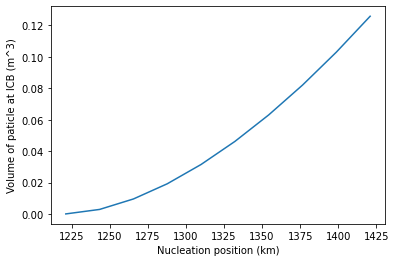

In [5]:
fig, ax = plt.subplots()
ax.plot(starting_radii/1000.0, final_volumes)
ax.set_xlabel('Nucleation position (km)')
ax.set_ylabel('Volume of paticle at ICB (m^3)')
plt.show()

## Inner core growth

We now have a (non-analytical) function, $f(z_0)$ that allows us to evaluate the 
volume of particles reaching the ICB which only depends on the nucleation height ($z_0$)
and a set of other (assumed known) parameters. We can thus write the growth rate
of the inner core by assuming steady state (so the falling time does not matter)
and integrating the volume of material arriving:

$$\frac{dR_{icb}}{dt} = \frac{1}{\mathscr{F} A_{icb}}\int_{z_{icb}}^{z_{top}} 4 \pi z_0^2 f(z_0) \mathscr{N} dz_0 $$

Here $\mathscr{F}$ is the fraction of inner core growth arising from particle
settling, $A_{icb}$ is the area of the surface of the inner core and $\mathscr{N}$
is the particle nucleation rate.

It seems we can proceed in three ways:

1. Find $\frac{\mathscr{N}}{\mathscr{F}}$ that gives 1 km/Myr (or whatever). Evaluate the resulting seismic structure of the F-layer.
2. Use $\mathscr{N}$ (from previous work, and this can then depend on $z$). Assume $\mathscr{F}$ is 1 (or whatever) and compare with F-layer
3. Do a comparison between equilibrium and non-equilibrium case (as close as we can manage).

I'm going to play with 1.

Sorry about symbols - we seem to be running out

Do we need to think about spacing of particles (rtot in the function)?

In [6]:
def inner_core_growth_rate(nuc_rate, xi, rtot, t, p, dl, k0, g, mu, radius_inner_core, 
                           radius_top_flayer, num_layers, start_time, max_time):
    """
    Calculate the inner core growth rate caused by falling particles
    """
    starting_radii = np.linspace(radius_inner_core, radius_top_flayer, num_layers) 
    final_volumes = np.zeros_like(starting_radii)
    for i, initial_particle_position in enumerate(starting_radii):

        sol = boundary_layer.falling_growing_particle_solution(start_time, max_time, initial_particle_size, 
                                                           initial_particle_position,
                                                           xi, rtot, t, p, dl, k0, g, mu, radius_inner_core)
        final_volumes[i] = 4/3 * np.pi * sol.y[0][-1]**3
    
    # Could simplify - 4pis cancel, for example...
    area_icb = 4.0 * np.pi * radius_inner_core**2
    growth_rate = np.trapz(final_volumes * nuc_rate * starting_radii**2 * 4.0 * np.pi, starting_radii) / area_icb
    return growth_rate
    

In [7]:
secinMyr = 60.0*60.0*24.0*365.0*1000000

print('{:^9s} {:^9s} {:^9s}'.format("Nuc rate", "dR/dt", "dR/dt"))
print('{:^9s} {:^9s} {:^9s}'.format("/m^3 /sec", "m/sec", "km/Myr"))

for nuc_rate in [1.0E-5, 1.0E-6, 1.0E-7, 1.0E-8, 1.0E-14]:
    # This is stupid - I don't need to put nuc_rate inside the loop (I don't think)
    growth_rate = inner_core_growth_rate(nuc_rate, xi, rtot, t, p, dl, k0, g, mu, radius_inner_core, 
                                         radius_top_flayer, 10, start_time, max_time)
    print('{: 6.2e} {: 6.2e} {: 6.2e}'.format(nuc_rate, growth_rate, growth_rate/1000 * secinMyr))


Nuc rate    dR/dt     dR/dt  
/m^3 /sec   m/sec    km/Myr  
Derivative evaluation at 0.0 s, at z= 1221000.0 ,rp =  1e-10
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -102.1866073690195 intgration error: 1.0903195754527187e-12
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 27.6662314333024 intgration error: 3.5133653906004836e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277430.4081272609
Composition error: 6.999315631528447e-05 intgration error: 4.418044472157974e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277430.3796520638
Composition error: 4.6846526657873255e-11 intgration error: 4.4179667641962766e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277430.3796520447
Composition error: -8.038014698286133e-14 intgration error: 4.417966764144177e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277430.3796520447
Composition error: -7.682743330406083e-14 intgra

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497012669
Thermodynamic growth rate: 2.0517393117813754e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497012669
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.00015513186534153647 m/s and BL thickness 0.00010508252091852187 m
Gives growth rate 2.0517393117813754e-06 m/s, boundary composition 0.7815058272032817 bulk composition 0.9499999990050371 and error -4.169017131516739e-09
Derivative evaluation at 0.0007721786407326798 s, at z= 1221000.0000031844 ,rp =  0.0009777777865796592
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -67720024.09053837 intgration error: 7.518432555551921e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 18933168.329408485 intgration error: 2.1020043826379877e-07
HCP Fe mu: 1277142.24913

HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -102.1866073690195 intgration error: 1.0903195754527187e-12
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 27.6662314333024 intgration error: 3.5133653906004836e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277430.4081272609
Composition error: 6.999315631528447e-05 intgration error: 4.418044472157974e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277430.3796520638
Composition error: 4.6846526657873255e-11 intgration error: 4.4179667641962766e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277430.3796520447
Composition error: -8.038014698286133e-14 intgration error: 4.417966764144177e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277430.3796520447
Composition error: -7.682743330406083e-14 intgration error: 4.417966764144181e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277430.3796520454
Composition error: 1.6431300764452317e-12 intgration error: 4.4179667641460905e-14
HCP Fe mu: 1277142.24913263


HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2495659033
Composition error: -7.773099852670384e-08 intgration error: 4.417966677845522e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2495659033
Composition error: -7.773099364172253e-08 intgration error: 4.417966677845527e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2495659143
Composition error: 1.7748412217688525e-05 intgration error: 4.417986468840161e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2495659036
Composition error: 2.981893429954141e-07 intgration error: 4.4179670952009404e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2495659036
Composition error: 2.9818933944270043e-07 intgration error: 4.4179670952009366e-14
      converged: True
           flag: 'converged'
 function_calls: 9
     iterations: 8
           root: 0.7815058246586217
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2495659033
Thermodynamic growth rate: 1.5633244865309592e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2495659033
Initial 

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002312
Composition error: -1.876487742968891e-07 intgration error: 4.417966555812277e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Composition error: 9.93066113785801e-08 intgration error: 4.417966874396753e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002312
Composition error: -1.8764877163235383e-07 intgration error: 4.417966555812279e-14
      converged: True
           flag: 'converged'
 function_calls: 8
     iterations: 7
           root: 0.7815058271838137
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Thermodynamic growth rate: 2.048003416854627e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.00022787918812857053 m/s and BL thickness 0.00010527422416150561 m
Gives growth rate 2.048003416854627e-06 m/s, boundary composition 0.7815058271838137 bulk comp

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002303
Composition error: -1.4561587047268176e-08 intgration error: 4.4179667479776573e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700236
Composition error: 6.9355113758717835e-06 intgration error: 4.417974464108684e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002303
Composition error: -1.4561585715000547e-08 intgration error: 4.4179667479776586e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700233
Composition error: 3.457605336265601e-06 intgration error: 4.417970602857321e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002303
Composition error: -1.4561583494554498e-08 intgration error: 4.417966747977661e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002317
Composition error: 1.7243914354203582e-06 intgration error: 4.4179686786033414e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002303
Composition error: -1.4561582162286868e-08 intgration error: 4.417966747977663e-14
HCP Fe mu: 12771

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2800808195
Composition error: 37.77717198404711 intgration error: 4.635905290605778e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002492
Composition error: 2.7011374651220166e-05 intgration error: 4.417996752794331e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002275
Composition error: 8.903153281281107e-08 intgration error: 4.4179668629891243e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002275
Composition error: 8.903152615147292e-08 intgration error: 4.417966862989117e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1248326.5180920607
Composition error: -25846828.8127035 intgration error: 2.8695740043441563e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002273
Composition error: -2.03665004860909e-07 intgration error: 4.417966538030689e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002273
Composition error: -2.036650004200169e-07 intgration error: 4.417966538030694e-14
      converged: True
         

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700217
Composition error: 7.688977721187484e-08 intgration error: 4.417966849509067e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700217
Composition error: 7.68897709946259e-08 intgration error: 4.4179668495090604e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1248326.5180920502
Composition error: -25847305.474158667 intgration error: 2.869626924396404e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002168
Composition error: -2.158121570339233e-07 intgration error: 4.417966524544641e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700217
Composition error: 7.688976921826907e-08 intgration error: 4.4179668495090585e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700217
Composition error: 7.688976655373381e-08 intgration error: 4.417966849509055e-14
      converged: True
           flag: 'converged'
 function_calls: 10
     iterations: 9
           root: 0.781505827183542
HCP Fe mu: 1277142.24913263
Liquid mu: 127714

Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.00023164588501302564 m/s and BL thickness 0.00010528420581147823 m
Gives growth rate 2.0478093554210375e-06 m/s, boundary composition 0.7815058271828021 bulk composition 0.9500000321856987 and error 1.348174354376397e-07
Derivative evaluation at 0.8287206781496932 s, at z= 1243222.2220293796 ,rp =  9.284266749015388e-05
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -51704397.51830306 intgration error: 5.74034081812251e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 14455518.294146925 intgration error: 1.6048853661018847e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2800807036
Composition error: 37.78489672042359 intgration error: 4.63676290862421e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700133
Comp

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249699673
Composition error: -3.5549212018537446e-08 intgration error: 4.4179667246767124e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496996785
Composition error: 6.921355413691543e-06 intgration error: 4.417974448392408e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496996731
Composition error: 2.5743354026275256e-07 intgration error: 4.41796704995291e-14
      converged: True
           flag: 'converged'
 function_calls: 10
     iterations: 9
           root: 0.7815058271733168
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249699673
Thermodynamic growth rate: 2.0459880289980248e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249699673
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.00026691851281090024 m/s and BL thickness 0.00010537790375833147 m
Gives growth rate 2.0459880289980248e-06 m/s, boundary composition 0.7815058271733168 bulk com

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496986254
Composition error: -5.1782627075169785e-08 intgration error: 4.417966706654002e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496986364
Composition error: 1.3594252024518028e-05 intgration error: 4.417981856795867e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496986256
Composition error: 2.417423519140982e-07 intgration error: 4.417967032532192e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496986256
Composition error: 2.4174234880547374e-07 intgration error: 4.417967032532188e-14
      converged: True
           flag: 'converged'
 function_calls: 9
     iterations: 8
           root: 0.7815058271536256
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496986254
Thermodynamic growth rate: 2.0422084523463724e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496986254
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.0003399056266978746

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496774765
Composition error: -2.818091728862271e-07 intgration error: 4.417966451273234e-14
      converged: True
           flag: 'converged'
 function_calls: 24
     iterations: 23
           root: 0.7815058267560532
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496774767
Thermodynamic growth rate: 1.9659003092087346e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496774767
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.0018192764871257884 m/s and BL thickness 0.00010967084411329102 m
Gives growth rate 1.9659003092087346e-06 m/s, boundary composition 0.7815058267560532 bulk composition 0.9500000040912608 and error 1.7130470375548157e-08
Derivative evaluation at 100.95896340518998 s, at z= 1243222.1166924322 ,rp =  0.0002936090929506488
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liqui

HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -76685509.00126572 intgration error: 8.513801333033815e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 21439739.249103233 intgration error: 2.3802896574280835e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2798958416
Composition error: 56.04076796450041 intgration error: 6.663571767600848e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.24951527
Composition error: 4.0149976023862166e-05 intgration error: 4.4180113395720864e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2495152485
Composition error: 2.0335577133323568e-07 intgration error: 4.417966989914526e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2495152482
Composition error: -2.2233283880623844e-07 intgration error: 4.4179665173052295e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2495152482
Composition error: -2.2233283347716792e-07 intgration error: 4.417966517305235e-14
HCP Fe mu: 1277142.24913263
Liq

HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 25055815.17854578 intgration error: 2.781754732994077e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2798406223
Composition error: 65.49273402713229 intgration error: 7.712950802671797e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494600501
Composition error: 4.6545845758583226e-05 intgration error: 4.418018440413928e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494600287
Composition error: 3.691726027099662e-07 intgration error: 4.4179671740081896e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494600285
Composition error: -1.283136352725478e-07 intgration error: 4.417966621687514e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494600285
Composition error: -1.2831363171983412e-07 intgration error: 4.4179666216875184e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494600285
Composition error: -1.2831362505849597e-07 intgration error: 4.4179666216875253e-14
HCP Fe mu: 1277142.24913263

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494486335
Composition error: 1.2850566388777906e-08 intgration error: 4.417966778411261e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494272713
Composition error: -0.047712004920807516 intgration error: 4.3649957977301566e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494486335
Composition error: 1.2850564612421067e-08 intgration error: 4.4179667784112585e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494379524
Composition error: -0.023856001195504906 intgration error: 4.3914812823415314e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494486335
Composition error: 1.2850563280153438e-08 intgration error: 4.417966778411257e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494432929
Composition error: -0.011928251886724084 intgration error: 4.404723744256097e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494486333
Composition error: -5.128833895362561e-07 intgration error: 4.4179661947293185e-14
      converged: Tr

HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 28074163.745371487 intgration error: 3.1168587405175014e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2798054225
Composition error: 73.38231572122297 intgration error: 8.58887032781586e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494248503
Composition error: 5.246752464360682e-05 intgration error: 4.418025014798171e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494248287
Composition error: 1.7076327818443815e-07 intgration error: 4.417966953729589e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494248287
Composition error: 1.707632710790108e-07 intgration error: 4.4179669537295817e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1248326.5178166619
Composition error: -50207570.77702188 intgration error: 5.574159666918511e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494248284
Composition error: -3.978009490701595e-07 intgration error: 4.4179663224964934e-14
HCP Fe mu: 1277142.24913263
Liquid

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2797336353
Composition error: 97.28043903952786 intgration error: 1.1242095003147204e-12
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493530626
Composition error: 6.951903918483993e-05 intgration error: 4.418043945782219e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249353041
Composition error: 1.9100325543419672e-07 intgration error: 4.417966976200478e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249353041
Composition error: 1.9100324921694778e-07 intgration error: 4.4179669762004714e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1248326.517744874
Composition error: -66558467.21921565 intgration error: 7.389473837275168e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249353041
Composition error: 1.9100324433196647e-07 intgration error: 4.4179669762004657e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2470438487
Composition error: -7.394165330246135 intgration error: 3.791393408862172e-14
HCP Fe mu: 1277142.24913263
Liquid 

HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -152440802.12778828 intgration error: 1.6924328399736539e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 42619409.57987575 intgration error: 4.7317054229474793e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2797056814
Composition error: 111.40175096149994 intgration error: 1.2809875566515917e-12
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493251087
Composition error: 8.017199952181642e-05 intgration error: 4.4180557729440653e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493250868
Composition error: -8.289085595691859e-08 intgration error: 4.41796667211693e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493250868
Composition error: -8.289085506874017e-08 intgration error: 4.4179666721169304e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493250978
Composition error: 4.004455433337384e-05 intgration error: 4.418011222530498e-14
HCP Fe mu: 1277142.24913263
Liq

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.248506972
Composition error: -3.3274539382367 intgration error: 7.237507885342284e-15
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493009767
Composition error: 1.0448383580552445e-07 intgration error: 4.4179668801446263e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2489039744
Composition error: -1.66372690375136 intgration error: 2.570858848911185e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493009767
Composition error: 1.044838335850784e-07 intgration error: 4.417966880144624e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2491024756
Composition error: -0.8318634132768237 intgration error: 3.494412849381064e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493009767
Composition error: 1.0448383092054314e-07 intgration error: 4.417966880144621e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492017262
Composition error: -0.415931665060544 intgration error: 3.9561898529233714e-14
HCP Fe mu: 1277142.24913263
Liquid mu:

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249272868
Composition error: -9.778135252602738e-07 intgration error: 4.417965678553177e-14
      converged: True
           flag: 'converged'
 function_calls: 6
     iterations: 5
           root: 0.7815058191499372
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492728683
Thermodynamic growth rate: 5.060038554827173e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492728683
Initial guess at liquid composition: 0.9498725704488081
Gives density contrast of: 443.98074595014805 kg/m^3, falling velocity -0.3049219027847744 m/s and BL thickness 0.00042577052354076777 m
Gives growth rate 5.060038554827173e-07 m/s, boundary composition 0.7815058191499372 bulk composition 0.9498746257669446 and error 1.7978320521194746e-07
Derivative evaluation at 222602.88073216614 s, at z= 1194158.4948895834 ,rp =  0.14396203645522876
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 1387

HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -51599334.498468496 intgration error: 5.728676479756812e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 14426144.767463772 intgration error: 1.601624249538077e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2800818589
Composition error: 37.70811783939397 intgration error: 4.628238740471807e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497012888
Composition error: 2.7161123575591972e-05 intgration error: 4.4179969190490345e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497012669
Composition error: -4.168875911148007e-09 intgration error: 4.417966759515884e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497012669
Composition error: -4.1688736907019575e-09 intgration error: 4.4179667595158865e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497012778
Composition error: 1.3578477350506546e-05 intgration error: 4.41798183928246e-14
HCP Fe mu: 1277142.24913263
Liq

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Thermodynamic growth rate: 2.048003416854627e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.00022787187031712437 m/s and BL thickness 0.00010527420477426842 m
Gives growth rate 2.048003416854627e-06 m/s, boundary composition 0.7815058271838176 bulk composition 0.9499999926783251 and error -3.067064602291225e-08
Derivative evaluation at 0.0011469478793976892 s, at z= 1265444.444443651 ,rp =  9.114797080198429e-05
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -51693460.60646321 intgration error: 5.73912657698822e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 14452460.551543813 intgration error: 1.6045458884777495e-07
HCP Fe mu: 1277142.24913263


HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Composition error: 1.3180140667756746e-07 intgration error: 4.4179669104732226e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Composition error: 1.318014000162293e-07 intgration error: 4.4179669104732156e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Composition error: 1.3180139690760484e-07 intgration error: 4.417966910473212e-14
      converged: True
           flag: 'converged'
 function_calls: 8
     iterations: 7
           root: 0.7815058271838133
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Thermodynamic growth rate: 2.048003416854627e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.00022788101760675057 m/s and BL thickness 0.00010527422900838494 m
Gives growth rate 2.048003416854627e-06 m/s, boundary composition 0.7815058271838133 bulk co

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002303
Composition error: -1.4561471584073615e-08 intgration error: 4.4179667479777854e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700233
Composition error: 3.4576054508406173e-06 intgration error: 4.417970602857448e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002303
Composition error: -1.4561469807716776e-08 intgration error: 4.4179667479777873e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002317
Composition error: 1.7243915495512852e-06 intgration error: 4.417968678603468e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002303
Composition error: -1.4561467587270727e-08 intgration error: 4.41796674797779e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700231
Composition error: 8.520454812810385e-07 intgration error: 4.4179677101047777e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002303
Composition error: -1.4561466699092307e-08 intgration error: 4.417966747977791e-14
HCP Fe mu: 127714

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.280080818
Composition error: 37.77725889469926 intgration error: 4.635914939626488e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700248
Composition error: 2.719102376280702e-05 intgration error: 4.4179969522449104e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002261
Composition error: -2.4078585791897922e-08 intgration error: 4.417966737411666e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002261
Composition error: -2.4078584015541082e-08 intgration error: 4.4179667374116676e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700237
Composition error: 1.358347258895165e-05 intgration error: 4.4179818448282884e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002261
Composition error: -2.4078582239184243e-08 intgration error: 4.4179667374116695e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002317
Composition error: 6.9260456019293315e-06 intgration error: 4.417974453599563e-14
HCP Fe mu: 1277142.2491

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700217
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.00022888826761134854 m/s and BL thickness 0.00010527689771574712 m
Gives growth rate 2.047951341843657e-06 m/s, boundary composition 0.781505827183542 bulk composition 0.9500000183565104 and error 7.688987979648232e-08
Derivative evaluation at 0.10182236434295537 s, at z= 1265444.4444206588 ,rp =  9.13541517668656e-05
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -51694780.56038777 intgration error: 5.739273121312069e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 14452829.584357498 intgration error: 1.604586859350409e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.280080809
Composition error: 37.77786865149697 intgration error: 4.635982636230112e-13
HCP Fe

HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 14455819.666690856 intgration error: 1.604918825175611e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2800806917
Composition error: 37.78568441435808 intgration error: 4.636850360218453e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497001213
Composition error: 2.7071740468898042e-05 intgration error: 4.417996819813851e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497000995
Composition error: -1.494315755579123e-07 intgration error: 4.417966598241891e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497000997
Composition error: 1.4333091380436258e-07 intgration error: 4.417966923273547e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497000997
Composition error: 1.4333090758711364e-07 intgration error: 4.41796692327354e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497000995
Composition error: -1.4943157289337705e-07 intgration error: 4.417966598241893e-14
      converged: True
        

HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -51811632.25057448 intgration error: 5.752246265003235e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 14485498.988350214 intgration error: 1.6082138918017586e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.280079529
Composition error: 37.86326231512819 intgration error: 4.645463237382159e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496989586
Composition error: 2.7040655547594383e-05 intgration error: 4.417996785302656e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249698937
Composition error: 5.69591285248805e-08 intgration error: 4.417966827381602e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249698937
Composition error: 5.695912363989919e-08 intgration error: 4.417966827381597e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1248326.5180907703
Composition error: -25905731.12850969 intgration error: 2.876113475065333e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.24969502
Composition error: 2.732910182512427e-05 intgration error: 4.417997105542355e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496949981
Composition error: -1.3899753437129903e-07 intgration error: 4.417966609826003e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496949984
Composition error: 1.506281326335568e-07 intgration error: 4.4179669313750875e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496949984
Composition error: 1.5062812641630785e-07 intgration error: 4.4179669313750805e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496949981
Composition error: -1.3899753215085298e-07 intgration error: 4.417966609826006e-14
      converged: True
           flag: 'converged'
 function_calls: 8
     iterations: 7
           root: 0.7815058270854376
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496949981
Thermodynamic growth rate: 2.02912065483396e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496949981
Initial gue

HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -54178081.614611566 intgration error: 6.014974922059588e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 15147111.072681332 intgration error: 1.681667588741223e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2800547935
Composition error: 39.592632925880274 intgration error: 4.837461944398863e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496742227
Composition error: 2.8074621412077505e-05 intgration error: 4.4179979332353655e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496742012
Composition error: 1.5921684637376643e-07 intgration error: 4.417966940910475e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249674201
Composition error: -1.4153087590784708e-07 intgration error: 4.4179666070134295e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496742012
Composition error: 1.592168406006067e-07 intgration error: 4.417966940910469e-14
HCP Fe mu: 1277142.24913263
Liq

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2495152482
Composition error: -2.2232945484645938e-07 intgration error: 4.4179665173089864e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2495152485
Composition error: 2.0335914818758738e-07 intgration error: 4.417966989918275e-14
      converged: True
           flag: 'converged'
 function_calls: 8
     iterations: 7
           root: 0.7815058237063716
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2495152485
Thermodynamic growth rate: 1.3805530552080114e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2495152485
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.018244428666548754 m/s and BL thickness 0.000156170751340032 m
Gives growth rate 1.3805530552080114e-06 m/s, boundary composition 0.7815058237063716 bulk composition 0.9500000484803608 and error 2.0335914818758738e-07
Derivative evaluation at 880.6528838794892 s, at z= 1265438.2091797125 ,rp =  0

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494612357
Thermodynamic growth rate: 1.1856658155284805e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494612357
Initial guess at liquid composition: 0.9499999958644317
Gives density contrast of: 443.53737093761447 kg/m^3, falling velocity -0.027331466391322626 m/s and BL thickness 0.00018184042492308257 m
Gives growth rate 1.1856658155284805e-06 m/s, boundary composition 0.7815058226910014 bulk composition 0.9500000220939823 and error 9.386224997243175e-08
Derivative evaluation at 1614.5125937531243 s, at z= 1265417.316114976 ,rp =  0.002445975416504687
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -89619463.48352872 intgration error: 9.949758739600039e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 25055815.178594243 intgration error: 2.781754732999457e-07
HCP Fe mu: 1277142.24913263
Liqui

HCP Fe mu: 1277142.24913263
Liquid mu: 1248326.5178404667
Composition error: -46425406.37106292 intgration error: 5.15425506627674e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494486335
Composition error: 1.2854830977460097e-08 intgration error: 4.417966778415996e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493204183
Composition error: -0.28636565306943895 intgration error: 4.100037022644755e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494486335
Composition error: 1.2854828757014047e-08 intgration error: 4.4179667784159936e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249384526
Composition error: -0.1431828203281036 intgration error: 4.2590019002852383e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494486335
Composition error: 1.2854827424746418e-08 intgration error: 4.417966778415992e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494165797
Composition error: -0.07159140894609184 intgration error: 4.33848433356696e-14
HCP Fe mu: 1277142.24913263
Liqu

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249427209
Composition error: 5.238185913558624e-05 intgration error: 4.418024919690351e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249427187
Composition error: -6.019417320146658e-08 intgration error: 4.4179666973153086e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249427187
Composition error: -6.01941696487529e-08 intgration error: 4.417966697315313e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249427198
Composition error: 2.6160832482968743e-05 intgration error: 4.417995808502832e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249427187
Composition error: -6.019416787239606e-08 intgration error: 4.417966697315315e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494271926
Composition error: 1.3332325126569344e-05 intgration error: 4.417981565998593e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249427187
Composition error: -6.01941652078608e-08 intgration error: 4.4179666973153174e-14
HCP Fe mu: 1277142.24913263

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249353041
Composition error: 1.9660350192296505e-07 intgration error: 4.417966982418001e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249353041
Composition error: 1.9660349703798374e-07 intgration error: 4.417966982417996e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1248326.517744874
Composition error: -66558467.74721432 intgration error: 7.389473895894795e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249353041
Composition error: 1.966034908207348e-07 intgration error: 4.417966982417989e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2474854782
Composition error: -5.980042681998437 intgration error: 2.2214021759606863e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493530407
Composition error: -5.571227466028006e-07 intgration error: 4.4179661456137657e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493530407
Composition error: -5.571227421619085e-07 intgration error: 4.417966145613771e-14
      converged: True
         

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493302142
Composition error: 7.801896076431447e-05 intgration error: 4.4180533825908646e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493301923
Composition error: -1.637937252496613e-07 intgration error: 4.4179665822967014e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493301923
Composition error: -1.637937212528584e-07 intgration error: 4.417966582296706e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493302033
Composition error: 3.8927583521530806e-05 intgration error: 4.418009982443785e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493301923
Composition error: -1.637937168119663e-07 intgration error: 4.41796658229671e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249330198
Composition error: 1.9802320922579497e-05 intgration error: 4.417988749136896e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493301926
Composition error: 6.605710329843362e-07 intgration error: 4.4179674975254364e-14
HCP Fe mu: 1277142.24

Composition error: 2.9137706469839486e-07 intgration error: 4.4179670876377926e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249302143
Composition error: 2.9137706070159197e-07 intgration error: 4.417967087637788e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249302143
Composition error: 2.9137705492843224e-07 intgration error: 4.417967087637782e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493021428
Composition error: -6.691024849736493e-07 intgration error: 4.417966021291281e-14
      converged: True
           flag: 'converged'
 function_calls: 9
     iterations: 8
           root: 0.781505819700264
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249302143
Thermodynamic growth rate: 6.116320783178253e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249302143
Initial guess at liquid composition: 0.9499851810648402
Gives density contrast of: 443.5889220170702 kg/m^3, falling velocity -0.21730123373600038 m/s and BL thickness 0.00035247267762496156 m
Gives growth rate 6

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492750343
Composition error: -2.1775384562161548e-07 intgration error: 4.417966522388934e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492750343
Composition error: -2.1775384251299101e-07 intgration error: 4.417966522388937e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492750343
Composition error: -2.1775383496347445e-07 intgration error: 4.417966522388946e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492750343
Composition error: -2.1775383185484998e-07 intgration error: 4.417966522388949e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492750345
Composition error: 9.456723972789405e-07 intgration error: 4.417967814051535e-14
      converged: True
           flag: 'converged'
 function_calls: 10
     iterations: 9
           root: 0.781505819190659
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492750343
Thermodynamic growth rate: 5.138192371578754e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492750343
Initial

HCP Fe mu: 1277142.24913263
Liquid mu: 1277430.3796520447
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -2.478861462484882e-14 m/s and BL thickness 2e-10 m
Gives growth rate 1.0360297956256925 m/s, boundary composition 0.7869411120936215 bulk composition 0.9499999999999835 and error -6.838973831690964e-14
Derivative evaluation at 9.652233009567773e-06 s, at z= 1287666.6666666667 ,rp =  1.0000100992234064e-05
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -9820828.828500787 intgration error: 1.090330586833731e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 2745707.1309737754 intgration error: 3.04835169365133e-08
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2825008647
Composition error: 7.176929240438783 intgration error: 1.2385958852984938e-13
HCP Fe mu: 1277142.

HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -90509059.6265651 intgration error: 1.004852375166172e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 25304528.532596953 intgration error: 2.8093674622140126e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2798374044
Composition error: 66.14283925560004 intgration error: 7.785126981979207e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494568322
Composition error: 4.699273595809572e-05 intgration error: 4.418018936561717e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494568108
Composition error: 3.5769596573587137e-07 intgration error: 4.417967161266564e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494568105
Composition error: -1.547769952203737e-07 intgration error: 4.4179665923072826e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494568105
Composition error: -1.547769907794816e-07 intgration error: 4.4179665923072876e-14
HCP Fe mu: 1277142.24913263
Liqui

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Thermodynamic growth rate: 2.048003416854627e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.00022787369976723376 m/s and BL thickness 0.0001052742096210687 m
Gives growth rate 2.048003416854627e-06 m/s, boundary composition 0.7815058271838133 bulk composition 0.9500000004357528 and error 1.8235919441167425e-09
Derivative evaluation at 0.0012378101686409263 s, at z= 1287666.6666658525 ,rp =  9.114815688950614e-05
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -51693461.7964482 intgration error: 5.739126709103093e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 14452460.884239903 intgration error: 1.6045459254144354e-07
HCP Fe mu: 1277142.24913263


HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700231
Composition error: 3.958679295479328e-08 intgration error: 4.417966808094435e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1248326.5180920644
Composition error: -25846668.11064278 intgration error: 2.8695561628313643e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700231
Composition error: 3.958679073434723e-08 intgration error: 4.417966808094433e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2491737748
Composition error: -0.654624919290363 intgration error: 3.6911871062547205e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700231
Composition error: 3.9586786737544344e-08 intgration error: 4.417966808094428e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249437003
Composition error: -0.3273124419242688 intgration error: 4.0545769548736587e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700231
Composition error: 3.9586784517098295e-08 intgration error: 4.417966808094426e-14
HCP Fe mu: 1277142.24913263
Liquid 

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700252
Composition error: 2.7232665865017935e-05 intgration error: 4.417996998476932e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.24970023
Composition error: 1.775155489269764e-08 intgration error: 4.417966783852451e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.24970023
Composition error: 1.775155400451922e-08 intgration error: 4.4179667838524506e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1248326.5180920633
Composition error: -25846709.76591195 intgration error: 2.869560787495258e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002298
Composition error: -2.692045040220137e-07 intgration error: 4.417966465267228e-14
      converged: True
           flag: 'converged'
 function_calls: 8
     iterations: 7
           root: 0.7815058271837869
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.24970023
Thermodynamic growth rate: 2.04799837089098e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.24970023
Initial guess at liquid c

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2800808104
Composition error: 37.77777174658431 intgration error: 4.635971877623588e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002403
Composition error: 2.7216622493941856e-05 intgration error: 4.417996980665212e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002184
Composition error: 1.150697759300101e-09 intgration error: 4.417966765421798e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002184
Composition error: 1.1506959829432617e-09 intgration error: 4.417966765421796e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1248326.5180920516
Composition error: -25847239.225407932 intgration error: 2.869619569307562e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002184
Composition error: 1.1506942065864223e-09 intgration error: 4.417966765421794e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496887413
Composition error: -0.014271644182568988 intgration error: 4.40212205617352e-14
HCP Fe mu: 1277142.24913263
Liq

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497001113
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.0002362762265399892 m/s and BL thickness 0.00010529648274471512 m
Gives growth rate 2.047569930274662e-06 m/s, boundary composition 0.7815058271815585 bulk composition 0.9499999776295662 and error -9.370677922504456e-08
Derivative evaluation at 0.9094871574823107 s, at z= 1287666.6664547077 ,rp =  9.300804379022306e-05
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -51705475.46546768 intgration error: 5.740460494298659e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 14455819.666693158 intgration error: 1.6049188251758666e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2800806917
Composition error: 37.78568441436419 intgration error: 4.636850360219131e-13
HC

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249699673
Composition error: -3.554896288449072e-08 intgration error: 4.4179667246769895e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249699673
Composition error: -3.554896021995546e-08 intgration error: 4.417966724676992e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496996839
Composition error: 1.3585277544692076e-05 intgration error: 4.4179818468321926e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249699673
Composition error: -3.554895799950941e-08 intgration error: 4.4179667246769945e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496996785
Composition error: 6.921355668154661e-06 intgration error: 4.417974448392691e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496996731
Composition error: 2.574337947258698e-07 intgration error: 4.417967049953193e-14
      converged: True
           flag: 'converged'
 function_calls: 10
     iterations: 9
           root: 0.7815058271733168
HCP Fe mu: 1277142.24913263
Liquid m

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496949984
Composition error: 1.5062838709667403e-07 intgration error: 4.4179669313753696e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496949981
Composition error: -1.389972714704868e-07 intgration error: 4.417966609826295e-14
      converged: True
           flag: 'converged'
 function_calls: 8
     iterations: 7
           root: 0.7815058270854375
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496949981
Thermodynamic growth rate: 2.02912065483396e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496949981
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.0005915209188231728 m/s and BL thickness 0.0001062538581098539 m
Gives growth rate 2.02912065483396e-06 m/s, boundary composition 0.7815058270854375 bulk composition 0.9499999668176093 and error -1.389972714704868e-07
Derivative evaluation at 37.35536094784443 s, at z= 1287666.649407761 ,rp =  0.000

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249674181
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.002055389929526208 m/s and BL thickness 0.00011033824187694682 m
Gives growth rate 1.9540088047609316e-06 m/s, boundary composition 0.781505826694102 bulk composition 0.9499999647655211 and error -1.4759737121394778e-07
Derivative evaluation at 276.39009551651543 s, at z= 1287666.2022945315 ,rp =  0.0006365222844819112
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -60880953.531719305 intgration error: 6.759143195408226e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 17021100.487995375 intgration error: 1.8897222084197715e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2799951679
Composition error: 44.491004444869354 intgration error: 5.381290428753841e-13
H

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2490123934
Composition error: -0.9369084555190117 intgration error: 3.377789424861065e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494998015
Composition error: -3.6869615049894833e-07 intgration error: 4.417966354809311e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494998015
Composition error: -3.686961482785023e-07 intgration error: 4.4179663548093134e-14
      converged: True
           flag: 'converged'
 function_calls: 13
     iterations: 12
           root: 0.7815058234159936
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494998018
Thermodynamic growth rate: 1.3248187880066098e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494998018
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.020690380938685617 m/s and BL thickness 0.00016274072629031433 m
Gives growth rate 1.3248187880066098e-06 m/s, boundary composition 0.7815058234159936 bulk co

HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 26249040.349820994 intgration error: 2.914229338865281e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2798257396
Composition error: 68.6116739439963 intgration error: 8.059222693484287e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494451674
Composition error: 4.901164661674784e-05 intgration error: 4.4180211780028157e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494451457
Composition error: 1.0431502106555968e-07 intgration error: 4.4179668799572043e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494451455
Composition error: -4.168628353617976e-07 intgration error: 4.4179663013335484e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494451455
Composition error: -4.168628322531731e-07 intgration error: 4.417966301333552e-14
      converged: True
           flag: 'converged'
 function_calls: 7
     iterations: 6
           root: 0.7815058223885303
HCP Fe mu: 1277142.24913263
Liquid mu: 12771

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494291489
Composition error: 3.7039163292007515e-08 intgration error: 4.417966805265998e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494291489
Composition error: 3.7039160627472256e-08 intgration error: 4.417966805265995e-14
      converged: True
           flag: 'converged'
 function_calls: 10
     iterations: 9
           root: 0.7815058220878099
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494291489
Thermodynamic growth rate: 1.069890942506646e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494291489
Initial guess at liquid composition: 0.9499999958644318
Gives density contrast of: 443.53737093761083 kg/m^3, falling velocity -0.07349959979894968 m/s and BL thickness 0.0002015176772945149 m
Gives growth rate 1.069890942506646e-06 m/s, boundary composition 0.7815058220878099 bulk composition 0.9499999916478171 and error 3.7039160627472256e-08
Derivative evaluation at 6313.242714722243 s, at z= 1287384.4151896238 ,rp =  0.00

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249398057
Composition error: -1.3317263203305174e-07 intgration error: 4.417966616292944e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249398068
Composition error: 2.8965461109198287e-05 intgration error: 4.4179989222661086e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493980573
Composition error: 4.804636599686773e-07 intgration error: 4.4179672975660836e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249398057
Composition error: -1.331726302566949e-07 intgration error: 4.417966616292946e-14
      converged: True
           flag: 'converged'
 function_calls: 9
     iterations: 8
           root: 0.7815058215033294
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249398057
Thermodynamic growth rate: 9.577066306665216e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249398057
Initial guess at liquid composition: 0.9499999290248438
Gives density contrast of: 443.53760352130485 kg/m^3, falling velocity -0.10810048006122339 m/s a

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492928389
Composition error: -0.17426419209010957 intgration error: 4.2244946457181256e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249345367
Composition error: -7.339940699679914e-07 intgration error: 4.41796594924715e-14
      converged: True
           flag: 'converged'
 function_calls: 16
     iterations: 15
           root: 0.7815058205128249
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493453673
Thermodynamic growth rate: 7.675927893302514e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493453673
Initial guess at liquid composition: 0.9499985624128482
Gives density contrast of: 443.542358957764 kg/m^3, falling velocity -0.15723826711453215 m/s and BL thickness 0.0002808783653832996 m
Gives growth rate 7.675927893302514e-07 m/s, boundary composition 0.7815058205128249 bulk composition 0.9499986379272499 and error 3.15989376886705e-08
Derivative evaluation at 43537.044719472135 s, at z= 1282313.4330472683 ,rp =  0.0392678

HCP Fe mu: 1277142.24913263
Liquid mu: 1248326.5176974172
Composition error: -84797395.1043779 intgration error: 9.414401605737203e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249305584
Composition error: 1.1837923397095551e-07 intgration error: 4.4179668955716173e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.248181084
Composition error: -4.58741220046881 intgration error: 6.773180765555845e-15
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493055838
Composition error: -8.230607906334342e-07 intgration error: 4.417965850363225e-14
      converged: True
           flag: 'converged'
 function_calls: 10
     iterations: 9
           root: 0.7815058197649501
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249305584
Thermodynamic growth rate: 6.240478134245109e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249305584
Initial guess at liquid composition: 0.949988052604733
Gives density contrast of: 443.5789299810367 kg/m^3, falling velocity -0.21057127935643916 m/s and BL thick

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492880402
Thermodynamic growth rate: 5.607468156476614e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492880402
Initial guess at liquid composition: 0.9499613805589279
Gives density contrast of: 443.6717389173882 kg/m^3, falling velocity -0.251420173945027 m/s and BL thickness 0.0003844043453328178 m
Gives growth rate 5.607468156476614e-07 m/s, boundary composition 0.7815058194351534 bulk composition 0.9499621439055628 and error -2.3632749224233862e-07
Derivative evaluation at 195851.38567010465 s, at z= 1245834.757928675 ,rp =  0.12850367861127776
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -205487555.49560127 intgration error: 2.281370109869262e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 57450224.725003615 intgration error: 6.378256667755524e-07
HCP Fe mu: 1277142.24913263
Liquid mu:

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492716466
Composition error: 1.5775856176958314e-09 intgration error: 4.417966765895738e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249263779
Composition error: -0.03979756068510998 intgration error: 4.37378259594774e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492716466
Composition error: 1.5775833972497821e-09 intgration error: 4.4179667658957354e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249267713
Composition error: -0.019898184209115488 intgration error: 4.395875341887074e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492716466
Composition error: 1.5775816208929427e-09 intgration error: 4.4179667658957335e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492696797
Composition error: -0.009949663315846458 intgration error: 4.406920418843745e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492716466
Composition error: 1.5775811768037329e-09 intgration error: 4.417966765895733e-14
HCP Fe mu: 1277142.249132

HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 67712223.13492475 intgration error: 7.517567359091643e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2796311874
Composition error: 176.9911967296966 intgration error: 2.0091766852941414e-12
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249250614
Composition error: 0.00012682215515891215 intgration error: 4.418107565020957e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492505922
Composition error: -6.839985848827723e-07 intgration error: 4.417966004753289e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492505924
Composition error: 6.604357545292316e-07 intgration error: 4.4179674973752473e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492505924
Composition error: 6.604357496442503e-07 intgration error: 4.4179674973752417e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492505922
Composition error: -6.839985817741479e-07 intgration error: 4.417966004753292e-14
      converged: True
         

HCP Fe mu: 1277142.24913263
Liquid mu: 1277430.3796520454
Composition error: 1.6431300764452317e-12 intgration error: 4.4179667641460905e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277430.3796520447
Composition error: -7.327471962526033e-14 intgration error: 4.4179667641441846e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277430.3796520452
Composition error: 1.0595968547022494e-12 intgration error: 4.4179667641454424e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277430.3796520447
Composition error: -7.194245199571014e-14 intgration error: 4.4179667641441865e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277430.379652045
Composition error: 4.942712905631197e-13 intgration error: 4.417966764144815e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277430.3796520447
Composition error: -6.838973831690964e-14 intgration error: 4.41796676414419e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277430.379652045
Composition error: 4.880540416252188e-13 intgration error: 4.417966764144808e-14
HCP Fe mu: 1277142.24

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2495659036
Composition error: 2.9819739788550237e-07 intgration error: 4.417967095209883e-14
      converged: True
           flag: 'converged'
 function_calls: 9
     iterations: 8
           root: 0.7815058246586217
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2495659033
Thermodynamic growth rate: 1.5633244865309592e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2495659033
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.011664426960739868 m/s and BL thickness 0.00013791245674381905 m
Gives growth rate 1.5633244865309592e-06 m/s, boundary composition 0.7815058246586217 bulk composition 0.9499999814348435 and error -7.772293697527743e-08
Derivative evaluation at 0.0008579762675284393 s, at z= 1309888.8889022365 ,rp =  0.0029525956414390843
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liqui

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2800808235
Composition error: 37.77690928661652 intgration error: 4.635876125332183e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002531
Composition error: 2.7027201944918033e-05 intgration error: 4.417996770366157e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Composition error: 9.93069404486846e-08 intgration error: 4.417966874397118e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002312
Composition error: -1.8764844833540906e-07 intgration error: 4.4179665558126384e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Composition error: 9.930693689597092e-08 intgration error: 4.4179668743971145e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002312
Composition error: -1.8764844700314143e-07 intgration error: 4.41796655581264e-14
      converged: True
           flag: 'converged'
 function_calls: 8
     iterations: 7
           root: 0.7815058271838137
HCP Fe mu: 1277142.24913263
Liquid mu: 1

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002312
Composition error: 1.6980005312916546e-07 intgration error: 4.417966952660195e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002312
Composition error: 1.6980005179689783e-07 intgration error: 4.4179669526601936e-14
      converged: True
           flag: 'converged'
 function_calls: 10
     iterations: 9
           root: 0.7815058271838087
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700231
Thermodynamic growth rate: 2.0480017348667445e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700231
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.0002278993127202456 m/s and BL thickness 0.00010527427747812054 m
Gives growth rate 2.0480017348667445e-06 m/s, boundary composition 0.7815058271838087 bulk composition 0.9499999706614809 and error -1.228945865072717e-07
Derivative evaluation at 0.004599714870130587 s, at z= 1309888.8888873088 ,rp 

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.24970023
Composition error: 1.7751657921394326e-08 intgration error: 4.417966783852566e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1248326.5180920633
Composition error: -25846709.765915792 intgration error: 2.869560787495684e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002298
Composition error: -2.6920439921696016e-07 intgration error: 4.417966465267344e-14
      converged: True
           flag: 'converged'
 function_calls: 8
     iterations: 7
           root: 0.7815058271837869
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.24970023
Thermodynamic growth rate: 2.04799837089098e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.24970023
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.00022797250022727904 m/s and BL thickness 0.00010527447137691218 m
Gives growth rate 2.04799837089098e-06 m/s, boundary composition 0.7815058271837869 bulk composition 0

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002184
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.00022878643048575864 m/s and BL thickness 0.00010527662788245497 m
Gives growth rate 2.0479563711539583e-06 m/s, boundary composition 0.7815058271835682 bulk composition 0.9500000002751361 and error 1.1507972352831075e-09
Derivative evaluation at 0.1018223643451898 s, at z= 1309888.8888651032 ,rp =  9.135415147331991e-05
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -51694780.5585064 intgration error: 5.739273121103195e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 14452829.583831502 intgration error: 1.6045868592920117e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.280080809
Composition error: 37.7778686500964 intgration error: 4.635982636074617e-13
HCP

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497001213
Composition error: 2.707174068961038e-05 intgration error: 4.4179968198140964e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497000995
Composition error: -1.4943135484557502e-07 intgration error: 4.4179665982421356e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497000997
Composition error: 1.4333113407261067e-07 intgration error: 4.4179669232737914e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497000997
Composition error: 1.4333112785536173e-07 intgration error: 4.4179669232737845e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497000995
Composition error: -1.4943135218103976e-07 intgration error: 4.417966598242139e-14
      converged: True
           flag: 'converged'
 function_calls: 8
     iterations: 7
           root: 0.7815058271813361
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497000997
Thermodynamic growth rate: 2.0475279305376404e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497000997
Init

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249699673
Composition error: -3.55488358749767e-08 intgration error: 4.41796672467713e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496996785
Composition error: 6.921355790279193e-06 intgration error: 4.4179744483928265e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496996731
Composition error: 2.574339155181349e-07 intgration error: 4.4179670499533266e-14
      converged: True
           flag: 'converged'
 function_calls: 10
     iterations: 9
           root: 0.7815058271733168
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249699673
Thermodynamic growth rate: 2.0459880289980248e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249699673
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.0002669185128320174 m/s and BL thickness 0.00010537790375838767 m
Gives growth rate 2.0459880289980248e-06 m/s, boundary composition 0.7815058271733168 bulk compos

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496949981
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.0005915209188370208 m/s and BL thickness 0.00010625385810989167 m
Gives growth rate 2.02912065483396e-06 m/s, boundary composition 0.7815058270854375 bulk composition 0.9499999668176692 and error -1.389970232246185e-07
Derivative evaluation at 37.355360948246386 s, at z= 1309888.8716299832 ,rp =  0.00016719567507409946
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -52370537.47475991 intgration error: 5.814297209850629e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 14641757.751346115 intgration error: 1.625562099449508e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2800734853
Composition error: 38.2717030802712 intgration error: 4.690809271547888e-13
HCP 

HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -54178081.61472707 intgration error: 6.014974922072411e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 15147111.072713625 intgration error: 1.6816675887448083e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2800547935
Composition error: 39.592632925966186 intgration error: 4.837461944408401e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496742227
Composition error: 2.8074622916651748e-05 intgration error: 4.417997933237036e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496742012
Composition error: 1.5921835183618782e-07 intgration error: 4.4179669409121463e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249674201
Composition error: -1.415293708895149e-07 intgration error: 4.4179666070151e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496742012
Composition error: 1.5921834517484967e-07 intgration error: 4.4179669409121394e-14
HCP Fe mu: 1277142.24913263
Liqui

HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 22374992.1201756 intgration error: 2.484123584559216e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2798798487
Composition error: 58.4854009635517 intgration error: 6.934980551831367e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249499277
Composition error: 4.1785619919743056e-05 intgration error: 4.4180131555016e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494992553
Composition error: 9.64323354502028e-08 intgration error: 4.4179668712056654e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494992553
Composition error: 9.643233145339991e-08 intgration error: 4.417966871205661e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1248326.5178910885
Composition error: -40015226.09552645 intgration error: 4.442582092886815e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249499255
Composition error: -3.4782583124837174e-07 intgration error: 4.41796637798002e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494612357
Initial guess at liquid composition: 0.9499999958644317
Gives density contrast of: 443.53737093761447 kg/m^3, falling velocity -0.02733146639310363 m/s and BL thickness 0.0001818404249235385 m
Gives growth rate 1.1856658155284805e-06 m/s, boundary composition 0.7815058226910014 bulk composition 0.9500000220944047 and error 9.386402055611143e-08
Derivative evaluation at 1614.5125939052236 s, at z= 1309861.760559416 ,rp =  0.002445975416703296
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -89619463.48385127 intgration error: 9.94975873963585e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 25055815.178684417 intgration error: 2.7817547330094685e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2798406223
Composition error: 65.49273402749854 intgration error: 7.71295080271246e-13
HCP Fe mu

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494486335
Composition error: 1.2862732212681749e-08 intgration error: 4.4179667784247676e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494379422
Composition error: -0.023878875765843688 intgration error: 4.391455886466863e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494486333
Composition error: -5.128712223800846e-07 intgration error: 4.417966194742827e-14
      converged: True
           flag: 'converged'
 function_calls: 18
     iterations: 17
           root: 0.7815058224540966
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494486335
Thermodynamic growth rate: 1.14019495511819e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494486335
Initial guess at liquid composition: 0.9499999958644317
Gives density contrast of: 443.53737093761447 kg/m^3, falling velocity -0.04728345199072181 m/s and BL thickness 0.00018909217868048095 m
Gives growth rate 1.14019495511819e-06 m/s, boundary composition 0.7815058224540966 bulk compos

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249427187
Thermodynamic growth rate: 1.0628123214839746e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249427187
Initial guess at liquid composition: 0.9499999958644316
Gives density contrast of: 443.53737093761265 kg/m^3, falling velocity -0.07595827747529081 m/s and BL thickness 0.00020285980907712586 m
Gives growth rate 1.0628123214839746e-06 m/s, boundary composition 0.7815058220509342 bulk composition 0.9499999657575597 and error -6.017240572475657e-08
Derivative evaluation at 6714.967906041578 s, at z= 1309575.4291477315 ,rp =  0.00814275924397043
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -100415471.02152607 intgration error: 1.1148356353871668e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 28074163.746798947 intgration error: 3.116858740675981e-07
HCP Fe mu: 1277142.24913263
Liquid

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493419114
Composition error: 6.83236490495176e-07 intgration error: 4.4179675226891495e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493419112
Composition error: -1.1055904547419004e-07 intgration error: 4.4179666413990686e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493419112
Composition error: -1.1055904103329794e-07 intgration error: 4.417966641399073e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493419112
Composition error: -1.1055903348378138e-07 intgration error: 4.417966641399082e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493419112
Composition error: -1.105590299310677e-07 intgration error: 4.4179666413990856e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493419112
Composition error: -1.1055902726653244e-07 intgration error: 4.417966641399089e-14
      converged: True
           flag: 'converged'
 function_calls: 10
     iterations: 9
           root: 0.781505820447858
HCP Fe mu: 1277142.24913263
Li

Composition error: 48374406.2321316 intgration error: 5.370638401944993e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2796827375
Composition error: 126.4445851069847 intgration error: 1.4479965648909384e-12
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493021647
Composition error: 9.050613043237732e-05 intgration error: 4.418067246134142e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249302143
Composition error: 3.747180281621354e-07 intgration error: 4.417967180164849e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249302143
Composition error: 3.747180192803512e-07 intgration error: 4.417967180164839e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1248326.5176939762
Composition error: -86512332.61727995 intgration error: 9.604797917052187e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493021428
Composition error: -5.85761638305371e-07 intgration error: 4.417966113818209e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249302143
Composition error: 3.7471801661581594e-07

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492880404
Composition error: 8.845531782597504e-07 intgration error: 4.417967746195572e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492880402
Composition error: -1.8337828011638635e-07 intgration error: 4.417966560553477e-14
      converged: True
           flag: 'converged'
 function_calls: 9
     iterations: 8
           root: 0.7815058194351536
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492880402
Thermodynamic growth rate: 5.607468156476614e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492880402
Initial guess at liquid composition: 0.9499613805589278
Gives density contrast of: 443.6717389173882 kg/m^3, falling velocity -0.2514202073732276 m/s and BL thickness 0.00038440437412670653 m
Gives growth rate 5.607468156476614e-07 m/s, boundary composition 0.7815058194351536 bulk composition 0.9499621565238197 and error -1.8337828011638635e-07
Derivative evaluation at 195851.45997000116 s, at z= 1268056.9580867488 ,rp =  0.12

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492716466
Composition error: 6.515832318143566e-08 intgration error: 4.4179668364845364e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492174886
Composition error: -0.273954296492688 intgration error: 4.113816396483097e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492716466
Composition error: 6.515832096098961e-08 intgration error: 4.417966836484534e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492445675
Composition error: -0.1369776994295271 intgration error: 4.265890968377421e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492716464
Composition error: -1.1021879213757302e-06 intgration error: 4.417965540469858e-14
      converged: True
           flag: 'converged'
 function_calls: 18
     iterations: 17
           root: 0.7815058191269709
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492716466
Thermodynamic growth rate: 5.015958814968968e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492716466
Initial guess a

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492487838
Composition error: 6.420054147016074e-05 intgration error: 4.418038041063599e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249248773
Composition error: 1.1864327014166065e-06 intgration error: 4.417968081349169e-14
      converged: True
           flag: 'converged'
 function_calls: 8
     iterations: 7
           root: 0.7815058186969777
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492487729
Thermodynamic growth rate: 4.190634839140728e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492487729
Initial guess at liquid composition: 0.9487511276421057
Gives density contrast of: 447.8801195823362 kg/m^3, falling velocity -0.450206518721856 m/s and BL thickness 0.0005107054414738933 m
Gives growth rate 4.190634839140728e-07 m/s, boundary composition 0.7815058186969777 bulk composition 0.9487621322203943 and error -1.9879122303834151e-07
Derivative evaluation at 576799.0915194876 s, at z= 1126695.0629561257 ,rp =  0.3062939

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.252120289
Composition error: 9.176161164248242e-09 intgration error: 4.417966774331852e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.252120289
Composition error: 9.176154058820885e-09 intgration error: 4.4179667743318436e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.252120289
Composition error: 9.176149617928786e-09 intgration error: 4.4179667743318385e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.252120289
Composition error: 9.176148729750366e-09 intgration error: 4.417966774331838e-14
      converged: True
           flag: 'converged'
 function_calls: 10
     iterations: 9
           root: 0.781505872677773
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.252120289
Thermodynamic growth rate: 1.0779984754849536e-05
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.252120289
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -2.788651603917787e-06 m/s and

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494568105
Composition error: -1.547758818887246e-07 intgration error: 4.417966592308518e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494568108
Composition error: 3.576970661889334e-07 intgration error: 4.4179671612677856e-14
      converged: True
           flag: 'converged'
 function_calls: 9
     iterations: 8
           root: 0.7815058226078178
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494568105
Thermodynamic growth rate: 1.1696990043219557e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494568105
Initial guess at liquid composition: 0.9499999958644317
Gives density contrast of: 443.53737093761447 kg/m^3, falling velocity -0.03519833122066447 m/s and BL thickness 0.00018432254655979658 m
Gives growth rate 1.1696990043219557e-06 m/s, boundary composition 0.7815058226078178 bulk composition 0.9499999621862626 and error -1.547758818887246e-07
Derivative evaluation at 0.0009652233009817867 s, at z= 1332111.1111266457 ,rp =

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Thermodynamic growth rate: 2.048003416854627e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.00022787461450345355 m/s and BL thickness 0.00010527421204449886 m
Gives growth rate 2.048003416854627e-06 m/s, boundary composition 0.7815058271838132 bulk composition 0.9500000043145171 and error 1.8070921203872103e-08
Derivative evaluation at 0.0016921216148215656 s, at z= 1332111.1111101934 ,rp =  9.114908732326187e-05
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -51693467.74638455 intgration error: 5.739127369678727e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 14452462.547723543 intgration error: 1.6045461100982194e-07
HCP Fe mu: 1277142.2491326

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249480873
Composition error: -0.27276180725990384 intgration error: 4.1151403254859514e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700231
Composition error: 3.9586991906759295e-08 intgration error: 4.417966808094656e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249590552
Composition error: -0.13638102767406135 intgration error: 4.266553407098483e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700231
Composition error: 3.9586988354045616e-08 intgration error: 4.417966808094652e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496453915
Composition error: -0.06819049126393306 intgration error: 4.342260110682547e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700231
Composition error: 3.9586985689510357e-08 intgration error: 4.417966808094649e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496728112
Composition error: -0.034095228730517846 intgration error: 4.3801134561777844e-14
HCP Fe mu: 1277142.24913263
Li

HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -51693589.13775282 intgration error: 5.739140846827931e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 14452496.486331062 intgration error: 1.6045498780405685e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.280080822
Composition error: 37.77699792202199 intgration error: 4.635885965838978e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700252
Composition error: 2.7232661397480484e-05 intgration error: 4.417996998471972e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.24970023
Composition error: 1.774708691115734e-08 intgration error: 4.417966783847491e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002298
Composition error: -2.692089684508403e-07 intgration error: 4.417966465262271e-14
      converged: True
           flag: 'converged'
 function_calls: 6
     iterations: 5
           root: 0.7815058271837871
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700

HCP Fe mu: 1277142.24913263
Liquid mu: 1248326.5180920516
Composition error: -25847239.225415494 intgration error: 2.8696195693084016e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002184
Composition error: 1.1508998198905829e-09 intgration error: 4.417966765422022e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249691035
Composition error: -0.011419575228682532 intgration error: 4.405288488793944e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002184
Composition error: 1.1508980435337435e-09 intgration error: 4.41796676542202e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496956266
Composition error: -0.0057099333901087235 intgration error: 4.4116274646254917e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002182
Composition error: -2.858110352832455e-07 intgration error: 4.4179664468302743e-14
      converged: True
           flag: 'converged'
 function_calls: 12
     iterations: 11
           root: 0.7815058271835682
HCP Fe mu: 1277142.24913263
Liquid m

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497001907
Composition error: -1.299912266716774e-08 intgration error: 4.417966749712341e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700191
Composition error: 2.7971634741774665e-07 intgration error: 4.417967074691795e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700191
Composition error: 2.7971633320689193e-07 intgration error: 4.417967074691779e-14
      converged: True
           flag: 'converged'
 function_calls: 20
     iterations: 19
           root: 0.7815058271830514
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497001907
Thermodynamic growth rate: 2.047856401121706e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497001907
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.00023072500522500135 m/s and BL thickness 0.0001052817650523288 m
Gives growth rate 2.047856401121706e-06 m/s, boundary composition 0.7815058271830514 bulk comp

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496998343
Composition error: 2.687993888450535e-05 intgration error: 4.417996606871316e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496998126
Composition error: -6.209271941060024e-08 intgration error: 4.4179666952074994e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496998128
Composition error: 2.2507451546971424e-07 intgration error: 4.4179670140271753e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496998126
Composition error: -6.209271807833261e-08 intgration error: 4.4179666952075006e-14
      converged: True
           flag: 'converged'
 function_calls: 7
     iterations: 6
           root: 0.7815058271759434
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496998126
Thermodynamic growth rate: 2.046492092455665e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496998126
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.000257161013148215

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496986254
Composition error: -4.933472341761558e-08 intgration error: 4.4179667093717203e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496986254
Composition error: -4.933471942081269e-08 intgration error: 4.417966709371725e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496986364
Composition error: 1.3596699979245841e-05 intgration error: 4.417981859513642e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496986256
Composition error: 2.441902600125445e-07 intgration error: 4.4179670352499154e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496986256
Composition error: 2.441902582361877e-07 intgration error: 4.4179670352499135e-14
      converged: True
           flag: 'converged'
 function_calls: 9
     iterations: 8
           root: 0.7815058271536256
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496986254
Thermodynamic growth rate: 2.0422084523463724e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496986254
Initial 

Composition error: -0.00276721352121978 intgration error: 4.414894539978954e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496774767
Composition error: 1.7133200191921105e-08 intgration error: 4.4179667831659396e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496764085
Composition error: -0.001383750653261906 intgration error: 4.416430492308674e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496774765
Composition error: -2.818064421816757e-07 intgration error: 4.417966451276266e-14
      converged: True
           flag: 'converged'
 function_calls: 24
     iterations: 23
           root: 0.7815058267560532
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496774767
Thermodynamic growth rate: 1.9659003092087346e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496774767
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.001819276487276097 m/s and BL thickness 0.00010967084411371515 m
Gives growth

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2495152482
Composition error: -2.2232009078138049e-07 intgration error: 4.417966517319382e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2495152485
Composition error: 2.0336851180857707e-07 intgration error: 4.4179669899286706e-14
      converged: True
           flag: 'converged'
 function_calls: 8
     iterations: 7
           root: 0.7815058237063717
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2495152485
Thermodynamic growth rate: 1.3805530552080114e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2495152485
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.018244428667313038 m/s and BL thickness 0.0001561707513421039 m
Gives growth rate 1.3805530552080114e-06 m/s, boundary composition 0.7815058237063717 bulk composition 0.9500000484825963 and error 2.0336851180857707e-07
Derivative evaluation at 880.6528839158191 s, at z= 1332104.8758463785 ,rp =  

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494612357
Thermodynamic growth rate: 1.1856658155284805e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494612357
Initial guess at liquid composition: 0.9499999958644317
Gives density contrast of: 443.53737093761447 kg/m^3, falling velocity -0.027331466393933832 m/s and BL thickness 0.000181840424923751 m
Gives growth rate 1.1856658155284805e-06 m/s, boundary composition 0.7815058226910014 bulk composition 0.9500000220946017 and error 9.386484478568491e-08
Derivative evaluation at 1614.512593975985 s, at z= 1332083.9827816356 ,rp =  0.0024459754167957836
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -89619463.48400143 intgration error: 9.949758739652521e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 25055815.178726394 intgration error: 2.781754733014129e-07
HCP Fe mu: 1277142.24913263
Liquid

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494486335
Composition error: 1.2866409715428517e-08 intgration error: 4.417966778428851e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249397301
Composition error: -0.11464974290335173 intgration error: 4.29067997980561e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494486335
Composition error: 1.2866407494982468e-08 intgration error: 4.417966778428848e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494229674
Composition error: -0.0573246073411422 intgration error: 4.354323665196534e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494486335
Composition error: 1.2866406162714839e-08 intgration error: 4.417966778428846e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494358004
Composition error: -0.028662560113192015 intgration error: 4.386144929961898e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494486335
Composition error: 1.2866404386357999e-08 intgration error: 4.4179667784288444e-14
HCP Fe mu: 1277142.24913263

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249427187
Composition error: -6.016232845240665e-08 intgration error: 4.417966697350664e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249427187
Composition error: -6.01623257878714e-08 intgration error: 4.417966697350667e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249427198
Composition error: 2.616086432860598e-05 intgration error: 4.4179958085381876e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249427187
Composition error: -6.016232312333614e-08 intgration error: 4.41796669735067e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494271926
Composition error: 1.3332356971762493e-05 intgration error: 4.417981566033949e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249427187
Composition error: -6.01623213469793e-08 intgration error: 4.417966697350672e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494271898
Composition error: 6.630567795262721e-06 intgration error: 4.4179741255532996e-14
HCP Fe mu: 1277142.24913263


HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249353041
Composition error: 2.1175547137985973e-07 intgration error: 4.417966999240066e-14
      converged: True
           flag: 'converged'
 function_calls: 10
     iterations: 9
           root: 0.7815058206570794
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249353041
Thermodynamic growth rate: 7.952805747279967e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249353041
Initial guess at liquid composition: 0.9499989979934735
Gives density contrast of: 443.5408432569402 kg/m^3, falling velocity -0.14971635920801465 m/s and BL thickness 0.00027110029383355447 m
Gives growth rate 7.952805747279967e-07 m/s, boundary composition 0.7815058206570794 bulk composition 0.9499990988329458 and error 2.1175547137985973e-07
Derivative evaluation at 29440.637879337708 s, at z= 1329676.1001785018 ,rp =  0.030194716123747453
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 1387

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493301923
Composition error: -1.014003681021336e-07 intgration error: 4.4179666515672427e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249330193
Composition error: 2.388181443713222e-06 intgration error: 4.417969415558292e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493301926
Composition error: 7.229644527484425e-07 intgration error: 4.4179675667960477e-14
      converged: True
           flag: 'converged'
 function_calls: 16
     iterations: 15
           root: 0.7815058202275592
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493301923
Thermodynamic growth rate: 7.128389045707451e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493301923
Initial guess at liquid composition: 0.9499969748891651
Gives density contrast of: 443.54788309760625 kg/m^3, falling velocity -0.17386215418589 m/s and BL thickness 0.00030245009969204586 m
Gives growth rate 7.128389045707451e-07 m/s, boundary composition 0.7815058202275592 bulk composit

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249291422
Initial guess at liquid composition: 0.9499696684861528
Gives density contrast of: 443.642900261415 kg/m^3, falling velocity -0.2421234242477609 m/s and BL thickness 0.00037623604553218583 m
Gives growth rate 5.729491714401291e-07 m/s, boundary composition 0.7815058194987246 bulk composition 0.9499704420015275 and error 3.156181107577538e-07
Derivative evaluation at 128794.25223798525 s, at z= 1308234.0773905965 ,rp =  0.09172799810414253
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -188609911.6677749 intgration error: 2.0939906219529243e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 52731571.841504484 intgration error: 5.854380960108061e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.279668635
Composition error: 137.83366572850724 intgration error: 1.5744407602442035e-12
HCP Fe mu:

HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 58793214.36590011 intgration error: 6.527358469871158e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2796522416
Composition error: 153.67803452255237 intgration error: 1.7503485907022158e-12
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492716683
Composition error: 0.00010966936376455294 intgration error: 4.4180885215970135e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492716466
Composition error: 1.255813955047813e-07 intgration error: 4.4179669035676225e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492716466
Composition error: 1.2558139239615684e-07 intgration error: 4.4179669035676194e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1248326.5176634798
Composition error: -105145230.62830757 intgration error: 1.1673465158133703e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492716466
Composition error: 1.255813901757108e-07 intgration error: 4.417966903567617e-14
HCP Fe mu: 1277142.24913263
Li

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.279627743
Composition error: 180.26211486124194 intgration error: 2.0454911715071966e-12
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492471696
Composition error: 0.00012911292918360573 intgration error: 4.4181101082910226e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492471477
Composition error: -7.496253364713823e-07 intgration error: 4.417965931892958e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249247148
Composition error: 6.470406770375803e-07 intgration error: 4.417967482503724e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249247148
Composition error: 6.470406703762421e-07 intgration error: 4.4179674825037167e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249247148
Composition error: 6.470406685998853e-07 intgration error: 4.417967482503715e-14
      converged: True
           flag: 'converged'
 function_calls: 8
     iterations: 7
           root: 0.7815058186664279
HCP Fe mu: 1277142.24913263
Liquid mu: 1277

HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -52769099.52876336 intgration error: 5.858546486760282e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 14753187.75922706 intgration error: 1.637933315487867e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2800692536
Composition error: 38.562966936615865 intgration error: 4.723146055503385e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496886833
Composition error: 2.761776873727584e-05 intgration error: 4.417997426027007e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496886617
Composition error: 1.2956116934859097e-07 intgration error: 4.4179669079860596e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496886614
Composition error: -1.6336515606951707e-07 intgration error: 4.417966582772508e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496886617
Composition error: 1.2956116490769887e-07 intgration error: 4.4179669079860546e-14
HCP Fe mu: 1277142.24913263
Liqu

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2800808235
Composition error: 37.77690219967187 intgration error: 4.635875338523271e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002534
Composition error: 2.7184175145578138e-05 intgration error: 4.4179969446414184e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Composition error: -3.067024145764208e-08 intgration error: 4.417966730093458e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Composition error: -3.067024012537445e-08 intgration error: 4.417966730093459e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002424
Composition error: 1.3576752453392515e-05 intgration error: 4.4179818373674395e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Composition error: -3.067023657266077e-08 intgration error: 4.417966730093464e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700237
Composition error: 6.919388325421494e-06 intgration error: 4.4179744462085016e-14
HCP Fe mu: 1277142.24913

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2800808235
Composition error: 37.77691007407395 intgration error: 4.63587621275752e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002531
Composition error: 2.7041644754088878e-05 intgration error: 4.417996786400896e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Composition error: 1.1374919717255239e-07 intgration error: 4.4179668904312444e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002312
Composition error: -1.7320619916105784e-07 intgration error: 4.417966571846756e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002312
Composition error: -1.7320619383198732e-07 intgration error: 4.417966571846762e-14
      converged: True
           flag: 'converged'
 function_calls: 7
     iterations: 6
           root: 0.7815058271838136
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Thermodynamic growth rate: 2.048003416854627e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Initial guess

HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 14452489.831193617 intgration error: 1.604549139171886e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2800808223
Composition error: 37.776980488288444 intgration error: 4.635884030305738e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002522
Composition error: 2.7200340710908932e-05 intgration error: 4.417996962588801e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002303
Composition error: -1.4561065242446602e-08 intgration error: 4.4179667479782367e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002303
Composition error: -1.4561063466089763e-08 intgration error: 4.4179667479782386e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002413
Composition error: 1.3592889823499377e-05 intgration error: 4.41798185528352e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002303
Composition error: -1.4561061245643714e-08 intgration error: 4.417966747978241e-14
HCP Fe mu: 1277142.249132

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002492
Composition error: 2.701137517702179e-05 intgration error: 4.417996752794915e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002275
Composition error: 8.903205950261395e-08 intgration error: 4.417966862989709e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002275
Composition error: 8.90320528412758e-08 intgration error: 4.417966862989702e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1248326.5180920607
Composition error: -25846828.81272276 intgration error: 2.8695740043462945e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002273
Composition error: -2.036644772829277e-07 intgration error: 4.4179665380312743e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002273
Composition error: -2.036644728420356e-07 intgration error: 4.4179665380312794e-14
      converged: True
           flag: 'converged'
 function_calls: 9
     iterations: 8
           root: 0.7815058271837392
HCP Fe mu: 1277142.24913263
Liquid mu: 1

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700217
Composition error: 7.689030434576694e-08 intgration error: 4.4179668495096523e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700217
Composition error: 7.6890298128518e-08 intgration error: 4.4179668495096454e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1248326.5180920502
Composition error: -25847305.474177983 intgration error: 2.8696269243985483e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002168
Composition error: -2.158116285677636e-07 intgration error: 4.417966524545227e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700217
Composition error: 7.689029724033958e-08 intgration error: 4.417966849509645e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700217
Composition error: 7.689029457580432e-08 intgration error: 4.4179668495096416e-14
      converged: True
           flag: 'converged'
 function_calls: 10
     iterations: 9
           root: 0.781505827183542
HCP Fe mu: 1277142.24913263
Liquid mu: 12771

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497001777
Thermodynamic growth rate: 2.0478093554210375e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497001777
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.00023164588504302739 m/s and BL thickness 0.00010528420581155777 m
Gives growth rate 2.0478093554210375e-06 m/s, boundary composition 0.7815058271828021 bulk composition 0.9500000321858261 and error 1.3481796923286993e-07
Derivative evaluation at 0.8287206781943686 s, at z= 1354333.3331404906 ,rp =  9.28426674962601e-05
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -51704397.51834283 intgration error: 5.740340818126925e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 14455518.294158038 intgration error: 1.6048853661031184e-07
HCP Fe mu: 1277142.24913263


HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496996785
Composition error: 6.921356020317404e-06 intgration error: 4.4179744483930814e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496996731
Composition error: 2.574341460004348e-07 intgration error: 4.417967049953583e-14
      converged: True
           flag: 'converged'
 function_calls: 10
     iterations: 9
           root: 0.7815058271733168
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249699673
Thermodynamic growth rate: 2.0459880289980248e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249699673
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.00026691851284494045 m/s and BL thickness 0.00010537790375842208 m
Gives growth rate 2.0459880289980248e-06 m/s, boundary composition 0.7815058271733168 bulk composition 0.9499999915138414 and error -3.5548605836766e-08
Derivative evaluation at 8.27942839512705 s, at z= 1354333.331081839 ,rp =  0.000

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496928987
Composition error: 6.94870806450254e-06 intgration error: 4.4179744787599507e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496928934
Composition error: 2.0414600809814942e-07 intgration error: 4.417966990791865e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496928934
Composition error: 2.0414600365725732e-07 intgration error: 4.41796699079186e-14
      converged: True
           flag: 'converged'
 function_calls: 11
     iterations: 10
           root: 0.7815058270458659
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496928931
Thermodynamic growth rate: 2.0215253804245492e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496928931
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.0007374010198345078 m/s and BL thickness 0.00010665308301938876 m
Gives growth rate 2.0215253804245492e-06 m/s, boundary composition 0.7815058270458659 bulk co

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496145752
Composition error: -4.72427257314223e-08 intgration error: 4.417966711694304e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496145805
Composition error: 7.793336895822733e-06 intgration error: 4.417975416486327e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496145752
Composition error: -4.724272217870862e-08 intgration error: 4.417966711694308e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249614578
Composition error: 4.0420250857486906e-06 intgration error: 4.4179712516935827e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496145752
Composition error: -4.724271951417336e-08 intgration error: 4.417966711694311e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496145766
Composition error: 2.000770743304514e-06 intgration error: 4.417968985446013e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496145752
Composition error: -4.724271640554889e-08 intgration error: 4.417966711694314e-14
HCP Fe mu: 1277142.2491

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249490201
Composition error: -8.492177494545672e-08 intgration error: 4.4179666698621564e-14
      converged: True
           flag: 'converged'
 function_calls: 7
     iterations: 6
           root: 0.7815058232355154
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249490201
Thermodynamic growth rate: 1.2901775481299893e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249490201
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.022342590706419935 m/s and BL thickness 0.00016711027158721872 m
Gives growth rate 1.2901775481299893e-06 m/s, boundary composition 0.7815058232355154 bulk composition 0.9499999795786843 and error -8.492177494545672e-08
Derivative evaluation at 978.1146239915588 s, at z= 1354322.5421002624 ,rp =  0.0016692809314188366
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494451455
Composition error: -4.168498555223721e-07 intgration error: 4.4179663013479587e-14
      converged: True
           flag: 'converged'
 function_calls: 7
     iterations: 6
           root: 0.7815058223885303
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494451457
Thermodynamic growth rate: 1.127610355089459e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494451457
Initial guess at liquid composition: 0.9499999958644317
Gives density contrast of: 443.53737093761447 kg/m^3, falling velocity -0.0521845581021293 m/s and BL thickness 0.00019120254929515362 m
Gives growth rate 1.127610355089459e-06 m/s, boundary composition 0.7815058223885303 bulk composition 0.9500000207824308 and error 1.043279977963607e-07
Derivative evaluation at 3099.4411908314146 s, at z= 1354263.1053690196 ,rp =  0.00495253636813588
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249440828
Composition error: 2.8596324908036763e-07 intgration error: 4.4179670816272494e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494408279
Composition error: -2.5308558182501883e-07 intgration error: 4.417966483162826e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494408279
Composition error: -2.530855764959483e-07 intgration error: 4.417966483162832e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249440828
Composition error: 2.859632468599216e-07 intgration error: 4.417967081627247e-14
      converged: True
           flag: 'converged'
 function_calls: 8
     iterations: 7
           root: 0.7815058223073642
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494408279
Thermodynamic growth rate: 1.1120308340828444e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494408279
Initial guess at liquid composition: 0.9499999958644317
Gives density contrast of: 443.53737093761447 kg/m^3, falling velocity -0.058133288084733 m/s 

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249398068
Composition error: 2.8971799949317756e-05 intgration error: 4.4179989293036346e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249398057
Composition error: -1.2683404859714642e-07 intgration error: 4.4179666233301856e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493980627
Composition error: 1.4735437459556522e-05 intgration error: 4.417983123766212e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493980573
Composition error: 4.868022496218316e-07 intgration error: 4.417967304603332e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493980573
Composition error: 4.868022460691179e-07 intgration error: 4.417967304603328e-14
      converged: True
           flag: 'converged'
 function_calls: 11
     iterations: 10
           root: 0.7815058215033296
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249398057
Thermodynamic growth rate: 9.577066306665216e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249398057
Initial gue

Gives density contrast of: 443.5432521116072 kg/m^3, falling velocity -0.16078502571884762 m/s and BL thickness 0.00028551640819234937 m
Gives growth rate 7.551224479040997e-07 m/s, boundary composition 0.7815058204478582 bulk composition 0.949998357384519 and error -1.004256411363258e-07
Derivative evaluation at 32281.34742839056 s, at z= 1350749.9260437486 ,rp =  0.030628084412344887
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -137917458.03287452 intgration error: 1.5311913298817152e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 38558971.98748181 intgration error: 4.28090629243455e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2797259619
Composition error: 100.788280534475 intgration error: 1.1631543642589788e-12
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249345389
Composition error: 7.189011353059271e-05 intgration error: 4.41804

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493021428
Composition error: -5.104913154418966e-07 intgration error: 4.417966197385054e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249302143
Composition error: 4.49988442507987e-07 intgration error: 4.4179672637317964e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249302143
Composition error: 4.499884393993625e-07 intgration error: 4.4179672637317926e-14
      converged: True
           flag: 'converged'
 function_calls: 8
     iterations: 7
           root: 0.7815058197002638
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249302143
Thermodynamic growth rate: 6.116320783178253e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249302143
Initial guess at liquid composition: 0.9499851810648401
Gives density contrast of: 443.5889220170666 kg/m^3, falling velocity -0.21730131115456394 m/s and BL thickness 0.0003524727567931286 m
Gives growth rate 6.116320783178253e-07 m/s, boundary composition 0.7815058197002638 bulk composition 0

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492880402
Composition error: -8.519587346711432e-08 intgration error: 4.417966669557846e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492880416
Composition error: 6.259574362399434e-06 intgration error: 4.417973713667848e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492880402
Composition error: -8.51958721348467e-08 intgration error: 4.417966669557848e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249288041
Composition error: 3.097659163397992e-06 intgration error: 4.4179702032367926e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492880402
Composition error: -8.519587035848986e-08 intgration error: 4.41796666955785e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492880407
Composition error: 2.0297275300507067e-06 intgration error: 4.417969017594504e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492880402
Composition error: -8.51958681380438e-08 intgration error: 4.4179666695578524e-14
HCP Fe mu: 1277142.24913

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492640584
Composition error: 7.597631670464011e-07 intgration error: 4.4179676076508277e-14
      converged: True
           flag: 'converged'
 function_calls: 7
     iterations: 6
           root: 0.7815058189843228
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492640582
Thermodynamic growth rate: 4.742155834680517e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492640582
Initial guess at liquid composition: 0.9497220586235755
Gives density contrast of: 444.5043699760263 kg/m^3, falling velocity -0.34758527373513304 m/s and BL thickness 0.00045390911990160926 m
Gives growth rate 4.742155834680517e-07 m/s, boundary composition 0.7815058189843228 bulk composition 0.9497255546382066 and error -4.706315319680243e-07
Derivative evaluation at 328913.13033304573 s, at z= 1268048.7290231802 ,rp =  0.19239837488815617
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492487724
Thermodynamic growth rate: 4.1906181857953584e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492487724
Initial guess at liquid composition: 0.9487510590970557
Gives density contrast of: 447.88035777409095 kg/m^3, falling velocity -0.4502108920114323 m/s and BL thickness 0.0005107075976483077 m
Gives growth rate 4.1906181857953584e-07 m/s, boundary composition 0.7815058186969654 bulk composition 0.9487621736987706 and error 2.5378849644042134e-07
Derivative evaluation at 576803.2185633739 s, at z= 1171138.1244078758 ,rp =  0.3062991346362177
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -246668961.45091176 intgration error: 2.7385755631249042e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 68963725.21125805 intgration error: 7.656512001142786e-07
HCP Fe mu: 1277142.24913263
Liquid m

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.252120289
Thermodynamic growth rate: 1.0779984754849536e-05
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.252120289
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -2.7886516040529403e-06 m/s and BL thickness 2.0000201985471082e-05 m
Gives growth rate 1.0779984754849536e-05 m/s, boundary composition 0.781505872677773 bulk composition 0.9500000021947294 and error 9.193255490203e-09
Derivative evaluation at 0.00019304466020103622 s, at z= 1376555.5555555555 ,rp =  0.0002000001198547108
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -52769099.52879438 intgration error: 5.858546486763725e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 14753187.759235736 intgration error: 1.6379333154888301e-07
HCP Fe mu: 1277142.24913263
Li

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494568105
Composition error: -1.5477485160175775e-07 intgration error: 4.4179665923096624e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494568108
Composition error: 3.5769809691998944e-07 intgration error: 4.41796716126893e-14
      converged: True
           flag: 'converged'
 function_calls: 9
     iterations: 8
           root: 0.7815058226078178
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494568105
Thermodynamic growth rate: 1.1696990043219557e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494568105
Initial guess at liquid composition: 0.9499999958644317
Gives density contrast of: 443.53737093761447 kg/m^3, falling velocity -0.03519833122141468 m/s and BL thickness 0.00018432254656006603 m
Gives growth rate 1.1696990043219557e-06 m/s, boundary composition 0.7815058226078178 bulk composition 0.9499999621865088 and error -1.5477485160175775e-07
Derivative evaluation at 0.000965223301005181 s, at z= 1376555.5555710902 ,rp 

Liquid mu: 138705.72230949416
Composition error: -51693468.80416877 intgration error: 5.739127487116366e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 14452462.843458926 intgration error: 1.6045461429314425e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2800808235
Composition error: 37.77691007407913 intgration error: 4.635876212758095e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002531
Composition error: 2.704164484956806e-05 intgration error: 4.4179967864010023e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Composition error: 1.1374929176355408e-07 intgration error: 4.417966890431349e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002312
Composition error: -1.7320610412596693e-07 intgration error: 4.417966571846862e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002312
Composition error: -1.732060983528072e-07 intgration error: 4.417966571846868e-14
      converged: True
           flag: 'converged'
 function

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700231
Composition error: 3.958718863827926e-08 intgration error: 4.4179668080948745e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700231
Composition error: 3.958718108876269e-08 intgration error: 4.4179668080948656e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700231
Composition error: 3.95871770919598e-08 intgration error: 4.417966808094861e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002308
Composition error: -2.473684168613488e-07 intgration error: 4.417966489510154e-14
      converged: True
           flag: 'converged'
 function_calls: 10
     iterations: 9
           root: 0.7815058271838047
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700231
Thermodynamic growth rate: 2.0480017348667445e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700231
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.00022790846053176214 m/s 

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002298
Composition error: -2.692087783806585e-07 intgration error: 4.417966465262482e-14
      converged: True
           flag: 'converged'
 function_calls: 8
     iterations: 7
           root: 0.7815058271837869
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.24970023
Thermodynamic growth rate: 2.04799837089098e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.24970023
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.0002279724999807772 m/s and BL thickness 0.00010527447137625909 m
Gives growth rate 2.04799837089098e-06 m/s, boundary composition 0.7815058271837869 bulk composition 0.9500000042372533 and error 1.7747278757695994e-08
Derivative evaluation at 0.029132532962854174 s, at z= 1376555.5555483827 ,rp =  9.120528526457186e-05
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 13

HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -51694648.0605755 intgration error: 5.739258410877835e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 14452792.5400504 intgration error: 1.604582746606142e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2800808104
Composition error: 37.77777174660614 intgration error: 4.635971877626011e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002403
Composition error: 2.7216622893178055e-05 intgration error: 4.417996980665655e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002184
Composition error: 1.1510961073213366e-09 intgration error: 4.41796676542224e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002184
Composition error: 1.151095219142917e-09 intgration error: 4.417966765422239e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1248326.5180920516
Composition error: -25847239.22542259 intgration error: 2.8696195693091893e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 127

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497001907
Thermodynamic growth rate: 2.047856401121706e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497001907
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.00023072500523598142 m/s and BL thickness 0.00010528176505235792 m
Gives growth rate 2.047856401121706e-06 m/s, boundary composition 0.7815058271830514 bulk composition 0.9499999968971402 and error -1.2998928156093825e-08
Derivative evaluation at 0.3744092320435837 s, at z= 1376555.5554690023 ,rp =  9.19123770044603e-05
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -51698369.09870126 intgration error: 5.739671529098108e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 14453832.868158692 intgration error: 1.6046982462280409e-07
HCP Fe mu: 1277142.24913263
L

HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -51731631.28941591 intgration error: 5.743364374096195e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 14463132.313844109 intgration error: 1.605730692099661e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2800804048
Composition error: 37.80479883516261 intgration error: 4.63897248722641e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496998343
Composition error: 2.6879939100332706e-05 intgration error: 4.417996606871556e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496998126
Composition error: -6.209250402733346e-08 intgration error: 4.4179666952077386e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496998128
Composition error: 2.250747299648026e-07 intgration error: 4.417967014027413e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496998126
Composition error: -6.209250269506583e-08 intgration error: 4.41796669520774e-14
      converged: True
           fla

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2800792176
Composition error: 37.884097094362694 intgration error: 4.647776362544072e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249698647
Composition error: 2.695496537263864e-05 intgration error: 4.417996690167451e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496986254
Composition error: -4.933444630594863e-08 intgration error: 4.417966709372028e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496986254
Composition error: -4.933444230914574e-08 intgration error: 4.417966709372033e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496986364
Composition error: 1.3596700256801597e-05 intgration error: 4.41798185951395e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496986256
Composition error: 2.4419053756830067e-07 intgration error: 4.4179670352502234e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496986256
Composition error: 2.4419053579194383e-07 intgration error: 4.4179670352502215e-14
      converged: True
   

HCP Fe mu: 1277142.24913263
Liquid mu: 1248326.51806931
Composition error: -26926095.488098934 intgration error: 2.9893966756176216e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496774767
Composition error: 1.7134444085797895e-08 intgration error: 4.4179667831673205e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2495407565
Composition error: -0.1771054645272634 intgration error: 4.221340199639165e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496774767
Composition error: 1.7134442753530266e-08 intgration error: 4.417966783167319e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496091165
Composition error: -0.08855287630124087 intgration error: 4.3196533219778454e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496774767
Composition error: 1.7134441421262636e-08 intgration error: 4.417966783167318e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496432967
Composition error: -0.04427627716058602 intgration error: 4.368810221795899e-14
HCP Fe mu: 1277142.24913263
L

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496145752
Composition error: -4.72409720231326e-08 intgration error: 4.417966711696251e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496145805
Composition error: 7.793338648642845e-06 intgration error: 4.4179754164882734e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496145752
Composition error: -4.724096980268655e-08 intgration error: 4.4179667116962536e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249614578
Composition error: 4.042026838568802e-06 intgration error: 4.417971251695528e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496145752
Composition error: -4.724096624997287e-08 intgration error: 4.4179667116962574e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496145766
Composition error: 2.0007724961246254e-06 intgration error: 4.4179689854479586e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496145752
Composition error: -4.724096358543761e-08 intgration error: 4.4179667116962605e-14
HCP Fe mu: 1277142.

HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 22341691.385506775 intgration error: 2.48042646032259e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2798803952
Composition error: 58.39835703560202 intgration error: 6.925316734535013e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494998234
Composition error: 4.17020545775415e-05 intgration error: 4.418013062725432e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494998018
Composition error: 8.37850122614725e-08 intgration error: 4.417966857164316e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494998018
Composition error: 8.37850078205804e-08 intgration error: 4.417966857164311e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1248326.517891635
Composition error: -39955671.376312345 intgration error: 4.435970190837156e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494998018
Composition error: 8.378500382377752e-08 intgration error: 4.417966857164307e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 127

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494451455
Composition error: -4.168459284414894e-07 intgration error: 4.417966301352319e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494451455
Composition error: -4.168459253328649e-07 intgration error: 4.4179663013523226e-14
      converged: True
           flag: 'converged'
 function_calls: 7
     iterations: 6
           root: 0.7815058223885303
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494451457
Thermodynamic growth rate: 1.127610355089459e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494451457
Initial guess at liquid composition: 0.9499999958644317
Gives density contrast of: 443.53737093761447 kg/m^3, falling velocity -0.0521845581045528 m/s and BL thickness 0.0001912025492962184 m
Gives growth rate 1.127610355089459e-06 m/s, boundary composition 0.7815058223885303 bulk composition 0.9500000207833691 and error 1.0433192665360025e-07
Derivative evaluation at 3099.441191018419 s, at z= 1376485.327591235 ,rp =  0.0049

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2798097427
Composition error: 72.31316185842863 intgration error: 8.470170404281739e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494291705
Composition error: 5.157189283044872e-05 intgration error: 4.41802402044711e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494291489
Composition error: 3.707631313076831e-08 intgration error: 4.4179668053072426e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494291489
Composition error: 3.7076310466233053e-08 intgration error: 4.4179668053072395e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1248326.5178209823
Composition error: -49476064.67846465 intgration error: 5.492946175591185e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494291489
Composition error: 3.7076309578054634e-08 intgration error: 4.417966805307239e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2486895442
Composition error: -1.7604373933458053 intgration error: 2.4634886366406594e-14
HCP Fe mu: 1277142.24913263
Liqu

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249398068
Composition error: 2.8973711063251528e-05 intgration error: 4.417998931425398e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249398057
Composition error: -1.2492301371125336e-07 intgration error: 4.41796662545186e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493980627
Composition error: 1.4737348534854533e-05 intgration error: 4.4179831258879315e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493980573
Composition error: 4.887132845077247e-07 intgration error: 4.417967306725007e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493980573
Composition error: 4.887132818431894e-07 intgration error: 4.417967306725004e-14
      converged: True
           flag: 'converged'
 function_calls: 11
     iterations: 10
           root: 0.7815058215033296
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249398057
Thermodynamic growth rate: 9.577066306665216e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249398057
Initial guess

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249345389
Composition error: 7.189471569857275e-05 intgration error: 4.418046583312984e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493453673
Composition error: 5.1463877603907804e-08 intgration error: 4.4179668212806485e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493453673
Composition error: 5.1463875827550964e-08 intgration error: 4.4179668212806466e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1248326.5177372005
Composition error: -68958503.21283752 intgration error: 7.655931359288051e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493453673
Composition error: 5.1463874051194125e-08 intgration error: 4.417966821280645e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.248832062
Composition error: -1.7029011684918776 intgration error: 2.5273666782235006e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493453673
Composition error: 5.1463872274837286e-08 intgration error: 4.417966821280642e-14
HCP Fe mu: 1277142.24913263

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493250868
Composition error: 6.551893605433179e-08 intgration error: 4.417966836884898e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249314876
Composition error: -0.03744157350761279 intgration error: 4.376398267157919e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493250868
Composition error: 6.551893427797495e-08 intgration error: 4.417966836884896e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493199813
Composition error: -0.01872117710347654 intgration error: 4.397182082275901e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493250868
Composition error: 6.551893338979653e-08 intgration error: 4.4179668368848947e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249322534
Composition error: -0.009360547330709679 intgration error: 4.407574468974619e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493250866
Composition error: -7.806947457389413e-07 intgration error: 4.417965897398985e-14
      converged: True
       

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.279672022
Composition error: 134.92294392627198 intgration error: 1.5421252566130033e-12
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492914489
Composition error: 9.633139352649422e-05 intgration error: 4.4180737134753536e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492914272
Composition error: 1.7699039434049268e-07 intgration error: 4.417966960643077e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492914272
Composition error: 1.769903903436898e-07 intgration error: 4.417966960643073e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1248326.5176832604
Composition error: -92313154.59537378 intgration error: 1.024881852952328e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492914272
Composition error: 1.769903854587085e-07 intgration error: 4.417966960643067e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2477935816
Composition error: -6.652063946419423 intgration error: 2.9729580166890886e-14
HCP Fe mu: 1277142.24913263
Liqui

HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 58788959.518366836 intgration error: 6.526886086901388e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.279652252
Composition error: 153.666912668168 intgration error: 1.7502251133140753e-12
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492716787
Composition error: 0.00010944072811058803 intgration error: 4.418088267760446e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249271657
Composition error: -9.51266043713872e-08 intgration error: 4.41796665853252e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249271657
Composition error: -9.512660215094115e-08 intgration error: 4.417966658532522e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249271668
Composition error: 5.525643168269312e-05 intgration error: 4.418028111106979e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492716573
Composition error: 1.0954804938734242e-06 intgration error: 4.4179679803719336e-14
      converged: True
           fla

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492471589
Composition error: -3.8461645512910536e-07 intgration error: 4.417966337134222e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492471589
Composition error: -3.8461645024412405e-07 intgration error: 4.417966337134228e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492471589
Composition error: -3.8461644580323195e-07 intgration error: 4.417966337134232e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249247159
Composition error: 9.845908657268865e-07 intgration error: 4.4179678572597145e-14
      converged: True
           flag: 'converged'
 function_calls: 9
     iterations: 8
           root: 0.7815058186666374
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492471589
Thermodynamic growth rate: 4.132399755718552e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492471589
Initial guess at liquid composition: 0.9485224351111953
Gives density contrast of: 448.6747188881254 kg/m^3, falling velocity -0.46359252354437747 m

HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -52769099.52882442 intgration error: 5.85854648676706e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 14753187.759244135 intgration error: 1.6379333154897624e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2800692536
Composition error: 38.56296693666128 intgration error: 4.723146055508426e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496886833
Composition error: 2.7617769554844074e-05 intgration error: 4.4179974260279145e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496886617
Composition error: 1.2956198558455867e-07 intgration error: 4.417966907986966e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496886614
Composition error: -1.6336433894537095e-07 intgration error: 4.417966582773416e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496886617
Composition error: 1.2956198114366657e-07 intgration error: 4.417966907986961e-14
HCP Fe mu: 1277142.24913263
Liqu

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249457511
Composition error: 1.94324754509978e-07 intgration error: 4.417966979888083e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494575107
Composition error: -3.0701687148138035e-07 intgration error: 4.4179664232870665e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494575107
Composition error: -3.070168657082206e-07 intgration error: 4.417966423287073e-14
      converged: True
           flag: 'converged'
 function_calls: 7
     iterations: 6
           root: 0.7815058226209798
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249457511
Thermodynamic growth rate: 1.1722259996016504e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249457511
Initial guess at liquid composition: 0.9499999958644317
Gives density contrast of: 443.53737093761447 kg/m^3, falling velocity -0.03407756956425297 m/s and BL thickness 0.0001839252891619594 m
Gives growth rate 1.1722259996016504e-06 m/s, boundary composition 0.7815058226209798 bulk composit

HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -51693467.746405415 intgration error: 5.739127369681044e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 14452462.547729373 intgration error: 1.6045461100988666e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2800808235
Composition error: 37.77690928663756 intgration error: 4.635876125334518e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002531
Composition error: 2.7027202330387468e-05 intgration error: 4.4179967703665846e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Composition error: 9.930732547402954e-08 intgration error: 4.4179668743975456e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002312
Composition error: -1.876480628659749e-07 intgration error: 4.417966555813066e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Composition error: 9.930732280949428e-08 intgration error: 4.4179668743975424e-14
HCP Fe mu: 1277142.24913263
Liq

Gives growth rate 2.0480017348667445e-06 m/s, boundary composition 0.7815058271838047 bulk composition 0.9500000094511669 and error 3.958726990660466e-08
Derivative evaluation at 0.009142829331952785 s, at z= 1398777.777775162 ,rp =  9.11643464041025e-05
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -51693565.33371858 intgration error: 5.739138204049242e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 14452489.831197448 intgration error: 1.6045491391723114e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2800808223
Composition error: 37.776980488298655 intgration error: 4.635884030306872e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002522
Composition error: 2.720034089831458e-05 intgration error: 4.417996962589009e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002303
Composition error: -1.4560878280889256e-08 intgration erro

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.24970023
Composition error: 1.7747370684162433e-08 intgration error: 4.417966783847806e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1248326.5180920633
Composition error: -25846709.765758812 intgration error: 2.869560787478256e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002298
Composition error: -2.6920868556601363e-07 intgration error: 4.4179664652625856e-14
      converged: True
           flag: 'converged'
 function_calls: 8
     iterations: 7
           root: 0.7815058271837869
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.24970023
Thermodynamic growth rate: 2.04799837089098e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.24970023
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.00022797249998595003 m/s and BL thickness 0.00010527447137627281 m
Gives growth rate 2.04799837089098e-06 m/s, boundary composition 0.7815058271837869 bulk composition 

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002182
Composition error: -2.8581075017797275e-07 intgration error: 4.417966446830591e-14
      converged: True
           flag: 'converged'
 function_calls: 12
     iterations: 11
           root: 0.7815058271835682
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002184
Thermodynamic growth rate: 2.0479563711539583e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002184
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.0002287864305075724 m/s and BL thickness 0.00010527662788251276 m
Gives growth rate 2.0479563711539583e-06 m/s, boundary composition 0.7815058271835682 bulk composition 0.9500000002752286 and error 1.1511844810740968e-09
Derivative evaluation at 0.10182236434923271 s, at z= 1398777.777753992 ,rp =  9.135415147774999e-05
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liqu

HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 14455819.666703587 intgration error: 1.6049188251770244e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2800806917
Composition error: 37.78568441439198 intgration error: 4.636850360222216e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497001213
Composition error: 2.707174108929067e-05 intgration error: 4.41799681981454e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497000995
Composition error: -1.4943095516528615e-07 intgration error: 4.417966598242579e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497000997
Composition error: 1.4333153330881032e-07 intgration error: 4.417966923274235e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497000997
Composition error: 1.433315275356506e-07 intgration error: 4.417966923274228e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497000995
Composition error: -1.4943095205666168e-07 intgration error: 4.417966598242583e-14
      converged: True
        

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2800793918
Composition error: 37.87244021104067 intgration error: 4.646482188518124e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496988215
Composition error: 2.7173031481808607e-05 intgration error: 4.417996932269466e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496987996
Composition error: -1.1064025118301402e-07 intgration error: 4.4179666413089125e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496987996
Composition error: -1.1064024230122982e-07 intgration error: 4.417966641308922e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496988105
Composition error: 1.3531195619975733e-05 intgration error: 4.4179817867891946e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496987998
Composition error: 1.770408046830596e-07 intgration error: 4.417966960699044e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496987996
Composition error: -1.1064023874851614e-07 intgration error: 4.4179666413089264e-14
HCP Fe mu: 1277142.2

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496928931
Composition error: -8.656732486400642e-08 intgration error: 4.417966668035229e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496928931
Composition error: -8.656731820266828e-08 intgration error: 4.4179666680352366e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249692904
Composition error: 1.369908495041372e-05 intgration error: 4.4179819731837945e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496928934
Composition error: 2.0414654899880702e-07 intgration error: 4.417966990792465e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496928931
Composition error: -8.656731687040065e-08 intgration error: 4.417966668035238e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496928931
Composition error: -8.656731376177618e-08 intgration error: 4.417966668035241e-14
      converged: True
           flag: 'converged'
 function_calls: 10
     iterations: 9
           root: 0.7815058270458656
HCP Fe mu: 1277142.24913263
Liquid

HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 17021100.488215018 intgration error: 1.8897222084441568e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2799951679
Composition error: 44.49100444545258 intgration error: 5.381290428818592e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249614597
Composition error: 3.200450944129685e-05 intgration error: 4.41800229628754e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496145752
Composition error: -4.723928537231359e-08 intgration error: 4.4179667116981235e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496145752
Composition error: -4.723928226368912e-08 intgration error: 4.417966711698127e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496145861
Composition error: 1.597863507818431e-05 intgration error: 4.4179845039928324e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496145752
Composition error: -4.723927915506465e-08 intgration error: 4.4179667116981305e-14
HCP Fe mu: 1277142.24913263
Li

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494998018
Composition error: 8.378778337814197e-08 intgration error: 4.417966857167393e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249012306
Composition error: -0.9370762948769782 intgration error: 3.377603085741413e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494998015
Composition error: -3.686811274050683e-07 intgration error: 4.41796635482599e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494998015
Composition error: -3.6868112562871147e-07 intgration error: 4.417966354825992e-14
      converged: True
           flag: 'converged'
 function_calls: 13
     iterations: 12
           root: 0.7815058234159936
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494998018
Thermodynamic growth rate: 1.3248187880066098e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494998018
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.02069038093998721 m/s 

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494451455
Composition error: -4.168421732231309e-07 intgration error: 4.4179663013564884e-14
      converged: True
           flag: 'converged'
 function_calls: 7
     iterations: 6
           root: 0.7815058223885303
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494451457
Thermodynamic growth rate: 1.127610355089459e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494451457
Initial guess at liquid composition: 0.9499999958644317
Gives density contrast of: 443.53737093761447 kg/m^3, falling velocity -0.05218455810686696 m/s and BL thickness 0.00019120254929723516 m
Gives growth rate 1.127610355089459e-06 m/s, boundary composition 0.7815058223885303 bulk composition 0.9500000207842652 and error 1.043356800956019e-07
Derivative evaluation at 3099.4411911969623 s, at z= 1398707.5498134505 ,rp =  0.00495253636870512
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 13

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494291489
Thermodynamic growth rate: 1.069890942506646e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494291489
Initial guess at liquid composition: 0.9499999958644318
Gives density contrast of: 443.53737093761083 kg/m^3, falling velocity -0.07349959982301774 m/s and BL thickness 0.0002015176773074656 m
Gives growth rate 1.069890942506646e-06 m/s, boundary composition 0.7815058220878099 bulk composition 0.9499999916586456 and error 3.708451945527713e-08
Derivative evaluation at 6313.242717885418 s, at z= 1398495.5263004939 ,rp =  0.007717774930917427
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -99611483.05063225 intgration error: 1.1059095758190796e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 27849384.73175467 intgration error: 3.0919032568805084e-07
HCP Fe mu: 1277142.24913263
Liquid m

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249353041
Composition error: 2.2479317562940082e-07 intgration error: 4.4179670137148255e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493530407
Composition error: -5.289330897717548e-07 intgration error: 4.417966176910571e-14
      converged: True
           flag: 'converged'
 function_calls: 10
     iterations: 9
           root: 0.7815058206570793
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249353041
Thermodynamic growth rate: 7.952805747279967e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249353041
Initial guess at liquid composition: 0.9499989979934735
Gives density contrast of: 443.5408432569402 kg/m^3, falling velocity -0.14971636309313313 m/s and BL thickness 0.00027110029884131327 m
Gives growth rate 7.952805747279967e-07 m/s, boundary composition 0.7815058206570793 bulk composition 0.9499991019453499 and error 2.2479317562940082e-07
Derivative evaluation at 29440.639918870107 s, at z= 1396342.7666694007 ,rp =  0.030

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493301923
Composition error: -4.7714610040827665e-08 intgration error: 4.417966711170408e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493301937
Composition error: 4.947936694144062e-06 intgration error: 4.417972257457509e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493301923
Composition error: -4.7714608264470826e-08 intgration error: 4.4179667111704097e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249330193
Composition error: 2.4418673931769774e-06 intgration error: 4.417969475161669e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493301923
Composition error: -4.7714606488113986e-08 intgration error: 4.4179667111704115e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493301926
Composition error: 7.766503054007501e-07 intgration error: 4.4179676263993175e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493301923
Composition error: -4.771460515584636e-08 intgration error: 4.4179667111704134e-14
HCP Fe mu: 12771

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.279680151
Composition error: 128.39499319915714 intgration error: 1.469650444604389e-12
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492995781
Composition error: 9.22600952169006e-05 intgration error: 4.41806919342623e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492995562
Composition error: -2.3688927264231552e-07 intgration error: 4.4179665011443416e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492995562
Composition error: -2.36889267313245e-07 intgration error: 4.417966501144347e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492995672
Composition error: 4.6011602973905497e-05 intgration error: 4.4180178472852876e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492995562
Composition error: -2.368892624282637e-07 intgration error: 4.417966501144353e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492995618
Composition error: 2.33847573301027e-05 intgration error: 4.4179927264402795e-14
HCP Fe mu: 1277142.24913263

HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 57446239.81860569 intgration error: 6.377814254272128e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2796556307
Composition error: 150.15721222414973 intgration error: 1.711259610889213e-12
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492750578
Composition error: 0.00010838640518961995 intgration error: 4.4180870972268644e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492750357
Composition error: -9.288921880568068e-07 intgration error: 4.417965732866772e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249275036
Composition error: 2.117098265586037e-07 intgration error: 4.41796699918939e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249275036
Composition error: 2.1170982256180082e-07 intgration error: 4.417966999189386e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249275036
Composition error: 2.1170981545637346e-07 intgration error: 4.4179669991893776e-14
HCP Fe mu: 1277142.24913263
Liqui

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492640694
Composition error: 1.1274496127811062e-06 intgration error: 4.4179680158647856e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492640691
Composition error: -1.0285217344474518e-07 intgration error: 4.4179666499554156e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492640694
Composition error: 1.1274495990143407e-06 intgration error: 4.4179680158647705e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492640691
Composition error: -1.0285217122429913e-07 intgration error: 4.417966649955418e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492640694
Composition error: 1.1274495923530026e-06 intgration error: 4.417968015864763e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492640691
Composition error: -1.0285217078020992e-07 intgration error: 4.417966649955418e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492640691
Composition error: -1.0285216767158545e-07 intgration error: 4.417966649955422e-14
      converg

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2796277544
Composition error: 180.2523343821988 intgration error: 2.045382586376941e-12
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492471808
Composition error: 0.00012835156273727222 intgration error: 4.418109263004464e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249247159
Composition error: -1.0735514033299864e-07 intgration error: 4.4179666449561175e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249247159
Composition error: -1.0735513722437418e-07 intgration error: 4.417966644956121e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.24924717
Composition error: 6.482039890798319e-05 intgration error: 4.4180387292435995e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249247159
Composition error: -1.0735513589210655e-07 intgration error: 4.4179666449561225e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492471645
Composition error: 3.165822677786423e-05 intgration error: 4.418001911836554e-14
HCP Fe mu: 1277142.2491326

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.252120289
Composition error: 9.20930798287145e-09 intgration error: 4.417966774368652e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.252120289
Composition error: 9.209306206514611e-09 intgration error: 4.41796677436865e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.252120289
Composition error: 9.209297768819624e-09 intgration error: 4.4179667743686404e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.252120289
Composition error: 9.209293772016736e-09 intgration error: 4.417966774368636e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.252120289
Composition error: 9.209292439749106e-09 intgration error: 4.417966774368635e-14
      converged: True
           flag: 'converged'
 function_calls: 10
     iterations: 9
           root: 0.781505872677773
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.252120289
Thermodynamic growth rate: 1.0779984754849536e-05
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.252120289
Initial guess at liqui

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494568105
Composition error: -1.5477388171092343e-07 intgration error: 4.417966592310739e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494568108
Composition error: 3.576990650344669e-07 intgration error: 4.4179671612700045e-14
      converged: True
           flag: 'converged'
 function_calls: 9
     iterations: 8
           root: 0.7815058226078178
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494568105
Thermodynamic growth rate: 1.1696990043219557e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494568105
Initial guess at liquid composition: 0.9499999958644317
Gives density contrast of: 443.53737093761447 kg/m^3, falling velocity -0.03519833122211795 m/s and BL thickness 0.0001843225465603186 m
Gives growth rate 1.1696990043219557e-06 m/s, boundary composition 0.7815058226078178 bulk composition 0.9499999621867398 and error -1.5477388171092343e-07
Derivative evaluation at 0.0009652233010271118 s, at z= 1421000.0000155347 ,rp 

HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 14452462.547731193 intgration error: 1.6045461100990685e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2800808235
Composition error: 37.77690928664242 intgration error: 4.635876125335058e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002531
Composition error: 2.702720241876122e-05 intgration error: 4.417996770366683e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Composition error: 9.930741340369309e-08 intgration error: 4.4179668743976434e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002312
Composition error: -1.8764797493631136e-07 intgration error: 4.417966555813164e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Composition error: 9.930741118324704e-08 intgration error: 4.417966874397641e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002312
Composition error: -1.876479727158653e-07 intgration error: 4.4179665558131666e-14
      converged: True
       

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700231
Thermodynamic growth rate: 2.0480017348667445e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700231
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.00022790846054194358 m/s and BL thickness 0.00010527430171373388 m
Gives growth rate 2.0480017348667445e-06 m/s, boundary composition 0.7815058271838047 bulk composition 0.9500000094511881 and error 3.958735961262505e-08
Derivative evaluation at 0.009142829332038247 s, at z= 1420999.9999973841 ,rp =  9.116434640512169e-05
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -51693565.3337251 intgration error: 5.739138204049966e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 14452489.83119927 intgration error: 1.604549139172514e-07
HCP Fe mu: 1277142.24913263
Liq

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.24970023
Composition error: 1.7747460834272033e-08 intgration error: 4.417966783847906e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1248326.5180920633
Composition error: -25846709.76576207 intgration error: 2.8695607874786173e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002298
Composition error: -2.6920859585999324e-07 intgration error: 4.417966465262685e-14
      converged: True
           flag: 'converged'
 function_calls: 8
     iterations: 7
           root: 0.7815058271837869
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.24970023
Thermodynamic growth rate: 2.04799837089098e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.24970023
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.0002279724999909611 m/s and BL thickness 0.00010527447137628608 m
Gives growth rate 2.04799837089098e-06 m/s, boundary composition 0.7815058271837869 bulk composition 0.

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249691032
Composition error: -0.011423047467985281 intgration error: 4.405284633833923e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002184
Composition error: 1.1512732989160668e-09 intgration error: 4.4179667654224365e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496956252
Composition error: -0.005711666639953261 intgration error: 4.4116255403316066e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002182
Composition error: -2.8581066047195236e-07 intgration error: 4.417966446830691e-14
      converged: True
           flag: 'converged'
 function_calls: 12
     iterations: 11
           root: 0.7815058271835682
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002184
Thermodynamic growth rate: 2.0479563711539583e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002184
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.00022878643051259

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497001116
Composition error: 1.9905019854604689e-07 intgration error: 4.41796698513438e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497001113
Composition error: -9.370617926052205e-08 intgration error: 4.417966660109509e-14
      converged: True
           flag: 'converged'
 function_calls: 9
     iterations: 8
           root: 0.7815058271815585
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497001113
Thermodynamic growth rate: 2.047569930274662e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497001113
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.0002362762265737067 m/s and BL thickness 0.00010529648274480457 m
Gives growth rate 2.047569930274662e-06 m/s, boundary composition 0.7815058271815585 bulk composition 0.9499999776297093 and error -9.370617926052205e-08
Derivative evaluation at 0.9094871575364494 s, at z= 1420999.999788041 ,rp =  9.3

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496996839
Composition error: 1.3585278216154961e-05 intgration error: 4.417981846832938e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249699673
Composition error: -3.55482856484457e-08 intgration error: 4.417966724677741e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496996785
Composition error: 6.9213563409498136e-06 intgration error: 4.4179744483934374e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496996731
Composition error: 2.574344661887551e-07 intgration error: 4.417967049953938e-14
      converged: True
           flag: 'converged'
 function_calls: 10
     iterations: 9
           root: 0.7815058271733168
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249699673
Thermodynamic growth rate: 2.0459880289980248e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249699673
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.00026691851286280956 m

HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -52370537.47486284 intgration error: 5.814297209862056e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 14641757.751374893 intgration error: 1.625562099452703e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2800734853
Composition error: 38.271703080347805 intgration error: 4.690809271556393e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249692915
Composition error: 2.748473747749003e-05 intgration error: 4.4179972783326396e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496928931
Composition error: -8.656706773635392e-08 intgration error: 4.417966668035514e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496928931
Composition error: -8.656706063092656e-08 intgration error: 4.4179666680355225e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249692904
Composition error: 1.369908520887364e-05 intgration error: 4.4179819731840817e-14
HCP Fe mu: 1277142.24913263
Liquid

Derivative evaluation at 276.3900955360426 s, at z= 1420999.5356278645 ,rp =  0.0006365222845270251
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -60880953.53264589 intgration error: 6.759143195511097e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 17021100.488254428 intgration error: 1.8897222084485322e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2799951679
Composition error: 44.49100444555724 intgration error: 5.381290428830211e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249614597
Composition error: 3.200451107554514e-05 intgration error: 4.4180022962893545e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496145752
Composition error: -4.723765112402134e-08 intgration error: 4.417966711699938e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496145752
Composition error: -4.723764801539687e-08 intgration error: 4.417966711699

HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -89290249.28115712 intgration error: 9.91320862084938e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 24963773.44808753 intgration error: 2.771536048155967e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2798418293
Composition error: 65.25214831365189 intgration error: 7.686240422821617e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494612574
Composition error: 4.659657118688543e-05 intgration error: 4.418018496730467e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494612357
Composition error: 9.386781352205276e-08 intgration error: 4.417966868358474e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494612357
Composition error: 9.386780952524987e-08 intgration error: 4.4179668683584695e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1248326.5178530691
Composition error: -44644978.160273485 intgration error: 4.956587826945622e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 12

HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 26379381.502162147 intgration error: 2.928700113703813e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2798241954
Composition error: 68.95236927887711 intgration error: 8.097047474000993e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494436232
Composition error: 4.930535309632944e-05 intgration error: 4.418021504082511e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494436014
Composition error: -3.685965110911127e-07 intgration error: 4.417966354919933e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494436016
Composition error: 1.5516929474657104e-07 intgration error: 4.41796693641679e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494436016
Composition error: 1.5516929030567894e-07 intgration error: 4.417966936416785e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494436016
Composition error: 1.5516928586478684e-07 intgration error: 4.41796693641678e-14
HCP Fe mu: 1277142.24913263
Liqui

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249427187
Composition error: -6.012645981101628e-08 intgration error: 4.4179666973904864e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249427198
Composition error: 2.6160900196803283e-05 intgration error: 4.4179958085780093e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249427187
Composition error: -6.012645714648102e-08 intgration error: 4.417966697390489e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494271926
Composition error: 1.3332392838627527e-05 intgration error: 4.417981566073769e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249427187
Composition error: -6.012645537012418e-08 intgration error: 4.4179666973904914e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494271898
Composition error: 6.630603663460022e-06 intgration error: 4.417974125593121e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249427187
Composition error: -6.012645270558892e-08 intgration error: 4.417966697390494e-14
HCP Fe mu: 1277142.2491

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2797268638
Composition error: 100.36288959026948 intgration error: 1.1584315760517388e-12
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249346291
Composition error: 7.144833200101175e-05 intgration error: 4.418046087727525e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493462693
Composition error: -9.16950200213762e-08 intgration error: 4.4179666623423436e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493462693
Composition error: -9.169501646866252e-08 intgration error: 4.4179666623423474e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493462802
Composition error: 3.605949935714392e-05 intgration error: 4.4180067982307094e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493462695
Composition error: 6.859139527470859e-07 intgration error: 4.4179675256617294e-14
      converged: True
           flag: 'converged'
 function_calls: 8
     iterations: 7
           root: 0.7815058205297852
HCP Fe mu: 1277142.24913263
Liquid mu: 

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493301926
Composition error: 7.928884824259796e-07 intgration error: 4.4179676444273155e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493301923
Composition error: -3.1476429906973635e-08 intgration error: 4.4179667291984095e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493301923
Composition error: -3.14764236897247e-08 intgration error: 4.4179667291984164e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493301926
Composition error: 7.928884784291768e-07 intgration error: 4.417967644427311e-14
      converged: True
           flag: 'converged'
 function_calls: 22
     iterations: 21
           root: 0.7815058202275593
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493301923
Thermodynamic growth rate: 7.128389045707451e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493301923
Initial guess at liquid composition: 0.9499969748891651
Gives density contrast of: 443.54788309760625 kg/m^3, falling velocity -0.17386217769792447

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493009767
Composition error: 4.378120102010996e-07 intgration error: 4.4179672502132404e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1248326.51769281
Composition error: -87109082.95948319 intgration error: 9.671050514060153e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493009765
Composition error: -5.486350054262346e-07 intgration error: 4.4179661550370506e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493009765
Composition error: -5.486349996530748e-07 intgration error: 4.417966155037057e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493009765
Composition error: -5.486349983208072e-07 intgration error: 4.417966155037059e-14
      converged: True
           flag: 'converged'
 function_calls: 10
     iterations: 9
           root: 0.7815058196783398
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493009767
Thermodynamic growth rate: 6.074240610498549e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493009767
Initial guess 

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.24927287
Thermodynamic growth rate: 5.060097341136327e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.24927287
Initial guess at liquid composition: 0.9498725894188565
Gives density contrast of: 443.9806799487342 kg/m^3, falling velocity -0.30491493426811256 m/s and BL thickness 0.0004257656371069572 m
Gives growth rate 5.060097341136327e-07 m/s, boundary composition 0.7815058191499672 bulk composition 0.9498746494971624 and error 2.064521229527827e-07
Derivative evaluation at 222590.03489895552 s, at z= 1371939.9063592986 ,rp =  0.14395516510183304
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -211238369.35627905 intgration error: 2.3452169695339395e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 59058037.681059875 intgration error: 6.556759764065952e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492613383
Initial guess at liquid composition: 0.9496417117236909
Gives density contrast of: 444.78385791695655 kg/m^3, falling velocity -0.36294244892932226 m/s and BL thickness 0.00046328211090051997 m
Gives growth rate 4.644016171617693e-07 m/s, boundary composition 0.7815058189331916 bulk composition 0.9496459842862506 and error -3.655892442111508e-07
Derivative evaluation at 505742.47105698416 s, at z= 1265790.3446680473 ,rp =  0.27261019978774653
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -242177456.78688318 intgration error: 2.6887098434042706e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 67707990.00255066 intgration error: 7.517097386988842e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2796311982
Composition error: 176.98013105854182 intgration error: 2.0090538316651516e-12
HCP 

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.245350904
Composition error: -23.059845861857042 intgration error: 2.143654678655311e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249247693
Composition error: -1.0413231992245642e-06 intgration error: 4.4179656080432743e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249247693
Composition error: -1.041323194783672e-06 intgration error: 4.4179656080432794e-14
      converged: True
           flag: 'converged'
 function_calls: 11
     iterations: 10
           root: 0.7815058186766785
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492476932
Thermodynamic growth rate: 4.1516798332530414e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492476932
Initial guess at liquid composition: 0.9486026421261339
Gives density contrast of: 448.39605980498527 kg/m^3, falling velocity -0.4591029906370684 m/s and BL thickness 0.0005150430959849123 m
Gives growth rate 4.1516798332530414e-07 m/s, boundary composition 0.7815058186766785 bulk composi

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.27961502
Composition error: 182.84574238723005 intgration error: 2.07417519917127e-12
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492344466
Composition error: 0.00013104099487781795 intgration error: 4.418112248873949e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249234425
Composition error: 7.338543279722387e-07 intgration error: 4.417967578886238e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492344247
Composition error: -6.550514459746637e-07 intgration error: 4.417966036891069e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492344247
Composition error: -6.550514410896824e-07 intgration error: 4.417966036891074e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492344247
Composition error: -6.550514370928795e-07 intgration error: 4.417966036891078e-14
      converged: True
           flag: 'converged'
 function_calls: 8
     iterations: 7
           root: 0.7815058184272508
HCP Fe mu: 1277142.24913263
Liquid mu: 12771

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.252120289
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -2.7886516035368613e-06 m/s and BL thickness 2.000020198362008e-05 m
Gives growth rate 1.0779984754849536e-05 m/s, boundary composition 0.781505872677773 bulk composition 0.9500000021791354 and error 9.127935296504575e-09
Derivative evaluation at 0.00019304466018316995 s, at z= 1221000.0 ,rp =  0.00020000011983620084
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -52769099.528553545 intgration error: 5.858546486736988e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 14753187.759168403 intgration error: 1.6379333154813545e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2800692536
Composition error: 38.56296693645971 intgration error: 4.723146055486047e-13
HCP Fe 

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249457511
Thermodynamic growth rate: 1.1722259996016504e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249457511
Initial guess at liquid composition: 0.9499999958644317
Gives density contrast of: 443.53737093761447 kg/m^3, falling velocity -0.034077569561112575 m/s and BL thickness 0.00018392528916086166 m
Gives growth rate 1.1722259996016504e-06 m/s, boundary composition 0.7815058226209798 bulk composition 0.9500000456307693 and error 1.9432054099155494e-07
Derivative evaluation at 0.0009652233009158497 s, at z= 1220999.999999248 ,rp =  9.114759862680488e-05
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -51693458.2264996 intgration error: 5.73912631275918e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 14452459.886153417 intgration error: 1.6045458146045757e-07
HCP Fe mu: 1277142.24913263
Liq

HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -52769099.52859165 intgration error: 5.858546486741218e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 14753187.759179058 intgration error: 1.6379333154825375e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2800692536
Composition error: 38.56296693648807 intgration error: 4.723146055489196e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496886833
Composition error: 2.7617766440002356e-05 intgration error: 4.417997426024457e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496886617
Composition error: 1.295588716310192e-07 intgration error: 4.417966907983509e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496886614
Composition error: -1.6336745289891041e-07 intgration error: 4.4179665827699586e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496886617
Composition error: 1.295588671901271e-07 intgration error: 4.417966907983504e-14
HCP Fe mu: 1277142.24913263
Liqui

HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -51693458.22650815 intgration error: 5.739126312760129e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 14452459.886155805 intgration error: 1.604545814604841e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2800808235
Composition error: 37.77690219964323 intgration error: 4.635875338520091e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002534
Composition error: 2.7184174618444246e-05 intgration error: 4.4179969446408334e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Composition error: -3.067076637108812e-08 intgration error: 4.4179667300928755e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Composition error: -3.06707654829097e-08 intgration error: 4.417966730092876e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002424
Composition error: 1.3576751926258623e-05 intgration error: 4.4179818373668544e-14
HCP Fe mu: 1277142.24913263
Liqu

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Composition error: 1.3180128410894554e-07 intgration error: 4.417966910473087e-14
      converged: True
           flag: 'converged'
 function_calls: 8
     iterations: 7
           root: 0.7815058271838133
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Thermodynamic growth rate: 2.048003416854627e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.00022788101760042175 m/s and BL thickness 0.00010527422900836817 m
Gives growth rate 2.048003416854627e-06 m/s, boundary composition 0.7815058271838133 bulk composition 0.9500000314656414 and error 1.3180128410894554e-07
Derivative evaluation at 0.0018738461931898738 s, at z= 1243222.2222212632 ,rp =  9.11494594909272e-05
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700252
Composition error: 2.7052099178082045e-05 intgration error: 4.4179967980076384e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.24970023
Composition error: -1.628081562898842e-07 intgration error: 4.4179665833909026e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002303
Composition error: 1.2988695674565065e-07 intgration error: 4.417966908347756e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002303
Composition error: 1.298869500843125e-07 intgration error: 4.4179669083477485e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002303
Composition error: 1.2988694786386645e-07 intgration error: 4.4179669083477467e-14
      converged: True
           flag: 'converged'
 function_calls: 8
     iterations: 7
           root: 0.7815058271837917
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002303
Thermodynamic growth rate: 2.0479992202115938e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002303
Initial g

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002261
Composition error: -2.4078693705575915e-08 intgration error: 4.417966737411546e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700229
Composition error: 3.448113816251208e-06 intgration error: 4.4179705923196165e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002261
Composition error: -2.4078691929219076e-08 intgration error: 4.417966737411548e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002275
Composition error: 1.71488714340029e-06 intgration error: 4.417968668051457e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002261
Composition error: -2.4078689708773027e-08 intgration error: 4.41796673741155e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002268
Composition error: 8.425346456064631e-07 intgration error: 4.417967699545629e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002261
Composition error: -2.4078689264683817e-08 intgration error: 4.417966737411551e-14
HCP Fe mu: 1277142.24

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700217
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.00022888826906304765 m/s and BL thickness 0.00010527689771959362 m
Gives growth rate 2.047951341843657e-06 m/s, boundary composition 0.781505827183542 bulk composition 0.9500000183626667 and error 7.691566805689831e-08
Derivative evaluation at 0.2835469427937569 s, at z= 1243222.2221568418 ,rp =  9.172631485986246e-05
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -51697170.59732279 intgration error: 5.739538468715566e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 14453497.791056633 intgration error: 1.604661045196668e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2800807827
Composition error: 37.77961516924694 intgration error: 4.636176538652005e-13
HCP F

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2800806917
Composition error: 37.78568441435172 intgration error: 4.636850360217747e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497001213
Composition error: 2.707174035254667e-05 intgration error: 4.417996819813722e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497000995
Composition error: -1.4943169146519608e-07 intgration error: 4.417966598241762e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497000997
Composition error: 1.4333079612072197e-07 intgration error: 4.4179669232734165e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497000997
Composition error: 1.4333079034756224e-07 intgration error: 4.41796692327341e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497000995
Composition error: -1.4943168924475003e-07 intgration error: 4.4179665982417645e-14
      converged: True
           flag: 'converged'
 function_calls: 8
     iterations: 7
           root: 0.7815058271813361
HCP Fe mu: 1277142.24913263
Liquid mu:

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249698937
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.0003182314006261459 m/s and BL thickness 0.00010551486728356364 m
Gives growth rate 2.0433325031987692e-06 m/s, boundary composition 0.7815058271594777 bulk composition 0.9500000135984507 and error 5.6958959770980755e-08
Derivative evaluation at 9.087093187800727 s, at z= 1243222.2197100439 ,rp =  0.00010973325340921371
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -51824191.00075791 intgration error: 5.753640566364651e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 14489010.16463471 intgration error: 1.608603710677215e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2800793918
Composition error: 37.8724402109864 intgration error: 4.646482188512099e-13
HCP F

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249692915
Composition error: 2.748473513847216e-05 intgration error: 4.4179972783300426e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496928931
Composition error: -8.656940586604378e-08 intgration error: 4.4179666680329186e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496928931
Composition error: -8.656939876061642e-08 intgration error: 4.417966668032926e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249692904
Composition error: 1.3699082869411683e-05 intgration error: 4.417981973181484e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496928931
Composition error: -8.656939254336748e-08 intgration error: 4.417966668032933e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496928987
Composition error: 6.94870653017432e-06 intgration error: 4.4179744787582474e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496928934
Composition error: 2.041444737699294e-07 intgration error: 4.4179669907901616e-14
HCP Fe mu: 1277142.249

HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -60880953.53136145 intgration error: 6.759143195368496e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 17021100.487895336 intgration error: 1.889722208408665e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2799951679
Composition error: 44.49100444460369 intgration error: 5.381290428724346e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496145968
Composition error: 3.166654018915693e-05 intgration error: 4.418001921066295e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496145754
Composition error: 2.974625972207434e-07 intgration error: 4.41796709439409e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496145752
Composition error: -4.7252538770692354e-08 intgration error: 4.41796671168341e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496145752
Composition error: -4.7252536106157095e-08 intgration error: 4.417966711683412e-14
HCP Fe mu: 1277142.24913263
Liquid m

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494902227
Composition error: 4.2659880715056886e-05 intgration error: 4.4180141261260635e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249490201
Composition error: -8.493835501610647e-08 intgration error: 4.417966669843749e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494902012
Composition error: 3.7967922494885897e-07 intgration error: 4.4179671856728834e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249490201
Composition error: -8.493835368383884e-08 intgration error: 4.41796666984375e-14
      converged: True
           flag: 'converged'
 function_calls: 7
     iterations: 6
           root: 0.7815058232355154
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249490201
Thermodynamic growth rate: 1.2901775481299893e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249490201
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.022342590704926304 m/s

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494451455
Composition error: -4.16872611097574e-07 intgration error: 4.4179663013226955e-14
      converged: True
           flag: 'converged'
 function_calls: 7
     iterations: 6
           root: 0.7815058223885303
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494451457
Thermodynamic growth rate: 1.127610355089459e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494451457
Initial guess at liquid composition: 0.9499999958644317
Gives density contrast of: 443.53737093761447 kg/m^3, falling velocity -0.052184558088098125 m/s and BL thickness 0.00019120254928898885 m
Gives growth rate 1.127610355089459e-06 m/s, boundary composition 0.7815058223885303 bulk composition 0.9500000207769982 and error 1.0430524133298036e-07
Derivative evaluation at 3099.44118974828 s, at z= 1243151.9942579477 ,rp =  0.0049525363664496905
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 1

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2798214217
Composition error: 69.57288125434509 intgration error: 8.165938142223012e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494408498
Composition error: 4.9867855523189064e-05 intgration error: 4.4180221285856565e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249440828
Composition error: 2.8593165035672996e-07 intgration error: 4.417967081592168e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494408279
Composition error: -2.531171796604781e-07 intgration error: 4.417966483127745e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494408279
Composition error: -2.5311717433140757e-07 intgration error: 4.417966483127751e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249440828
Composition error: 2.859316468040163e-07 intgration error: 4.417967081592164e-14
      converged: True
           flag: 'converged'
 function_calls: 8
     iterations: 7
           root: 0.7815058223073642
HCP Fe mu: 1277142.24913263
Liquid mu: 12

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249398057
Thermodynamic growth rate: 9.577066306665216e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249398057
Initial guess at liquid composition: 0.9499999290248438
Gives density contrast of: 443.53760352130485 kg/m^3, falling velocity -0.10810047828425842 m/s and BL thickness 0.00022512297122834026 m
Gives growth rate 9.577066306665216e-07 m/s, boundary composition 0.7815058215033295 bulk composition 0.9499998538364669 and error -1.379764502651426e-07
Derivative evaluation at 14384.880424804911 s, at z= 1242132.7028939612 ,rp =  0.015666023387424677
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -114452729.73217565 intgration error: 1.2706805136193063e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 31998701.55225337 intgration error: 3.552569963938719e-07
HCP Fe mu: 1277142.24913263
Liquid 

HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -137917452.7916361 intgration error: 1.5311912716922794e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 38558970.52213601 intgration error: 4.2809061297484854e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2797259619
Composition error: 100.78827667741541 intgration error: 1.1631543214370153e-12
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249345389
Composition error: 7.186327988639718e-05 intgration error: 4.4180465484122214e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493453673
Composition error: 2.0031264202913235e-08 intgration error: 4.417966786383437e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493453673
Composition error: 2.0031262870645605e-08 intgration error: 4.417966786383435e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1248326.5177372005
Composition error: -68958500.1427729 intgration error: 7.655931018442407e-07
HCP Fe mu: 1277142.24913263
Liquid mu

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249305584
Composition error: 3.448735030886496e-08 intgration error: 4.417966802432917e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492769188
Composition error: -0.11693990987673519 intgration error: 4.288137383701524e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249305584
Composition error: 3.44873476443297e-08 intgration error: 4.4179668024329137e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492912514
Composition error: -0.05846993771485165 intgration error: 4.353052093044839e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493055838
Composition error: -9.069525641614007e-07 intgration error: 4.417965757224647e-14
      converged: True
           flag: 'converged'
 function_calls: 20
     iterations: 19
           root: 0.7815058197649503
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249305584
Thermodynamic growth rate: 6.240478134245109e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249305584
Initial guess at l

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493009767
Initial guess at liquid composition: 0.949984041047724
Gives density contrast of: 443.5928889015486 kg/m^3, falling velocity -0.21970412161196687 m/s and BL thickness 0.0003549120274090661 m
Gives growth rate 6.074240610498549e-07 m/s, boundary composition 0.7815058196783398 bulk composition 0.9499844893576699 and error 1.0448383092054314e-07
Derivative evaluation at 115368.41479153355 s, at z= 1222971.4211809074 ,rp =  0.08461312798158764
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -184627784.6266574 intgration error: 2.0497801306571713e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 51618248.47518046 intgration error: 5.730777236593449e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2796720213
Composition error: 134.92357971026075 intgration error: 1.5421323152332335e-12
HCP Fe m

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2796522505
Composition error: 153.66861089056226 intgration error: 1.7502439673701055e-12
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249271677
Composition error: 0.00010932760931847696 intgration error: 4.418088142173359e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492716557
Composition error: 9.811642627255424e-07 intgration error: 4.4179678534554214e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492716555
Composition error: -2.094560085375008e-07 intgration error: 4.417966531601383e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492716555
Composition error: -2.0945600587296553e-07 intgration error: 4.417966531601386e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492716555
Composition error: -2.0945599743527055e-07 intgration error: 4.4179665316013953e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492716555
Composition error: -2.0945599432664608e-07 intgration error: 4.4179665316013985e-14
HCP Fe mu: 1277142.

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497012669
Composition error: -4.1688736907019575e-09 intgration error: 4.4179667595158865e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497012778
Composition error: 1.3578477350506546e-05 intgration error: 4.41798183928246e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497012669
Composition error: -4.168872802523538e-09 intgration error: 4.417966759515888e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497012722
Composition error: 6.641073491575611e-06 intgration error: 4.4179741372169647e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497012669
Composition error: -4.168870137988279e-09 intgration error: 4.4179667595158903e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497012697
Composition error: 3.461668728554912e-06 intgration error: 4.417970607368592e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497012669
Composition error: -4.168869249809859e-09 intgration error: 4.4179667595158916e-14
HCP Fe mu: 1277142

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249457511
Thermodynamic growth rate: 1.1722259996016504e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249457511
Initial guess at liquid composition: 0.9499999958644317
Gives density contrast of: 443.53737093761447 kg/m^3, falling velocity -0.034077569561980395 m/s and BL thickness 0.000183925289161165 m
Gives growth rate 1.1722259996016504e-06 m/s, boundary composition 0.7815058226209798 bulk composition 0.9500000456310473 and error 1.9432170539346316e-07
Derivative evaluation at 0.000965223300943614 s, at z= 1265444.4444436925 ,rp =  9.11475986294267e-05
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -51693458.22651637 intgration error: 5.739126312761043e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 14452459.886158107 intgration error: 1.6045458146050964e-07
HCP Fe mu: 1277142.24913263
Liqu

HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 14452463.213113578 intgration error: 1.604546183971353e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2800808235
Composition error: 37.776911058361684 intgration error: 4.63587632203541e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002531
Composition error: 2.7059697642162206e-05 intgration error: 4.417996806443628e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002312
Composition error: -1.5515399942600538e-07 intgration error: 4.417966591888724e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Composition error: 1.3180140667756746e-07 intgration error: 4.4179669104732226e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Composition error: 1.318014000162293e-07 intgration error: 4.4179669104732156e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Composition error: 1.3180139690760484e-07 intgration error: 4.417966910473212e-14
      converged: True
      

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700231
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.0002279084605031796 m/s and BL thickness 0.00010527430171363119 m
Gives growth rate 2.0480017348667445e-06 m/s, boundary composition 0.7815058271838048 bulk composition 0.9500000094510239 and error 3.958667127434978e-08
Derivative evaluation at 0.009142829331377 s, at z= 1265444.4444418286 ,rp =  9.116434639723568e-05
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -51693565.33367469 intgration error: 5.739138204044369e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 14452489.831185166 intgration error: 1.604549139170948e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2800808223
Composition error: 37.77698048826596 intgration error: 4.635884030303243e-13
HCP F

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002261
Composition error: -2.4078585791897922e-08 intgration error: 4.417966737411666e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002261
Composition error: -2.4078584015541082e-08 intgration error: 4.4179667374116676e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700237
Composition error: 1.358347258895165e-05 intgration error: 4.4179818448282884e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002261
Composition error: -2.4078582239184243e-08 intgration error: 4.4179667374116695e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002317
Composition error: 6.9260456019293315e-06 intgration error: 4.417974453599563e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002261
Composition error: -2.4078580018738194e-08 intgration error: 4.417966737411672e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700229
Composition error: 3.448113929938046e-06 intgration error: 4.417970592319743e-14
HCP Fe mu: 127714

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700217
Composition error: 7.688988201692837e-08 intgration error: 4.4179668495091834e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700217
Composition error: 7.688987979648232e-08 intgration error: 4.4179668495091815e-14
      converged: True
           flag: 'converged'
 function_calls: 10
     iterations: 9
           root: 0.781505827183542
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700217
Thermodynamic growth rate: 2.047951341843657e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700217
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.00022888826761134854 m/s and BL thickness 0.00010527689771574712 m
Gives growth rate 2.047951341843657e-06 m/s, boundary composition 0.781505827183542 bulk composition 0.9500000183565104 and error 7.688987979648232e-08
Derivative evaluation at 0.10182236434295537 s, at z= 1265444.4444206588 ,rp =  9.135

HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 14455819.666690856 intgration error: 1.604918825175611e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2800806917
Composition error: 37.78568441435808 intgration error: 4.636850360218453e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497001213
Composition error: 2.7071740468898042e-05 intgration error: 4.417996819813851e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497000995
Composition error: -1.494315755579123e-07 intgration error: 4.417966598241891e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497000997
Composition error: 1.4333091380436258e-07 intgration error: 4.417966923273547e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497000997
Composition error: 1.4333090758711364e-07 intgration error: 4.41796692327354e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497000995
Composition error: -1.4943157289337705e-07 intgration error: 4.417966598241893e-14
      converged: True
        

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249699673
Composition error: -3.554908634129106e-08 intgration error: 4.417966724676852e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496996839
Composition error: 1.3585277419903008e-05 intgration error: 4.417981846832054e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249699673
Composition error: -3.554908278857738e-08 intgration error: 4.417966724676856e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496996785
Composition error: 6.9213555429215035e-06 intgration error: 4.417974448392552e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496996731
Composition error: 2.574336694927126e-07 intgration error: 4.4179670499530533e-14
      converged: True
           flag: 'converged'
 function_calls: 10
     iterations: 9
           root: 0.7815058271733168
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249699673
Thermodynamic growth rate: 2.0459880289980248e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249699673
Initial gues

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496949981
Composition error: -1.3899753215085298e-07 intgration error: 4.417966609826006e-14
      converged: True
           flag: 'converged'
 function_calls: 8
     iterations: 7
           root: 0.7815058270854376
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496949981
Thermodynamic growth rate: 2.02912065483396e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496949981
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.000591520918808839 m/s and BL thickness 0.0001062538581098148 m
Gives growth rate 2.02912065483396e-06 m/s, boundary composition 0.7815058270854376 bulk composition 0.9499999668175474 and error -1.3899753215085298e-07
Derivative evaluation at 37.35536094742839 s, at z= 1265444.4271855387 ,rp =  0.00016719567506999028
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249674192
Composition error: 1.4114386480024166e-05 intgration error: 4.4179824342611146e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496741812
Composition error: 1.5316070056670128e-07 intgration error: 4.417966934186802e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496741812
Composition error: 1.5316069612580918e-07 intgration error: 4.417966934186798e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496741812
Composition error: 1.531606921290063e-07 intgration error: 4.4179669341867935e-14
      converged: True
           flag: 'converged'
 function_calls: 10
     iterations: 9
           root: 0.781505826694102
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249674181
Thermodynamic growth rate: 1.9540088047609316e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249674181
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.0020553899294839246 m

HCP Fe mu: 1277142.24913263
Liquid mu: 1248326.5178910885
Composition error: -40015226.09515122 intgration error: 4.442582092845156e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494992553
Composition error: 9.642570830692421e-08 intgration error: 4.417966871198308e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2484733793
Composition error: -1.9749036651028944 intgration error: 2.2253832437304236e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249499255
Composition error: -3.47832453506669e-07 intgration error: 4.417966377972668e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249499255
Composition error: -3.47832451286223e-07 intgration error: 4.41796637797267e-14
      converged: True
           flag: 'converged'
 function_calls: 11
     iterations: 10
           root: 0.781505823405721
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494992553
Thermodynamic growth rate: 1.3228470818749116e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494992553
Initial guess at liq

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494502156
Composition error: 2.4144482468013706e-05 intgration error: 4.41799356990462e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249450205
Composition error: 3.470652525372486e-07 intgration error: 4.417967149464101e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494502047
Composition error: -1.7606760804866894e-07 intgration error: 4.417966568669954e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249450205
Composition error: 3.470652507608918e-07 intgration error: 4.417967149464099e-14
      converged: True
           flag: 'converged'
 function_calls: 10
     iterations: 9
           root: 0.7815058224836359
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494502047
Thermodynamic growth rate: 1.145863887108689e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494502047
Initial guess at liquid composition: 0.9499999958644316
Gives density contrast of: 443.53737093761265 kg/m^3, falling velocity -0.04504263667404101 m/s a

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249443309
Composition error: -2.406115493513994e-07 intgration error: 4.417966497011784e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249443309
Composition error: -2.4061154313415045e-07 intgration error: 4.417966497011791e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249443309
Composition error: -2.406115404696152e-07 intgration error: 4.417966497011794e-14
      converged: True
           flag: 'converged'
 function_calls: 8
     iterations: 7
           root: 0.7815058223540048
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249443309
Thermodynamic growth rate: 1.120982873192844e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249443309
Initial guess at liquid composition: 0.9499999958644317
Gives density contrast of: 443.53737093761447 kg/m^3, falling velocity -0.05473058272626759 m/s and BL thickness 0.0001923328832430734 m
Gives growth rate 1.120982873192844e-06 m/s, boundary composition 0.7815058223540048 bulk composition

HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -110543270.95672575 intgration error: 1.2272768021559053e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 30905694.78509263 intgration error: 3.431221836041423e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2797786512
Composition error: 80.78358004165544 intgration error: 9.410575733803937e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249398079
Composition error: 5.80617559990948e-05 intgration error: 4.418031225642626e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249398057
Composition error: -1.3551129418587493e-07 intgration error: 4.417966613696507e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249398057
Composition error: -1.355112888568044e-07 intgration error: 4.4179666136965133e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249398068
Composition error: 2.8963122355563087e-05 intgration error: 4.4179989196695704e-14
HCP Fe mu: 1277142.24913263
Liquid m

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493419112
Composition error: -1.2177871955287856e-07 intgration error: 4.417966628942728e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493419112
Composition error: -1.217787168883433e-07 intgration error: 4.41796662894273e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493419112
Composition error: -1.217787084506483e-07 intgration error: 4.4179666289427397e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493419112
Composition error: -1.2177870489793463e-07 intgration error: 4.417966628942744e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493419112
Composition error: -1.217787031215778e-07 intgration error: 4.417966628942746e-14
      converged: True
           flag: 'converged'
 function_calls: 10
     iterations: 9
           root: 0.7815058204478582
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493419112
Thermodynamic growth rate: 7.551224479040997e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493419112
Initial

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2796861788
Composition error: 123.93806242897446 intgration error: 1.4201685730022176e-12
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493056057
Composition error: 8.842226687733046e-05 intgration error: 4.418064932580843e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249305584
Composition error: 7.753824871059578e-08 intgration error: 4.417966850229015e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249305584
Composition error: 7.753824693423894e-08 intgration error: 4.4179668502290133e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1248326.5176974172
Composition error: -84797390.21214728 intgration error: 9.414401062590497e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249305584
Composition error: 7.753824426970368e-08 intgration error: 4.41796685022901e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2487900017
Composition error: -2.1033242627071784 intgration error: 2.082807739434025e-14
HCP Fe mu: 1277142.24913263
Liquid mu

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493009767
Initial guess at liquid composition: 0.949984041047724
Gives density contrast of: 443.5928889015486 kg/m^3, falling velocity -0.21970414436980268 m/s and BL thickness 0.0003549120503779503 m
Gives growth rate 6.074240610498549e-07 m/s, boundary composition 0.7815058196783399 bulk composition 0.9499845002611242 and error 1.5018721910564636e-07
Derivative evaluation at 115368.45297222743 s, at z= 1245193.6343343528 ,rp =  0.0846131528460699
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -184627799.08249238 intgration error: 2.04978029114918e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 51618252.516743846 intgration error: 5.730777685297121e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2796720213
Composition error: 134.92359033010305 intgration error: 1.542132433137168e-12
HCP Fe mu:

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492716555
Thermodynamic growth rate: 5.016278059599699e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492716555
Initial guess at liquid composition: 0.9498586779941702
Gives density contrast of: 444.02908081131136 kg/m^3, falling velocity -0.3102095680073348 m/s and BL thickness 0.0004294495986495098 m
Gives growth rate 5.016278059599699e-07 m/s, boundary composition 0.7815058191271416 bulk composition 0.949860819249819 and error -1.3896761741349906e-07
Derivative evaluation at 0.0 s, at z= 1287666.6666666667 ,rp =  1e-10
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -102.1866073690195 intgration error: 1.0903195754527187e-12
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 27.6662314333024 intgration error: 3.5133653906004836e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277430.4081272609
Composit

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497012669
Composition error: -4.168792422376555e-09 intgration error: 4.417966759515977e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249701267
Composition error: 2.8226406012521466e-07 intgration error: 4.4179670775203246e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497012669
Composition error: -4.168791090108925e-09 intgration error: 4.417966759515979e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249701267
Composition error: 2.822640539079657e-07 intgration error: 4.4179670775203177e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497012669
Composition error: -4.168788869662876e-09 intgration error: 4.4179667595159806e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249701267
Composition error: 2.8226405168751967e-07 intgration error: 4.417967077520315e-14
      converged: True
           flag: 'converged'
 function_calls: 23
     iterations: 22
           root: 0.7815058272032817
HCP Fe mu: 1277142.24913263
Liquid

HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 14452460.55154604 intgration error: 1.604545888477997e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2800808235
Composition error: 37.77690397138341 intgration error: 4.635875535222766e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002534
Composition error: 2.7216670237972806e-05 intgration error: 4.417996980718218e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Composition error: 1.8235968290980509e-09 intgration error: 4.4179667661688655e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Composition error: 1.8235950527412115e-09 intgration error: 4.4179667661688636e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1248326.5180920647
Composition error: -25846645.50031844 intgration error: 2.8695536525810967e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Composition error: 1.823593276384372e-09 intgration error: 4.417966766168862e-14
HCP Fe mu: 1277142.24913263
Liqui

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Thermodynamic growth rate: 2.048003416854627e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.00022788101761286116 m/s and BL thickness 0.0001052742290084011 m
Gives growth rate 2.048003416854627e-06 m/s, boundary composition 0.7815058271838133 bulk composition 0.9500000314656941 and error 1.3180150615355046e-07
Derivative evaluation at 0.0018738461932372736 s, at z= 1287666.6666657077 ,rp =  9.114945949345776e-05
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -51693470.12635481 intgration error: 5.739127633908506e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 14452463.213115798 intgration error: 1.6045461839715997e-07
HCP Fe mu: 1277142.24913263

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002303
Thermodynamic growth rate: 2.0479992202115938e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002303
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.0002279542022099107 m/s and BL thickness 0.00010527442289901788 m
Gives growth rate 2.0479992202115938e-06 m/s, boundary composition 0.7815058271837954 bulk composition 0.9499999965241342 and error -1.4561359229503523e-08
Derivative evaluation at 0.009950494124619463 s, at z= 1287666.666663867 ,rp =  9.116600053420212e-05
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -51693575.91345057 intgration error: 5.739139378635447e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 14452492.78907968 intgration error: 1.604549467563207e-07
HCP Fe mu: 1277142.24913263


HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002261
Composition error: -2.40784721050602e-08 intgration error: 4.417966737411792e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700229
Composition error: 3.4481140396280807e-06 intgration error: 4.4179705923198645e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002261
Composition error: -2.407847032870336e-08 intgration error: 4.417966737411794e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002275
Composition error: 1.7148873645567164e-06 intgration error: 4.4179686680517026e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002261
Composition error: -2.407846899643573e-08 intgration error: 4.417966737411795e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002268
Composition error: 8.425348680951572e-07 intgration error: 4.417967699545876e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002261
Composition error: -2.4078467220078892e-08 intgration error: 4.4179667374117976e-14
HCP Fe mu: 1277142.

Composition error: 7.691589187786008e-08 intgration error: 4.41796684953806e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1248326.5180920502
Composition error: -25847305.475115314 intgration error: 2.8696269245026127e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002168
Composition error: -2.157860348184215e-07 intgration error: 4.417966524573642e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700217
Composition error: 7.691589143377087e-08 intgration error: 4.41796684953806e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700217
Composition error: 7.691588921332482e-08 intgration error: 4.4179668495380576e-14
      converged: True
           flag: 'converged'
 function_calls: 10
     iterations: 9
           root: 0.781505827183542
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700217
Thermodynamic growth rate: 2.047951341843657e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700217
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497000995
Composition error: -1.494314618710746e-07 intgration error: 4.417966598242017e-14
      converged: True
           flag: 'converged'
 function_calls: 8
     iterations: 7
           root: 0.7815058271813361
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497000997
Thermodynamic growth rate: 2.0475279305376404e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497000997
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.00023710389436036946 m/s and BL thickness 0.00010529867799420069 m
Gives growth rate 2.0475279305376404e-06 m/s, boundary composition 0.7815058271813361 bulk composition 0.9500000342181731 and error 1.433310186094161e-07
Derivative evaluation at 1.010445256624588 s, at z= 1287666.666430718 ,rp =  9.321475495684561e-05
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496996785
Composition error: 6.921355668154661e-06 intgration error: 4.417974448392691e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496996731
Composition error: 2.574337947258698e-07 intgration error: 4.417967049953193e-14
      converged: True
           flag: 'converged'
 function_calls: 10
     iterations: 9
           root: 0.7815058271733168
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249699673
Thermodynamic growth rate: 2.0459880289980248e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249699673
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.00026691851282522125 m/s and BL thickness 0.00010537790375836959 m
Gives growth rate 2.0459880289980248e-06 m/s, boundary composition 0.7815058271733168 bulk composition 0.9499999915137574 and error -3.554895799950941e-08
Derivative evaluation at 8.279428394868557 s, at z= 1287666.6644151725 ,rp =  0.

HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 14641757.751339767 intgration error: 1.6255620994488032e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2800734853
Composition error: 38.27170308025431 intgration error: 4.690809271546013e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249692915
Composition error: 2.748473578462196e-05 intgration error: 4.41799727833076e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496928931
Composition error: -8.656876016033266e-08 intgration error: 4.4179666680336355e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496928931
Composition error: -8.656875216672688e-08 intgration error: 4.4179666680336444e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249692904
Composition error: 1.3699083516005572e-05 intgration error: 4.417981973182202e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496928931
Composition error: -8.656874594947794e-08 intgration error: 4.4179666680336513e-14
HCP Fe mu: 1277142.24913263
Li

HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 15147111.072697759 intgration error: 1.6816675887430468e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2800547935
Composition error: 39.59263292592399 intgration error: 4.837461944403716e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496742227
Composition error: 2.807462217901957e-05 intgration error: 4.417997933236217e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496742012
Composition error: 1.5921761331583184e-07 intgration error: 4.4179669409113266e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249674201
Composition error: -1.4153010985396008e-07 intgration error: 4.4179666070142796e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496742012
Composition error: 1.592176075426721e-07 intgration error: 4.41796694091132e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496742012
Composition error: 1.5921760487813685e-07 intgration error: 4.417966940911317e-14
      converged: True
        

HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 22374992.120072775 intgration error: 2.4841235845478e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2798798487
Composition error: 58.4854009632797 intgration error: 6.93498055180117e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249499277
Composition error: 4.1785616677003645e-05 intgration error: 4.4180131554979995e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494992553
Composition error: 9.64290935989709e-08 intgration error: 4.417966871202066e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494992553
Composition error: 9.642908871398959e-08 intgration error: 4.4179668712020606e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1248326.5178910885
Composition error: -40015226.09534256 intgration error: 4.442582092866399e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494992553
Composition error: 9.642908294082986e-08 intgration error: 4.417966871202054e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 12

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494502047
Composition error: -1.760638870251796e-07 intgration error: 4.417966568674085e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249450205
Composition error: 3.470689708962027e-07 intgration error: 4.417967149468229e-14
      converged: True
           flag: 'converged'
 function_calls: 10
     iterations: 9
           root: 0.7815058224836358
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494502047
Thermodynamic growth rate: 1.145863887108689e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494502047
Initial guess at liquid composition: 0.9499999958644316
Gives density contrast of: 443.53737093761265 kg/m^3, falling velocity -0.04504263667644131 m/s and BL thickness 0.00018815663315240082 m
Gives growth rate 1.145863887108689e-06 m/s, boundary composition 0.7815058224836358 bulk composition 0.9499999556771412 and error -1.760638870251796e-07
Derivative evaluation at 2863.738238407043 s, at z= 1287606.660241874 ,rp =  0.0047

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249443309
Composition error: -2.406057384440885e-07 intgration error: 4.417966497018236e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249443309
Composition error: -2.40605733115018e-07 intgration error: 4.417966497018242e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249443309
Composition error: -2.406057295623043e-07 intgration error: 4.4179664970182457e-14
      converged: True
           flag: 'converged'
 function_calls: 8
     iterations: 7
           root: 0.7815058223540048
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249443309
Thermodynamic growth rate: 1.120982873192844e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249443309
Initial guess at liquid composition: 0.9499999958644317
Gives density contrast of: 443.53737093761447 kg/m^3, falling velocity -0.054730582729796834 m/s and BL thickness 0.00019233288324465664 m
Gives growth rate 1.120982873192844e-06 m/s, boundary composition 0.7815058223540048 bulk compositio

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494248715
Initial guess at liquid composition: 0.9499999958644318
Gives density contrast of: 443.53737093761083 kg/m^3, falling velocity -0.0788105316020328 m/s and BL thickness 0.00020446718260962057 m
Gives growth rate 1.054457604565684e-06 m/s, boundary composition 0.7815058220074016 bulk composition 0.9500000211648106 and error 1.8684110791866715e-07
Derivative evaluation at 11828.24330313335 s, at z= 1286947.1257656533 ,rp =  0.01352671156209153
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -110543271.32300161 intgration error: 1.227276806222384e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 30905694.88749606 intgration error: 3.4312218474104874e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2797786512
Composition error: 80.78358031166371 intgration error: 9.41057576378088e-13
HCP Fe mu

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2797225057
Composition error: 102.45202205164351 intgration error: 1.1816256056528315e-12
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493419328
Composition error: 7.291316527391345e-05 intgration error: 4.418047714019152e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493419114
Composition error: 6.777718435380109e-07 intgration error: 4.4179675166221723e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493419112
Composition error: -1.1602368488183856e-07 intgration error: 4.4179666353320996e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493419112
Composition error: -1.1602368266139251e-07 intgration error: 4.417966635332102e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493419112
Composition error: -1.160236728914299e-07 intgration error: 4.417966635332113e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493419112
Composition error: -1.1602367067098385e-07 intgration error: 4.4179666353321154e-14
HCP Fe mu: 1277142.

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2796861788
Composition error: 123.93806962019586 intgration error: 1.4201686528408133e-12
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493056057
Composition error: 8.84631129665081e-05 intgration error: 4.418064977929112e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249305584
Composition error: 1.1837923974411524e-07 intgration error: 4.4179668955716236e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249305584
Composition error: 1.1837923707957998e-07 intgration error: 4.4179668955716205e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1248326.5176974172
Composition error: -84797395.1043779 intgration error: 9.414401605737203e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249305584
Composition error: 1.1837923397095551e-07 intgration error: 4.4179668955716173e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.248181084
Composition error: -4.58741220046881 intgration error: 6.773180765555845e-15
HCP Fe mu: 1277142.24913263
Liquid m

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249291422
Composition error: 2.1768022362422812e-07 intgration error: 4.417967005817862e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.246718193
Composition error: -11.428302576045196 intgration error: 8.275642946978316e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492914218
Composition error: -8.277326060124324e-07 intgration error: 4.4179658451764686e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249291422
Composition error: 2.1768022095969286e-07 intgration error: 4.4179670058178596e-14
      converged: True
           flag: 'converged'
 function_calls: 11
     iterations: 10
           root: 0.7815058194987242
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249291422
Thermodynamic growth rate: 5.729491714401291e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249291422
Initial guess at liquid composition: 0.9499696684861524
Gives density contrast of: 443.6429002614168 kg/m^3, falling velocity -0.24212336627162015 m/s and

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492716466
Composition error: 1.5775833972497821e-09 intgration error: 4.4179667658957354e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249267713
Composition error: -0.019898184209115488 intgration error: 4.395875341887074e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492716466
Composition error: 1.5775816208929427e-09 intgration error: 4.4179667658957335e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492696797
Composition error: -0.009949663315846458 intgration error: 4.406920418843745e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492716466
Composition error: 1.5775811768037329e-09 intgration error: 4.417966765895733e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492706631
Composition error: -0.004974830869250546 intgration error: 4.412443592369608e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492716466
Composition error: 1.5775785122684738e-09 intgration error: 4.4179667658957303e-14
HCP Fe mu: 1277142.24

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249248773
Initial guess at liquid composition: 0.9487511424744046
Gives density contrast of: 447.88006804059114 kg/m^3, falling velocity -0.4502056570649822 m/s and BL thickness 0.0005107050192979812 m
Gives growth rate 4.190643332346866e-07 m/s, boundary composition 0.7815058186969784 bulk composition 0.9487623329374981 and error 5.658168831246257e-07
Derivative evaluation at 576796.8644411603 s, at z= 1104473.8034381324 ,rp =  0.30629289646267904
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -246668248.55686495 intgration error: 2.7385676484108926e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 68963525.90028682 intgration error: 7.656489873179854e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2796277432
Composition error: 180.26194419023656 intgration error: 2.0454892766783987e-12
HCP Fe mu

HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 2745707.131009951 intgration error: 3.0483516936914923e-08
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2825008647
Composition error: 7.176929240542638 intgration error: 1.238595885310024e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.252120311
Composition error: 5.178409076211921e-06 intgration error: 4.417972513333254e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2521202888
Composition error: -4.6439512679796735e-08 intgration error: 4.41796671258605e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.252120289
Composition error: 9.167177683622185e-09 intgration error: 4.417966774321878e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.252120289
Composition error: 9.167175463176136e-09 intgration error: 4.4179667743218755e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.252120289
Composition error: 9.167167025481149e-09 intgration error: 4.417966774321866e-14
HCP Fe mu: 1277142.24913263
Liquid mu

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2495659036
Composition error: 2.9819739788550237e-07 intgration error: 4.417967095209883e-14
      converged: True
           flag: 'converged'
 function_calls: 9
     iterations: 8
           root: 0.7815058246586217
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2495659033
Thermodynamic growth rate: 1.5633244865309592e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2495659033
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.011664426960739868 m/s and BL thickness 0.00013791245674381905 m
Gives growth rate 1.5633244865309592e-06 m/s, boundary composition 0.7815058246586217 bulk composition 0.9499999814348435 and error -7.772293697527743e-08
Derivative evaluation at 0.0008579762675284393 s, at z= 1309888.8889022365 ,rp =  0.0029525956414390843
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liqui

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.0002278746144977476 m/s and BL thickness 0.00010527421204448372 m
Gives growth rate 2.048003416854627e-06 m/s, boundary composition 0.7815058271838133 bulk composition 0.950000004314493 and error 1.8070820395621467e-08
Derivative evaluation at 0.0016921216148017128 s, at z= 1309888.8888879714 ,rp =  9.114908732210104e-05
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -51693467.74637715 intgration error: 5.739127369677906e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 14452462.547721472 intgration error: 1.6045461100979894e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2800808235
Composition error: 37.77690928661652 intgration error: 4.635876125332183e-13


HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002312
Composition error: 1.6980005179689783e-07 intgration error: 4.4179669526601936e-14
      converged: True
           flag: 'converged'
 function_calls: 10
     iterations: 9
           root: 0.7815058271838087
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700231
Thermodynamic growth rate: 2.0480017348667445e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700231
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.0002278993127202456 m/s and BL thickness 0.00010527427747812054 m
Gives growth rate 2.0480017348667445e-06 m/s, boundary composition 0.7815058271838087 bulk composition 0.9499999706614809 and error -1.228945865072717e-07
Derivative evaluation at 0.004599714870130587 s, at z= 1309888.8888873088 ,rp =  9.115504207958412e-05
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liqui

HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 14452496.486328978 intgration error: 1.604549878040337e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.280080822
Composition error: 37.776997922016456 intgration error: 4.635885965838363e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700252
Composition error: 2.7232661296672234e-05 intgration error: 4.4179969984718597e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.24970023
Composition error: 1.7746986102906703e-08 intgration error: 4.417966783847379e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.24970023
Composition error: 1.7746984326549864e-08 intgration error: 4.417966783847377e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1248326.5180920633
Composition error: -25846709.76574466 intgration error: 2.8695607874766845e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002298
Composition error: -2.692090719236262e-07 intgration error: 4.4179664652621564e-14
      converged: True
           fla

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700217
Composition error: 7.689009651201673e-08 intgration error: 4.417966849509422e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700217
Composition error: 7.689009384748147e-08 intgration error: 4.417966849509419e-14
      converged: True
           flag: 'converged'
 function_calls: 10
     iterations: 9
           root: 0.781505827183542
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700217
Thermodynamic growth rate: 2.047951341843657e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700217
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.00022888826762340947 m/s and BL thickness 0.00010527689771577906 m
Gives growth rate 2.047951341843657e-06 m/s, boundary composition 0.781505827183542 bulk composition 0.9500000183565616 and error 7.689009384748147e-08
Derivative evaluation at 0.1018223643451898 s, at z= 1309888.8888651032 ,rp =  9.135415

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497000846
Composition error: -2.5183757701441323e-07 intgration error: 4.41796648454839e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497000848
Composition error: 3.519197289136855e-08 intgration error: 4.417966803215205e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497000848
Composition error: 3.519196933865487e-08 intgration error: 4.417966803215201e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497000848
Composition error: 3.5191961345049094e-08 intgration error: 4.4179668032151923e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497000848
Composition error: 3.5191957348246206e-08 intgration error: 4.417966803215188e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497000848
Composition error: 3.5191956015978576e-08 intgration error: 4.4179668032151866e-14
      converged: True
           flag: 'converged'
 function_calls: 10
     iterations: 9
           root: 0.7815058271810558
HCP Fe mu: 1277142.24913263
Liquid

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249698937
Composition error: 5.6959405192458235e-08 intgration error: 4.4179668273819096e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493622743
Composition error: -0.4195816586782928 intgration error: 3.952137545969212e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496989367
Composition error: -2.3065192245042e-07 intgration error: 4.417966508069191e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249698937
Composition error: 5.6959403416101395e-08 intgration error: 4.4179668273819077e-14
      converged: True
           flag: 'converged'
 function_calls: 13
     iterations: 12
           root: 0.7815058271594777
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249698937
Thermodynamic growth rate: 2.0433325031987692e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249698937
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.0003182314006508551 m/s 

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496800297
Composition error: -1.3717386337930293e-07 intgration error: 4.417966611850685e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.24968003
Composition error: 1.663224171721822e-07 intgration error: 4.417966948799243e-14
      converged: True
           flag: 'converged'
 function_calls: 8
     iterations: 7
           root: 0.7815058268040497
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496800297
Thermodynamic growth rate: 1.9751119240130066e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496800297
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.0016377158753807092 m/s and BL thickness 0.00010915933245147408 m
Gives growth rate 1.9751119240130066e-06 m/s, boundary composition 0.7815058268040497 bulk composition 0.949999967253703 and error -1.3717386337930293e-07
Derivative evaluation at 90.86315349422914 s, at z= 1309888.8032094426 ,rp =  0.

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249674181
Thermodynamic growth rate: 1.9540088047609316e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249674181
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.0020553899295670587 m/s and BL thickness 0.00011033824187706247 m
Gives growth rate 1.9540088047609316e-06 m/s, boundary composition 0.781505826694102 bulk composition 0.9499999647656976 and error -1.4759663180541338e-07
Derivative evaluation at 276.3900955200801 s, at z= 1309888.4245167538 ,rp =  0.0006365222844901345
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -60880953.531888224 intgration error: 6.759143195426979e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 17021100.4880426 intgration error: 1.8897222084250146e-07
HCP Fe mu: 1277142.24913263
Liqu

At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -79911604.94095477 intgration error: 8.871969932223069e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 22341691.385221865 intgration error: 2.4804264602909585e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2798803952
Composition error: 58.39835703484828 intgration error: 6.925316734451331e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494998234
Composition error: 4.17020455767414e-05 intgration error: 4.4180130627154394e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494998018
Composition error: 8.377601101727805e-08 intgration error: 4.417966857154323e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494998018
Composition error: 8.377600746456437e-08 intgration error: 4.4179668571543184e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1248326.517891635
Composition error: -39955671.3758028

HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 25959321.21061681 intgration error: 2.882064052963374e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2798292274
Composition error: 67.85438466191017 intgration error: 7.9751466937569e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494486552
Composition error: 4.8370079826831613e-05 intgration error: 4.418020465720593e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494486335
Composition error: 1.2862741982644366e-08 intgration error: 4.417966778424778e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494486335
Composition error: 1.2862739762198316e-08 intgration error: 4.417966778424776e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1248326.5178404667
Composition error: -46425406.37158303 intgration error: 5.154255066334485e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494486335
Composition error: 1.2862738874019897e-08 intgration error: 4.417966778424775e-14
HCP Fe mu: 1277142.24913263
Liquid mu

HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 27849384.730270647 intgration error: 3.091903256715749e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2798077809
Composition error: 72.79477157915602 intgration error: 8.523639824365223e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249427209
Composition error: 5.238188089107254e-05 intgration error: 4.418024919714504e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249427187
Composition error: -6.017241815925445e-08 intgration error: 4.417966697339463e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249427187
Composition error: -6.017241638289761e-08 intgration error: 4.417966697339465e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249427198
Composition error: 2.6160854238010955e-05 intgration error: 4.417995808526985e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249427187
Composition error: -6.017241371836235e-08 intgration error: 4.417966697339467e-14
HCP Fe mu: 1277142.24913263
Liquid m

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249398057
Initial guess at liquid composition: 0.9499999290248438
Gives density contrast of: 443.53760352130485 kg/m^3, falling velocity -0.10810048088266004 m/s and BL thickness 0.00022512297346890782 m
Gives growth rate 9.577066306665216e-07 m/s, boundary composition 0.7815058215033291 bulk composition 0.9499998555134266 and error -1.309519723768915e-07
Derivative evaluation at 14384.881268902103 s, at z= 1308799.3694606281 ,rp =  0.01566602421658985
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -114452731.22587079 intgration error: 1.2706805302026535e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 31998701.969860766 intgration error: 3.5525700103024537e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2797695845
Composition error: 83.64056320757433 intgration error: 9.727764582980901e-13
HCP F

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493301923
Composition error: -1.211427629321804e-07 intgration error: 4.4179666296487815e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249330198
Composition error: 1.9844973082605577e-05 intgration error: 4.4179887964903057e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493301923
Composition error: -1.2114275982355593e-07 intgration error: 4.4179666296487853e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493301951
Composition error: 9.853671514292728e-06 intgration error: 4.417977703917258e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493301926
Composition error: 7.032220388225596e-07 intgration error: 4.417967544877565e-14
      converged: True
           flag: 'converged'
 function_calls: 12
     iterations: 11
           root: 0.7815058202275589
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493301923
Thermodynamic growth rate: 7.128389045707451e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493301923
Initial

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493009767
Composition error: 2.1674643235769508e-07 intgration error: 4.417967004781146e-14
      converged: True
           flag: 'converged'
 function_calls: 7
     iterations: 6
           root: 0.78150581967834
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493009767
Thermodynamic growth rate: 6.074240610498549e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493009767
Initial guess at liquid composition: 0.949984041047724
Gives density contrast of: 443.5928889015486 kg/m^3, falling velocity -0.2197041775127264 m/s and BL thickness 0.00035491208382822505 m
Gives growth rate 6.074240610498549e-07 m/s, boundary composition 0.78150581967834 bulk composition 0.9499845161401518 and error 2.1674643235769508e-07
Derivative evaluation at 115382.76385535208 s, at z= 1289634.933599616 ,rp =  0.08462184245491368
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.722

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2488383832
Composition error: -2.191630255413564 intgration error: 1.9847683931190146e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492716466
Composition error: 6.515832629006013e-08 intgration error: 4.41796683648454e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249055015
Composition error: -1.0958150658174808 intgration error: 3.201367647342567e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492716466
Composition error: 6.515832451370329e-08 intgration error: 4.4179668364845377e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2491633308
Composition error: -0.5479075134306028 intgration error: 3.809667227368494e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492716466
Composition error: 6.515832318143566e-08 intgration error: 4.4179668364845364e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492174886
Composition error: -0.273954296492688 intgration error: 4.113816396483097e-14
HCP Fe mu: 1277142.24913263
Liquid m

HCP Fe mu: 1277142.24913263
Liquid mu: 1248326.517638981
Composition error: -123333779.49893457 intgration error: 1.369279975630587e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249247148
Composition error: 7.645412125611983e-08 intgration error: 4.417966849025392e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2477220274
Composition error: -9.049237670954644 intgration error: 5.896173035336027e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492471477
Composition error: -1.3202112358889906e-06 intgration error: 4.4179652984153545e-14
      converged: True
           flag: 'converged'
 function_calls: 10
     iterations: 9
           root: 0.7815058186664277
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249247148
Thermodynamic growth rate: 4.132004904899844e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249247148
Initial guess at liquid composition: 0.9485207286451001
Gives density contrast of: 448.68064730881633 kg/m^3, falling velocity -0.4636857644149748 m/s and BL t

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496886833
Composition error: 2.761776830872975e-05 intgration error: 4.417997426026531e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496886617
Composition error: 1.2956074080250346e-07 intgration error: 4.417966907985584e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496886614
Composition error: -1.6336558505969379e-07 intgration error: 4.4179665827720324e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496886617
Composition error: 1.2956073502934373e-07 intgration error: 4.4179669079855775e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496886614
Composition error: -1.6336558283924774e-07 intgration error: 4.417966582772035e-14
      converged: True
           flag: 'converged'
 function_calls: 8
     iterations: 7
           root: 0.7815058269663159
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496886617
Thermodynamic growth rate: 2.0062575267765226e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496886617
Initia

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Composition error: -3.0670334716376146e-08 intgration error: 4.4179667300933545e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700237
Composition error: 6.9193882272777785e-06 intgration error: 4.4179744462083924e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Composition error: -3.067033338410852e-08 intgration error: 4.417966730093356e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002343
Composition error: 3.447228500874644e-06 intgration error: 4.417970591336719e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Composition error: -3.067033071957326e-08 intgration error: 4.417966730093359e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002329
Composition error: 1.70827908529958e-06 intgration error: 4.4179686607150393e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002317
Composition error: 2.62024105968095e-07 intgration error: 4.4179670550494614e-14
      converged: True

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Composition error: 1.1374909991701543e-07 intgration error: 4.417966890431136e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002312
Composition error: -1.732062964165948e-07 intgration error: 4.4179665718466484e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002312
Composition error: -1.7320629108752428e-07 intgration error: 4.417966571846654e-14
      converged: True
           flag: 'converged'
 function_calls: 7
     iterations: 6
           root: 0.7815058271838137
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Thermodynamic growth rate: 2.048003416854627e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.00022788000125036005 m/s and BL thickness 0.00010527422631572805 m
Gives growth rate 2.048003416854627e-06 m/s, boundary composition 0.7815058271838137 bulk c

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700233
Composition error: 3.4576057625912426e-06 intgration error: 4.417970602857794e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002303
Composition error: -1.4561156724823832e-08 intgration error: 4.417966747978135e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002317
Composition error: 1.7243918630782673e-06 intgration error: 4.4179686786038166e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002303
Composition error: -1.4561154948466992e-08 intgration error: 4.417966747978137e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700231
Composition error: 8.520457952521099e-07 intgration error: 4.4179677101051267e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002303
Composition error: -1.4561152283931733e-08 intgration error: 4.41796674797814e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002308
Composition error: 5.650898415865413e-07 intgration error: 4.4179673915200194e-14
HCP Fe mu: 1277142.

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002273
Composition error: -2.036645723180186e-07 intgration error: 4.417966538031169e-14
      converged: True
           flag: 'converged'
 function_calls: 9
     iterations: 8
           root: 0.7815058271837392
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002275
Thermodynamic growth rate: 2.0479891449376453e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002275
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.00022815551667938234 m/s and BL thickness 0.00010527495625836833 m
Gives growth rate 2.0479891449376453e-06 m/s, boundary composition 0.7815058271837392 bulk composition 0.9500000212552161 and error 8.9031953809382e-08
Derivative evaluation at 0.03821876188527046 s, at z= 1332111.111101863 ,rp =  9.122389365577787e-05
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu

Gives growth rate 2.047951341843657e-06 m/s, boundary composition 0.781505827183542 bulk composition 0.9500000183565858 and error 7.689019598799973e-08
Derivative evaluation at 0.10182236434625111 s, at z= 1332111.1110873253 ,rp =  9.1354151770477e-05
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -51694780.5604109 intgration error: 5.739273121314637e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 14452829.584363963 intgration error: 1.6045868593511266e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.280080809
Composition error: 37.77786865151421 intgration error: 4.635982636232026e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002387
Composition error: 2.6999755721401897e-05 intgration error: 4.4179967398947275e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700217
Composition error: 7.691610681703764e-08 intgration error: 4.41

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2800807036
Composition error: 37.78489672044766 intgration error: 4.636762908626883e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700133
Composition error: 2.6839881912987806e-05 intgration error: 4.4179965623991444e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497001116
Composition error: 1.9904981662932641e-07 intgration error: 4.417966985133956e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497001113
Composition error: -9.370657272356198e-08 intgration error: 4.417966660109072e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497001113
Composition error: -9.370656783858067e-08 intgration error: 4.417966660109077e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497001116
Composition error: 1.990498117443451e-07 intgration error: 4.4179669851339507e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497001113
Composition error: -9.370656606222383e-08 intgration error: 4.417966660109079e-14
      converged: True
   

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249699673
Composition error: -3.554871819133609e-08 intgration error: 4.417966724677261e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496996785
Composition error: 6.921355907518745e-06 intgration error: 4.4179744483929565e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496996731
Composition error: 2.574340340899539e-07 intgration error: 4.4179670499534585e-14
      converged: True
           flag: 'converged'
 function_calls: 10
     iterations: 9
           root: 0.7815058271733168
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249699673
Thermodynamic growth rate: 2.0459880289980248e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249699673
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.00026691851283858686 m/s and BL thickness 0.00010537790375840515 m
Gives growth rate 2.0459880289980248e-06 m/s, boundary composition 0.7815058271733168 bulk com

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496986254
Thermodynamic growth rate: 2.0422084523463724e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496986254
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.00033990562673223766 m/s and BL thickness 0.00010557292740352356 m
Gives growth rate 2.0422084523463724e-06 m/s, boundary composition 0.7815058271536253 bulk composition 0.949999987638478 and error -5.178201201161414e-08
Derivative evaluation at 28.26913202563768 s, at z= 1332111.1020846923 ,rp =  0.00014890726869921732
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -52174503.55916635 intgration error: 5.79253307318069e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 14586950.575047964 intgration error: 1.6194772805454184e-07
HCP Fe mu: 1277142.24913263
L

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496742227
Composition error: 2.8074623633411733e-05 intgration error: 4.417997933237832e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496742012
Composition error: 1.592190681520833e-07 intgration error: 4.417966940912942e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249674201
Composition error: -1.415286545736194e-07 intgration error: 4.417966607015896e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496742012
Composition error: 1.5921906149074516e-07 intgration error: 4.4179669409129346e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496742012
Composition error: 1.5921905793803148e-07 intgration error: 4.417966940912931e-14
      converged: True
           flag: 'converged'
 function_calls: 8
     iterations: 7
           root: 0.7815058266944779
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249674201
Thermodynamic growth rate: 1.954081046973144e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249674201
Initial guess

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2495945906
Thermodynamic growth rate: 1.6668331548341797e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2495945906
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.008665019283277613 m/s and BL thickness 0.00012934827672921926 m
Gives growth rate 1.6668331548341797e-06 m/s, boundary composition 0.781505825197902 bulk composition 0.9500000411313418 and error 1.7229484106096038e-07
Derivative evaluation at 802.6834918651988 s, at z= 1332104.498763647 ,rp =  0.0014735539524476492
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -76685509.00265022 intgration error: 8.513801333187525e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 21439739.249490306 intgration error: 2.3802896574710572e-07
HCP Fe mu: 1277142.24913263
Liqu

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494612357
Initial guess at liquid composition: 0.9499999958644317
Gives density contrast of: 443.53737093761447 kg/m^3, falling velocity -0.027331466393933832 m/s and BL thickness 0.000181840424923751 m
Gives growth rate 1.1856658155284805e-06 m/s, boundary composition 0.7815058226910014 bulk composition 0.9500000220946017 and error 9.386484478568491e-08
Derivative evaluation at 1614.512593975985 s, at z= 1332083.9827816356 ,rp =  0.0024459754167957836
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -89619463.48400143 intgration error: 9.949758739652521e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 25055815.178726394 intgration error: 2.781754733014129e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2798406223
Composition error: 65.49273402760944 intgration error: 7.712950802724772e-13
HCP Fe 

Liquid mu: 138705.72230949416
Composition error: -92851117.3874393 intgration error: 1.0308544396774222e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 25959321.210751917 intgration error: 2.8820640529783737e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2798292274
Composition error: 67.85438466226701 intgration error: 7.975146693796517e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494486552
Composition error: 4.8370083500781647e-05 intgration error: 4.4180204657246716e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494486335
Composition error: 1.2866415044499036e-08 intgration error: 4.4179667784288564e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494486335
Composition error: 1.2866413712231406e-08 intgration error: 4.417966778428855e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1248326.5178404667
Composition error: -46425406.37182466 intgration error: 5.15425506636131e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494486335
Compos

HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -100415471.02306439 intgration error: 1.1148356354042457e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 28074163.74722904 intgration error: 3.1168587407237306e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2798054225
Composition error: 73.38231572612506 intgration error: 8.588870328360101e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494248503
Composition error: 5.2467571346248576e-05 intgration error: 4.418025014850021e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494248287
Composition error: 1.7080997771756756e-07 intgration error: 4.4179669537814363e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494248287
Composition error: 1.7080997150031862e-07 intgration error: 4.4179669537814294e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1248326.5178166619
Composition error: -50207570.7803439 intgration error: 5.574159667287329e-07
HCP Fe mu: 1277142.24913263
Liquid 

HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 38558971.723482884 intgration error: 4.280906263124782e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2797259619
Composition error: 100.78827983958132 intgration error: 1.1631543565441092e-12
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249345389
Composition error: 7.188527914081533e-05 intgration error: 4.4180465728363004e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493453673
Composition error: 4.2028279523265155e-08 intgration error: 4.4179668108050295e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493453673
Composition error: 4.2028278190997526e-08 intgration error: 4.417966810805028e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1248326.5177372005
Composition error: -68958502.2912503 intgration error: 7.655931256971316e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493453673
Composition error: 4.2028276414640686e-08 intgration error: 4.417966810805026e-14
HCP Fe mu: 1277142.24913263
Liqui

HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -174218692.80075207 intgration error: 1.9342159965249237e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 48708073.82940764 intgration error: 5.407682946851715e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2796815715
Composition error: 127.31675086844663 intgration error: 1.4576795499875859e-12
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493009984
Composition error: 9.098963343401323e-05 intgration error: 4.418067782930307e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493009767
Composition error: 2.558721647893947e-07 intgration error: 4.4179670482194356e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493009765
Composition error: -7.305745941543762e-07 intgration error: 4.4179659530435304e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493009765
Composition error: -7.305745901575733e-07 intgration error: 4.417965953043535e-14
      converged: True
         

HCP Fe mu: 1277142.24913263
Liquid mu: 1248326.5176634798
Composition error: -105145230.62830757 intgration error: 1.1673465158133703e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492716466
Composition error: 1.255813901757108e-07 intgration error: 4.417966903567617e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2479355824
Composition error: -6.758380985556306 intgration error: 3.111628480701214e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492716466
Composition error: 1.2558138884344316e-07 intgration error: 4.417966903567615e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2486036145
Composition error: -3.379190472614736 intgration error: 6.663116968534214e-15
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492716464
Composition error: -1.041764951636992e-06 intgration error: 4.417965607552831e-14
      converged: True
           flag: 'converged'
 function_calls: 12
     iterations: 11
           root: 0.7815058191269709
HCP Fe mu: 1277142.24913263
Liquid mu: 12771

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249247682
Initial guess at liquid composition: 0.9486010294602927
Gives density contrast of: 448.40166284787847 kg/m^3, falling velocity -0.45919529352656807 m/s and BL thickness 0.0005150876396522216 m
Gives growth rate 4.151276489228195e-07 m/s, boundary composition 0.7815058186764721 bulk composition 0.9486129578022305 and error -3.8835967419714734e-07
Derivative evaluation at 0.0 s, at z= 1354333.3333333333 ,rp =  1e-10
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -102.1866073690195 intgration error: 1.0903195754527187e-12
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 27.6662314333024 intgration error: 3.5133653906004836e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277430.4081272609
Composition error: 6.999315631528447e-05 intgration error: 4.418044472157974e-14
HCP Fe mu: 1277142.24913263
Liqui

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2495659033
Thermodynamic growth rate: 1.5633244865309592e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2495659033
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.011664426961079848 m/s and BL thickness 0.00013791245674478258 m
Gives growth rate 1.5633244865309592e-06 m/s, boundary composition 0.7815058246586217 bulk composition 0.9499999814360207 and error -7.771800536460205e-08
Derivative evaluation at 0.0008579762675499338 s, at z= 1354333.3333466807 ,rp =  0.0029525956415130546
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -90509059.62677379 intgration error: 1.0048523751684889e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 25304528.532655295 intgration error: 2.80936746222049e-07
HCP Fe mu: 1277142.24913263

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002312
Composition error: -1.7320619383198732e-07 intgration error: 4.417966571846762e-14
      converged: True
           flag: 'converged'
 function_calls: 7
     iterations: 6
           root: 0.7815058271838136
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Thermodynamic growth rate: 2.048003416854627e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.00022788000125587883 m/s and BL thickness 0.00010527422631574266 m
Gives growth rate 2.048003416854627e-06 m/s, boundary composition 0.7815058271838136 bulk composition 0.9500000271560229 and error 1.1374919717255239e-07
Derivative evaluation at 0.0018738461933025395 s, at z= 1354333.3333323742 ,rp =  9.114945949694217e-05
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liqu

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002303
Composition error: -1.4561053252037937e-08 intgration error: 4.41796674797825e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002305
Composition error: 2.723948848704083e-07 intgration error: 4.4179670665633395e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002305
Composition error: 2.723948706595536e-07 intgration error: 4.417967066563324e-14
      converged: True
           flag: 'converged'
 function_calls: 20
     iterations: 19
           root: 0.7815058271837956
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002303
Thermodynamic growth rate: 2.0479992202115938e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002303
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.00022795420222704372 m/s and BL thickness 0.00010527442289906327 m
Gives growth rate 2.0479992202115938e-06 m/s, boundary composition 0.7815058271837956 bulk 

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496958275
Composition error: -0.005461511308534117 intgration error: 4.411903268540281e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002196
Composition error: 5.504205979889321e-10 intgration error: 4.417966764755356e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496980235
Composition error: -0.0027307525095872087 intgration error: 4.4149350198335696e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002194
Composition error: -2.8641092564285486e-07 intgration error: 4.417966446164262e-14
      converged: True
           flag: 'converged'
 function_calls: 12
     iterations: 11
           root: 0.7815058271835902
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002196
Thermodynamic growth rate: 2.0479605677969914e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002196
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.00022870497722294

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700133
Composition error: 2.6839882014240146e-05 intgration error: 4.417996562399257e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497001116
Composition error: 1.9904991788166626e-07 intgration error: 4.4179669851340687e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497001113
Composition error: -9.370647147122213e-08 intgration error: 4.4179666601091844e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497001113
Composition error: -9.370646703033003e-08 intgration error: 4.4179666601091895e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497001116
Composition error: 1.9904991299668495e-07 intgration error: 4.417966985134063e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497001113
Composition error: -9.370646480988398e-08 intgration error: 4.417966660109192e-14
      converged: True
           flag: 'converged'
 function_calls: 9
     iterations: 8
           root: 0.7815058271815585
HCP Fe mu: 1277142.24913263
Liqui

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496989367
Composition error: -2.306516528882696e-07 intgration error: 4.417966508069491e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249698937
Composition error: 5.6959672978251774e-08 intgration error: 4.417966827382207e-14
      converged: True
           flag: 'converged'
 function_calls: 13
     iterations: 12
           root: 0.7815058271594777
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249698937
Thermodynamic growth rate: 2.0433325031987692e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249698937
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.0003182314006659763 m/s and BL thickness 0.00010551486728367023 m
Gives growth rate 2.0433325031987692e-06 m/s, boundary composition 0.7815058271594777 bulk composition 0.9500000135986209 and error 5.6959672978251774e-08
Derivative evaluation at 9.087093188290485 s, at z= 1354333.3308211549 ,rp =  0

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496800297
Thermodynamic growth rate: 1.9751119240130066e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496800297
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.001637715875444912 m/s and BL thickness 0.00010915933245165467 m
Gives growth rate 1.9751119240130066e-06 m/s, boundary composition 0.7815058268040497 bulk composition 0.9499999672539817 and error -1.3717269542468102e-07
Derivative evaluation at 90.86315349608822 s, at z= 1354333.247653887 ,rp =  0.000273839536644474
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -53852367.66534387 intgration error: 5.978813409467729e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 15056047.94319054 intgration error: 1.6715575504357132e-07
HCP Fe mu: 1277142.24913263
Liqu

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2495945904
Composition error: -1.8027924753027946e-07 intgration error: 4.4179665639940953e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2495945906
Composition error: 1.7229694426745823e-07 intgration error: 4.4179669554323013e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2495945906
Composition error: 1.722969389383877e-07 intgration error: 4.417966955432295e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2495945904
Composition error: -1.8027924397756578e-07 intgration error: 4.417966563994099e-14
      converged: True
           flag: 'converged'
 function_calls: 8
     iterations: 7
           root: 0.781505825197902
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2495945906
Thermodynamic growth rate: 1.6668331548341797e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2495945906
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.00866501928341133

HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -92391731.75950938 intgration error: 1.0257542346643245e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 25830886.143674042 intgration error: 2.8678048961144604e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2798307985
Composition error: 67.51867146538662 intgration error: 7.937875041711805e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494502265
Composition error: 4.8465046402323964e-05 intgration error: 4.418020571154672e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494502047
Composition error: -1.7605376267937345e-07 intgration error: 4.4179665686853255e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494502047
Composition error: -1.760537555739461e-07 intgration error: 4.417966568685333e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494502156
Composition error: 2.4144496324041143e-05 intgration error: 4.417993569920003e-14
HCP Fe mu: 1277142.24913263
Li

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494291707
Composition error: 5.21321646491657e-05 intgration error: 4.4180246424737827e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494291486
Composition error: -5.122268778023908e-07 intgration error: 4.4179661954581925e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494291489
Composition error: 3.7067690694669864e-08 intgration error: 4.4179668052976696e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494291489
Composition error: 3.7067688918313024e-08 intgration error: 4.417966805297668e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494291489
Composition error: 3.706768003652883e-08 intgration error: 4.4179668052976576e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494291489
Composition error: 3.706767470745831e-08 intgration error: 4.417966805297652e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494291489
Composition error: 3.706767204292305e-08 intgration error: 4.417966805297649e-14
      converged: True

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249353041
Composition error: 2.1631583502212948e-07 intgration error: 4.417967004303087e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249353041
Composition error: 2.1631582880488054e-07 intgration error: 4.41796700430308e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1248326.517744874
Composition error: -66558469.60571899 intgration error: 7.389474102230264e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493530407
Composition error: -5.374104312672046e-07 intgration error: 4.417966167498832e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249353041
Composition error: 2.1631582791670212e-07 intgration error: 4.417967004303079e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493530407
Composition error: -5.374104286026693e-07 intgration error: 4.4179661674988346e-14
      converged: True
           flag: 'converged'
 function_calls: 10
     iterations: 9
           root: 0.7815058206570796
HCP Fe mu: 1277142.24913263
Liquid mu: 127

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493250868
Thermodynamic growth rate: 6.94417340296738e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493250868
Initial guess at liquid composition: 0.9499960630363664
Gives density contrast of: 443.55105608678423 kg/m^3, falling velocity -0.18023182927489365 m/s and BL thickness 0.00031047194262039 m
Gives growth rate 6.94417340296738e-07 m/s, boundary composition 0.7815058201315783 bulk composition 0.9499962090783646 and error 4.3792400816755617e-08
Derivative evaluation at 77304.19295341684 s, at z= 1342562.3544033712 ,rp =  0.06204892951307662
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -169595373.16843814 intgration error: 1.8828868374575069e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 47415485.79216863 intgration error: 5.264176846821936e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492880402
Composition error: -8.519586724986539e-08 intgration error: 4.417966669557853e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492880404
Composition error: 9.827357421166028e-07 intgration error: 4.417967855200114e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492880404
Composition error: 9.827357372316214e-07 intgration error: 4.417967855200109e-14
      converged: True
           flag: 'converged'
 function_calls: 22
     iterations: 21
           root: 0.7815058194351538
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492880402
Thermodynamic growth rate: 5.607468156476614e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492880402
Initial guess at liquid composition: 0.9499613805589276
Gives density contrast of: 443.6717389173882 kg/m^3, falling velocity -0.25142026935832784 m/s and BL thickness 0.00038440442751850327 m
Gives growth rate 5.607468156476614e-07 m/s, boundary composition 0.7815058194351538 bulk composi

HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -242193133.84402323 intgration error: 2.688883893704353e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 67712372.99534638 intgration error: 7.517583996940701e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.279631187
Composition error: 176.9915879678955 intgration error: 2.0091810289107063e-12
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492506136
Composition error: 0.00012634443491110758 intgration error: 4.4181070346449374e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249250592
Composition error: 1.8243628341352291e-07 intgration error: 4.4179669666892284e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249250592
Composition error: 1.8243628119307687e-07 intgration error: 4.417966966689226e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1248326.5176424254
Composition error: -121096169.60511082 intgration error: 1.3444375146018552e-06
HCP Fe mu: 1277142.24913263
Liquid m

HCP Fe mu: 1277142.24913263
Liquid mu: 1277430.3796520447
Thermodynamic growth rate: 1.0360297956256925
HCP Fe mu: 1277142.24913263
Liquid mu: 1277430.3796520447
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -2.478861462484882e-14 m/s and BL thickness 2e-10 m
Gives growth rate 1.0360297956256925 m/s, boundary composition 0.7869411120936215 bulk composition 0.9499999999999835 and error -6.838973831690964e-14
Derivative evaluation at 9.65223301005181e-06 s, at z= 1376555.5555555555 ,rp =  1.0000100992735541e-05
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -9820828.828993276 intgration error: 1.0903305868884083e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 2745707.131111465 intgration error: 3.048351693804196e-08
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2825

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494575107
Composition error: -3.070173382191399e-07 intgration error: 4.4179664232865483e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494575107
Composition error: -3.0701733244598017e-07 intgration error: 4.4179664232865546e-14
      converged: True
           flag: 'converged'
 function_calls: 7
     iterations: 6
           root: 0.7815058226209798
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249457511
Thermodynamic growth rate: 1.1722259996016504e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249457511
Initial guess at liquid composition: 0.9499999958644317
Gives density contrast of: 443.53737093761447 kg/m^3, falling velocity -0.03407756956390479 m/s and BL thickness 0.00018392528916183763 m
Gives growth rate 1.1722259996016504e-06 m/s, boundary composition 0.7815058226209798 bulk composition 0.9500000456316635 and error 1.943242864399508e-07
Derivative evaluation at 0.000965223301005181 s, at z= 1376555.5555548035 ,rp = 

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Thermodynamic growth rate: 2.048003416854627e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.00022788101763533022 m/s and BL thickness 0.00010527422900846063 m
Gives growth rate 2.048003416854627e-06 m/s, boundary composition 0.7815058271838133 bulk composition 0.9500000314657894 and error 1.3180190583383933e-07
Derivative evaluation at 0.0018738461933228904 s, at z= 1376555.5555545965 ,rp =  9.114945949802866e-05
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -51693470.12638405 intgration error: 5.739127633911751e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 14452463.213123968 intgration error: 1.6045461839725065e-07
HCP Fe mu: 1277142.2491326

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700252
Composition error: 2.7232666263365957e-05 intgration error: 4.417996998477374e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.24970023
Composition error: 1.7751952796629666e-08 intgration error: 4.417966783852893e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.24970023
Composition error: 1.7751950576183617e-08 intgration error: 4.417966783852891e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1248326.5180920633
Composition error: -25846709.765926566 intgration error: 2.86956078749688e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002298
Composition error: -2.6920410522990323e-07 intgration error: 4.417966465267671e-14
      converged: True
           flag: 'converged'
 function_calls: 8
     iterations: 7
           root: 0.7815058271837869
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.24970023
Thermodynamic growth rate: 2.04799837089098e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.24970023
Initial guess at liquid

HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -51694780.55852804 intgration error: 5.739273121105598e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 14452829.583837552 intgration error: 1.6045868592926832e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.280080809
Composition error: 37.77786865011252 intgration error: 4.635982636076407e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002387
Composition error: 2.699973001307754e-05 intgration error: 4.417996739866185e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700217
Composition error: 7.689040026903626e-08 intgration error: 4.417966849509759e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700217
Composition error: 7.689039449587654e-08 intgration error: 4.4179668495097527e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1248326.5180920502
Composition error: -25847305.47418147 intgration error: 2.8696269243989353e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 12

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497000995
Composition error: -1.4943104975628785e-07 intgration error: 4.4179665982424745e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497000997
Composition error: 1.4333143960598704e-07 intgration error: 4.417966923274131e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497000997
Composition error: 1.4333143383282732e-07 intgration error: 4.4179669232741246e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497000995
Composition error: -1.4943104664766338e-07 intgration error: 4.4179665982424776e-14
      converged: True
           flag: 'converged'
 function_calls: 8
     iterations: 7
           root: 0.7815058271813361
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497000997
Thermodynamic growth rate: 2.0475279305376404e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497000997
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.00023710389438

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496996731
Composition error: 2.5743425702273726e-07 intgration error: 4.417967049953706e-14
      converged: True
           flag: 'converged'
 function_calls: 10
     iterations: 9
           root: 0.7815058271733168
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249699673
Thermodynamic growth rate: 2.0459880289980248e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249699673
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.00026691851285108934 m/s and BL thickness 0.00010537790375843844 m
Gives growth rate 2.0459880289980248e-06 m/s, boundary composition 0.7815058271733168 bulk composition 0.9499999915138675 and error -3.554849481446354e-08
Derivative evaluation at 8.279428395207654 s, at z= 1376555.5533040613 ,rp =  0.00010808310781764811
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid 

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496928931
Composition error: -8.656759531433522e-08 intgration error: 4.4179666680349286e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496928931
Composition error: -8.656758820890786e-08 intgration error: 4.417966668034937e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249692904
Composition error: 1.369908468040748e-05 intgration error: 4.417981973183495e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496928931
Composition error: -8.656758243574814e-08 intgration error: 4.417966668034943e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496928987
Composition error: 6.948708341170118e-06 intgration error: 4.417974478760258e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496928934
Composition error: 2.0414628432163795e-07 intgration error: 4.4179669907921716e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496928934
Composition error: 2.0414627988074585e-07 intgration error: 4.4179669907921666e-14
      converged: Tru

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496145752
Composition error: -4.724097779629233e-08 intgration error: 4.417966711696245e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496145752
Composition error: -4.724097468766786e-08 intgration error: 4.417966711696248e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496145861
Composition error: 1.597863338664851e-05 intgration error: 4.4179845039909543e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496145752
Composition error: -4.72409720231326e-08 intgration error: 4.417966711696251e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496145805
Composition error: 7.793338648642845e-06 intgration error: 4.4179754164882734e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496145752
Composition error: -4.724096980268655e-08 intgration error: 4.4179667116962536e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249614578
Composition error: 4.042026838568802e-06 intgration error: 4.417971251695528e-14
HCP Fe mu: 1277142.249

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494998015
Composition error: -3.6868391095623565e-07 intgration error: 4.4179663548228995e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494998015
Composition error: -3.686839082917004e-07 intgration error: 4.4179663548229026e-14
      converged: True
           flag: 'converged'
 function_calls: 13
     iterations: 12
           root: 0.7815058234159936
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494998018
Thermodynamic growth rate: 1.3248187880066098e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494998018
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.02069038093974611 m/s and BL thickness 0.00016274072629313658 m
Gives growth rate 1.3248187880066098e-06 m/s, boundary composition 0.7815058234159936 bulk composition 0.9500000198918659 and error 8.378500071515305e-08
Derivative evaluation at 1402.379937406531 s, at z= 1376535.9861115306 ,rp =

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494451457
Composition error: 1.0433192665360025e-07 intgration error: 4.4179668799759736e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494451455
Composition error: -4.168459284414894e-07 intgration error: 4.417966301352319e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494451455
Composition error: -4.168459253328649e-07 intgration error: 4.4179663013523226e-14
      converged: True
           flag: 'converged'
 function_calls: 7
     iterations: 6
           root: 0.7815058223885303
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494451457
Thermodynamic growth rate: 1.127610355089459e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494451457
Initial guess at liquid composition: 0.9499999958644317
Gives density contrast of: 443.53737093761447 kg/m^3, falling velocity -0.0521845581045528 m/s and BL thickness 0.0001912025492962184 m
Gives growth rate 1.127610355089459e-06 m/s, boundary composition 0.7815058223885303 bulk compos

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494291489
Composition error: 3.7076309578054634e-08 intgration error: 4.417966805307239e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2486895442
Composition error: -1.7604373933458053 intgration error: 2.4634886366406594e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494291489
Composition error: 3.7076307801697794e-08 intgration error: 4.417966805307237e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2490593465
Composition error: -0.8802186859646466 intgration error: 3.4407277122810156e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494291489
Composition error: 3.7076306025340955e-08 intgration error: 4.4179668053072344e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492442478
Composition error: -0.4401090407684811 intgration error: 3.929347573737406e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494291489
Composition error: 3.7076304248984115e-08 intgration error: 4.4179668053072325e-14
HCP Fe mu: 1277142.249132

HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -114452732.50786926 intgration error: 1.2706805444356959e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 31998702.32828199 intgration error: 3.5525700500952034e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2797695845
Composition error: 83.64056415234815 intgration error: 9.727764687871866e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493890119
Composition error: 5.9457259217410297e-05 intgration error: 4.4180327749624307e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493889905
Composition error: 4.851765242896988e-07 intgration error: 4.417967302798415e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493889902
Composition error: -1.6286833437462178e-07 intgration error: 4.417966583324091e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493889902
Composition error: -1.628683303778189e-07 intgration error: 4.4179665833240956e-14
HCP Fe mu: 1277142.24913263
Li

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.248832062
Composition error: -1.7029011684918776 intgration error: 2.5273666782235006e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493453673
Composition error: 5.1463872274837286e-08 intgration error: 4.417966821280642e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2490887146
Composition error: -0.8514505790824147 intgration error: 3.4726667269165464e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493453673
Composition error: 5.1463870498480446e-08 intgration error: 4.4179668212806403e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492170408
Composition error: -0.4257256479199225 intgration error: 3.945316347650105e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249345367
Composition error: -7.141291584744636e-07 intgration error: 4.417965971301632e-14
      converged: True
           flag: 'converged'
 function_calls: 14
     iterations: 13
           root: 0.781505820512825
HCP Fe mu: 1277142.24913263
Liquid mu: 127

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493250868
Initial guess at liquid composition: 0.9499960630363664
Gives density contrast of: 443.55105608678423 kg/m^3, falling velocity -0.18023183695819647 m/s and BL thickness 0.00031047195217654756 m
Gives growth rate 6.94417340296738e-07 m/s, boundary composition 0.7815058201315783 bulk composition 0.9499962142644072 and error 6.551893338979653e-08
Derivative evaluation at 77304.20765347627 s, at z= 1364784.5736173084 ,rp =  0.062048939911179254
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -169595381.16337574 intgration error: 1.882886926219145e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 47415488.027393855 intgration error: 5.264177094981786e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2796861785
Composition error: 123.93809402607896 intgration error: 1.4201689238005467e-12
HCP Fe

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2477935816
Composition error: -6.652063946419423 intgration error: 2.9729580166890886e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492914272
Composition error: 1.7699038235008402e-07 intgration error: 4.417966960643064e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2485425044
Composition error: -3.3260319138863377 intgration error: 7.25329552709578e-15
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249291427
Composition error: -8.68388954966548e-07 intgration error: 4.417965800038854e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249291427
Composition error: -8.68388952746102e-07 intgration error: 4.417965800038857e-14
      converged: True
           flag: 'converged'
 function_calls: 13
     iterations: 12
           root: 0.7815058194988206
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492914272
Thermodynamic growth rate: 5.729676566534891e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492914272
Initial guess at li

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249271657
Composition error: -9.51266043713872e-08 intgration error: 4.41796665853252e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249271657
Composition error: -9.512660215094115e-08 intgration error: 4.417966658532522e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249271668
Composition error: 5.525643168269312e-05 intgration error: 4.418028111106979e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492716573
Composition error: 1.0954804938734242e-06 intgration error: 4.4179679803719336e-14
      converged: True
           flag: 'converged'
 function_calls: 8
     iterations: 7
           root: 0.7815058191271719
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249271657
Thermodynamic growth rate: 5.016336845908853e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249271657
Initial guess at liquid composition: 0.949858698164646
Gives density contrast of: 444.0290106343873 kg/m^3, falling velocity -0.31020238472196404 m/s and BL 

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492476932
Composition error: -4.787037939379957e-07 intgration error: 4.417966232676292e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492476932
Composition error: -4.787037908293712e-07 intgration error: 4.417966232676296e-14
      converged: True
           flag: 'converged'
 function_calls: 10
     iterations: 9
           root: 0.7815058186766823
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492476932
Thermodynamic growth rate: 4.1516798332530414e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492476932
Initial guess at liquid composition: 0.9486026604108438
Gives density contrast of: 448.39599627656753 kg/m^3, falling velocity -0.4591018271301502 m/s and BL thickness 0.0005150425303479203 m
Gives growth rate 4.1516798332530414e-07 m/s, boundary composition 0.7815058186766823 bulk composition 0.948614558180477 and error -4.787037908293712e-07
Derivative evaluation at 0.0 s, at z= 1398777.7777777778 ,rp =  1e-10
At this poin

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497012669
Composition error: -4.168471789967043e-09 intgration error: 4.417966759516333e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497012669
Composition error: -4.168469569520994e-09 intgration error: 4.417966759516335e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497012778
Composition error: 1.3578477755071816e-05 intgration error: 4.417981839282909e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497012669
Composition error: -4.168468237253364e-09 intgration error: 4.4179667595163365e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497012722
Composition error: 6.641073895696792e-06 intgration error: 4.4179741372174134e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497012669
Composition error: -4.168466460896525e-09 intgration error: 4.417966759516339e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497012697
Composition error: 3.4616691340083605e-06 intgration error: 4.417970607369042e-14
HCP Fe mu: 1277142.

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002329
Composition error: 1.7082793699607635e-06 intgration error: 4.4179686607153555e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002317
Composition error: 2.620243910733677e-07 intgration error: 4.417967055049778e-14
      converged: True
           flag: 'converged'
 function_calls: 14
     iterations: 13
           root: 0.7815058271838176
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Thermodynamic growth rate: 2.048003416854627e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.00022787187035087372 m/s and BL thickness 0.00010527420477435783 m
Gives growth rate 2.048003416854627e-06 m/s, boundary composition 0.7815058271838176 bulk composition 0.9499999926784682 and error -3.0670045614300534e-08
Derivative evaluation at 0.0011469478794815754 s, at z= 1398777.7777769843 ,

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002531
Composition error: 2.705969824123855e-05 intgration error: 4.4179968064442925e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002312
Composition error: -1.551534007937505e-07 intgration error: 4.417966591889388e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Composition error: 1.3180200442164391e-07 intgration error: 4.4179669104738865e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Composition error: 1.318019995366626e-07 intgration error: 4.417966910473881e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Composition error: 1.3180199553985972e-07 intgration error: 4.4179669104738764e-14
      converged: True
           flag: 'converged'
 function_calls: 8
     iterations: 7
           root: 0.7815058271838133
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Thermodynamic growth rate: 2.048003416854627e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Initial g

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002303
Composition error: -1.4560873839997157e-08 intgration error: 4.4179667479784493e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700233
Composition error: 3.4576060481406046e-06 intgration error: 4.4179706028581115e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002303
Composition error: -1.4560871619551108e-08 intgration error: 4.417966747978452e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002317
Composition error: 1.7243921486276292e-06 intgration error: 4.4179686786041334e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002303
Composition error: -1.4560870287283478e-08 intgration error: 4.417966747978453e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700231
Composition error: 8.520460803573826e-07 intgration error: 4.417967710105443e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002303
Composition error: -1.4560868066837429e-08 intgration error: 4.4179667479784557e-14
HCP Fe mu: 1277

HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -51693946.31475862 intgration error: 5.739180501441501e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 14452596.345904171 intgration error: 1.604560964680298e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.280080818
Composition error: 37.77725889473198 intgration error: 4.63591493963012e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700248
Composition error: 2.719102436410381e-05 intgration error: 4.417996952245578e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002261
Composition error: -2.4077985383286205e-08 intgration error: 4.417966737412332e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002261
Composition error: -2.4077982718750945e-08 intgration error: 4.417966737412335e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700237
Composition error: 1.358347319024844e-05 intgration error: 4.417981844828956e-14
HCP Fe mu: 1277142.24913263
Liquid mu:

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002387
Composition error: 2.6999730105892183e-05 intgration error: 4.417996739866289e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700217
Composition error: 7.689049263959191e-08 intgration error: 4.417966849509862e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700217
Composition error: 7.689048597825376e-08 intgration error: 4.417966849509854e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1248326.5180920502
Composition error: -25847305.474184856 intgration error: 2.869626924399311e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002168
Composition error: -2.1581144071802782e-07 intgration error: 4.417966524545436e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700217
Composition error: 7.689048464598613e-08 intgration error: 4.417966849509853e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700217
Composition error: 7.68904828696293e-08 intgration error: 4.4179668495098505e-14
      converged: True
        

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497001116
Composition error: 1.9905011106047255e-07 intgration error: 4.4179669851342826e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497001113
Composition error: -9.370627829241585e-08 intgration error: 4.417966660109399e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497001113
Composition error: -9.370627385152375e-08 intgration error: 4.417966660109404e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497001113
Composition error: -9.370626896654244e-08 intgration error: 4.417966660109409e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497001116
Composition error: 1.9905010795184808e-07 intgration error: 4.4179669851342795e-14
      converged: True
           flag: 'converged'
 function_calls: 9
     iterations: 8
           root: 0.781505827181559
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497001113
Thermodynamic growth rate: 2.047569930274662e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497001113
Initial g

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496996948
Composition error: 2.7206104617594207e-05 intgration error: 4.417996968988023e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249699673
Composition error: -3.554839489439132e-08 intgration error: 4.41796672467762e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249699673
Composition error: -3.554839222985606e-08 intgration error: 4.417966724677623e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496996839
Composition error: 1.3585278112682175e-05 intgration error: 4.417981846832823e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249699673
Composition error: -3.5548389121231594e-08 intgration error: 4.417966724677626e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496996785
Composition error: 6.921356236588849e-06 intgration error: 4.417974448393322e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496996731
Composition error: 2.574343631600584e-07 intgration error: 4.417967049953824e-14
      converged: True
   

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496986254
Thermodynamic growth rate: 2.0422084523463724e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496986254
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.0003399056267551437 m/s and BL thickness 0.00010557292740358498 m
Gives growth rate 2.0422084523463724e-06 m/s, boundary composition 0.7815058271536256 bulk composition 0.9499999876385765 and error -5.178160078500582e-08
Derivative evaluation at 28.26913202646372 s, at z= 1398777.768751359 ,rp =  0.00014890726870416617
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -52174503.5592167 intgration error: 5.79253307318628e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 14586950.57506204 intgration error: 1.6194772805469811e-07
HCP Fe mu: 1277142.24913263
Liqu

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496632345
Composition error: -0.018449193652739115 intgration error: 4.397484044565227e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496774767
Composition error: 1.713502273403833e-08 intgration error: 4.417966783167963e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496703556
Composition error: -0.009224585271041974 intgration error: 4.407725417183738e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496774767
Composition error: 1.713502006950307e-08 intgration error: 4.4179667831679604e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249673916
Composition error: -0.004612436527622776 intgration error: 4.412845930911677e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496774767
Composition error: 1.713501918132465e-08 intgration error: 4.417966783167959e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496756963
Composition error: -0.002306362155617858 intgration error: 4.4154061877759756e-14
HCP Fe mu: 1277142.2491326

HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 21439739.249743927 intgration error: 2.380289657499215e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2798958416
Composition error: 56.040767966196206 intgration error: 6.66357176778912e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.24951527
Composition error: 4.014999711587919e-05 intgration error: 4.418011339595503e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2495152485
Composition error: 2.033768633502575e-07 intgration error: 4.417966989937943e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2495152482
Composition error: -2.2231174767739503e-07 intgration error: 4.417966517328645e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2495152482
Composition error: -2.223117414601461e-07 intgration error: 4.417966517328652e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2495152485
Composition error: 2.0337686068572225e-07 intgration error: 4.41796698993794e-14
      converged: True
           f

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494612357
Composition error: 9.386712207515302e-08 intgration error: 4.4179668683577065e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494612357
Composition error: 9.386711852243934e-08 intgration error: 4.417966868357703e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1248326.5178530691
Composition error: -44644978.16022978 intgration error: 4.95658782694077e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494612357
Composition error: 9.386711496972566e-08 intgration error: 4.417966868357698e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2483689568
Composition error: -2.346021071197989 intgration error: 1.813360154644485e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494612357
Composition error: 9.386711097292277e-08 intgration error: 4.417966868357694e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2489150963
Composition error: -1.173010499118801 intgration error: 3.115663499895526e-14
HCP Fe mu: 1277142.24913263
Liquid m

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494229474
Composition error: -0.057369325645171276 intgration error: 4.3542740179057783e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494486335
Composition error: 1.287644302294666e-08 intgration error: 4.41796677843999e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494357903
Composition error: -0.02868491926020056 intgration error: 4.386120106322078e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494486335
Composition error: 1.287644213476824e-08 intgration error: 4.417966778439989e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494422118
Composition error: -0.014342710906816603 intgration error: 4.402043156259976e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494486333
Composition error: -5.128575102375521e-07 intgration error: 4.41796619475805e-14
      converged: True
           flag: 'converged'
 function_calls: 18
     iterations: 17
           root: 0.7815058224540966
HCP Fe mu: 1277142.24913263
Liquid mu: 1

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494271926
Composition error: 1.3332384491970828e-05 intgration error: 4.417981566064503e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249427187
Composition error: -6.013480202682331e-08 intgration error: 4.4179666973812245e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494271898
Composition error: 6.630595315915144e-06 intgration error: 4.4179741255838525e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249427187
Composition error: -6.013480025046647e-08 intgration error: 4.4179666973812264e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494271884
Composition error: 3.290759786889197e-06 intgration error: 4.41797041762155e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249427187
Composition error: -6.013479847410963e-08 intgration error: 4.4179666973812283e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494271877
Composition error: 1.6097829655947749e-06 intgration error: 4.4179685513623796e-14
HCP Fe mu: 1277142.24

HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 38396228.31013755 intgration error: 4.262838114664573e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2797268638
Composition error: 100.3628889955191 intgration error: 1.1584315694486831e-12
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249346291
Composition error: 7.144417695625904e-05 intgration error: 4.418046083114499e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493462693
Composition error: -9.584964422160169e-08 intgration error: 4.417966657729784e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493462693
Composition error: -9.584964155706643e-08 intgration error: 4.4179666577297875e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493462802
Composition error: 3.605534452066905e-05 intgration error: 4.4180067936179134e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493462695
Composition error: 6.817593236618791e-07 intgration error: 4.417967521049165e-14
      converged: True
          

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493301923
Composition error: -4.771460515584636e-08 intgration error: 4.4179667111704134e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493301926
Composition error: 7.766502907458062e-07 intgration error: 4.417967626399301e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493301923
Composition error: -4.77146024913111e-08 intgration error: 4.417966711170416e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493301926
Composition error: 7.766502831962896e-07 intgration error: 4.417967626399293e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493301923
Composition error: -4.771460160313268e-08 intgration error: 4.417966711170417e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493301923
Composition error: -4.771459893859742e-08 intgration error: 4.41796671117042e-14
      converged: True
           flag: 'converged'
 function_calls: 23
     iterations: 22
           root: 0.7815058202275591
HCP Fe mu: 1277142.24913263
Liquid m

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2796815713
Composition error: 127.31677695657584 intgration error: 1.4576798396240031e-12
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493009984
Composition error: 9.11394116345221e-05 intgration error: 4.4180679492175145e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493009767
Composition error: 4.056311873057439e-07 intgration error: 4.41796721448535e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493009767
Composition error: 4.0563117797987047e-07 intgration error: 4.41796721448534e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1248326.51769281
Composition error: -87109079.00378823 intgration error: 9.67105007488979e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493009765
Composition error: -5.808157919062751e-07 intgration error: 4.417966119309201e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493009765
Composition error: -5.80815787465383e-07 intgration error: 4.417966119309206e-14
HCP Fe mu: 1277142.24913263
Liquid 

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.24927287
Composition error: 1.5736294622925584e-07 intgration error: 4.4179669388522323e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1248326.517664703
Composition error: -104265896.58890168 intgration error: 1.1575839468185832e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492728697
Composition error: -1.000220827940268e-06 intgration error: 4.417965653676073e-14
      converged: True
           flag: 'converged'
 function_calls: 8
     iterations: 7
           root: 0.7815058191499674
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.24927287
Thermodynamic growth rate: 5.060097341136327e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.24927287
Initial guess at liquid composition: 0.9498725894188563
Gives density contrast of: 443.9806799487342 kg/m^3, falling velocity -0.304914892554026 m/s and BL thickness 0.0004257656076594679 m
Gives growth rate 5.060097341136327e-07 m/s, boundary composition 0.7815058191499674 bulk composition 0.9498

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492506034
Composition error: 7.886393667000391e-07 intgration error: 4.4179676397098496e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492506034
Composition error: 7.886393635914146e-07 intgration error: 4.417967639709846e-14
      converged: True
           flag: 'converged'
 function_calls: 10
     iterations: 9
           root: 0.7815058187313849
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492506031
Thermodynamic growth rate: 4.256674679403716e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492506031
Initial guess at liquid composition: 0.9489660920152725
Gives density contrast of: 447.13303750942396 kg/m^3, falling velocity -0.43566104410943673 m/s and BL thickness 0.0005034237207424788 m
Gives growth rate 4.256674679403716e-07 m/s, boundary composition 0.7815058187313849 bulk composition 0.9489755606819672 and error -5.557103612829906e-07
Derivative evaluation at 537202.3063566915 s, at z= 1233597.9180017414 ,rp =  0.289

HCP Fe mu: 1277142.24913263
Liquid mu: 1277430.379652045
Composition error: 4.880540416252188e-13 intgration error: 4.417966764144808e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277430.379652045
Composition error: 4.818367926873179e-13 intgration error: 4.417966764144801e-14
      converged: True
           flag: 'converged'
 function_calls: 14
     iterations: 13
           root: 0.7869411120936215
HCP Fe mu: 1277142.24913263
Liquid mu: 1277430.3796520447
Thermodynamic growth rate: 1.0360297956256925
HCP Fe mu: 1277142.24913263
Liquid mu: 1277430.3796520447
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -2.478861462484882e-14 m/s and BL thickness 2e-10 m
Gives growth rate 1.0360297956256925 m/s, boundary composition 0.7869411120936215 bulk composition 0.9499999999999835 and error -6.838973831690964e-14
Derivative evaluation at 9.652233010271119e-06 s, at z= 1421000.0 ,rp =  1.000010099296275e-05
At this po

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249701267
Composition error: 2.822644447064704e-07 intgration error: 4.417967077520752e-14
      converged: True
           flag: 'converged'
 function_calls: 23
     iterations: 22
           root: 0.7815058272032817
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497012669
Thermodynamic growth rate: 2.0517393117813754e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497012669
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.0001551318653768911 m/s and BL thickness 0.00010508252091861447 m
Gives growth rate 2.0517393117813754e-06 m/s, boundary composition 0.7815058272032817 bulk composition 0.9499999990051855 and error -4.168395850712159e-09
Derivative evaluation at 0.0007721786408216895 s, at z= 1421000.0000031844 ,rp =  0.0009777777866923686
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liqu

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002312
Composition error: -2.8513117200645866e-07 intgration error: 4.417966447585074e-14
      converged: True
           flag: 'converged'
 function_calls: 12
     iterations: 11
           root: 0.7815058271838133
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Thermodynamic growth rate: 2.048003416854627e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.00022787369979988218 m/s and BL thickness 0.00010527420962115519 m
Gives growth rate 2.048003416854627e-06 m/s, boundary composition 0.7815058271838133 bulk composition 0.9500000004358913 and error 1.824171036446387e-09
Derivative evaluation at 0.001237810168727483 s, at z= 1420999.9999991858 ,rp =  9.114815689614797e-05
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liqu

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.00022788101764551058 m/s and BL thickness 0.0001052742290084876 m
Gives growth rate 2.048003416854627e-06 m/s, boundary composition 0.7815058271838133 bulk composition 0.9500000314658326 and error 1.3180208568996932e-07
Derivative evaluation at 0.0036910919780308235 s, at z= 1420999.9999986268 ,rp =  9.115318122567593e-05
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -51693493.926780485 intgration error: 5.739130276286563e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 14452469.867240526 intgration error: 1.6045469227278475e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2800808232
Composition error: 37.77692848940577 intgration error: 4.635878257270058e-1

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.280080822
Composition error: 37.776997922297134 intgration error: 4.635885965869525e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700252
Composition error: 2.7232666444554354e-05 intgration error: 4.4179969984775754e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.24970023
Composition error: 1.7752134429116495e-08 intgration error: 4.417966783853095e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.24970023
Composition error: 1.7752133096848866e-08 intgration error: 4.4179667838530937e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1248326.5180920633
Composition error: -25846709.765933193 intgration error: 2.8695607874976157e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002298
Composition error: -2.692039240415056e-07 intgration error: 4.4179664652678716e-14
      converged: True
           flag: 'converged'
 function_calls: 8
     iterations: 7
           root: 0.7815058271837869
HCP Fe mu: 1277142.24913263
Liquid mu: 12771

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496958254
Composition error: -0.005464116917477835 intgration error: 4.4119003757332383e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002196
Composition error: 5.506981537450883e-10 intgration error: 4.417966764755664e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496980224
Composition error: -0.002732198794593632 intgration error: 4.414933414134656e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002194
Composition error: -2.864106485311879e-07 intgration error: 4.41796644616457e-14
      converged: True
           flag: 'converged'
 function_calls: 12
     iterations: 11
           root: 0.7815058271835902
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002196
Thermodynamic growth rate: 2.0479605677969914e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002196
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.00022870497723851262

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497001921
Composition error: 1.7260755482695345e-06 intgration error: 4.417968680473082e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497001907
Composition error: -1.2998748744053046e-08 intgration error: 4.4179667497127556e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497001914
Composition error: 8.536686402216276e-07 intgration error: 4.417967711906846e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497001907
Composition error: -1.2998746523606997e-08 intgration error: 4.417966749712758e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497001912
Composition error: 5.666926741199063e-07 intgration error: 4.4179673932995205e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497001907
Composition error: -1.2998745635428577e-08 intgration error: 4.4179667497127594e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700191
Composition error: 2.797167231172182e-07 intgration error: 4.417967074692212e-14
HCP Fe mu: 1277142

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497000848
Composition error: 3.519245650451808e-08 intgration error: 4.417966803215742e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497000848
Composition error: 3.519245117544756e-08 intgration error: 4.4179668032157363e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497000848
Composition error: 3.51924485109123e-08 intgration error: 4.417966803215733e-14
      converged: True
           flag: 'converged'
 function_calls: 10
     iterations: 9
           root: 0.7815058271810558
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497000848
Thermodynamic growth rate: 2.0474741568854427e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497000848
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.00023814035793271252 m/s and BL thickness 0.00010530142736273855 m
Gives growth rate 2.0474741568854427e-06 m/s, boundary composition 0.7815058271810558 bulk com

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496987998
Composition error: 1.770409263635031e-07 intgration error: 4.417966960699179e-14
      converged: True
           flag: 'converged'
 function_calls: 10
     iterations: 9
           root: 0.7815058271568994
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496987996
Thermodynamic growth rate: 2.0428368496805405e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496987996
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.0003277844274215525 m/s and BL thickness 0.0001055404432963941 m
Gives growth rate 2.0428368496805405e-06 m/s, boundary composition 0.7815058271568994 bulk composition 0.9499999735871287 and error -1.1064011484762659e-07
Derivative evaluation at 10.09667418003044 s, at z= 1420999.9971507406 ,rp =  0.00011179534472351243
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid 

HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 14985825.596932193 intgration error: 1.6637613038697918e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.280060622
Composition error: 39.17105281750626 intgration error: 4.790657150094782e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496800516
Composition error: 2.8082033726395395e-05 intgration error: 4.4179979414646873e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.24968003
Composition error: 1.6632520205561718e-07 intgration error: 4.417966948802335e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496800297
Composition error: -1.3717108604538453e-07 intgration error: 4.417966611853768e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496800297
Composition error: -1.37171080716314e-07 intgration error: 4.417966611853774e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.24968003
Composition error: 1.663251985029035e-07 intgration error: 4.417966948802331e-14
      converged: True
           f

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496145752
Composition error: -4.723764579495082e-08 intgration error: 4.417966711699944e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496145805
Composition error: 7.793341976647383e-06 intgration error: 4.417975416491968e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496145752
Composition error: -4.7237641798147934e-08 intgration error: 4.4179667116999486e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249614578
Composition error: 4.042030165241073e-06 intgration error: 4.417971251699222e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496145752
Composition error: -4.7237640021791094e-08 intgration error: 4.4179667116999505e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496145766
Composition error: 2.0007758232409856e-06 intgration error: 4.4179689854516524e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496145752
Composition error: -4.7237636469077415e-08 intgration error: 4.417966711699954e-14
HCP Fe mu: 127714

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494902012
Composition error: 3.797043333086947e-07 intgration error: 4.41796718570076e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249490201
Composition error: -8.491324487991392e-08 intgration error: 4.4179666698716265e-14
      converged: True
           flag: 'converged'
 function_calls: 7
     iterations: 6
           root: 0.7815058232355155
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249490201
Thermodynamic growth rate: 1.2901775481299893e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249490201
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.02234259070718838 m/s and BL thickness 0.0001671102715892383 m
Gives growth rate 1.2901775481299893e-06 m/s, boundary composition 0.7815058232355155 bulk composition 0.9499999795807208 and error -8.491324487991392e-08
Derivative evaluation at 978.1146240262632 s, at z= 1420989.2087669282 ,rp =  0.00166

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494451457
Initial guess at liquid composition: 0.9499999958644317
Gives density contrast of: 443.53737093761447 kg/m^3, falling velocity -0.052184558109078405 m/s and BL thickness 0.00019120254929820682 m
Gives growth rate 1.127610355089459e-06 m/s, boundary composition 0.7815058223885303 bulk composition 0.9500000207851214 and error 1.0433926656006065e-07
Derivative evaluation at 3099.441191367558 s, at z= 1420929.7720356665 ,rp =  0.004952536368970808
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -94353586.02881822 intgration error: 1.0475351924717883e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 26379381.502162147 intgration error: 2.928700113703813e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2798241954
Composition error: 68.95236927887711 intgration error: 8.097047474000993e-13
HCP F

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494408279
Composition error: -2.5306995610208105e-07 intgration error: 4.4179664831801745e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249440828
Composition error: 2.8597886725378885e-07 intgration error: 4.417967081644589e-14
      converged: True
           flag: 'converged'
 function_calls: 8
     iterations: 7
           root: 0.7815058223073643
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494408279
Thermodynamic growth rate: 1.1120308340828444e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494408279
Initial guess at liquid composition: 0.9499999958644317
Gives density contrast of: 443.53737093761447 kg/m^3, falling velocity -0.058133288094028845 m/s and BL thickness 0.0001938811910100185 m
Gives growth rate 1.1120308340828444e-06 m/s, boundary composition 0.7815058223073643 bulk composition 0.9499999331919442 and error -2.5306995610208105e-07
Derivative evaluation at 5991.862565726375 s, at z= 1420739.5352818968 ,rp =  

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249398068
Composition error: 2.8977267858110167e-05 intgration error: 4.417998935374233e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249398057
Composition error: -1.213663658461428e-07 intgration error: 4.417966629400532e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493980627
Composition error: 1.474090525777072e-05 intgration error: 4.417983129836687e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493980573
Composition error: 4.922699354814597e-07 intgration error: 4.4179673106736834e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493980573
Composition error: 4.92269931928746e-07 intgration error: 4.4179673106736796e-14
      converged: True
           flag: 'converged'
 function_calls: 11
     iterations: 10
           root: 0.7815058215033296
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249398057
Thermodynamic growth rate: 9.577066306665216e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249398057
Initial guess 

HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 38558972.70652646 intgration error: 4.2809063722645426e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2797259619
Composition error: 100.78828242713276 intgration error: 1.163154385271701e-12
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249345389
Composition error: 7.190328078898744e-05 intgration error: 4.418046592822144e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493453673
Composition error: 6.002809582739133e-08 intgration error: 4.417966830788841e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493453673
Composition error: 6.002809360694528e-08 intgration error: 4.417966830788838e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1248326.5177372005
Composition error: -68958504.0493161 intgration error: 7.655931452155827e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493453673
Composition error: 6.002809271876686e-08 intgration error: 4.417966830788837e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2796861785
Composition error: 123.93810496168695 intgration error: 1.4201690452101849e-12
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493056057
Composition error: 8.86693067472244e-05 intgration error: 4.418065206850195e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249305584
Composition error: 3.2454728682296263e-07 intgration error: 4.4179671244641364e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249305584
Composition error: 3.2454727838526765e-07 intgration error: 4.417967124464127e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1248326.5176974172
Composition error: -84797419.80068196 intgration error: 9.414404347577743e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493055838
Composition error: -6.168930242189674e-07 intgration error: 4.4179660792554275e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249305584
Composition error: 3.245472761648216e-07 intgration error: 4.4179671244641244e-14
HCP Fe mu: 1277142.24913263
Li

HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 52729442.587075144 intgration error: 5.854144565378787e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2796686415
Composition error: 137.82810091675205 intgration error: 1.5743789784228203e-12
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492880682
Composition error: 9.783495093529382e-05 intgration error: 4.4180753827594074e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492880467
Composition error: 6.571037176605898e-07 intgration error: 4.417967493675943e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492880465
Composition error: -4.107847058065772e-07 intgration error: 4.4179663080816274e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492880465
Composition error: -4.107846995893283e-07 intgration error: 4.4179663080816343e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492880467
Composition error: 6.571037127756085e-07 intgration error: 4.417967493675937e-14
HCP Fe mu: 1277142.24913263


HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492684014
Composition error: -0.016467352811395664 intgration error: 4.3996843298984293e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249271657
Composition error: 6.527936857736449e-09 intgration error: 4.417966771391732e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492700294
Composition error: -0.008233089511043623 intgration error: 4.4088261986053055e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249271657
Composition error: 6.5279346372904e-09 intgration error: 4.417966771391729e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249270843
Composition error: -0.004117113450023524 intgration error: 4.413395849997056e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492716569
Composition error: -1.1607340857366921e-06 intgration error: 4.417965475470559e-14
      converged: True
           flag: 'converged'
 function_calls: 22
     iterations: 21
           root: 0.7815058191271679
HCP Fe mu: 1277142.24913263
Liquid mu: 1

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492488057
Composition error: 0.00012771969963587537 intgration error: 4.4181085614955005e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249248784
Composition error: 3.137612081260954e-07 intgration error: 4.417967112489184e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249248784
Composition error: 3.1376120368520333e-07 intgration error: 4.4179671124891787e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1248326.5176406172
Composition error: -122316230.14010781 intgration error: 1.3579829079532948e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249248784
Composition error: 3.137611983561328e-07 intgration error: 4.4179671124891723e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2461193018
Composition error: -18.41545036189733 intgration error: 1.6253774068040542e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492487838
Composition error: -1.0713811553486607e-06 intgration error: 4.41796557467224e-14
HCP Fe mu: 1277142.24913263

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492430185
Composition error: -6.820088760406406e-08 intgration error: 4.4179666884260705e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492430238
Composition error: 3.224964154346921e-05 intgration error: 4.418002568438844e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492430185
Composition error: -6.820088582770722e-08 intgration error: 4.417966688426073e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492430212
Composition error: 1.6800543730877138e-05 intgration error: 4.417985416494742e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492430185
Composition error: -6.820088405135039e-08 intgration error: 4.417966688426075e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492430198
Composition error: 8.366171423190849e-06 intgration error: 4.417976052460408e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492430185
Composition error: -6.820088227499355e-08 intgration error: 4.417966688426077e-14
HCP Fe mu: 1277142.24

HCP Fe mu: 1277142.24913263
Liquid mu: 1277430.3796520638
Composition error: 4.6846526657873255e-11 intgration error: 4.4179667641962766e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277430.3796520447
Composition error: -8.038014698286133e-14 intgration error: 4.417966764144177e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277430.3796520447
Composition error: -7.682743330406083e-14 intgration error: 4.417966764144181e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277430.3796520454
Composition error: 1.6431300764452317e-12 intgration error: 4.4179667641460905e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277430.3796520447
Composition error: -7.327471962526033e-14 intgration error: 4.4179667641441846e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277430.3796520452
Composition error: 1.0595968547022494e-12 intgration error: 4.4179667641454424e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277430.3796520447
Composition error: -7.194245199571014e-14 intgration error: 4.4179667641441865e-14
HCP Fe mu: 1277

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249701267
Composition error: 2.822638314192716e-07 intgration error: 4.417967077520071e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497012669
Composition error: -4.1690184637843686e-09 intgration error: 4.417966759515726e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249701267
Composition error: 2.8226382609020106e-07 intgration error: 4.417967077520065e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497012669
Composition error: -4.169017131516739e-09 intgration error: 4.4179667595157275e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249701267
Composition error: 2.82263823869755e-07 intgration error: 4.417967077520063e-14
      converged: True
           flag: 'converged'
 function_calls: 23
     iterations: 22
           root: 0.7815058272032817
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497012669
Thermodynamic growth rate: 2.0517393117813754e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497012669
Initial gue

HCP Fe mu: 1277142.24913263
Liquid mu: 1277430.4081272609
Composition error: 6.999315631528447e-05 intgration error: 4.418044472157974e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277430.3796520638
Composition error: 4.6846526657873255e-11 intgration error: 4.4179667641962766e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277430.3796520447
Composition error: -8.038014698286133e-14 intgration error: 4.417966764144177e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277430.3796520447
Composition error: -7.682743330406083e-14 intgration error: 4.417966764144181e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277430.3796520454
Composition error: 1.6431300764452317e-12 intgration error: 4.4179667641460905e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277430.3796520447
Composition error: -7.327471962526033e-14 intgration error: 4.4179667641441846e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277430.3796520452
Composition error: 1.0595968547022494e-12 intgration error: 4.4179667641454424e-14
HCP Fe mu: 127714

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497012669
Composition error: -4.168938083637386e-09 intgration error: 4.417966759515815e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249701267
Composition error: 2.8226390291763437e-07 intgration error: 4.4179670775201504e-14
      converged: True
           flag: 'converged'
 function_calls: 23
     iterations: 22
           root: 0.7815058272032817
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497012669
Thermodynamic growth rate: 2.0517393117813754e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497012669
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.0001551318653460264 m/s and BL thickness 0.00010508252091853363 m
Gives growth rate 2.0517393117813754e-06 m/s, boundary composition 0.7815058272032817 bulk composition 0.9499999990050559 and error -4.168938083637386e-09
Derivative evaluation at 0.000772178640743984 s, at z= 1243222.2222254067 ,r

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Thermodynamic growth rate: 2.048003416854627e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.00022787187031079567 m/s and BL thickness 0.00010527420477425165 m
Gives growth rate 2.048003416854627e-06 m/s, boundary composition 0.7815058271838176 bulk composition 0.9499999926782983 and error -3.067075882157155e-08
Derivative evaluation at 0.0011469478793819587 s, at z= 1243222.2222214288 ,rp =  9.114797080069682e-05
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -51693460.606455 intgration error: 5.739126576987308e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 14452460.55154152 intgration error: 1.604545888477495e-07
HCP Fe mu: 1277142.24913263
Li

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.00022788101760042175 m/s and BL thickness 0.00010527422900836817 m
Gives growth rate 2.048003416854627e-06 m/s, boundary composition 0.7815058271838133 bulk composition 0.9500000314656414 and error 1.3180128410894554e-07
Derivative evaluation at 0.0036910919777096616 s, at z= 1243222.222220849 ,rp =  9.115318121650316e-05
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -51693493.92672183 intgration error: 5.739130276280051e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 14452469.86722413 intgration error: 1.6045469227260272e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2800808232
Composition error: 37.7769284893621 intgration error: 4.635878257265211e-13
H

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002305
Composition error: 2.7239434530201834e-07 intgration error: 4.4179670665627406e-14
      converged: True
           flag: 'converged'
 function_calls: 20
     iterations: 19
           root: 0.7815058271837956
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002303
Thermodynamic growth rate: 2.0479992202115938e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002303
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.00022795420219746777 m/s and BL thickness 0.00010527442289898494 m
Gives growth rate 2.0479992202115938e-06 m/s, boundary composition 0.7815058271837956 bulk composition 0.9499999965240817 and error -1.4561578609573189e-08
Derivative evaluation at 0.00995049412438893 s, at z= 1243222.2222194225 ,rp =  9.116600053167118e-05
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
L

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700229
Composition error: 3.448113816251208e-06 intgration error: 4.4179705923196165e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002261
Composition error: -2.4078691929219076e-08 intgration error: 4.417966737411548e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002275
Composition error: 1.71488714340029e-06 intgration error: 4.417968668051457e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002261
Composition error: -2.4078689708773027e-08 intgration error: 4.41796673741155e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002268
Composition error: 8.425346456064631e-07 intgration error: 4.417967699545629e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002261
Composition error: -2.4078689264683817e-08 intgration error: 4.417966737411551e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002266
Composition error: 5.555765780762556e-07 intgration error: 4.417967380958175e-14
HCP Fe mu: 1277142.2491

HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -51697170.59732279 intgration error: 5.739538468715566e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 14453497.791056633 intgration error: 1.604661045196668e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2800807827
Composition error: 37.77961516924694 intgration error: 4.636176538652005e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002126
Composition error: 2.720380025733604e-05 intgration error: 4.4179969664296695e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497001907
Composition error: -1.299956764455601e-08 intgration error: 4.417966749711847e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497001907
Composition error: -1.299956675637759e-08 intgration error: 4.4179667497118475e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002017
Composition error: 1.3595400344179609e-05 intgration error: 4.417981858070757e-14
HCP Fe mu: 1277142.24913263
Liqui

HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 14456197.110875193 intgration error: 1.6049607298980073e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2800806768
Composition error: 37.786670897503235 intgration error: 4.636959881848569e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497001067
Composition error: 2.725707442108316e-05 intgration error: 4.417997025575873e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497000846
Composition error: -2.518379176308372e-07 intgration error: 4.417966484548012e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497000848
Composition error: 3.5191632274944595e-08 intgration error: 4.417966803214827e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497000848
Composition error: 3.5191630054498546e-08 intgration error: 4.4179668032148244e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497000848
Composition error: 3.519162117271435e-08 intgration error: 4.417966803214814e-14
HCP Fe mu: 1277142.24913263
L

HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -51824191.00075791 intgration error: 5.753640566364651e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 14489010.16463471 intgration error: 1.608603710677215e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2800793918
Composition error: 37.8724402109864 intgration error: 4.646482188512099e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496988215
Composition error: 2.7173030488825134e-05 intgration error: 4.4179969322683635e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496987996
Composition error: -1.1064124416648724e-07 intgration error: 4.41796664130781e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496987996
Composition error: -1.1064123617288146e-07 intgration error: 4.417966641307819e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496988105
Composition error: 1.3531194625659992e-05 intgration error: 4.417981786788091e-14
HCP Fe mu: 1277142.24913263
Liquid

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496928931
Composition error: -8.656940586604378e-08 intgration error: 4.4179666680329186e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496928931
Composition error: -8.656939876061642e-08 intgration error: 4.417966668032926e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249692904
Composition error: 1.3699082869411683e-05 intgration error: 4.417981973181484e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496928931
Composition error: -8.656939254336748e-08 intgration error: 4.417966668032933e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496928987
Composition error: 6.94870653017432e-06 intgration error: 4.4179744787582474e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496928934
Composition error: 2.041444737699294e-07 intgration error: 4.4179669907901616e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496928934
Composition error: 2.0414446888494808e-07 intgration error: 4.417966990790156e-14
      converged: True

HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 17021100.487895336 intgration error: 1.889722208408665e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2799951679
Composition error: 44.49100444460369 intgration error: 5.381290428724346e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496145968
Composition error: 3.166654018915693e-05 intgration error: 4.418001921066295e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496145754
Composition error: 2.974625972207434e-07 intgration error: 4.41796709439409e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496145752
Composition error: -4.7252538770692354e-08 intgration error: 4.41796671168341e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496145752
Composition error: -4.7252536106157095e-08 intgration error: 4.417966711683412e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496145752
Composition error: -4.72525272243729e-08 intgration error: 4.417966711683422e-14
HCP Fe mu: 1277142.24913263
Liqui

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249490201
Composition error: -8.493835368383884e-08 intgration error: 4.41796666984375e-14
      converged: True
           flag: 'converged'
 function_calls: 7
     iterations: 6
           root: 0.7815058232355154
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249490201
Thermodynamic growth rate: 1.2901775481299893e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249490201
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.022342590704926304 m/s and BL thickness 0.00016711027158329328 m
Gives growth rate 1.2901775481299893e-06 m/s, boundary composition 0.7815058232355154 bulk composition 0.9499999795747264 and error -8.493835368383884e-08
Derivative evaluation at 978.1146239240143 s, at z= 1243211.4309891528 ,rp =  0.0016692809313045135
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 13

HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 26379381.500807185 intgration error: 2.928700113553382e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2798241954
Composition error: 68.95236927529916 intgration error: 8.097047473603761e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494436232
Composition error: 4.9305316842218616e-05 intgration error: 4.418021504042261e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494436014
Composition error: -3.6863276298149117e-07 intgration error: 4.417966354879685e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494436016
Composition error: 1.5513304196801414e-07 intgration error: 4.4179669363765413e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494436016
Composition error: 1.5513303708303283e-07 intgration error: 4.4179669363765357e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494436016
Composition error: 1.5513303175396231e-07 intgration error: 4.41796693637653e-14
HCP Fe mu: 1277142.24913263


HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249427187
Composition error: -6.02059002652311e-08 intgration error: 4.417966697302289e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494271884
Composition error: 3.290688685986254e-06 intgration error: 4.417970417542612e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249427187
Composition error: -6.020589848887425e-08 intgration error: 4.417966697302292e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494271877
Composition error: 1.6097118655800102e-06 intgration error: 4.417968551283442e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494271873
Composition error: 4.927469845483756e-07 intgration error: 4.417967311203314e-14
      converged: True
           flag: 'converged'
 function_calls: 16
     iterations: 15
           root: 0.7815058220509341
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249427187
Thermodynamic growth rate: 1.0628123214839746e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249427187
Initial guess 

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493462695
Composition error: 6.461606467667025e-07 intgration error: 4.4179674815266935e-14
      converged: True
           flag: 'converged'
 function_calls: 7
     iterations: 6
           root: 0.7815058205297853
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493462693
Thermodynamic growth rate: 7.708473026557527e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493462693
Initial guess at liquid composition: 0.9499986233355384
Gives density contrast of: 443.5421469635967 kg/m^3, falling velocity -0.15633067176362686 m/s and BL thickness 0.00027969252995764044 m
Gives growth rate 7.708473026557527e-07 m/s, boundary composition 0.7815058205297853 bulk composition 0.9499986569726275 and error -1.3144827804012493e-07
Derivative evaluation at 32281.342974156978 s, at z= 1240335.7647062386 ,rp =  0.03236179948555683
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 13

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493250868
Composition error: -8.289085595691859e-08 intgration error: 4.41796667211693e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493250868
Composition error: -8.289085506874017e-08 intgration error: 4.4179666721169304e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493250978
Composition error: 4.004455433337384e-05 intgration error: 4.418011222530498e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493250868
Composition error: -8.289085240420491e-08 intgration error: 4.4179666721169336e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493250924
Composition error: 2.041240062533589e-05 intgration error: 4.417989426461428e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493250868
Composition error: -8.289085062784807e-08 intgration error: 4.4179666721169355e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493250896
Composition error: 1.0173217022568792e-05 intgration error: 4.417978058684039e-14
HCP Fe mu: 1277142.2

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.248506972
Composition error: -3.3274539382367 intgration error: 7.237507885342284e-15
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493009767
Composition error: 1.0448383580552445e-07 intgration error: 4.4179668801446263e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2489039744
Composition error: -1.66372690375136 intgration error: 2.570858848911185e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493009767
Composition error: 1.044838335850784e-07 intgration error: 4.417966880144624e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2491024756
Composition error: -0.8318634132768237 intgration error: 3.494412849381064e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493009767
Composition error: 1.0448383092054314e-07 intgration error: 4.417966880144621e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492017262
Composition error: -0.415931665060544 intgration error: 3.9561898529233714e-14
HCP Fe mu: 1277142.24913263
Liquid mu:

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492728683
Composition error: 1.7978320521194746e-07 intgration error: 4.4179669637437196e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249272868
Composition error: -9.778135252602738e-07 intgration error: 4.417965678553177e-14
      converged: True
           flag: 'converged'
 function_calls: 6
     iterations: 5
           root: 0.7815058191499372
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492728683
Thermodynamic growth rate: 5.060038554827173e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492728683
Initial guess at liquid composition: 0.9498725704488081
Gives density contrast of: 443.98074595014805 kg/m^3, falling velocity -0.3049219027847744 m/s and BL thickness 0.00042577052354076777 m
Gives growth rate 5.060038554827173e-07 m/s, boundary composition 0.7815058191499372 bulk composition 0.9498746257669446 and error 1.7978320521194746e-07
Derivative evaluation at 222602.88073216614 s, at z= 1194158.4948895834 ,rp =  0.14

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2800692536
Composition error: 38.56296693651542 intgration error: 4.723146055492233e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496886833
Composition error: 2.761776693249729e-05 intgration error: 4.4179974260250033e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496886617
Composition error: 1.295593632377745e-07 intgration error: 4.417966907984054e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496886614
Composition error: -1.633669612921551e-07 intgration error: 4.4179665827705045e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496886617
Composition error: 1.2955935968506083e-07 intgration error: 4.41796690798405e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496886614
Composition error: -1.6336695995988748e-07 intgration error: 4.417966582770506e-14
      converged: True
           flag: 'converged'
 function_calls: 8
     iterations: 7
           root: 0.7815058269663159
HCP Fe mu: 1277142.24913263
Liquid mu: 1

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Composition error: -3.067065090789356e-08 intgration error: 4.4179667300930036e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700237
Composition error: 6.9193879119744395e-06 intgration error: 4.417974446208043e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Composition error: -3.067064868744751e-08 intgration error: 4.417966730093006e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002343
Composition error: 3.4472281851272157e-06 intgration error: 4.417970591336368e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Composition error: -3.067064602291225e-08 intgration error: 4.4179667300930087e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002329
Composition error: 1.7082787695521517e-06 intgration error: 4.4179686607146885e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002317
Composition error: 2.62023790664756e-07 intgration error: 4.417967055049112e-14
      converged: Tru

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Thermodynamic growth rate: 2.048003416854627e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.00022788101760675057 m/s and BL thickness 0.00010527422900838494 m
Gives growth rate 2.048003416854627e-06 m/s, boundary composition 0.7815058271838133 bulk composition 0.9500000314656682 and error 1.3180139690760484e-07
Derivative evaluation at 0.0036910919777547427 s, at z= 1265444.4444430713 ,rp =  9.11531812177907e-05
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -51693493.92673006 intgration error: 5.739130276280965e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 14452469.86722643 intgration error: 1.6045469227262826e-07
HCP Fe mu: 1277142.24913263


HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.24970023
Thermodynamic growth rate: 2.04799837089098e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.24970023
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.0002279725002152612 m/s and BL thickness 0.00010527447137688031 m
Gives growth rate 2.04799837089098e-06 m/s, boundary composition 0.7815058271837869 bulk composition 0.9500000042382475 and error 1.775144342630597e-08
Derivative evaluation at 0.010960075115917753 s, at z= 1265444.4444414144 ,rp =  9.11680680946925e-05
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -51693589.13772977 intgration error: 5.739140846825372e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 14452496.48632461 intgration error: 1.6045498780398522e-07
HCP Fe mu: 1277142.24913263
Liquid mu

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249695628
Composition error: -0.00570819440098802 intgration error: 4.411629395291253e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002182
Composition error: -2.858113514747629e-07 intgration error: 4.4179664468299235e-14
      converged: True
           flag: 'converged'
 function_calls: 12
     iterations: 11
           root: 0.7815058271835682
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002184
Thermodynamic growth rate: 2.0479563711539583e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002184
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.00022878643047370253 m/s and BL thickness 0.00010527662788242302 m
Gives growth rate 2.0479563711539583e-06 m/s, boundary composition 0.7815058271835682 bulk composition 0.9500000002750849 and error 1.15058229610554e-09
Derivative evaluation at 0.10182236434295537 s, at z= 1265444.4444206588 ,rp = 

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2800807697
Composition error: 37.78049116613493 intgration error: 4.636273793843459e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497001993
Composition error: 2.7065265741477162e-05 intgration error: 4.417996812625461e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497001775
Composition error: -1.521650419000764e-07 intgration error: 4.417966595207133e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497001777
Composition error: 1.3481755845035082e-07 intgration error: 4.4179669138218235e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497001777
Composition error: 1.348175526771911e-07 intgration error: 4.417966913821817e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497001777
Composition error: 1.3481754956856662e-07 intgration error: 4.4179669138218134e-14
      converged: True
           flag: 'converged'
 function_calls: 8
     iterations: 7
           root: 0.7815058271828021
HCP Fe mu: 1277142.24913263
Liquid mu: 

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497000848
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.00023814033755318738 m/s and BL thickness 0.00010530142730867542 m
Gives growth rate 2.0474741568854427e-06 m/s, boundary composition 0.7815058271810558 bulk composition 0.9500000083154851 and error 3.483008903515383e-08
Derivative evaluation at 2.8276910411540848 s, at z= 1265444.4437757358 ,rp =  9.693551468388394e-05
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -51731631.289374374 intgration error: 5.743364374091584e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 14463132.313832492 intgration error: 1.6057306920983712e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2800804048
Composition error: 37.804798835131685 intgration error: 4.638972487222977e-13

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496986256
Composition error: 2.4418980704155047e-07 intgration error: 4.4179670352494124e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496986256
Composition error: 2.4418980526519363e-07 intgration error: 4.4179670352494105e-14
      converged: True
           flag: 'converged'
 function_calls: 9
     iterations: 8
           root: 0.7815058271536256
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496986254
Thermodynamic growth rate: 2.0422084523463724e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496986254
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.0003399057632287826 m/s and BL thickness 0.00010557292776952628 m
Gives growth rate 2.0422084523463724e-06 m/s, boundary composition 0.7815058271536256 bulk composition 0.949999988222618 and error -4.9335172391806736e-08
Derivative evaluation at 10.096674179317096 s, at z= 1265444.4415949464 ,rp 

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496774767
Composition error: 1.713120223456599e-08 intgration error: 4.4179667831637214e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494496526
Composition error: -0.2951200925311004 intgration error: 4.090317642386731e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496774767
Composition error: 1.713120090229836e-08 intgration error: 4.41796678316372e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2495635645
Composition error: -0.14756018757409883 intgration error: 4.254142046381495e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496774767
Composition error: 1.713119868185231e-08 intgration error: 4.4179667831637176e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496205207
Composition error: -0.0737799358527127 intgration error: 4.336054580605218e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496774767
Composition error: 1.713119779367389e-08 intgration error: 4.417966783163716e-14
HCP Fe mu: 1277142.24913263
Liq

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496145752
Composition error: -4.725041824471532e-08 intgration error: 4.4179667116857636e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249614578
Composition error: 4.042017388350416e-06 intgration error: 4.4179712516850364e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496145752
Composition error: -4.725041469200164e-08 intgration error: 4.4179667116857674e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496145766
Composition error: 2.0007630476825966e-06 intgration error: 4.417968985437469e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496145752
Composition error: -4.725041247155559e-08 intgration error: 4.41796671168577e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496145759
Composition error: 9.733767569741758e-07 intgration error: 4.417967844809553e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496145752
Composition error: -4.725041025110954e-08 intgration error: 4.4179667116857725e-14
HCP Fe mu: 1277142.2

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494998234
Composition error: 4.17020389669176e-05 intgration error: 4.418013062708101e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494998018
Composition error: 8.376940208165706e-08 intgration error: 4.417966857146985e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494998018
Composition error: 8.376939852894338e-08 intgration error: 4.4179668571469814e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1248326.517891635
Composition error: -39955671.37542863 intgration error: 4.4359701907390443e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494998018
Composition error: 8.37693945321405e-08 intgration error: 4.417966857146977e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.248633333
Composition error: -1.6655478050947714 intgration error: 2.5688372423141587e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494998018
Composition error: 8.376939097942682e-08 intgration error: 4.417966857146973e-14
HCP Fe mu: 1277142.24913263
Liqui

HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 26379381.50100684 intgration error: 2.9287001135755483e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2798241954
Composition error: 68.95236927582634 intgration error: 8.097047473662289e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494436232
Composition error: 4.930532218372363e-05 intgration error: 4.418021504048191e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494436014
Composition error: -3.686274214764751e-07 intgration error: 4.417966354885615e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494436016
Composition error: 1.5513838436120864e-07 intgration error: 4.417966936382473e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494436016
Composition error: 1.5513837947622733e-07 intgration error: 4.417966936382468e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494436016
Composition error: 1.5513837503533523e-07 intgration error: 4.417966936382463e-14
HCP Fe mu: 1277142.24913263
Liq

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494291707
Composition error: 5.213212564436631e-05 intgration error: 4.418024642430479e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494291486
Composition error: -5.122658772727107e-07 intgration error: 4.417966195414894e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494291489
Composition error: 3.702869033617162e-08 intgration error: 4.417966805254371e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494291489
Composition error: 3.702868855981478e-08 intgration error: 4.4179668052543694e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494291489
Composition error: 3.7028678789852165e-08 intgration error: 4.417966805254358e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494291489
Composition error: 3.702867434896007e-08 intgration error: 4.4179668052543536e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494291489
Composition error: 3.702867168442481e-08 intgration error: 4.4179668052543504e-14
      converged: True


HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249398057
Composition error: -1.3551128708044757e-07 intgration error: 4.417966613696515e-14
      converged: True
           flag: 'converged'
 function_calls: 9
     iterations: 8
           root: 0.7815058215033295
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249398057
Thermodynamic growth rate: 9.577066306665216e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249398057
Initial guess at liquid composition: 0.9499999290248438
Gives density contrast of: 443.53760352130485 kg/m^3, falling velocity -0.108100479196139 m/s and BL thickness 0.00022512297201464292 m
Gives growth rate 9.577066306665216e-07 m/s, boundary composition 0.7815058215033295 bulk composition 0.9499998544249777 and error -1.3551128708044757e-07
Derivative evaluation at 14384.880721032347 s, at z= 1264354.9250810896 ,rp =  0.015666023678411613
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 1387

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493453673
Composition error: 2.5967431316331613e-08 intgration error: 4.4179667929739066e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2490863658
Composition error: -0.8592427488927359 intgration error: 3.4640156805813395e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493453673
Composition error: 2.5967429539974773e-08 intgration error: 4.417966792973904e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492158664
Composition error: -0.4296217455974527 intgration error: 3.940990810302323e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493453673
Composition error: 2.5967427763617934e-08 intgration error: 4.417966792973902e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492806169
Composition error: -0.21481086014958928 intgration error: 4.1794788012666576e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249345367
Composition error: -7.396255741198843e-07 intgration error: 4.417965942994924e-14
      converged: True
    

HCP Fe mu: 1277142.24913263
Liquid mu: 1248326.5176974172
Composition error: -84797390.21214728 intgration error: 9.414401062590497e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249305584
Composition error: 7.753824426970368e-08 intgration error: 4.41796685022901e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2487900017
Composition error: -2.1033242627071784 intgration error: 2.082807739434025e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249305584
Composition error: 7.753824382561447e-08 intgration error: 4.4179668502290095e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2490477927
Composition error: -1.0516625698258353 intgration error: 3.250386764987163e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249305584
Composition error: 7.753824204925763e-08 intgration error: 4.4179668502290076e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2491766883
Composition error: -0.525831718494127 intgration error: 3.834176283193873e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492880456
Thermodynamic growth rate: 5.607661501816352e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492880456
Initial guess at liquid composition: 0.9499613959095765
Gives density contrast of: 443.6716855035429 kg/m^3, falling velocity -0.2514047413132279 m/s and BL thickness 0.0003843910766731181 m
Gives growth rate 5.607661501816352e-07 m/s, boundary composition 0.7815058194352544 bulk composition 0.9499621373907848 and error -3.2586329412609416e-07
Derivative evaluation at 195794.34659417576 s, at z= 1223628.7338682353 ,rp =  0.1284729227624773
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -205475455.35667074 intgration error: 2.2812357713407013e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 57446841.76728462 intgration error: 6.377881084000427e-07
HCP Fe mu: 1277142.24913263
Liquid mu

HCP Fe mu: 1277142.24913263
Liquid mu: 1277430.3796520447
Composition error: -7.327471962526033e-14 intgration error: 4.4179667641441846e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277430.3796520452
Composition error: 1.0595968547022494e-12 intgration error: 4.4179667641454424e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277430.3796520447
Composition error: -7.194245199571014e-14 intgration error: 4.4179667641441865e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277430.379652045
Composition error: 4.942712905631197e-13 intgration error: 4.417966764144815e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277430.3796520447
Composition error: -6.838973831690964e-14 intgration error: 4.41796676414419e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277430.379652045
Composition error: 4.880540416252188e-13 intgration error: 4.417966764144808e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277430.379652045
Composition error: 4.818367926873179e-13 intgration error: 4.417966764144801e-14
      converged: True
  

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2495659033
Composition error: -7.772553356488743e-08 intgration error: 4.4179666778515895e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2495659033
Composition error: -7.772552912399533e-08 intgration error: 4.417966677851594e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2495659143
Composition error: 1.7748417682206252e-05 intgration error: 4.4179864688462275e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2495659036
Composition error: 2.981948070690521e-07 intgration error: 4.417967095207007e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2495659036
Composition error: 2.9819480440451684e-07 intgration error: 4.417967095207004e-14
      converged: True
           flag: 'converged'
 function_calls: 9
     iterations: 8
           root: 0.7815058246586217
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2495659033
Thermodynamic growth rate: 1.5633244865309592e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2495659033
Initial 

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002534
Composition error: 2.7216670237972806e-05 intgration error: 4.417996980718218e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Composition error: 1.8235968290980509e-09 intgration error: 4.4179667661688655e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Composition error: 1.8235950527412115e-09 intgration error: 4.4179667661688636e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1248326.5180920647
Composition error: -25846645.50031844 intgration error: 2.8695536525810967e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Composition error: 1.823593276384372e-09 intgration error: 4.417966766168862e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496820427
Composition error: -0.022616861459290316 intgration error: 4.392857003807405e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Composition error: 1.8235919441167425e-09 intgration error: 4.41796676616886e-14
HCP Fe mu: 1277142.24913

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700242
Composition error: 1.3484537390251461e-05 intgration error: 4.4179817349881536e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002312
Composition error: 1.6979995409727167e-07 intgration error: 4.417966952660085e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002312
Composition error: 1.6979994876820115e-07 intgration error: 4.417966952660079e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002312
Composition error: 1.697999461036659e-07 intgration error: 4.417966952660076e-14
      converged: True
           flag: 'converged'
 function_calls: 10
     iterations: 9
           root: 0.7815058271838087
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700231
Thermodynamic growth rate: 2.0480017348667445e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700231
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.00022789931271434215 

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700252
Composition error: 2.7052099398350293e-05 intgration error: 4.4179967980078826e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.24970023
Composition error: -1.6280793424527928e-07 intgration error: 4.417966583391149e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002303
Composition error: 1.2988717879025558e-07 intgration error: 4.417966908348003e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002303
Composition error: 1.2988717301709585e-07 intgration error: 4.4179669083479966e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002303
Composition error: 1.2988716946438217e-07 intgration error: 4.417966908347992e-14
      converged: True
           flag: 'converged'
 function_calls: 8
     iterations: 7
           root: 0.7815058271837917
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002303
Thermodynamic growth rate: 2.0479992202115938e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002303
Initial g

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496965616
Composition error: -0.004548652766685812 intgration error: 4.412916745111667e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002194
Composition error: -2.8641123117623124e-07 intgration error: 4.417966446163923e-14
      converged: True
           flag: 'converged'
 function_calls: 12
     iterations: 11
           root: 0.7815058271835902
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002196
Thermodynamic growth rate: 2.0479605677969914e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002196
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.00022870497720575822 m/s and BL thickness 0.00010527641206191474 m
Gives growth rate 2.0479605677969914e-06 m/s, boundary composition 0.7815058271835902 bulk composition 0.9500000001317337 and error 5.501155087017651e-10
Derivative evaluation at 0.0917265544298641 s, at z= 1287666.6666451914 ,rp 

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002017
Composition error: 1.3595400568888749e-05 intgration error: 4.417981858071007e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497001907
Composition error: -1.2999340714969776e-08 intgration error: 4.4179667497120987e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700196
Composition error: 6.64484288614986e-06 intgration error: 4.417974141401833e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497001907
Composition error: -1.2999338938612937e-08 intgration error: 4.4179667497121006e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497001935
Composition error: 3.4594097422235848e-06 intgration error: 4.4179706048606135e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497001907
Composition error: -1.2999337162256097e-08 intgration error: 4.4179667497121024e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497001921
Composition error: 1.7260749620717775e-06 intgration error: 4.417968680472431e-14
HCP Fe mu: 12771

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497000848
Composition error: 3.4830203166080764e-08 intgration error: 4.41796680281356e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497000848
Composition error: 3.4830200501545505e-08 intgration error: 4.417966802813557e-14
      converged: True
           flag: 'converged'
 function_calls: 10
     iterations: 9
           root: 0.7815058271810558
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497000848
Thermodynamic growth rate: 2.0474741568854427e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497000848
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.0002381403375595421 m/s and BL thickness 0.00010530142730869227 m
Gives growth rate 2.0474741568854427e-06 m/s, boundary composition 0.7815058271810558 bulk composition 0.9500000083155121 and error 3.4830200501545505e-08
Derivative evaluation at 2.82769104118558 s, at z= 1287666.665997958 ,rp =  9.

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496987998
Composition error: 1.7704011723296276e-07 intgration error: 4.417966960698281e-14
      converged: True
           flag: 'converged'
 function_calls: 10
     iterations: 9
           root: 0.7815058271568994
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496987996
Thermodynamic growth rate: 2.0428368496805405e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496987996
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.00032778442737639146 m/s and BL thickness 0.00010554044329627313 m
Gives growth rate 2.0428368496805405e-06 m/s, boundary composition 0.7815058271568994 bulk composition 0.9499999735869356 and error -1.1064092397816694e-07
Derivative evaluation at 10.096674179429549 s, at z= 1287666.6638174073 ,rp =  0.00011179534471564184
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liq

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494496433
Composition error: -0.29513215773536894 intgration error: 4.0903042473191565e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496774767
Composition error: 1.7131892793287307e-08 intgration error: 4.417966783164488e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2495635601
Composition error: -0.14756592123628032 intgration error: 4.2541356807377253e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496774767
Composition error: 1.7131891461019677e-08 intgration error: 4.417966783164487e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496205184
Composition error: -0.07378294916388839 intgration error: 4.33605123515777e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496774767
Composition error: 1.7131889240573628e-08 intgration error: 4.4179667831644844e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496489976
Composition error: -0.036891469030668755 intgration error: 4.377009005814172e-14
HCP Fe mu: 1277142.249132

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2495152485
Composition error: 2.033623949238006e-07 intgration error: 4.41796698992188e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2495152482
Composition error: -2.2232621477158432e-07 intgration error: 4.4179665173125836e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2495152482
Composition error: -2.223262089984246e-07 intgration error: 4.41796651731259e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2495152485
Composition error: 2.0336239270335454e-07 intgration error: 4.4179669899218776e-14
      converged: True
           flag: 'converged'
 function_calls: 8
     iterations: 7
           root: 0.7815058237063717
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2495152485
Thermodynamic growth rate: 1.3805530552080114e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2495152485
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.018244428666813608 

HCP Fe mu: 1277142.24913263
Liquid mu: 1248326.5178530691
Composition error: -44644978.15997976 intgration error: 4.956587826913012e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494612357
Composition error: 9.386316168757958e-08 intgration error: 4.41796686835331e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.248490362
Composition error: -2.08526443638889 intgration error: 2.1028581744333203e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494612357
Composition error: 9.386315769077669e-08 intgration error: 4.417966868353305e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.248975799
Composition error: -1.0426319306516594 intgration error: 3.2604127885254144e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494612355
Composition error: -4.117087426536159e-07 intgration error: 4.417966307055741e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494612357
Composition error: 9.386315591441985e-08 intgration error: 4.417966868353303e-14
      converged: True
           fla

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249346029
Composition error: -0.229164807413353 intgration error: 4.163542718520172e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494486335
Composition error: 1.285888018287551e-08 intgration error: 4.4179667784204913e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493973312
Composition error: -0.11458265513135801 intgration error: 4.2907544621947484e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494486335
Composition error: 1.285887840651867e-08 intgration error: 4.4179667784204894e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494229823
Composition error: -0.05729132117158908 intgration error: 4.3543606202683734e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494486335
Composition error: 1.285887663016183e-08 intgration error: 4.417966778420487e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494358078
Composition error: -0.028645922186424144 intgration error: 4.386163401771277e-14
HCP Fe mu: 1277142.24913263
L

HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 27849384.729852263 intgration error: 3.0919032566692986e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2798077809
Composition error: 72.7947715780518 intgration error: 8.52363982424263e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249427209
Composition error: 5.23818702866663e-05 intgration error: 4.4180249197027313e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249427187
Composition error: -6.018302167731804e-08 intgration error: 4.417966697327689e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249427187
Composition error: -6.018301901278278e-08 intgration error: 4.4179666973276924e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249427198
Composition error: 2.6160843634048803e-05 intgration error: 4.417995808515212e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249427187
Composition error: -6.018301590415831e-08 intgration error: 4.417966697327696e-14
HCP Fe mu: 1277142.24913263
Liquid m

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249353041
Composition error: 2.0191632499333423e-07 intgration error: 4.4179669883164194e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1248326.517744874
Composition error: -66558468.24811474 intgration error: 7.389473951505914e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493530407
Composition error: -5.518099182033609e-07 intgration error: 4.41796615151219e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249353041
Composition error: 2.019163241051558e-07 intgration error: 4.417966988316418e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249353041
Composition error: 2.0191632144062055e-07 intgration error: 4.4179669883164156e-14
      converged: True
           flag: 'converged'
 function_calls: 10
     iterations: 9
           root: 0.7815058206570795
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249353041
Thermodynamic growth rate: 7.952805747279967e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249353041
Initial guess at li

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493301923
Composition error: -1.4191619257530874e-07 intgration error: 4.4179666065856416e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493302033
Composition error: 3.894946226168372e-05 intgration error: 4.418010006734066e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493301923
Composition error: -1.4191618946668427e-07 intgration error: 4.4179666065856454e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249330198
Composition error: 1.9824199068985138e-05 intgration error: 4.417988773426517e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493301926
Composition error: 6.824485860867924e-07 intgration error: 4.4179675218144e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493301923
Composition error: -1.4191618680214901e-07 intgration error: 4.4179666065856485e-14
      converged: True
           flag: 'converged'
 function_calls: 11
     iterations: 10
           root: 0.7815058202275591
HCP Fe mu: 1277142.24913263
Liqu

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492995565
Composition error: 5.326311711684184e-07 intgration error: 4.417967355483657e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492995562
Composition error: -4.6216947380273155e-07 intgration error: 4.417966251033075e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492995562
Composition error: -4.6216946891775024e-07 intgration error: 4.4179662510330804e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492995565
Composition error: 5.326311667275263e-07 intgration error: 4.417967355483652e-14
      converged: True
           flag: 'converged'
 function_calls: 8
     iterations: 7
           root: 0.7815058196516402
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492995562
Thermodynamic growth rate: 6.022986442921763e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492995562
Initial guess at liquid composition: 0.9499825119807739
Gives density contrast of: 443.5982095436575 kg/m^3, falling velocity -0.22271999169092713 m/

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492750257
Composition error: 5.4578357389090115e-08 intgration error: 4.417966824738415e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492069793
Composition error: -0.3363449268597445 intgration error: 4.044548882128714e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492750254
Composition error: -1.1089163822752823e-06 intgration error: 4.4179655329997663e-14
      converged: True
           flag: 'converged'
 function_calls: 16
     iterations: 15
           root: 0.7815058191904932
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492750257
Thermodynamic growth rate: 5.137881620154161e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492750257
Initial guess at liquid composition: 0.9498936737567789
Gives density contrast of: 443.9073215576518 kg/m^3, falling velocity -0.2959324197784979 m/s and BL thickness 0.0004193716024244289 m
Gives growth rate 5.137881620154161e-07 m/s, boundary composition 0.7815058191904932 bulk composit

HCP Fe mu: 1277142.24913263
Liquid mu: 1248326.5176558918
Composition error: -110824015.76859336 intgration error: 1.2303936962116268e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492640584
Composition error: 1.7677880048694306e-08 intgration error: 4.417966783770656e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2490289642
Composition error: -1.2534344189388276 intgration error: 3.026375012380726e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492640584
Composition error: 1.7677878716426676e-08 intgration error: 4.4179667837706545e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2491465113
Composition error: -0.6267171900986037 intgration error: 3.7221709097684153e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492640584
Composition error: 1.7677875607802207e-08 intgration error: 4.417966783770651e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492052848
Composition error: -0.3133592141540671 intgration error: 4.070068149611976e-14
HCP Fe mu: 1277142.24913263
L

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249247148
Composition error: -5.232765576401732e-07 intgration error: 4.417966183190583e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249247148
Composition error: -5.232765496465674e-07 intgration error: 4.4179661831905926e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492471589
Composition error: 6.440793914874732e-05 intgration error: 4.4180382713212775e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492471482
Composition error: 8.460025537893046e-07 intgration error: 4.41796770339578e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492471482
Composition error: 8.460025475720556e-07 intgration error: 4.417967703395773e-14
      converged: True
           flag: 'converged'
 function_calls: 9
     iterations: 8
           root: 0.7815058186664313
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249247148
Thermodynamic growth rate: 4.132004904899844e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249247148
Initial guess at

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.252120289
Thermodynamic growth rate: 1.0779984754849536e-05
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.252120289
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -2.7886516038467724e-06 m/s and BL thickness 2.000020198473163e-05 m
Gives growth rate 1.0779984754849536e-05 m/s, boundary composition 0.781505872677773 bulk composition 0.9500000021884998 and error 9.16716169641063e-09
Derivative evaluation at 0.00019304466019389886 s, at z= 1309888.888888889 ,rp =  0.00020000011984731627
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -52769099.528698176 intgration error: 5.858546486753045e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 14753187.75920884 intgration error: 1.6379333154858438e-07
HCP Fe mu: 1277142.24913263
L

HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 25249991.537788708 intgration error: 2.8033126394810145e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2798381045
Composition error: 66.00028629791817 intgration error: 7.769300424394525e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494575325
Composition error: 4.724022216961998e-05 intgration error: 4.418019211326607e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249457511
Composition error: 1.9432279030340283e-07 intgration error: 4.417966979885902e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494575107
Composition error: -3.070188343556879e-07 intgration error: 4.417966423284887e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494575107
Composition error: -3.070188294707066e-07 intgration error: 4.417966423284893e-14
      converged: True
           flag: 'converged'
 function_calls: 7
     iterations: 6
           root: 0.7815058226209798
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Thermodynamic growth rate: 2.048003416854627e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.00022787918814691293 m/s and BL thickness 0.00010527422416155422 m
Gives growth rate 2.048003416854627e-06 m/s, boundary composition 0.7815058271838137 bulk composition 0.9500000237081871 and error 9.930693689597092e-08
Derivative evaluation at 0.0017728880941164037 s, at z= 1309888.888887953 ,rp =  9.114925273212665e-05
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -51693468.80414724 intgration error: 5.739127487113977e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 14452462.843452904 intgration error: 1.604546142930774e-07
HCP Fe mu: 1277142.24913263
L

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496062208
Composition error: -0.11689756226000636 intgration error: 4.2881843990006545e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700231
Composition error: 3.958688754579498e-08 intgration error: 4.41796680809454e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496532258
Composition error: -0.058448904880441965 intgration error: 4.353075444181874e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700231
Composition error: 3.958688443717051e-08 intgration error: 4.417966808094537e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496767284
Composition error: -0.029224432663301325 intgration error: 4.385521126119862e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002308
Composition error: -2.473687104043165e-07 intgration error: 4.417966489509828e-14
      converged: True
           flag: 'converged'
 function_calls: 18
     iterations: 17
           root: 0.7815058271838048
HCP Fe mu: 1277142.24913263
Liquid mu: 12

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.24970023
Composition error: 1.7746986102906703e-08 intgration error: 4.417966783847379e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.24970023
Composition error: 1.7746984326549864e-08 intgration error: 4.417966783847377e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1248326.5180920633
Composition error: -25846709.76574466 intgration error: 2.8695607874766845e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002298
Composition error: -2.692090719236262e-07 intgration error: 4.4179664652621564e-14
      converged: True
           flag: 'converged'
 function_calls: 8
     iterations: 7
           root: 0.7815058271837869
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.24970023
Thermodynamic growth rate: 2.04799837089098e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.24970023
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.00022797249996420546 m/s and BL

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002182
Composition error: -2.8581113697967453e-07 intgration error: 4.4179664468301614e-14
      converged: True
           flag: 'converged'
 function_calls: 12
     iterations: 11
           root: 0.7815058271835682
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002184
Thermodynamic growth rate: 2.0479563711539583e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002184
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.00022878643048575864 m/s and BL thickness 0.00010527662788245497 m
Gives growth rate 2.0479563711539583e-06 m/s, boundary composition 0.7815058271835682 bulk composition 0.9500000002751361 and error 1.1507972352831075e-09
Derivative evaluation at 0.1018223643451898 s, at z= 1309888.8888651032 ,rp =  9.135415147331991e-05
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Li

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2800807697
Composition error: 37.78049116614675 intgration error: 4.636273793844772e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497001993
Composition error: 2.7065265960413143e-05 intgration error: 4.4179968126257037e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497001775
Composition error: -1.5216482296409595e-07 intgration error: 4.4179665952073763e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497001777
Composition error: 1.3481777694224206e-07 intgration error: 4.417966913822066e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497001777
Composition error: 1.3481777072499312e-07 intgration error: 4.417966913822059e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497001777
Composition error: 1.3481776806045787e-07 intgration error: 4.4179669138220564e-14
      converged: True
           flag: 'converged'
 function_calls: 8
     iterations: 7
           root: 0.7815058271828021
HCP Fe mu: 1277142.24913263
Liquid m

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249699673
Composition error: -3.554884120404722e-08 intgration error: 4.4179667246771245e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249699673
Composition error: -3.554883853951196e-08 intgration error: 4.417966724677127e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496996839
Composition error: 1.3585277667260698e-05 intgration error: 4.417981846832328e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249699673
Composition error: -3.55488358749767e-08 intgration error: 4.41796672467713e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496996785
Composition error: 6.921355790279193e-06 intgration error: 4.4179744483928265e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496996731
Composition error: 2.574339155181349e-07 intgration error: 4.4179670499533266e-14
      converged: True
           flag: 'converged'
 function_calls: 10
     iterations: 9
           root: 0.7815058271733168
HCP Fe mu: 1277142.24913263
Liquid mu:

At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -51840141.87605369 intgration error: 5.75541146926628e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 14493469.71150341 intgration error: 1.609098819838518e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2800792176
Composition error: 37.88409696053038 intgration error: 4.647776347685701e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249698647
Composition error: 2.6952517563572087e-05 intgration error: 4.417996687449837e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496986254
Composition error: -5.178216078149944e-08 intgration error: 4.417966706654519e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496986256
Composition error: 2.4174281731959013e-07 intgration error: 4.417967032532708e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496986254
Composition error: -5.178215944923181

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496774767
Thermodynamic growth rate: 1.9659003092087346e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496774767
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.0018192764872404328 m/s and BL thickness 0.00010967084411361452 m
Gives growth rate 1.9659003092087346e-06 m/s, boundary composition 0.7815058267560532 bulk composition 0.9500000040917578 and error 1.7132553153942354e-08
Derivative evaluation at 100.95896340856551 s, at z= 1309888.783359099 ,rp =  0.0002936090929611494
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -54178081.61472707 intgration error: 6.014974922072411e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 15147111.072713625 intgration error: 1.6816675887448083e-07
HCP Fe mu: 1277142.24913263
L

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2495945904
Composition error: -1.8028352100074585e-07 intgration error: 4.417966563989351e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2495945906
Composition error: 1.7229267079699184e-07 intgration error: 4.417966955427557e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2495945906
Composition error: 1.7229266591201053e-07 intgration error: 4.417966955427551e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2495945904
Composition error: -1.802835183362106e-07 intgration error: 4.4179665639893533e-14
      converged: True
           flag: 'converged'
 function_calls: 8
     iterations: 7
           root: 0.7815058251979019
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2495945906
Thermodynamic growth rate: 1.6668331548341797e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2495945906
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.00866501928313881

Gives growth rate 1.1856658155284805e-06 m/s, boundary composition 0.7815058226910014 bulk composition 0.9500000220944047 and error 9.386402055611143e-08
Derivative evaluation at 1614.5125939052236 s, at z= 1309861.760559416 ,rp =  0.002445975416703296
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -89619463.48385127 intgration error: 9.94975873963585e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 25055815.178684417 intgration error: 2.7817547330094685e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2798406223
Composition error: 65.49273402749854 intgration error: 7.71295080271246e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494600501
Composition error: 4.654584966434783e-05 intgration error: 4.418018440418264e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494600287
Composition error: 3.6917650803047763e-07 intgration error: 4.4

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494486552
Composition error: 4.8370079826831613e-05 intgration error: 4.418020465720593e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494486335
Composition error: 1.2862741982644366e-08 intgration error: 4.417966778424778e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494486335
Composition error: 1.2862739762198316e-08 intgration error: 4.417966778424776e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1248326.5178404667
Composition error: -46425406.37158303 intgration error: 5.154255066334485e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494486335
Composition error: 1.2862738874019897e-08 intgration error: 4.417966778424775e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2491920453
Composition error: -0.5730838888562451 intgration error: 3.7817158356943395e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494486335
Composition error: 1.2862736209484638e-08 intgration error: 4.417966778424772e-14
HCP Fe mu: 1277142.2491326

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494291489
Composition error: 3.704913664748233e-08 intgration error: 4.417966805277071e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249428427
Composition error: -0.0017179586182924922 intgration error: 4.416059446930885e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494291489
Composition error: 3.704913487112549e-08 intgration error: 4.417966805277069e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249428788
Composition error: -0.000858960784586138 intgration error: 4.417013126103969e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494291486
Composition error: -5.122454136419208e-07 intgration error: 4.4179661954376133e-14
      converged: True
           flag: 'converged'
 function_calls: 30
     iterations: 29
           root: 0.7815058220878098
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494291489
Thermodynamic growth rate: 1.069890942506646e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494291489
Initial gues

HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 30905694.98473271 intgration error: 3.4312218582059245e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2797786512
Composition error: 80.78358056804868 intgration error: 9.410575792245328e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249398079
Composition error: 5.8066315690830095e-05 intgration error: 4.4180312307049013e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249398057
Composition error: -1.3095197859414043e-07 intgration error: 4.417966618758364e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249398057
Composition error: -1.3095197415324833e-07 intgration error: 4.4179666187583693e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249398068
Composition error: 2.8967681858560468e-05 intgration error: 4.417998924731636e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493980573
Composition error: 4.826843191807484e-07 intgration error: 4.417967300031511e-14
HCP Fe mu: 1277142.24913263
Liq

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493453673
Composition error: 3.694629002737315e-08 intgration error: 4.417966805162888e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2490996968
Composition error: -0.8150170452346379 intgration error: 3.5131160750628083e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493453673
Composition error: 3.694628736283789e-08 intgration error: 4.417966805162885e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249222532
Composition error: -0.4075088881447604 intgration error: 3.965541013786556e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249345367
Composition error: -7.286467269551622e-07 intgration error: 4.417965955183893e-14
      converged: True
           flag: 'converged'
 function_calls: 14
     iterations: 13
           root: 0.781505820512825
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493453673
Thermodynamic growth rate: 7.675927893302514e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493453673
Initial guess at l

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492995562
Composition error: -4.2032146829740213e-07 intgration error: 4.417966297493694e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492995565
Composition error: 5.744792259676501e-07 intgration error: 4.41796740194433e-14
      converged: True
           flag: 'converged'
 function_calls: 9
     iterations: 8
           root: 0.7815058196516402
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492995562
Thermodynamic growth rate: 6.022986442921763e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492995562
Initial guess at liquid composition: 0.9499825119807739
Gives density contrast of: 443.5982095436575 kg/m^3, falling velocity -0.22272001304998593 m/s and BL thickness 0.0003579287855367082 m
Gives growth rate 6.022986442921763e-07 m/s, boundary composition 0.7815058196516402 bulk composition 0.9499828616655788 and error -4.2032146829740213e-07
Derivative evaluation at 88559.86515046905 s, at z= 1295528.0364980795 ,rp =  0.0683

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492728587
Composition error: 3.812494173693892e-07 intgration error: 4.417967187416148e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492728587
Composition error: 3.8124940981987265e-07 intgration error: 4.417967187416139e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1248326.517664692
Composition error: -104273910.65309408 intgration error: 1.1576729208046798e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492728585
Composition error: -7.995767954405153e-07 intgration error: 4.417965876435698e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492728587
Composition error: 3.812494080435158e-07 intgration error: 4.417967187416137e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492728587
Composition error: 3.8124940582306976e-07 intgration error: 4.417967187416135e-14
      converged: True
           flag: 'converged'
 function_calls: 10
     iterations: 9
           root: 0.7815058191497575
HCP Fe mu: 1277142.24913263
Liquid mu: 

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492613276
Composition error: -4.182878798886236e-08 intgration error: 4.4179667177049825e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492613283
Composition error: 3.744905476832372e-06 intgration error: 4.4179709218245516e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492613276
Composition error: -4.182878665659473e-08 intgration error: 4.4179667177049844e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492613278
Composition error: 1.2120567416396e-06 intgration error: 4.417968109797568e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492613276
Composition error: -4.182878399205947e-08 intgration error: 4.417966717704987e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492613278
Composition error: 1.212056726984656e-06 intgration error: 4.4179681097975516e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492613276
Composition error: -4.182878310388105e-08 intgration error: 4.417966717704988e-14
HCP Fe mu: 1277142.24

HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -246024781.82137945 intgration error: 2.731423732416598e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 68783625.42206948 intgration error: 7.636516907874055e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2796282773
Composition error: 179.79170665501658 intgration error: 2.0402685912919564e-12
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249247704
Composition error: 0.00012857597072946092 intgration error: 4.418109512147384e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492476823
Composition error: 4.453239403900966e-07 intgration error: 4.417967258553159e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492476823
Composition error: 4.4532393284058003e-07 intgration error: 4.41796725855315e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1248326.5176395155
Composition error: -123011987.30798589 intgration error: 1.3657073644940709e-06
HCP Fe mu: 1277142.24913263
Liquid mu

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497012676
Composition error: 8.608585790881307e-07 intgration error: 4.417967719889282e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497012669
Composition error: -4.168653866543082e-09 intgration error: 4.417966759516131e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497012673
Composition error: 5.744257109974171e-07 intgration error: 4.4179674018849165e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497012669
Composition error: -4.1686512020078226e-09 intgration error: 4.417966759516134e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249701267
Composition error: 2.822642009014942e-07 intgration error: 4.417967077520481e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497012669
Composition error: -4.168649869740193e-09 intgration error: 4.417966759516135e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249701267
Composition error: 2.8226419512833445e-07 intgration error: 4.417967077520475e-14
HCP Fe mu: 1277142.2491

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Composition error: -3.0670334716376146e-08 intgration error: 4.4179667300933545e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700237
Composition error: 6.9193882272777785e-06 intgration error: 4.4179744462083924e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Composition error: -3.067033338410852e-08 intgration error: 4.417966730093356e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002343
Composition error: 3.447228500874644e-06 intgration error: 4.417970591336719e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Composition error: -3.067033071957326e-08 intgration error: 4.417966730093359e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002329
Composition error: 1.70827908529958e-06 intgration error: 4.4179686607150393e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002317
Composition error: 2.62024105968095e-07 intgration error: 4.4179670550494614e-14
      converged: True

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2800808235
Composition error: 37.77691105837883 intgration error: 4.635876322037314e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002531
Composition error: 2.7059697955689188e-05 intgration error: 4.4179968064439757e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002312
Composition error: -1.5515368589902323e-07 intgration error: 4.417966591889072e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Composition error: 1.318017202045496e-07 intgration error: 4.417966910473571e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Composition error: 1.318017148754791e-07 intgration error: 4.417966910473565e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Composition error: 1.3180171132276541e-07 intgration error: 4.417966910473561e-14
      converged: True
           flag: 'converged'
 function_calls: 8
     iterations: 7
           root: 0.7815058271838133
HCP Fe mu: 1277142.24913263
Liquid mu: 1

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700236
Composition error: 6.935511802641514e-06 intgration error: 4.417974464109157e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002303
Composition error: -1.4561157613002251e-08 intgration error: 4.4179667479781344e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700233
Composition error: 3.4576057625912426e-06 intgration error: 4.417970602857794e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002303
Composition error: -1.4561156724823832e-08 intgration error: 4.417966747978135e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002317
Composition error: 1.7243918630782673e-06 intgration error: 4.4179686786038166e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002303
Composition error: -1.4561154948466992e-08 intgration error: 4.417966747978137e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700231
Composition error: 8.520457952521099e-07 intgration error: 4.4179677101051267e-14
HCP Fe mu: 1277142.

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002261
Composition error: -2.407826338313157e-08 intgration error: 4.4179667374120235e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002275
Composition error: 1.7148875728345558e-06 intgration error: 4.417968668051934e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002261
Composition error: -2.407826205086394e-08 intgration error: 4.4179667374120254e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002268
Composition error: 8.42535075040729e-07 intgration error: 4.4179676995461054e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002261
Composition error: -2.4078259386328682e-08 intgration error: 4.417966737412028e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002266
Composition error: 5.555770066223431e-07 intgration error: 4.4179673809586506e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002264
Composition error: 2.6287977972216936e-07 intgration error: 4.41796705599945e-14
      converged: Tr

HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -51694780.5604109 intgration error: 5.739273121314637e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 14452829.584363963 intgration error: 1.6045868593511266e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.280080809
Composition error: 37.77786865151421 intgration error: 4.635982636232026e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002387
Composition error: 2.6999755721401897e-05 intgration error: 4.4179967398947275e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700217
Composition error: 7.691610681703764e-08 intgration error: 4.4179668495382993e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700217
Composition error: 7.69161005997887e-08 intgration error: 4.4179668495382924e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1248326.5180920502
Composition error: -25847305.475122903 intgration error: 2.8696269245034555e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2800806768
Composition error: 37.7866708975275 intgration error: 4.636959881851263e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497001067
Composition error: 2.7257074866504638e-05 intgration error: 4.4179970255763675e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497000846
Composition error: -2.518374717652705e-07 intgration error: 4.417966484548507e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497000848
Composition error: 3.5192077696422075e-08 intgration error: 4.417966803215322e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497000848
Composition error: 3.5192075475976026e-08 intgration error: 4.417966803215319e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497000848
Composition error: 3.519206703828104e-08 intgration error: 4.41796680321531e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497000848
Composition error: 3.519206259738894e-08 intgration error: 4.4179668032153047e-14
HCP Fe mu: 1277142.24913263

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496989586
Composition error: 2.7040655974364114e-05 intgration error: 4.41799678530313e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249698937
Composition error: 5.6959554850521954e-08 intgration error: 4.4179668273820755e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249698937
Composition error: 5.6959550853719065e-08 intgration error: 4.417966827382071e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1248326.5180907703
Composition error: -25905731.12852537 intgration error: 2.876113475067074e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249698937
Composition error: 5.695954685691618e-08 intgration error: 4.417966827382067e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.24902561
Composition error: -0.839165403808527 intgration error: 3.486306011367173e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249698937
Composition error: 5.695954241602408e-08 intgration error: 4.4179668273820616e-14
HCP Fe mu: 1277142.24913263
Liquid 

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249692904
Composition error: 1.3699084117302363e-05 intgration error: 4.4179819731828693e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496928931
Composition error: -8.65681442085986e-08 intgration error: 4.4179666680343196e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496928987
Composition error: 6.948707775844554e-06 intgration error: 4.41797447875963e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496928934
Composition error: 2.0414572121651986e-07 intgration error: 4.417966990791546e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496928934
Composition error: 2.0414571633153855e-07 intgration error: 4.417966990791541e-14
      converged: True
           flag: 'converged'
 function_calls: 11
     iterations: 10
           root: 0.7815058270458659
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496928931
Thermodynamic growth rate: 2.0215253804245492e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496928931
Initial g

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496145752
Composition error: -4.7244536727220066e-08 intgration error: 4.4179667116922935e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496145766
Composition error: 2.000768925203289e-06 intgration error: 4.417968985443994e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496145752
Composition error: -4.724453317450639e-08 intgration error: 4.417966711692297e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496145759
Composition error: 9.733826358271358e-07 intgration error: 4.41796784481608e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496145752
Composition error: -4.724453139814955e-08 intgration error: 4.417966711692299e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496145756
Composition error: 6.354266104402484e-07 intgration error: 4.4179674696095195e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496145754
Composition error: 2.9747058682971783e-07 intgration error: 4.417967094402961e-14
      converged: True

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494612357
Composition error: 9.38648581083612e-08 intgration error: 4.417966868355193e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494612357
Composition error: 9.386485499973674e-08 intgration error: 4.417966868355189e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1248326.5178530691
Composition error: -44644978.16008658 intgration error: 4.956587826924872e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494612357
Composition error: 9.386485055884464e-08 intgration error: 4.4179668683551847e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2485874337
Composition error: -1.8767715230272959 intgration error: 2.3343318073185403e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494612357
Composition error: 9.386484567386333e-08 intgration error: 4.417966868355179e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2490243346
Composition error: -0.9383859772290624 intgration error: 3.376149046239184e-14
HCP Fe mu: 1277142.24913263
Liqui

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494436016
Composition error: 1.551528998611218e-07 intgration error: 4.417966936398588e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494436016
Composition error: 1.551528958643189e-07 intgration error: 4.4179669363985834e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494436016
Composition error: 1.5515289009115918e-07 intgration error: 4.417966936398577e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494436014
Composition error: -3.6861290286793746e-07 intgration error: 4.4179663549017344e-14
      converged: True
           flag: 'converged'
 function_calls: 9
     iterations: 8
           root: 0.7815058223595026
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494436016
Thermodynamic growth rate: 1.1220388618227162e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494436016
Initial guess at liquid composition: 0.9499999958644316
Gives density contrast of: 443.53737093761265 kg/m^3, falling velocity -0.0543266552964185 m

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249427198
Composition error: 2.616086432860598e-05 intgration error: 4.4179958085381876e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249427187
Composition error: -6.016232312333614e-08 intgration error: 4.41796669735067e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494271926
Composition error: 1.3332356971762493e-05 intgration error: 4.417981566033949e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249427187
Composition error: -6.01623213469793e-08 intgration error: 4.417966697350672e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494271898
Composition error: 6.630567795262721e-06 intgration error: 4.4179741255532996e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249427187
Composition error: -6.016231868244404e-08 intgration error: 4.417966697350675e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494271884
Composition error: 3.2907322671249517e-06 intgration error: 4.417970417590997e-14
HCP Fe mu: 1277142.2491326

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2797695845
Composition error: 83.64056353829832 intgration error: 9.727764619698643e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493890119
Composition error: 5.945212030233904e-05 intgration error: 4.418032769257089e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493889905
Composition error: 4.800380382086189e-07 intgration error: 4.417967297093549e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493889902
Composition error: -1.680068155707204e-07 intgration error: 4.417966577619231e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493889902
Composition error: -1.680068111298283e-07 intgration error: 4.417966577619236e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493889902
Composition error: -1.6800680491257936e-07 intgration error: 4.417966577619243e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493889902
Composition error: -1.6800680180395489e-07 intgration error: 4.4179665776192466e-14
      converged: True
  

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2797107869
Composition error: 108.52543028300433 intgration error: 1.2490539822168787e-12
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493302142
Composition error: 7.808136101594698e-05 intgration error: 4.41805345186906e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493301923
Composition error: -1.0140038275707752e-07 intgration error: 4.417966651567227e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493301923
Composition error: -1.0140038009254226e-07 intgration error: 4.4179666515672294e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493302033
Composition error: 3.8989980317705175e-05 intgration error: 4.418010051718145e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493301923
Composition error: -1.0140037653982859e-07 intgration error: 4.417966651567233e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493301977
Composition error: 1.902386391439137e-05 intgration error: 4.417987884876001e-14
HCP Fe mu: 1277142.249

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492995562
Initial guess at liquid composition: 0.9499825119807739
Gives density contrast of: 443.5982095436575 kg/m^3, falling velocity -0.22272003334890977 m/s and BL thickness 0.0003579288056927926 m
Gives growth rate 6.022986442921763e-07 m/s, boundary composition 0.7815058196516403 bulk composition 0.9499828711530458 and error -3.805505541798482e-07
Derivative evaluation at 88559.88523284536 s, at z= 1317750.2542480098 ,rp =  0.06832898202487472
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -174218692.80075207 intgration error: 1.9342159965249237e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 48708073.82940764 intgration error: 5.407682946851715e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2796815715
Composition error: 127.31675086844663 intgration error: 1.4576795499875859e-12
HCP Fe 

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492728585
Composition error: -7.397958232679969e-07 intgration error: 4.4179659428059094e-14
      converged: True
           flag: 'converged'
 function_calls: 9
     iterations: 8
           root: 0.7815058191497576
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492728587
Thermodynamic growth rate: 5.059694163644934e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492728587
Initial guess at liquid composition: 0.94987246647871
Gives density contrast of: 443.9811076873957 kg/m^3, falling velocity -0.30496307020096014 m/s and BL thickness 0.000425799402671485 m
Gives growth rate 5.059694163644934e-07 m/s, boundary composition 0.7815058191497576 bulk composition 0.9498745857501253 and error 4.4103047480703594e-07
Derivative evaluation at 222674.44191664498 s, at z= 1283027.214112419 ,rp =  0.1440024439720432
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.7

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492505922
Composition error: 3.690822913959835e-07 intgration error: 4.417967173907924e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1248326.5176424254
Composition error: -121096027.90837297 intgration error: 1.3444359414520075e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249250592
Composition error: -1.0022421608191223e-06 intgration error: 4.417965651431943e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492505922
Composition error: 3.690822891755374e-07 intgration error: 4.4179671739079216e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249250592
Composition error: -1.002242158154587e-06 intgration error: 4.417965651431946e-14
      converged: True
           flag: 'converged'
 function_calls: 10
     iterations: 9
           root: 0.7815058187311755
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492505922
Thermodynamic growth rate: 4.256279828585008e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492505922
Initial guess

HCP Fe mu: 1277142.24913263
Liquid mu: 1277430.379652045
Composition error: 4.818367926873179e-13 intgration error: 4.417966764144801e-14
      converged: True
           flag: 'converged'
 function_calls: 14
     iterations: 13
           root: 0.7869411120936215
HCP Fe mu: 1277142.24913263
Liquid mu: 1277430.3796520447
Thermodynamic growth rate: 1.0360297956256925
HCP Fe mu: 1277142.24913263
Liquid mu: 1277430.3796520447
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -2.478861462484882e-14 m/s and BL thickness 2e-10 m
Gives growth rate 1.0360297956256925 m/s, boundary composition 0.7869411120936215 bulk composition 0.9499999999999835 and error -6.838973831690964e-14
Derivative evaluation at 9.652233009936756e-06 s, at z= 1354333.3333333333 ,rp =  1.0000100992616341e-05
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.7223094941

HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 18933168.32983421 intgration error: 2.1020043826852526e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2799464962
Composition error: 49.488908100061764 intgration error: 5.936169200039125e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2495659252
Composition error: 3.557456841862816e-05 intgration error: 4.4180062598492155e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2495659033
Composition error: -7.771800980549415e-08 intgration error: 4.4179666778599426e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2495659033
Composition error: -7.771800536460205e-08 intgration error: 4.417966677859947e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2495659143
Composition error: 1.7748425205965646e-05 intgration error: 4.4179864688545806e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2495659036
Composition error: 2.982023317166238e-07 intgration error: 4.417967095215361e-14
HCP Fe mu: 1277142.24913263


HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.00022787369978436147 m/s and BL thickness 0.00010527420962111407 m
Gives growth rate 2.048003416854627e-06 m/s, boundary composition 0.7815058271838133 bulk composition 0.9500000004358254 and error 1.8238952570470701e-09
Derivative evaluation at 0.0012378101686863346 s, at z= 1354333.333332519 ,rp =  9.114815689299052e-05
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -51693461.796470486 intgration error: 5.739126709105567e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 14452460.884246131 intgration error: 1.604545925415127e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2800808235
Composition error: 37.77690485726675 intgration error: 4.635875633575573e-13

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Thermodynamic growth rate: 2.048003416854627e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.00022788101762998936 m/s and BL thickness 0.00010527422900844647 m
Gives growth rate 2.048003416854627e-06 m/s, boundary composition 0.7815058271838133 bulk composition 0.9500000314657667 and error 1.318018103546592e-07
Derivative evaluation at 0.0036910919779202674 s, at z= 1354333.33333196 ,rp =  9.115318122251833e-05
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -51693493.926760316 intgration error: 5.739130276284323e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 14452469.867234882 intgration error: 1.604546922727221e-07
HCP Fe mu: 1277142.24913263
L

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002303
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.00022796233470952064 m/s and BL thickness 0.00010527444444486003 m
Gives growth rate 2.0479992202115938e-06 m/s, boundary composition 0.7815058271837917 bulk composition 0.9500000310087527 and error 1.2988747410958013e-07
Derivative evaluation at 0.010960075116391178 s, at z= 1354333.3333303032 ,rp =  9.116806815292802e-05
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -51693589.13810223 intgration error: 5.739140846866724e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 14452496.486428747 intgration error: 1.6045498780514137e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.280080822
Composition error: 37.77699792228209 intgration error: 4.635885965867855e-13

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002403
Composition error: 2.7216622797698875e-05 intgration error: 4.417996980665549e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002184
Composition error: 1.1510015163196385e-09 intgration error: 4.417966765422135e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002184
Composition error: 1.1510006281412188e-09 intgration error: 4.417966765422134e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1248326.5180920516
Composition error: -25847239.225419097 intgration error: 2.869619569308802e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002184
Composition error: 1.1509984076951696e-09 intgration error: 4.417966765422132e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496910342
Composition error: -0.011420441853697838 intgration error: 4.4052875266468983e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002184
Composition error: 1.1509961872491203e-09 intgration error: 4.417966765422129e-14
HCP Fe mu: 1277142.2491

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497001907
Composition error: -1.2999025855719992e-08 intgration error: 4.417966749712448e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497001912
Composition error: 5.666923965641502e-07 intgration error: 4.4179673932992125e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497001907
Composition error: -1.2999024523452363e-08 intgration error: 4.4179667497124495e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700191
Composition error: 2.7971644600555123e-07 intgration error: 4.417967074691905e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700191
Composition error: 2.7971643223878573e-07 intgration error: 4.41796707469189e-14
      converged: True
           flag: 'converged'
 function_calls: 20
     iterations: 19
           root: 0.7815058271830514
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497001907
Thermodynamic growth rate: 2.047856401121706e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497001907
Initial 

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496998128
Composition error: 2.2507462427157066e-07 intgration error: 4.417967014027296e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496998126
Composition error: -6.20926092764762e-08 intgration error: 4.417966695207622e-14
      converged: True
           flag: 'converged'
 function_calls: 7
     iterations: 6
           root: 0.7815058271759434
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496998126
Thermodynamic growth rate: 2.046492092455665e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496998126
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.00025716101315436117 m/s and BL thickness 0.00010535194457518507 m
Gives growth rate 2.046492092455665e-06 m/s, boundary composition 0.7815058271759434 bulk composition 0.9499999851769168 and error -6.20926092764762e-08
Derivative evaluation at 3.736313933582732 s, at z= 1354333.3324093588 ,rp =  9.8

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2800792176
Composition error: 37.88409709435522 intgration error: 4.647776362543243e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249698647
Composition error: 2.6954965236303252e-05 intgration error: 4.4179966901672995e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496986254
Composition error: -4.9334582641336056e-08 intgration error: 4.417966709371877e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496986254
Composition error: -4.933457820044396e-08 intgration error: 4.417966709371882e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496986364
Composition error: 1.359670012046621e-05 intgration error: 4.4179818595137993e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496986256
Composition error: 2.4419040078882404e-07 intgration error: 4.417967035250072e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496986256
Composition error: 2.44190398568378e-07 intgration error: 4.4179670352500694e-14
      converged: True
   

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496774767
Composition error: 1.713384234491855e-08 intgration error: 4.417966783166653e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496774767
Composition error: 1.713384056856171e-08 intgration error: 4.417966783166651e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1248326.51806931
Composition error: -26926095.48807582 intgration error: 2.989396675615055e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496774767
Composition error: 1.713383923629408e-08 intgration error: 4.417966783166649e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494496175
Composition error: -0.2951656329973753 intgration error: 4.090267082312521e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496774767
Composition error: 1.713383745993724e-08 intgration error: 4.417966783166647e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249563547
Composition error: -0.147582805346826 intgration error: 4.2541169356094475e-14
HCP Fe mu: 1277142.24913263
Liquid mu

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249614578
Composition error: 4.0420250857486906e-06 intgration error: 4.4179712516935827e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496145752
Composition error: -4.724271951417336e-08 intgration error: 4.417966711694311e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496145766
Composition error: 2.000770743304514e-06 intgration error: 4.417968985446013e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496145752
Composition error: -4.724271640554889e-08 intgration error: 4.417966711694314e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496145759
Composition error: 9.733844534842717e-07 intgration error: 4.417967844818098e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496145752
Composition error: -4.724271285283521e-08 intgration error: 4.417966711694319e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496145756
Composition error: 6.354284276532951e-07 intgration error: 4.417967469611537e-14
HCP Fe mu: 1277142.2491

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2485248763
Composition error: -1.8740259957486676 intgration error: 2.3373799549180097e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494998018
Composition error: 8.378211235893218e-08 intgration error: 4.4179668571610963e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249012339
Composition error: -0.9370131798969124 intgration error: 3.377673157445481e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494998015
Composition error: -3.686867993124565e-07 intgration error: 4.417966354819693e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494998015
Composition error: -3.6868679664792126e-07 intgration error: 4.4179663548196954e-14
      converged: True
           flag: 'converged'
 function_calls: 13
     iterations: 12
           root: 0.7815058234159936
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494998018
Thermodynamic growth rate: 1.3248187880066098e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494998018
Initial gue

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494451455
Composition error: -4.168498555223721e-07 intgration error: 4.4179663013479587e-14
      converged: True
           flag: 'converged'
 function_calls: 7
     iterations: 6
           root: 0.7815058223885303
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494451457
Thermodynamic growth rate: 1.127610355089459e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494451457
Initial guess at liquid composition: 0.9499999958644317
Gives density contrast of: 443.53737093761447 kg/m^3, falling velocity -0.0521845581021293 m/s and BL thickness 0.00019120254929515362 m
Gives growth rate 1.127610355089459e-06 m/s, boundary composition 0.7815058223885303 bulk composition 0.9500000207824308 and error 1.043279977963607e-07
Derivative evaluation at 3099.4411908314146 s, at z= 1354263.1053690196 ,rp =  0.00495253636813588
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494408279
Composition error: -2.5308558182501883e-07 intgration error: 4.417966483162826e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494408279
Composition error: -2.530855764959483e-07 intgration error: 4.417966483162832e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249440828
Composition error: 2.859632468599216e-07 intgration error: 4.417967081627247e-14
      converged: True
           flag: 'converged'
 function_calls: 8
     iterations: 7
           root: 0.7815058223073642
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494408279
Thermodynamic growth rate: 1.1120308340828444e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494408279
Initial guess at liquid composition: 0.9499999958644317
Gives density contrast of: 443.53737093761447 kg/m^3, falling velocity -0.058133288084733 m/s and BL thickness 0.0001938811910057276 m
Gives growth rate 1.1120308340828444e-06 m/s, boundary composition 0.7815058223073642 bulk composit

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249398068
Composition error: 2.8971799949317756e-05 intgration error: 4.4179989293036346e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249398057
Composition error: -1.2683404859714642e-07 intgration error: 4.4179666233301856e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493980627
Composition error: 1.4735437459556522e-05 intgration error: 4.417983123766212e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493980573
Composition error: 4.868022496218316e-07 intgration error: 4.417967304603332e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493980573
Composition error: 4.868022460691179e-07 intgration error: 4.417967304603328e-14
      converged: True
           flag: 'converged'
 function_calls: 11
     iterations: 10
           root: 0.7815058215033296
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249398057
Thermodynamic growth rate: 9.577066306665216e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249398057
Initial gue

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2797259619
Composition error: 100.788280534475 intgration error: 1.1631543642589788e-12
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249345389
Composition error: 7.189011353059271e-05 intgration error: 4.418046578203551e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493453673
Composition error: 4.686217813798521e-08 intgration error: 4.417966816171735e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493453673
Composition error: 4.686217547344995e-08 intgration error: 4.417966816171732e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1248326.5177372005
Composition error: -68958502.76338345 intgration error: 7.655931309388625e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493453673
Composition error: 4.686217458527153e-08 intgration error: 4.417966816171731e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2484105523
Composition error: -3.1012678959333595 intgration error: 9.748677405482368e-15
HCP Fe mu: 1277142.24913263
Liquid mu

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493021428
Composition error: -5.104913154418966e-07 intgration error: 4.417966197385054e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249302143
Composition error: 4.49988442507987e-07 intgration error: 4.4179672637317964e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249302143
Composition error: 4.499884393993625e-07 intgration error: 4.4179672637317926e-14
      converged: True
           flag: 'converged'
 function_calls: 8
     iterations: 7
           root: 0.7815058197002638
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249302143
Thermodynamic growth rate: 6.116320783178253e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249302143
Initial guess at liquid composition: 0.9499851810648401
Gives density contrast of: 443.5889220170666 kg/m^3, falling velocity -0.21730131115456394 m/s and BL thickness 0.0003524727567931286 m
Gives growth rate 6.116320783178253e-07 m/s, boundary composition 0.7815058197002638 bulk composition 0

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492880402
Composition error: -8.51958721348467e-08 intgration error: 4.417966669557848e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249288041
Composition error: 3.097659163397992e-06 intgration error: 4.4179702032367926e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492880402
Composition error: -8.519587035848986e-08 intgration error: 4.41796666955785e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492880407
Composition error: 2.0297275300507067e-06 intgration error: 4.417969017594504e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492880402
Composition error: -8.51958681380438e-08 intgration error: 4.4179666695578524e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492880404
Composition error: 9.82735748777941e-07 intgration error: 4.417967855200122e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492880402
Composition error: -8.519586724986539e-08 intgration error: 4.417966669557853e-14
HCP Fe mu: 1277142.249132

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492640582
Composition error: -4.706315319680243e-07 intgration error: 4.417966241638303e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492640584
Composition error: 7.597631728195609e-07 intgration error: 4.417967607650834e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492640584
Composition error: 7.597631670464011e-07 intgration error: 4.4179676076508277e-14
      converged: True
           flag: 'converged'
 function_calls: 7
     iterations: 6
           root: 0.7815058189843228
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492640582
Thermodynamic growth rate: 4.742155834680517e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492640582
Initial guess at liquid composition: 0.9497220586235755
Gives density contrast of: 444.5043699760263 kg/m^3, falling velocity -0.34758527373513304 m/s and BL thickness 0.00045390911990160926 m
Gives growth rate 4.742155834680517e-07 m/s, boundary composition 0.7815058189843228 bulk composit

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2484050025
Composition error: -4.965473623260609 intgration error: 1.3218316073961241e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492487722
Composition error: -1.131439387958011e-06 intgration error: 4.417965507994207e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492487722
Composition error: -1.131439386181654e-06 intgration error: 4.417965507994209e-14
      converged: True
           flag: 'converged'
 function_calls: 15
     iterations: 14
           root: 0.7815058186969654
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492487724
Thermodynamic growth rate: 4.1906181857953584e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492487724
Initial guess at liquid composition: 0.9487510590970557
Gives density contrast of: 447.88035777409095 kg/m^3, falling velocity -0.4502108920114323 m/s and BL thickness 0.0005107075976483077 m
Gives growth rate 4.1906181857953584e-07 m/s, boundary composition 0.7815058186969654 bulk composi

HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 14753187.759235736 intgration error: 1.6379333154888301e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2800692536
Composition error: 38.56296693663893 intgration error: 4.723146055505944e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496886833
Composition error: 2.761776915205516e-05 intgration error: 4.417997426027468e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496886617
Composition error: 1.2956158323973455e-07 intgration error: 4.417966907986519e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496886614
Composition error: -1.633647421783735e-07 intgration error: 4.4179665827729677e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496886617
Composition error: 1.2956157879884245e-07 intgration error: 4.417966907986514e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496886614
Composition error: -1.6336473951383823e-07 intgration error: 4.417966582772971e-14
      converged: True
      

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494568105
Thermodynamic growth rate: 1.1696990043219557e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494568105
Initial guess at liquid composition: 0.9499999958644317
Gives density contrast of: 443.53737093761447 kg/m^3, falling velocity -0.03519833122141468 m/s and BL thickness 0.00018432254656006603 m
Gives growth rate 1.1696990043219557e-06 m/s, boundary composition 0.7815058226078178 bulk composition 0.9499999621865088 and error -1.5477485160175775e-07
Derivative evaluation at 0.000965223301005181 s, at z= 1376555.5555710902 ,rp =  0.0028462725526297713
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -90313992.09438081 intgration error: 1.0026866905102937e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 25249991.537842236 intgration error: 2.8033126394869575e-07
HCP Fe mu: 1277142.2491326

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Thermodynamic growth rate: 2.048003416854627e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.00022787918816347862 m/s and BL thickness 0.00010527422416159812 m
Gives growth rate 2.048003416854627e-06 m/s, boundary composition 0.7815058271838133 bulk composition 0.950000023708257 and error 9.930722866258179e-08
Derivative evaluation at 0.0017728880941764783 s, at z= 1376555.5555546195 ,rp =  9.114925273549665e-05
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -51693468.80416877 intgration error: 5.739127487116366e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 14452462.843458926 intgration error: 1.6045461429314425e-07
HCP Fe mu: 1277142.24913263


HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700231
Composition error: 3.95871770919598e-08 intgration error: 4.417966808094861e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002308
Composition error: -2.473684168613488e-07 intgration error: 4.417966489510154e-14
      converged: True
           flag: 'converged'
 function_calls: 10
     iterations: 9
           root: 0.7815058271838047
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700231
Thermodynamic growth rate: 2.0480017348667445e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700231
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.00022790846053176214 m/s and BL thickness 0.00010527430171370691 m
Gives growth rate 2.0480017348667445e-06 m/s, boundary composition 0.7815058271838047 bulk composition 0.9500000094511449 and error 3.95871770919598e-08
Derivative evaluation at 0.009142829331864565 s, at z= 1376555.5555529397 ,rp =  9.

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002275
Composition error: 8.903215409361565e-08 intgration error: 4.417966862989814e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002275
Composition error: 8.903214787636671e-08 intgration error: 4.417966862989807e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1248326.5180920607
Composition error: -25846828.812726244 intgration error: 2.869574004346681e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002273
Composition error: -2.03664382691926e-07 intgration error: 4.41796653803138e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002273
Composition error: -2.036643782510339e-07 intgration error: 4.417966538031385e-14
      converged: True
           flag: 'converged'
 function_calls: 9
     iterations: 8
           root: 0.7815058271837391
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002275
Thermodynamic growth rate: 2.0479891449376453e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002275
Initial guess at

HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 14452829.583837552 intgration error: 1.6045868592926832e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.280080809
Composition error: 37.77786865011252 intgration error: 4.635982636076407e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002387
Composition error: 2.699973001307754e-05 intgration error: 4.417996739866185e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700217
Composition error: 7.689040026903626e-08 intgration error: 4.417966849509759e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700217
Composition error: 7.689039449587654e-08 intgration error: 4.4179668495097527e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1248326.5180920502
Composition error: -25847305.47418147 intgration error: 2.8696269243989353e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002168
Composition error: -2.1581153308858347e-07 intgration error: 4.417966524545333e-14
HCP Fe mu: 1277142.24913263
Liquid m

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497001777
Thermodynamic growth rate: 2.0478093554210375e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497001777
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.00023164588504844666 m/s and BL thickness 0.00010528420581157213 m
Gives growth rate 2.0478093554210375e-06 m/s, boundary composition 0.7815058271828021 bulk composition 0.950000032185849 and error 1.3481806560022846e-07
Derivative evaluation at 0.8287206782024384 s, at z= 1376555.5553627128 ,rp =  9.284266749736308e-05
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -51704397.518350005 intgration error: 5.740340818127722e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 14455518.294160046 intgration error: 1.6048853661033413e-07
HCP Fe mu: 1277142.24913263

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.280080265
Composition error: 37.81411384260499 intgration error: 4.640006660800118e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496996948
Composition error: 2.7206104511900975e-05 intgration error: 4.4179969689879057e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249699673
Composition error: -3.5548501031712476e-08 intgration error: 4.417966724677502e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249699673
Composition error: -3.554849836717722e-08 intgration error: 4.417966724677505e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496996839
Composition error: 1.3585278006544854e-05 intgration error: 4.417981846832705e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249699673
Composition error: -3.554849481446354e-08 intgration error: 4.417966724677509e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496996785
Composition error: 6.921356130007439e-06 intgration error: 4.417974448393203e-14
HCP Fe mu: 1277142.24913263


HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -51840141.87608487 intgration error: 5.755411469269741e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 14493469.71151213 intgration error: 1.609098819839486e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2800792176
Composition error: 37.884096960553585 intgration error: 4.647776347688276e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249698647
Composition error: 2.695251798856546e-05 intgration error: 4.417996687450309e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496986254
Composition error: -5.1781736232214826e-08 intgration error: 4.4179667066549907e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496986254
Composition error: -5.178173223541194e-08 intgration error: 4.417966706654995e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496986364
Composition error: 1.3594252920690053e-05 intgration error: 4.4179818567968614e-14
HCP Fe mu: 1277142.24913263
Liqui

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496774767
Composition error: 1.7134436092192118e-08 intgration error: 4.4179667831673116e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249673204
Composition error: -0.005534743113804641 intgration error: 4.4118219649039347e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496774767
Composition error: 1.713443431583528e-08 intgration error: 4.41796678316731e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496753405
Composition error: -0.0027672135200065284 intgration error: 4.414894539980301e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496774767
Composition error: 1.713443253947844e-08 intgration error: 4.417966783167308e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496764085
Composition error: -0.0013837506520397724 intgration error: 4.416430492310031e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496774765
Composition error: -2.818052102782076e-07 intgration error: 4.4179664512776336e-14
      converged: True


HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 17757443.798130065 intgration error: 1.9714727381137953e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2799751833
Composition error: 46.4157128690425 intgration error: 5.594975989574544e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2495946123
Composition error: 3.3258049829676395e-05 intgration error: 4.418003687996941e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2495945904
Composition error: -1.8027722736846385e-07 intgration error: 4.4179665639963376e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2495945906
Composition error: 1.7229896442927384e-07 intgration error: 4.417966955434544e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2495945906
Composition error: 1.722989586561141e-07 intgration error: 4.417966955434537e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2495945904
Composition error: -1.802772251480178e-07 intgration error: 4.41796656399634e-14
      converged: True
        

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2798418293
Composition error: 65.25214831351988 intgration error: 7.686240422806961e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494612574
Composition error: 4.659656977468174e-05 intgration error: 4.418018496728899e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494612357
Composition error: 9.386640176245464e-08 intgration error: 4.417966868356907e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494612357
Composition error: 9.386639776565175e-08 intgration error: 4.4179668683569025e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1248326.5178530691
Composition error: -44644978.16018415 intgration error: 4.956587826935704e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494612357
Composition error: 9.386639376884887e-08 intgration error: 4.417966868356898e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2484903287
Composition error: -2.0853359302091166 intgration error: 2.102778800347986e-14
HCP Fe mu: 1277142.24913263
Liquid 

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494436014
Composition error: -3.686043297257413e-07 intgration error: 4.4179663549112525e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494436016
Composition error: 1.5516147611194242e-07 intgration error: 4.417966936408109e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494436016
Composition error: 1.5516147167105032e-07 intgration error: 4.417966936408104e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494436016
Composition error: 1.551614663419798e-07 intgration error: 4.417966936408098e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494436014
Composition error: -3.6860432706120605e-07 intgration error: 4.4179663549112557e-14
      converged: True
           flag: 'converged'
 function_calls: 9
     iterations: 8
           root: 0.7815058223595028
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494436016
Thermodynamic growth rate: 1.1220388618227162e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494436016
Initial

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493366983
Composition error: -0.22005450782840175 intgration error: 4.1736571828806177e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494291489
Composition error: 3.7076302472627276e-08 intgration error: 4.4179668053072306e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493829236
Composition error: -0.110027235498392 intgration error: 4.295811993958097e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494291489
Composition error: 3.7076301584448856e-08 intgration error: 4.41796680530723e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494060362
Composition error: -0.05501359374868553 intgration error: 4.3568894056971006e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494291489
Composition error: 3.70762989199136e-08 intgration error: 4.417966805307227e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494175925
Composition error: -0.027506778343838967 intgration error: 4.387428105493675e-14
HCP Fe mu: 1277142.24913263
L

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494248715
Composition error: 1.868833501283973e-07 intgration error: 4.4179669716264646e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494248715
Composition error: 1.8688334657568362e-07 intgration error: 4.417966971626461e-14
      converged: True
           flag: 'converged'
 function_calls: 8
     iterations: 7
           root: 0.7815058220074016
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494248715
Thermodynamic growth rate: 1.054457604565684e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494248715
Initial guess at liquid composition: 0.9499999958644318
Gives density contrast of: 443.53737093761083 kg/m^3, falling velocity -0.07881053162337011 m/s and BL thickness 0.00020446718262185748 m
Gives growth rate 1.054457604565684e-06 m/s, boundary composition 0.7815058220074016 bulk composition 0.9500000211748947 and error 1.8688334657568362e-07
Derivative evaluation at 11828.243964943618 s, at z= 1375836.014602271 ,rp =  0.01

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493419112
Thermodynamic growth rate: 7.551224479040997e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493419112
Initial guess at liquid composition: 0.9499983057390692
Gives density contrast of: 443.5432521116072 kg/m^3, falling velocity -0.1607850271735679 m/s and BL thickness 0.0002855164100946342 m
Gives growth rate 7.551224479040997e-07 m/s, boundary composition 0.7815058204478581 bulk composition 0.9499983585071191 and error -9.572300685434243e-08
Derivative evaluation at 32281.348192323516 s, at z= 1372972.14814362 ,rp =  0.030628085084610204
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -137917458.93178564 intgration error: 1.5311913398616338e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 38558972.23879942 intgration error: 4.28090632033641e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.248671595
Composition error: -2.3962703970354835 intgration error: 1.7575721961278068e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493250868
Composition error: 6.551894449202678e-08 intgration error: 4.417966836884907e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.248998341
Composition error: -1.198135166713116 intgration error: 3.0877695154462646e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493250868
Composition error: 6.551894271566994e-08 intgration error: 4.417966836884905e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249161714
Composition error: -0.5990671213823586 intgration error: 3.752868652689658e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493250868
Composition error: 6.551894227158073e-08 intgration error: 4.417966836884905e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492434003
Composition error: -0.2995339431649704 intgration error: 4.085417283785753e-14
HCP Fe mu: 1277142.24913263
Liquid mu

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492914489
Composition error: 9.633139352649422e-05 intgration error: 4.4180737134753536e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492914272
Composition error: 1.7699039434049268e-07 intgration error: 4.417966960643077e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492914272
Composition error: 1.769903903436898e-07 intgration error: 4.417966960643073e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1248326.5176832604
Composition error: -92313154.59537378 intgration error: 1.024881852952328e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492914272
Composition error: 1.769903854587085e-07 intgration error: 4.417966960643067e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2477935816
Composition error: -6.652063946419423 intgration error: 2.9729580166890886e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492914272
Composition error: 1.7699038235008402e-07 intgration error: 4.417966960643064e-14
HCP Fe mu: 1277142.24913263
L

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249270994
Thermodynamic growth rate: 4.992411151150122e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249270994
Initial guess at liquid composition: 0.9498503945929756
Gives density contrast of: 444.0579002090981 kg/m^3, falling velocity -0.31316770519425874 m/s and BL thickness 0.0004314818455411772 m
Gives growth rate 4.992411151150122e-07 m/s, boundary composition 0.7815058191147027 bulk composition 0.9498527054685093 and error 1.7571894295187462e-07
Derivative evaluation at 222589.89492181133 s, at z= 1326232.545446494 ,rp =  0.14124870888451924
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -210275932.51208597 intgration error: 2.3345317740768756e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 58788959.518366836 intgration error: 6.526886086901388e-07
HCP Fe mu: 1277142.24913263
Liquid mu:

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492471589
Thermodynamic growth rate: 4.132399755718552e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492471589
Initial guess at liquid composition: 0.9485224351111953
Gives density contrast of: 448.6747188881254 kg/m^3, falling velocity -0.46359252354437747 m/s and BL thickness 0.000517198725522653 m
Gives growth rate 4.132399755718552e-07 m/s, boundary composition 0.7815058186666374 bulk composition 0.948534860243556 and error -3.8461644580323195e-07
Derivative evaluation at 576527.0323188123 s, at z= 1188000.4902090752 ,rp =  0.30069083004627983
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -246011182.94415808 intgration error: 2.7312727545477458e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 68779823.44695662 intgration error: 7.63609480384312e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 

Derivative evaluation at 0.00028956699030489614 s, at z= 1398777.7777775538 ,rp =  7.500054315584747e-05
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -51599334.498498194 intgration error: 5.728676479760109e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 14426144.76747207 intgration error: 1.6016242495389982e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2800818589
Composition error: 37.70811783941607 intgration error: 4.62823874047426e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497012888
Composition error: 2.7161123979713153e-05 intgration error: 4.417996919049483e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497012669
Composition error: -4.168471789967043e-09 intgration error: 4.417966759516333e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497012669
Composition error: -4.168469569520994e-09 intgration error: 4.4179667

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249457511
Initial guess at liquid composition: 0.9499999958644317
Gives density contrast of: 443.53737093761447 kg/m^3, falling velocity -0.03407756956425297 m/s and BL thickness 0.0001839252891619594 m
Gives growth rate 1.1722259996016504e-06 m/s, boundary composition 0.7815058226209798 bulk composition 0.9500000456317751 and error 1.94324754509978e-07
Derivative evaluation at 0.0009652233010163206 s, at z= 1398777.7777770257 ,rp =  9.114759863629249e-05
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -51693458.226560295 intgration error: 5.739126312765918e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 14452459.886170385 intgration error: 1.6045458146064596e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2800808235
Composition error: 37.77690219968205 intgration error: 4.635875338524401e-13
HCP

HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -51693468.804175496 intgration error: 5.739127487117114e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 14452462.843460808 intgration error: 1.6045461429316514e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2800808235
Composition error: 37.776910074084135 intgration error: 4.635876212758651e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002531
Composition error: 2.7041644941494525e-05 intgration error: 4.417996786401104e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Composition error: 1.1374938369002052e-07 intgration error: 4.4179668904314514e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002312
Composition error: -1.7320601175541128e-07 intgration error: 4.417966571846964e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002312
Composition error: -1.7320600598225155e-07 intgration error: 4.417966571846971e-14
      converged: True
      

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002303
Composition error: -1.4560876060443206e-08 intgration error: 4.417966747978447e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002413
Composition error: 1.3592890009572756e-05 intgration error: 4.4179818552837265e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002303
Composition error: -1.4560874284086367e-08 intgration error: 4.417966747978449e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700236
Composition error: 6.935512088634965e-06 intgration error: 4.417974464109475e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002303
Composition error: -1.4560873839997157e-08 intgration error: 4.4179667479784493e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700233
Composition error: 3.4576060481406046e-06 intgration error: 4.4179706028581115e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002303
Composition error: -1.4560871619551108e-08 intgration error: 4.417966747978452e-14
HCP Fe mu: 12771

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002492
Composition error: 2.701137536220699e-05 intgration error: 4.417996752795121e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002275
Composition error: 8.903224513190366e-08 intgration error: 4.417966862989915e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002275
Composition error: 8.903223802647631e-08 intgration error: 4.417966862989907e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1248326.5180920607
Composition error: -25846828.812729593 intgration error: 2.869574004347053e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002273
Composition error: -2.036642929859056e-07 intgration error: 4.4179665380314794e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002273
Composition error: -2.0366428898910272e-07 intgration error: 4.417966538031484e-14
      converged: True
           flag: 'converged'
 function_calls: 9
     iterations: 8
           root: 0.7815058271837391
HCP Fe mu: 1277142.24913263
Liquid mu: 

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700217
Thermodynamic growth rate: 2.047951341843657e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700217
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.00022888826764523183 m/s and BL thickness 0.00010527689771583687 m
Gives growth rate 2.047951341843657e-06 m/s, boundary composition 0.781505827183542 bulk composition 0.950000018356654 and error 7.68904828696293e-08
Derivative evaluation at 0.10182236434923271 s, at z= 1398777.777753992 ,rp =  9.135415177374412e-05
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -51694780.56043185 intgration error: 5.739273121316964e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 14452829.584369818 intgration error: 1.6045868593517767e-07
HCP Fe mu: 1277142.24913263
Liquid 

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2800807036
Composition error: 37.78489672046371 intgration error: 4.636762908628665e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700133
Composition error: 2.683988220786304e-05 intgration error: 4.417996562399472e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497001116
Composition error: 1.9905011106047255e-07 intgration error: 4.4179669851342826e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497001113
Composition error: -9.370627829241585e-08 intgration error: 4.417966660109399e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497001113
Composition error: -9.370627385152375e-08 intgration error: 4.417966660109404e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497001113
Composition error: -9.370626896654244e-08 intgration error: 4.417966660109409e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497001116
Composition error: 1.9905010795184808e-07 intgration error: 4.4179669851342795e-14
      converged: True
   

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496996731
Composition error: 2.574343631600584e-07 intgration error: 4.417967049953824e-14
      converged: True
           flag: 'converged'
 function_calls: 10
     iterations: 9
           root: 0.7815058271733168
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249699673
Thermodynamic growth rate: 2.0459880289980248e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249699673
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.00026691851285704253 m/s and BL thickness 0.0001053779037584543 m
Gives growth rate 2.0459880289980248e-06 m/s, boundary composition 0.7815058271733168 bulk composition 0.9499999915138929 and error -3.5548389121231594e-08
Derivative evaluation at 8.279428395285697 s, at z= 1398777.7755262835 ,rp =  0.00010808310781885968
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid m

HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -52174503.5592167 intgration error: 5.79253307318628e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 14586950.57506204 intgration error: 1.6194772805469811e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2800755904
Composition error: 38.12844401071378 intgration error: 4.674904319796985e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.24969502
Composition error: 2.7329103259532417e-05 intgration error: 4.417997105543947e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496949981
Composition error: -1.3899610040724042e-07 intgration error: 4.4179666098275955e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496949984
Composition error: 1.506295665976154e-07 intgration error: 4.417966931376679e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496949984
Composition error: 1.5062956082445567e-07 intgration error: 4.417966931376673e-14
HCP Fe mu: 1277142.24913263
Liquid mu

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496756963
Composition error: -0.002306362155617858 intgration error: 4.4154061877759756e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496774765
Composition error: -2.818046240804506e-07 intgration error: 4.417966451278284e-14
      converged: True
           flag: 'converged'
 function_calls: 24
     iterations: 23
           root: 0.7815058267560532
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496774767
Thermodynamic growth rate: 1.9659003092087346e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496774767
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.0018192764873762915 m/s and BL thickness 0.00010967084411399784 m
Gives growth rate 1.9659003092087346e-06 m/s, boundary composition 0.7815058267560532 bulk composition 0.9500000040923466 and error 1.713501918132465e-08
Derivative evaluation at 100.95896341256562 s, at z= 1398777.6722479877 ,rp =

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2495152485
Composition error: 2.0337686068572225e-07 intgration error: 4.41796698993794e-14
      converged: True
           flag: 'converged'
 function_calls: 8
     iterations: 7
           root: 0.7815058237063717
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2495152485
Thermodynamic growth rate: 1.3805530552080114e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2495152485
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.01824442866799453 m/s and BL thickness 0.00015617075134395132 m
Gives growth rate 1.3805530552080114e-06 m/s, boundary composition 0.7815058237063717 bulk composition 0.9500000484845895 and error 2.0337686068572225e-07
Derivative evaluation at 880.6528839481687 s, at z= 1398771.5425130448 ,rp =  0.0016766966679234929
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494612357
Thermodynamic growth rate: 1.1856658155284805e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494612357
Initial guess at liquid composition: 0.9499999958644317
Gives density contrast of: 443.53737093761447 kg/m^3, falling velocity -0.027331466396211933 m/s and BL thickness 0.00018184042492433414 m
Gives growth rate 1.1856658155284805e-06 m/s, boundary composition 0.7815058226910016 bulk composition 0.9500000220951421 and error 9.386710919656593e-08
Derivative evaluation at 1614.512594169672 s, at z= 1398750.6494482963 ,rp =  0.002445975417049251
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -89619463.48441309 intgration error: 9.949758739698225e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 25055815.178841487 intgration error: 2.781754733026907e-07
HCP Fe mu: 1277142.24913263
Liqui

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494486335
Composition error: 1.287644213476824e-08 intgration error: 4.417966778439989e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494422118
Composition error: -0.014342710906816603 intgration error: 4.402043156259976e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494486333
Composition error: -5.128575102375521e-07 intgration error: 4.41796619475805e-14
      converged: True
           flag: 'converged'
 function_calls: 18
     iterations: 17
           root: 0.7815058224540966
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494486335
Thermodynamic growth rate: 1.14019495511819e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494486335
Initial guess at liquid composition: 0.9499999958644317
Gives density contrast of: 443.53737093761447 kg/m^3, falling velocity -0.047283451999431805 m/s and BL thickness 0.00018909217868415417 m
Gives growth rate 1.14019495511819e-06 m/s, boundary composition 0.7815058224540966 bulk composit

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249427187
Composition error: -6.013479847410963e-08 intgration error: 4.4179666973812283e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494271877
Composition error: 1.6097829655947749e-06 intgration error: 4.4179685513623796e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494271873
Composition error: 4.928180850072295e-07 intgration error: 4.417967311282251e-14
      converged: True
           flag: 'converged'
 function_calls: 16
     iterations: 15
           root: 0.7815058220509342
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249427187
Thermodynamic growth rate: 1.0628123214839746e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249427187
Initial guess at liquid composition: 0.9499999958644316
Gives density contrast of: 443.53737093761265 kg/m^3, falling velocity -0.0759582774948091 m/s and BL thickness 0.0002028598090879359 m
Gives growth rate 1.0628123214839746e-06 m/s, boundary composition 0.7815058220509342 bulk compos

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249346291
Composition error: 7.144417695625904e-05 intgration error: 4.418046083114499e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493462693
Composition error: -9.584964422160169e-08 intgration error: 4.417966657729784e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493462693
Composition error: -9.584964155706643e-08 intgration error: 4.4179666577297875e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493462802
Composition error: 3.605534452066905e-05 intgration error: 4.4180067936179134e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493462695
Composition error: 6.817593236618791e-07 intgration error: 4.417967521049165e-14
      converged: True
           flag: 'converged'
 function_calls: 8
     iterations: 7
           root: 0.7815058205297853
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493462693
Thermodynamic growth rate: 7.708473026557527e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493462693
Initial gues

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493301923
Composition error: -4.771460160313268e-08 intgration error: 4.417966711170417e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493301923
Composition error: -4.771459893859742e-08 intgration error: 4.41796671117042e-14
      converged: True
           flag: 'converged'
 function_calls: 23
     iterations: 22
           root: 0.7815058202275591
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493301923
Thermodynamic growth rate: 7.128389045707451e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493301923
Initial guess at liquid composition: 0.9499969748891651
Gives density contrast of: 443.54788309760625 kg/m^3, falling velocity -0.17386217223781353 m/s and BL thickness 0.0003024501226957169 m
Gives growth rate 7.128389045707451e-07 m/s, boundary composition 0.7815058202275591 bulk composition 0.9499970794162191 and error -4.771459893859742e-08
Derivative evaluation at 49164.92619699094 s, at z= 1392329.1225443138 ,rp =  0.04

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492995562
Thermodynamic growth rate: 6.022986442921763e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492995562
Initial guess at liquid composition: 0.9499825119807739
Gives density contrast of: 443.5982095436575 kg/m^3, falling velocity -0.22272010667310846 m/s and BL thickness 0.0003579288785010054 m
Gives growth rate 6.022986442921763e-07 m/s, boundary composition 0.7815058196516405 bulk composition 0.9499829054238641 and error -2.368892624282637e-07
Derivative evaluation at 88559.93984297953 s, at z= 1384416.9086195617 ,rp =  0.06832903419712591
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -174218729.6178778 intgration error: 1.934216405277131e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 48708084.12274234 intgration error: 5.407684089641433e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 

Liquid mu: 1277142.2492728916
Composition error: 0.00010878502600686346 intgration error: 4.418087539784874e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.24927287
Composition error: 1.573629484497019e-07 intgration error: 4.417966938852235e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.24927287
Composition error: 1.5736294622925584e-07 intgration error: 4.4179669388522323e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1248326.517664703
Composition error: -104265896.58890168 intgration error: 1.1575839468185832e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492728697
Composition error: -1.000220827940268e-06 intgration error: 4.417965653676073e-14
      converged: True
           flag: 'converged'
 function_calls: 8
     iterations: 7
           root: 0.7815058191499674
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.24927287
Thermodynamic growth rate: 5.060097341136327e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.24927287
Initial guess at liquid composition: 0.9498725894

Derivative evaluation at 328771.6312541893 s, at z= 1312544.6178568692 ,rp =  0.19233271961926635
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -225863871.098884 intgration error: 2.5075926577315687e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 63147036.520762734 intgration error: 7.010729830016319e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2796419335
Composition error: 165.0583759044093 intgration error: 1.876695761004536e-12
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.24926136
Composition error: 0.00011703820124964182 intgration error: 4.418096702650054e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492613385
Composition error: 6.612258052207665e-07 intgration error: 4.41796749825238e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492613383
Composition error: -6.176420459524934e-07 intgration error: 4.417966078423846e-1

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249247159
Initial guess at liquid composition: 0.9485224621131834
Gives density contrast of: 448.6746250806391 kg/m^3, falling velocity -0.46359097218784107 m/s and BL thickness 0.0005171979817906712 m
Gives growth rate 4.132408082391237e-07 m/s, boundary composition 0.7815058186666418 bulk composition 0.948534956614205 and error -1.0735513100712524e-07
Derivative evaluation at 576528.8488288618 s, at z= 1210221.8988115652 ,rp =  0.30069146402954994
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -246011260.77281496 intgration error: 2.73127361861943e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 68779845.20629834 intgration error: 7.636097219615338e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2796282882
Composition error: 179.78182509764926 intgration error: 2.040158883966873e-12
HCP Fe mu: 

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496886617
Thermodynamic growth rate: 2.0062575267765226e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496886617
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.0010314268801129122 m/s and BL thickness 0.00010746475838402642 m
Gives growth rate 2.0062575267765226e-06 m/s, boundary composition 0.7815058269663159 bulk composition 0.9500000309318651 and error 1.295623701658144e-07
Derivative evaluation at 0.00028956699030813356 s, at z= 1420999.999999776 ,rp =  7.500054315668598e-05
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -51599334.49850262 intgration error: 5.7286764797606e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 14426144.767473307 intgration error: 1.6016242495391355e-07
HCP Fe mu: 1277142.24913263


HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 14452459.886172203 intgration error: 1.6045458146066615e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2800808235
Composition error: 37.7769021996869 intgration error: 4.635875338524939e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002534
Composition error: 2.718417541913709e-05 intgration error: 4.417996944641722e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Composition error: -3.066996656642118e-08 intgration error: 4.4179667300937635e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Composition error: -3.066996390188592e-08 intgration error: 4.417966730093766e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002424
Composition error: 1.3576752727395558e-05 intgration error: 4.4179818373677436e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Composition error: -3.066996256961829e-08 intgration error: 4.417966730093768e-14
HCP Fe mu: 1277142.24913263
L

HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -51693468.804182015 intgration error: 5.739127487117837e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 14452462.84346263 intgration error: 1.6045461429318536e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2800808235
Composition error: 37.77691007408901 intgration error: 4.635876212759191e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002531
Composition error: 2.70416450289801e-05 intgration error: 4.417996786401201e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Composition error: 1.137494729519517e-07 intgration error: 4.4179668904315505e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002312
Composition error: -1.7320592338165852e-07 intgration error: 4.4179665718470624e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002312
Composition error: -1.73205918052588e-07 intgration error: 4.417966571847068e-14
      converged: True
           f

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700233
Composition error: 3.457606138290714e-06 intgration error: 4.417970602858211e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002303
Composition error: -1.4560781913530718e-08 intgration error: 4.417966747978551e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002317
Composition error: 1.7243922374454712e-06 intgration error: 4.417968678604232e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002303
Composition error: -1.4560779693084669e-08 intgration error: 4.4179667479785535e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700231
Composition error: 8.520461696193138e-07 intgration error: 4.417967710105542e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002303
Composition error: -1.456077836081704e-08 intgration error: 4.4179667479785554e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002308
Composition error: 5.650902159537452e-07 intgration error: 4.4179673915204353e-14
HCP Fe mu: 1277142.2

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002273
Composition error: -2.036642023917068e-07 intgration error: 4.41796653803158e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002273
Composition error: -2.036641983949039e-07 intgration error: 4.417966538031584e-14
      converged: True
           flag: 'converged'
 function_calls: 9
     iterations: 8
           root: 0.7815058271837391
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002275
Thermodynamic growth rate: 2.0479891449376453e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002275
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.00022815551670044487 m/s and BL thickness 0.00010527495625842413 m
Gives growth rate 2.0479891449376453e-06 m/s, boundary composition 0.7815058271837391 bulk composition 0.9500000212553052 and error 8.90323281765859e-08
Derivative evaluation at 0.03821876188674451 s, at z= 1420999.999990752 ,rp =  9

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002168
Composition error: -2.1578545172928898e-07 intgration error: 4.417966524574289e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700217
Composition error: 7.691647319063577e-08 intgration error: 4.417966849538706e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700217
Composition error: 7.691647274654656e-08 intgration error: 4.417966849538705e-14
      converged: True
           flag: 'converged'
 function_calls: 10
     iterations: 9
           root: 0.781505827183542
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700217
Thermodynamic growth rate: 2.047951341843657e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700217
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.00022888826910831352 m/s and BL thickness 0.00010527689771971356 m
Gives growth rate 2.047951341843657e-06 m/s, boundary composition 0.781505827183542 bulk compositi

HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 14455819.666705472 intgration error: 1.6049188251772337e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2800806917
Composition error: 37.785684414397004 intgration error: 4.636850360222775e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497001213
Composition error: 2.7071741182549403e-05 intgration error: 4.4179968198146436e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497000995
Composition error: -1.494308623506413e-07 intgration error: 4.417966598242682e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497000997
Composition error: 1.433316265675444e-07 intgration error: 4.4179669232743386e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497000997
Composition error: 1.4333162035029545e-07 intgration error: 4.4179669232743316e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497000995
Composition error: -1.4943086013019524e-07 intgration error: 4.4179665982426846e-14
      converged: True
  

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249698937
Composition error: 5.6960053118615406e-08 intgration error: 4.417966827382629e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2489414373
Composition error: -0.9440696021030668 intgration error: 3.3698389550407316e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249698937
Composition error: 5.696004912181252e-08 intgration error: 4.4179668273826246e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493201871
Composition error: -0.4720347768720403 intgration error: 3.8939028864371284e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496989367
Composition error: -2.306512785210657e-07 intgration error: 4.417966508069906e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249698937
Composition error: 5.696004734545568e-08 intgration error: 4.4179668273826227e-14
      converged: True
           flag: 'converged'
 function_calls: 13
     iterations: 12
           root: 0.7815058271594777
HCP Fe mu: 1277142.24913263
Liquid mu: 1

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.24968003
Composition error: 1.663251985029035e-07 intgration error: 4.417966948802331e-14
      converged: True
           flag: 'converged'
 function_calls: 8
     iterations: 7
           root: 0.7815058268040497
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496800297
Thermodynamic growth rate: 1.9751119240130066e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496800297
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.0016377158755336895 m/s and BL thickness 0.00010915933245190439 m
Gives growth rate 1.9751119240130066e-06 m/s, boundary composition 0.7815058268040497 bulk composition 0.9499999672543672 and error -1.37171080716314e-07
Derivative evaluation at 90.86315349865893 s, at z= 1420999.9143205537 ,rp =  0.00027383953665280017
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496741812
Composition error: 1.5316555801447862e-07 intgration error: 4.4179669341921956e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496741812
Composition error: 1.5316555179722968e-07 intgration error: 4.4179669341921886e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496741812
Composition error: 1.531655486886052e-07 intgration error: 4.417966934192185e-14
      converged: True
           flag: 'converged'
 function_calls: 10
     iterations: 9
           root: 0.781505826694102
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249674181
Thermodynamic growth rate: 1.9540088047609316e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249674181
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.0020553899297521424 m/s and BL thickness 0.00011033824187758652 m
Gives growth rate 1.9540088047609316e-06 m/s, boundary composition 0.781505826694102 bulk comp

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494902012
Composition error: 3.797043333086947e-07 intgration error: 4.41796718570076e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249490201
Composition error: -8.491324487991392e-08 intgration error: 4.4179666698716265e-14
      converged: True
           flag: 'converged'
 function_calls: 7
     iterations: 6
           root: 0.7815058232355155
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249490201
Thermodynamic growth rate: 1.2901775481299893e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249490201
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.02234259070718838 m/s and BL thickness 0.0001671102715892383 m
Gives growth rate 1.2901775481299893e-06 m/s, boundary composition 0.7815058232355155 bulk composition 0.9499999795807208 and error -8.491324487991392e-08
Derivative evaluation at 978.1146240262632 s, at z= 1420989.2087669282 ,rp =  0.00166

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494502047
Composition error: -1.7604495683443133e-07 intgration error: 4.417966568695102e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494502047
Composition error: -1.7604494928491476e-07 intgration error: 4.4179665686951106e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494502156
Composition error: 2.4144505128553817e-05 intgration error: 4.4179935699297784e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249450205
Composition error: 3.4708791396553806e-07 intgration error: 4.41796714948926e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494502047
Composition error: -1.7604494795264714e-07 intgration error: 4.417966568695112e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249450205
Composition error: 3.470879104128244e-07 intgration error: 4.4179671494892555e-14
      converged: True
           flag: 'converged'
 function_calls: 10
     iterations: 9
           root: 0.7815058224836359
HCP Fe mu: 1277142.24913263
Liqu

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494408279
Composition error: -2.5306995610208105e-07 intgration error: 4.4179664831801745e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249440828
Composition error: 2.8597886725378885e-07 intgration error: 4.417967081644589e-14
      converged: True
           flag: 'converged'
 function_calls: 8
     iterations: 7
           root: 0.7815058223073643
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494408279
Thermodynamic growth rate: 1.1120308340828444e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494408279
Initial guess at liquid composition: 0.9499999958644317
Gives density contrast of: 443.53737093761447 kg/m^3, falling velocity -0.058133288094028845 m/s and BL thickness 0.0001938811910100185 m
Gives growth rate 1.1120308340828444e-06 m/s, boundary composition 0.7815058223073643 bulk composition 0.9499999331919442 and error -2.5306995610208105e-07
Derivative evaluation at 5991.862565726375 s, at z= 1420739.5352818968 ,rp =  

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494248932
Composition error: 5.24759979545486e-05 intgration error: 4.418025024205436e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494248715
Composition error: 1.8690164038659418e-07 intgration error: 4.4179669716467705e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494248713
Composition error: -3.8157924642234775e-07 intgration error: 4.417966340506201e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494248715
Composition error: 1.8690163861023734e-07 intgration error: 4.4179669716467686e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494248715
Composition error: 1.8690163505752366e-07 intgration error: 4.417966971646765e-14
      converged: True
           flag: 'converged'
 function_calls: 8
     iterations: 7
           root: 0.7815058220074016
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494248715
Thermodynamic growth rate: 1.054457604565684e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494248715
Initial g

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493453673
Composition error: 6.002809360694528e-08 intgration error: 4.417966830788838e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1248326.5177372005
Composition error: -68958504.0493161 intgration error: 7.655931452155827e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493453673
Composition error: 6.002809271876686e-08 intgration error: 4.417966830788837e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.248147916
Composition error: -3.9725689920031737 intgration error: 7.52920231039357e-17
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493453673
Composition error: 6.002809094241002e-08 intgration error: 4.417966830788835e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2487466417
Composition error: -1.9862844945940628 intgration error: 2.2127479847899955e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249345367
Composition error: -7.05564948688675e-07 intgration error: 4.417965980809815e-14
      converged: True
           flag

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.279680151
Composition error: 128.39499915607982 intgration error: 1.4696505107395163e-12
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492995781
Composition error: 9.229281097100639e-05 intgration error: 4.418069229748014e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492995562
Composition error: -2.041777871220063e-07 intgration error: 4.417966537461386e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492995562
Composition error: -2.0417778223702499e-07 intgration error: 4.417966537461391e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492995672
Composition error: 4.6044316595050816e-05 intgration error: 4.418017883604703e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492995562
Composition error: -2.0417777779613289e-07 intgration error: 4.417966537461396e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492995618
Composition error: 2.3417469907194288e-05 intgration error: 4.4179927627585356e-14
HCP Fe mu: 1277142.249

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492750357
Composition error: -8.807675819788585e-07 intgration error: 4.4179657862958174e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249275036
Composition error: 2.5983450591127166e-07 intgration error: 4.417967052618518e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249275036
Composition error: 2.598345019144688e-07 intgration error: 4.4179670526185134e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249275036
Composition error: 2.5983449569721984e-07 intgration error: 4.4179670526185064e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492750357
Composition error: -8.80767578870234e-07 intgration error: 4.4179657862958206e-14
      converged: True
           flag: 'converged'
 function_calls: 9
     iterations: 8
           root: 0.7815058191906863
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249275036
Thermodynamic growth rate: 5.138251157887908e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249275036
Initial guess

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492216697
Composition error: -0.22604079427993673 intgration error: 4.167011069830122e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492640691
Composition error: 1.0202282041404942e-07 intgration error: 4.4179668774123504e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492428694
Composition error: -0.11302034618619272 intgration error: 4.292488973557249e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249264069
Composition error: -1.1282792669042863e-06 intgration error: 4.417965511502646e-14
      converged: True
           flag: 'converged'
 function_calls: 22
     iterations: 21
           root: 0.7815058189845243
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492640691
Thermodynamic growth rate: 4.742550685499225e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492640691
Initial guess at liquid composition: 0.9497223415480459
Gives density contrast of: 444.5033857753315 kg/m^3, falling velocity -0.34752630064332174 m/s 

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249247159
Composition error: 3.5898886396878993e-07 intgration error: 4.417967162701968e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249247159
Composition error: 3.58988857751541e-07 intgration error: 4.417967162701961e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1248326.5176389923
Composition error: -123327190.98293969 intgration error: 1.369206828406011e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249247159
Composition error: 3.5898885242247047e-07 intgration error: 4.4179671627019556e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.245268729
Composition error: -23.60458258758512 intgration error: 2.2055422582922296e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492471589
Composition error: -1.0102177658843914e-06 intgration error: 4.4179656425772426e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492471589
Composition error: -1.0102177614434993e-06 intgration error: 4.4179656425772477e-14
      converged: True
     

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492356373
Composition error: 6.930321632125924e-07 intgration error: 4.4179675335645304e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249235637
Composition error: -7.298691286905523e-07 intgration error: 4.417965953826755e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249235637
Composition error: -7.298691229173926e-07 intgration error: 4.417965953826761e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492356373
Composition error: 6.930321605480572e-07 intgration error: 4.417967533564528e-14
      converged: True
           flag: 'converged'
 function_calls: 8
     iterations: 7
           root: 0.7815058184500417
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492356373
Thermodynamic growth rate: 3.71667979726098e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492356373
Initial guess at liquid composition: 0.9450056417639467
Gives density contrast of: 460.8688885736901 kg/m^3, falling velocity -0.5743432841199081 m/s and 

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.252120289
Composition error: 9.12795128371613e-09 intgration error: 4.417966774278328e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.252120289
Composition error: 9.12794861918087e-09 intgration error: 4.417966774278325e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.252120289
Composition error: 9.127941069664303e-09 intgration error: 4.4179667742783165e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.252120289
Composition error: 9.127936628772204e-09 intgration error: 4.4179667742783115e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.252120289
Composition error: 9.127935296504575e-09 intgration error: 4.41796677427831e-14
      converged: True
           flag: 'converged'
 function_calls: 10
     iterations: 9
           root: 0.781505872677773
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.252120289
Thermodynamic growth rate: 1.0779984754849536e-05
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.252120289
Initial guess at liqui

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494568105
Composition error: -1.547787897848707e-07 intgration error: 4.41796659230529e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494568108
Composition error: 3.5769415740460886e-07 intgration error: 4.417967161264555e-14
      converged: True
           flag: 'converged'
 function_calls: 9
     iterations: 8
           root: 0.7815058226078178
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494568105
Thermodynamic growth rate: 1.1696990043219557e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494568105
Initial guess at liquid composition: 0.9499999958644317
Gives density contrast of: 443.53737093761447 kg/m^3, falling velocity -0.035198331218550045 m/s and BL thickness 0.00018432254655903715 m
Gives growth rate 1.1696990043219557e-06 m/s, boundary composition 0.7815058226078178 bulk composition 0.9499999621855684 and error -1.547787897848707e-07
Derivative evaluation at 0.0009652233009158497 s, at z= 1221000.0000155347 ,rp =

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.252120289
Composition error: 9.138269252417786e-09 intgration error: 4.4179667742897834e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.252120289
Composition error: 9.138266143793317e-09 intgration error: 4.4179667742897796e-14
      converged: True
           flag: 'converged'
 function_calls: 10
     iterations: 9
           root: 0.7815058726777728
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.252120289
Thermodynamic growth rate: 1.0779984754849536e-05
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.252120289
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -2.788651603618494e-06 m/s and BL thickness 2.000020198391287e-05 m
Gives growth rate 1.0779984754849536e-05 m/s, boundary composition 0.7815058726777728 bulk composition 0.9500000021816017 and error 9.138266143793317e-09
Derivative evaluation at 0.000193044660185996 s, at z= 1243222.2222222222 ,rp =  0.

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494568108
Composition error: 3.5769478357039475e-07 intgration error: 4.4179671612652505e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494568105
Composition error: -1.547781764976719e-07 intgration error: 4.417966592305971e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494568105
Composition error: -1.547781720567798e-07 intgration error: 4.4179665923059756e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494568105
Composition error: -1.5477816672770928e-07 intgration error: 4.417966592305982e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494568108
Composition error: 3.5769478001768107e-07 intgration error: 4.417967161265247e-14
      converged: True
           flag: 'converged'
 function_calls: 9
     iterations: 8
           root: 0.7815058226078178
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494568105
Thermodynamic growth rate: 1.1696990043219557e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494568105
Initia

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002312
Composition error: -1.876487742968891e-07 intgration error: 4.417966555812277e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Composition error: 9.93066113785801e-08 intgration error: 4.417966874396753e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002312
Composition error: -1.8764877163235383e-07 intgration error: 4.417966555812279e-14
      converged: True
           flag: 'converged'
 function_calls: 8
     iterations: 7
           root: 0.7815058271838137
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Thermodynamic growth rate: 2.048003416854627e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.00022787918812857053 m/s and BL thickness 0.00010527422416150561 m
Gives growth rate 2.048003416854627e-06 m/s, boundary composition 0.7815058271838137 bulk comp

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002527
Composition error: 2.6967501411956363e-05 intgration error: 4.4179967040852507e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700231
Composition error: 3.9586575795169665e-08 intgration error: 4.417966808094194e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700231
Composition error: 3.9586573130634406e-08 intgration error: 4.417966808094191e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1248326.5180920644
Composition error: -25846668.110634696 intgration error: 2.869556162830467e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700231
Composition error: 3.958656957792073e-08 intgration error: 4.417966808094187e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493711978
Composition error: -0.40913824735748516 intgration error: 3.9637320616732035e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700231
Composition error: 3.958656646929626e-08 intgration error: 4.4179668080941834e-14
HCP Fe mu: 1277142.24913263


HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.24970023
Thermodynamic growth rate: 2.04799837089098e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.24970023
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.0002279724999458563 m/s and BL thickness 0.00010527447137616658 m
Gives growth rate 2.04799837089098e-06 m/s, boundary composition 0.7815058271837869 bulk composition 0.9500000042371052 and error 1.7746658365069834e-08
Derivative evaluation at 0.02913253296098669 s, at z= 1243222.2222150494 ,rp =  9.120528525746685e-05
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -51693827.23244431 intgration error: 5.739167280648784e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 14452563.05286212 intgration error: 1.6045572684101134e-07
HCP Fe mu: 1277142.24913263
Liquid m

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2800808104
Composition error: 37.7777717465722 intgration error: 4.635971877622243e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002403
Composition error: 2.721662227145316e-05 intgration error: 4.417996980664964e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002184
Composition error: 1.1504752706059662e-09 intgration error: 4.4179667654215505e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002184
Composition error: 1.1504734942491268e-09 intgration error: 4.4179667654215486e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1248326.5180920516
Composition error: -25847239.225399796 intgration error: 2.869619569306659e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002184
Composition error: 1.1504712738030776e-09 intgration error: 4.417966765421546e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496910384
Composition error: -0.01141523062511629 intgration error: 4.405293312272856e-14
HCP Fe mu: 1277142.24913263
Li

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497001777
Composition error: 1.348174447635131e-07 intgration error: 4.417966913821697e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497001777
Composition error: 1.3481743943444258e-07 intgration error: 4.4179669138216916e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497001777
Composition error: 1.348174354376397e-07 intgration error: 4.417966913821687e-14
      converged: True
           flag: 'converged'
 function_calls: 8
     iterations: 7
           root: 0.7815058271828021
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497001777
Thermodynamic growth rate: 2.0478093554210375e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497001777
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.00023164588501302564 m/s and BL thickness 0.00010528420581147823 m
Gives growth rate 2.0478093554210375e-06 m/s, boundary composition 0.7815058271828021 bulk co

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497000848
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.0002381403375466056 m/s and BL thickness 0.00010530142730865794 m
Gives growth rate 2.0474741568854427e-06 m/s, boundary composition 0.7815058271810558 bulk composition 0.9500000083154572 and error 3.482997223969164e-08
Derivative evaluation at 2.8276910411214597 s, at z= 1243222.2215535135 ,rp =  9.69355146825297e-05
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -51731631.289365165 intgration error: 5.743364374090561e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 14463132.313829916 intgration error: 1.6057306920980853e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2800804048
Composition error: 37.80479883512482 intgration error: 4.638972487222214e-13
HC

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2800792176
Composition error: 37.884096960504685 intgration error: 4.647776347682848e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249698647
Composition error: 2.6952517094169792e-05 intgration error: 4.417996687449316e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496986254
Composition error: -5.1782630627883464e-08 intgration error: 4.4179667066539973e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496986254
Composition error: -5.1782627075169785e-08 intgration error: 4.417966706654002e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496986364
Composition error: 1.3594252024518028e-05 intgration error: 4.417981856795867e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496986256
Composition error: 2.417423519140982e-07 intgration error: 4.417967032532192e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496986256
Composition error: 2.4174234880547374e-07 intgration error: 4.417967032532188e-14
      converged: True
 

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496774767
Composition error: 1.7130481921867613e-08 intgration error: 4.417966783162922e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2495635694
Composition error: -0.14755385603264104 intgration error: 4.254149075804603e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496774767
Composition error: 1.7130481477778403e-08 intgration error: 4.417966783162921e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249620523
Composition error: -0.07377691656275776 intgration error: 4.3360579326904433e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496774767
Composition error: 1.7130478813243144e-08 intgration error: 4.4179667831629186e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249649
Composition error: -0.03688844974140748 intgration error: 4.3770123578986275e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496774767
Composition error: 1.7130477036886305e-08 intgration error: 4.417966783162916e-14
HCP Fe mu: 1277142.24913263


HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2798958416
Composition error: 56.04076796450041 intgration error: 6.663571767600848e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.24951527
Composition error: 4.0149976023862166e-05 intgration error: 4.4180113395720864e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2495152485
Composition error: 2.0335577133323568e-07 intgration error: 4.417966989914526e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2495152482
Composition error: -2.2233283880623844e-07 intgration error: 4.4179665173052295e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2495152482
Composition error: -2.2233283347716792e-07 intgration error: 4.417966517305235e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2495152485
Composition error: 2.033557682246112e-07 intgration error: 4.417966989914523e-14
      converged: True
           flag: 'converged'
 function_calls: 8
     iterations: 7
           root: 0.7815058237063717
HCP Fe mu: 1277142.24913263
Liquid mu: 

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494612357
Composition error: 9.386131072375292e-08 intgration error: 4.417966868351254e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1248326.5178530691
Composition error: -44644978.159862384 intgration error: 4.956587826899981e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494612357
Composition error: 9.386130672695003e-08 intgration error: 4.41796686835125e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2484903813
Composition error: -2.0852229200108043 intgration error: 2.10290426687217e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494612357
Composition error: 9.386130317423635e-08 intgration error: 4.417966868351246e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2489758085
Composition error: -1.0426114302055933 intgration error: 3.260435548592652e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494612355
Composition error: -4.11710596726067e-07 intgration error: 4.417966307053682e-14
HCP Fe mu: 1277142.24913263
Liquid 

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494486335
Composition error: 1.2850564612421067e-08 intgration error: 4.4179667784112585e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494379524
Composition error: -0.023856001195504906 intgration error: 4.3914812823415314e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494486335
Composition error: 1.2850563280153438e-08 intgration error: 4.417966778411257e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494432929
Composition error: -0.011928251886724084 intgration error: 4.404723744256097e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494486333
Composition error: -5.128833895362561e-07 intgration error: 4.4179661947293185e-14
      converged: True
           flag: 'converged'
 function_calls: 18
     iterations: 17
           root: 0.7815058224540965
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494486335
Thermodynamic growth rate: 1.14019495511819e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494486335
Initial 

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249427198
Composition error: 2.6160820745690927e-05 intgration error: 4.4179958084898014e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249427187
Composition error: -6.020590470612319e-08 intgration error: 4.417966697302285e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494271926
Composition error: 1.3332313388847439e-05 intgration error: 4.417981565985562e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249427187
Composition error: -6.020590292976635e-08 intgration error: 4.417966697302287e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494271898
Composition error: 6.630524214124023e-06 intgration error: 4.417974125504914e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249427187
Composition error: -6.02059002652311e-08 intgration error: 4.417966697302289e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494271884
Composition error: 3.290688685986254e-06 intgration error: 4.417970417542612e-14
HCP Fe mu: 1277142.2491326

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249353041
Composition error: 1.9100324433196647e-07 intgration error: 4.4179669762004657e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2470438487
Composition error: -7.394165330246135 intgration error: 3.791393408862172e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493530407
Composition error: -5.627229882065876e-07 intgration error: 4.4179661393962486e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493530407
Composition error: -5.627229837656955e-07 intgration error: 4.417966139396254e-14
      converged: True
           flag: 'converged'
 function_calls: 11
     iterations: 10
           root: 0.7815058206570795
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249353041
Thermodynamic growth rate: 7.952805747279967e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249353041
Initial guess at liquid composition: 0.9499989979934735
Gives density contrast of: 443.5408432569402 kg/m^3, falling velocity -0.149716353024038 m/s and 

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493302142
Composition error: 7.799589693080478e-05 intgration error: 4.418053356984865e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493301923
Composition error: -1.8685500702275704e-07 intgration error: 4.4179665566935354e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493301923
Composition error: -1.8685500302595415e-07 intgration error: 4.41796655669354e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493302033
Composition error: 3.89045209643335e-05 intgration error: 4.418009956839203e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493301926
Composition error: 6.375097196809065e-07 intgration error: 4.4179674719222356e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493301923
Composition error: -1.868550012495973e-07 intgration error: 4.417966556693542e-14
      converged: True
           flag: 'converged'
 function_calls: 9
     iterations: 8
           root: 0.7815058202275592
HCP Fe mu: 1277142.24913263
Liquid m

HCP Fe mu: 1277142.24913263
Liquid mu: 1248326.5176913897
Composition error: -87846746.21406472 intgration error: 9.752947587054275e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492995562
Composition error: -5.526987929549421e-07 intgration error: 4.4179661505253405e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492995562
Composition error: -5.526987862936039e-07 intgration error: 4.417966150525348e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492995562
Composition error: -5.526987845172471e-07 intgration error: 4.41796615052535e-14
      converged: True
           flag: 'converged'
 function_calls: 10
     iterations: 9
           root: 0.7815058196516406
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492995565
Thermodynamic growth rate: 6.022994936127901e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492995565
Initial guess at liquid composition: 0.949982511980774
Gives density contrast of: 443.5982095436575 kg/m^3, falling velocity -0.22271994548512045 m/s and

HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 57446836.36813527 intgration error: 6.377880484574434e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2796556293
Composition error: 150.15877217199085 intgration error: 1.7112769297893174e-12
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492750562
Composition error: 0.00010788969547226301 intgration error: 4.418086545768299e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492750343
Composition error: -2.8612323799137585e-07 intgration error: 4.417966446483659e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492750343
Composition error: -2.861232322182161e-07 intgration error: 4.417966446483666e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492750452
Composition error: 5.380178611957831e-05 intgration error: 4.418026496125982e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492750343
Composition error: -2.861232268891456e-07 intgration error: 4.4179664464836716e-14
HCP Fe mu: 1277142.24913263


HCP Fe mu: 1277142.24913263
Liquid mu: 1277430.379652045
Composition error: 4.818367926873179e-13 intgration error: 4.417966764144801e-14
      converged: True
           flag: 'converged'
 function_calls: 14
     iterations: 13
           root: 0.7869411120936215
HCP Fe mu: 1277142.24913263
Liquid mu: 1277430.3796520447
Thermodynamic growth rate: 1.0360297956256925
HCP Fe mu: 1277142.24913263
Liquid mu: 1277430.3796520447
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -2.478861462484882e-14 m/s and BL thickness 2e-10 m
Gives growth rate 1.0360297956256925 m/s, boundary composition 0.7869411120936215 bulk composition 0.9499999999999835 and error -6.838973831690964e-14
Derivative evaluation at 9.65223300943614e-06 s, at z= 1265444.4444444445 ,rp =  1.0000100992097686e-05
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497012669
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.00015513186535035878 m/s and BL thickness 0.00010508252091854497 m
Gives growth rate 2.0517393117813754e-06 m/s, boundary composition 0.7815058272032817 bulk composition 0.949999999005074 and error -4.168861256204082e-09
Derivative evaluation at 0.0007721786407548912 s, at z= 1265444.444447629 ,rp =  0.0009777777866077845
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -67720024.09108159 intgration error: 7.518432555612231e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 18933168.32956036 intgration error: 2.1020043826548492e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2799464962
Composition error: 49.48890809933574 intgration error: 5.93616919995852e-13
H

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2800808235
Composition error: 37.77690485724425 intgration error: 4.635875633573075e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002534
Composition error: 2.723291787765092e-05 intgration error: 4.417996998756722e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Composition error: 1.807060945324679e-08 intgration error: 4.417966784206673e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Composition error: 1.807060723280074e-08 intgration error: 4.4179667842066706e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1248326.5180920647
Composition error: -25846646.095301002 intgration error: 2.8695537186374307e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002312
Composition error: -2.6888474158326403e-07 intgration error: 4.4179664656222355e-14
      converged: True
           flag: 'converged'
 function_calls: 8
     iterations: 7
           root: 0.7815058271838133
HCP Fe mu: 1277142.24913263
Liquid mu: 127

HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 14452469.86722643 intgration error: 1.6045469227262826e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2800808232
Composition error: 37.77692848936822 intgration error: 4.635878257265889e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700253
Composition error: 2.709196936390157e-05 intgration error: 4.417996842272436e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700231
Composition error: -1.2289480944005504e-07 intgration error: 4.417966627703619e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700231
Composition error: -1.2289480055827084e-07 intgration error: 4.417966627703629e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700242
Composition error: 1.3484537281893694e-05 intgration error: 4.417981734988033e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002312
Composition error: 1.6979984573950446e-07 intgration error: 4.4179669526599645e-14
HCP Fe mu: 1277142.24913263
Liqu

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002298
Composition error: -2.692046123797809e-07 intgration error: 4.4179664652671073e-14
      converged: True
           flag: 'converged'
 function_calls: 8
     iterations: 7
           root: 0.7815058271837869
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.24970023
Thermodynamic growth rate: 2.04799837089098e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.24970023
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.0002279725002152612 m/s and BL thickness 0.00010527447137688031 m
Gives growth rate 2.04799837089098e-06 m/s, boundary composition 0.7815058271837869 bulk composition 0.9500000042382475 and error 1.775144342630597e-08
Derivative evaluation at 0.010960075115917753 s, at z= 1265444.4444414144 ,rp =  9.11680680946925e-05
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002196
Composition error: 5.5001203591587e-10 intgration error: 4.4179667647549024e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002196
Composition error: 5.500107036482405e-10 intgration error: 4.4179667647549005e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1248326.5180920528
Composition error: -25847186.23772371 intgration error: 2.869613686492857e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002196
Composition error: 5.500093713806109e-10 intgration error: 4.417966764754899e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249692905
Composition error: -0.009095572836137045 intgration error: 4.4078686497594315e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002196
Composition error: 5.500075950237715e-10 intgration error: 4.4179667647548974e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496965623
Composition error: -0.004547786143465071 intgration error: 4.41291770725672e-14
HCP Fe mu: 1277142.24913263
Li

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497001907
Thermodynamic growth rate: 2.047856401121706e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497001907
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.00023072500520708477 m/s and BL thickness 0.00010528176505228132 m
Gives growth rate 2.047856401121706e-06 m/s, boundary composition 0.7815058271830514 bulk composition 0.9499999968970176 and error -1.2999441523220412e-08
Derivative evaluation at 0.3744092320240683 s, at z= 1265444.4443578913 ,rp =  9.191237699860659e-05
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -51698369.098663494 intgration error: 5.739671529093914e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 14453832.868148137 intgration error: 1.604698246226869e-07
HCP Fe mu: 1277142.24913263


HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497001067
Composition error: 2.7256712881840173e-05 intgration error: 4.417997025174483e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497000846
Composition error: -2.5219944310705955e-07 intgration error: 4.417966484146638e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497000848
Composition error: 3.4830107686900647e-08 intgration error: 4.417966802813454e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497000848
Composition error: 3.483010457827618e-08 intgration error: 4.417966802813451e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497000848
Composition error: 3.48300965846704e-08 intgration error: 4.417966802813442e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497000848
Composition error: 3.483009169968909e-08 intgration error: 4.417966802813436e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497000848
Composition error: 3.483008903515383e-08 intgration error: 4.417966802813433e-14
      converged: True
  

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496986254
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.0003399057632287826 m/s and BL thickness 0.00010557292776952628 m
Gives growth rate 2.0422084523463724e-06 m/s, boundary composition 0.7815058271536256 bulk composition 0.949999988222618 and error -4.9335172391806736e-08
Derivative evaluation at 10.096674179317096 s, at z= 1265444.4415949464 ,rp =  0.00011179532168194766
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -51840141.87603111 intgration error: 5.755411469263773e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 14493469.711497098 intgration error: 1.609098819837817e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2800792176
Composition error: 37.88409696051355 intgration error: 4.647776347683833e-13
H

HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -53852367.66514264 intgration error: 5.978813409445388e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 15056047.943134274 intgration error: 1.6715575504294666e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.280058069
Composition error: 39.35460529075857 intgration error: 4.811035568297943e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496774984
Composition error: 2.8069629216087577e-05 intgration error: 4.4179979276929146e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496774767
Composition error: 1.713120534319046e-08 intgration error: 4.417966783163725e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496774767
Composition error: 1.713120356683362e-08 intgration error: 4.4179667831637226e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1248326.51806931
Composition error: -26926095.487975206 intgration error: 2.989396675603885e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496145756
Composition error: 6.354207320313776e-07 intgration error: 4.417967469602993e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496145754
Composition error: 2.9746470886493626e-07 intgration error: 4.417967094396435e-14
      converged: True
           flag: 'converged'
 function_calls: 18
     iterations: 17
           root: 0.7815058255735895
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496145752
Thermodynamic growth rate: 1.7389408413226448e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496145752
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.006803197493691202 m/s and BL thickness 0.00012398462523987533 m
Gives growth rate 1.7389408413226448e-06 m/s, boundary composition 0.7815058255735895 bulk composition 0.949999988721326 and error -4.725041025110954e-08
Derivative evaluation at 364.1056615660376 s, at z= 1265442.862755205 ,rp =  0.

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2798803952
Composition error: 58.39835703429479 intgration error: 6.925316734389881e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494998234
Composition error: 4.17020389669176e-05 intgration error: 4.418013062708101e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494998018
Composition error: 8.376940208165706e-08 intgration error: 4.417966857146985e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494998018
Composition error: 8.376939852894338e-08 intgration error: 4.4179668571469814e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1248326.517891635
Composition error: -39955671.37542863 intgration error: 4.4359701907390443e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494998018
Composition error: 8.37693945321405e-08 intgration error: 4.417966857146977e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.248633333
Composition error: -1.6655478050947714 intgration error: 2.5688372423141587e-14
HCP Fe mu: 1277142.24913263
Liquid mu

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494451457
Initial guess at liquid composition: 0.9499999958644317
Gives density contrast of: 443.53737093761447 kg/m^3, falling velocity -0.05218455809118902 m/s and BL thickness 0.00019120254929034684 m
Gives growth rate 1.127610355089459e-06 m/s, boundary composition 0.7815058223885303 bulk composition 0.9500000207781949 and error 1.0431025421198115e-07
Derivative evaluation at 3099.441189986942 s, at z= 1265374.2164801615 ,rp =  0.004952536366821175
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -94353586.0246859 intgration error: 1.0475351924259105e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 26379381.50100684 intgration error: 2.9287001135755483e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2798241954
Composition error: 68.95236927582634 intgration error: 8.097047473662289e-13
HCP Fe 

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249440828
Composition error: 2.8593861189918357e-07 intgration error: 4.417967081599897e-14
      converged: True
           flag: 'converged'
 function_calls: 8
     iterations: 7
           root: 0.7815058223073642
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494408279
Thermodynamic growth rate: 1.1120308340828444e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494408279
Initial guess at liquid composition: 0.9499999958644317
Gives density contrast of: 443.53737093761447 kg/m^3, falling velocity -0.05813328807007437 m/s and BL thickness 0.00019388119099896122 m
Gives growth rate 1.1120308340828444e-06 m/s, boundary composition 0.7815058223073642 bulk composition 0.9499999331823346 and error -2.531102092362403e-07
Derivative evaluation at 5991.862561590089 s, at z= 1265183.9797266496 ,rp =  0.007369469889730489
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 1

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2797695845
Composition error: 83.64056249309881 intgration error: 9.727764503658184e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493890119
Composition error: 5.944337314556236e-05 intgration error: 4.418032759545794e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493889905
Composition error: 4.7129161329095837e-07 intgration error: 4.417967287383067e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493889902
Composition error: -1.7675323293886436e-07 intgration error: 4.4179665679087576e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493889902
Composition error: -1.7675322849797226e-07 intgration error: 4.417966567908762e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493889902
Composition error: -1.7675322228072332e-07 intgration error: 4.417966567908769e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493889902
Composition error: -1.7675322006027727e-07 intgration error: 4.4179665679087715e-14
      converged: Tru

HCP Fe mu: 1277142.24913263
Liquid mu: 1248326.5177372005
Composition error: -68958500.7225666 intgration error: 7.65593108281244e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493453673
Composition error: 2.5967432648599242e-08 intgration error: 4.417966792973908e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2488273643
Composition error: -1.7184855130464913 intgration error: 2.5100645800752768e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493453673
Composition error: 2.5967431316331613e-08 intgration error: 4.4179667929739066e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2490863658
Composition error: -0.8592427488927359 intgration error: 3.4640156805813395e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493453673
Composition error: 2.5967429539974773e-08 intgration error: 4.417966792973904e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492158664
Composition error: -0.4296217455974527 intgration error: 3.940990810302323e-14
HCP Fe mu: 1277142.24913263
Liqu

HCP Fe mu: 1277142.24913263
Liquid mu: 1248326.5176974172
Composition error: -84797390.21214728 intgration error: 9.414401062590497e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249305584
Composition error: 7.753824426970368e-08 intgration error: 4.41796685022901e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2487900017
Composition error: -2.1033242627071784 intgration error: 2.082807739434025e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249305584
Composition error: 7.753824382561447e-08 intgration error: 4.4179668502290095e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2490477927
Composition error: -1.0516625698258353 intgration error: 3.250386764987163e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249305584
Composition error: 7.753824204925763e-08 intgration error: 4.4179668502290076e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2491766883
Composition error: -0.525831718494127 intgration error: 3.834176283193873e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492880458
Composition error: 7.210924328759916e-07 intgration error: 4.417967564717688e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492880456
Composition error: -3.2586330611650283e-07 intgration error: 4.417966402363321e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492880456
Composition error: -3.2586330211969994e-07 intgration error: 4.4179664023633255e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492880456
Composition error: -3.258632963465402e-07 intgration error: 4.417966402363332e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492880456
Composition error: -3.2586329412609416e-07 intgration error: 4.4179664023633343e-14
      converged: True
           flag: 'converged'
 function_calls: 9
     iterations: 8
           root: 0.7815058194352544
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492880456
Thermodynamic growth rate: 5.607661501816352e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492880456
Initia

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492716555
Initial guess at liquid composition: 0.9498586779941702
Gives density contrast of: 444.02908081131136 kg/m^3, falling velocity -0.3102095680073348 m/s and BL thickness 0.0004294495986495098 m
Gives growth rate 5.016278059599699e-07 m/s, boundary composition 0.7815058191271416 bulk composition 0.949860819249819 and error -1.3896761741349906e-07
Derivative evaluation at 0.0 s, at z= 1287666.6666666667 ,rp =  1e-10
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -102.1866073690195 intgration error: 1.0903195754527187e-12
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 27.6662314333024 intgration error: 3.5133653906004836e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277430.4081272609
Composition error: 6.999315631528447e-05 intgration error: 4.418044472157974e-14
HCP Fe mu: 1277142.24913263
Liquid

HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 18933168.329632368 intgration error: 2.1020043826628436e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2799464962
Composition error: 49.48890809952664 intgration error: 5.936169199979715e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2495659252
Composition error: 3.557456089442468e-05 intgration error: 4.4180062598408624e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2495659033
Composition error: -7.772553356488743e-08 intgration error: 4.4179666778515895e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2495659033
Composition error: -7.772552912399533e-08 intgration error: 4.417966677851594e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2495659143
Composition error: 1.7748417682206252e-05 intgration error: 4.4179864688462275e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2495659036
Composition error: 2.981948070690521e-07 intgration error: 4.417967095207007e-14
HCP Fe mu: 1277142.24913263


HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002534
Composition error: 2.7216670237972806e-05 intgration error: 4.417996980718218e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Composition error: 1.8235968290980509e-09 intgration error: 4.4179667661688655e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Composition error: 1.8235950527412115e-09 intgration error: 4.4179667661688636e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1248326.5180920647
Composition error: -25846645.50031844 intgration error: 2.8695536525810967e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Composition error: 1.823593276384372e-09 intgration error: 4.417966766168862e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496820427
Composition error: -0.022616861459290316 intgration error: 4.392857003807405e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Composition error: 1.8235919441167425e-09 intgration error: 4.41796676616886e-14
HCP Fe mu: 1277142.24913

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700231
Composition error: -1.2289470197046626e-07 intgration error: 4.4179666277037383e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700231
Composition error: -1.2289469175641443e-07 intgration error: 4.41796662770375e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700242
Composition error: 1.3484537390251461e-05 intgration error: 4.4179817349881536e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002312
Composition error: 1.6979995409727167e-07 intgration error: 4.417966952660085e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002312
Composition error: 1.6979994876820115e-07 intgration error: 4.417966952660079e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002312
Composition error: 1.697999461036659e-07 intgration error: 4.417966952660076e-14
      converged: True
           flag: 'converged'
 function_calls: 10
     iterations: 9
           root: 0.7815058271838087
HCP Fe mu: 1277142.24913263
Liquid 

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700252
Composition error: 2.7052099398350293e-05 intgration error: 4.4179967980078826e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.24970023
Composition error: -1.6280793424527928e-07 intgration error: 4.417966583391149e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002303
Composition error: 1.2988717879025558e-07 intgration error: 4.417966908348003e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002303
Composition error: 1.2988717301709585e-07 intgration error: 4.4179669083479966e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002303
Composition error: 1.2988716946438217e-07 intgration error: 4.417966908347992e-14
      converged: True
           flag: 'converged'
 function_calls: 8
     iterations: 7
           root: 0.7815058271837917
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002303
Thermodynamic growth rate: 2.0479992202115938e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002303
Initial g

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002196
Composition error: 5.501177291478143e-10 intgration error: 4.41796676475502e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496929036
Composition error: -0.009097306082687773 intgration error: 4.4078667254692036e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002196
Composition error: 5.501155087017651e-10 intgration error: 4.417966764755017e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496965616
Composition error: -0.004548652766685812 intgration error: 4.412916745111667e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002194
Composition error: -2.8641123117623124e-07 intgration error: 4.417966446163923e-14
      converged: True
           flag: 'converged'
 function_calls: 12
     iterations: 11
           root: 0.7815058271835902
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002196
Thermodynamic growth rate: 2.0479605677969914e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002196
Initial gu

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2800807827
Composition error: 37.77961516925913 intgration error: 4.636176538653359e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002126
Composition error: 2.7203800480712914e-05 intgration error: 4.4179969664299175e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497001907
Composition error: -1.2999344711772665e-08 intgration error: 4.417966749712094e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497001907
Composition error: -1.2999342047237405e-08 intgration error: 4.4179667497120974e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002017
Composition error: 1.3595400568888749e-05 intgration error: 4.417981858071007e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497001907
Composition error: -1.2999340714969776e-08 intgration error: 4.4179667497120987e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700196
Composition error: 6.64484288614986e-06 intgration error: 4.417974141401833e-14
HCP Fe mu: 1277142.249

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497001067
Composition error: 2.7256712993306564e-05 intgration error: 4.4179970251746076e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497000846
Composition error: -2.521993320847571e-07 intgration error: 4.4179664841467614e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497000848
Composition error: 3.48302182651139e-08 intgration error: 4.417966802813577e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497000848
Composition error: 3.483021648875706e-08 intgration error: 4.417966802813575e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497000848
Composition error: 3.483020805106207e-08 intgration error: 4.4179668028135656e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497000848
Composition error: 3.4830203166080764e-08 intgration error: 4.41796680281356e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497000848
Composition error: 3.4830200501545505e-08 intgration error: 4.417966802813557e-14
      converged: True


HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2800793918
Composition error: 37.87244021100323 intgration error: 4.646482188513968e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496988215
Composition error: 2.7173030797023046e-05 intgration error: 4.4179969322687056e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496987996
Composition error: -1.106409355244864e-07 intgration error: 4.4179666413081527e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496987996
Composition error: -1.1064092753088062e-07 intgration error: 4.4179666413081615e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496988105
Composition error: 1.3531194934301993e-05 intgration error: 4.4179817867884335e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496987998
Composition error: 1.770401194534088e-07 intgration error: 4.4179669606982836e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496987996
Composition error: -1.1064092397816694e-07 intgration error: 4.417966641308165e-14
HCP Fe mu: 1277142.

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496800297
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.0016377158753469445 m/s and BL thickness 0.0001091593324513791 m
Gives growth rate 1.9751119240130066e-06 m/s, boundary composition 0.7815058268040497 bulk composition 0.9499999672535564 and error -1.3717447666650173e-07
Derivative evaluation at 90.86315349325142 s, at z= 1287666.5809872204 ,rp =  0.0002738395366352859
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -53852367.66519554 intgration error: 5.978813409451261e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 15056047.943149066 intgration error: 1.6715575504311088e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.280058069
Composition error: 39.354605290797934 intgration error: 4.811035568302314e-13
HC

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249674181
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.002055389929526208 m/s and BL thickness 0.00011033824187694682 m
Gives growth rate 1.9540088047609316e-06 m/s, boundary composition 0.781505826694102 bulk composition 0.9499999647655211 and error -1.4759737121394778e-07
Derivative evaluation at 276.39009551651543 s, at z= 1287666.2022945315 ,rp =  0.0006365222844819112
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -60880953.531719305 intgration error: 6.759143195408226e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 17021100.487995375 intgration error: 1.8897222084197715e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2799951679
Composition error: 44.491004444869354 intgration error: 5.381290428753841e-13
H

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494998234
Composition error: 4.170204233711061e-05 intgration error: 4.418013062711843e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494998018
Composition error: 8.377277227467061e-08 intgration error: 4.417966857150727e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494998018
Composition error: 8.377276827786773e-08 intgration error: 4.4179668571507225e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1248326.517891635
Composition error: -39955671.375619434 intgration error: 4.4359701907602276e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494998018
Composition error: 8.377276472515405e-08 intgration error: 4.417966857150719e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2485249853
Composition error: -1.8738165292445457 intgration error: 2.3376125094537735e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494998018
Composition error: 8.377275984017274e-08 intgration error: 4.417966857150713e-14
HCP Fe mu: 1277142.24913263
L

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494502047
Thermodynamic growth rate: 1.145863887108689e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494502047
Initial guess at liquid composition: 0.9499999958644316
Gives density contrast of: 443.53737093761265 kg/m^3, falling velocity -0.04504263667644131 m/s and BL thickness 0.00018815663315240082 m
Gives growth rate 1.145863887108689e-06 m/s, boundary composition 0.7815058224836358 bulk composition 0.9499999556771412 and error -1.760638870251796e-07
Derivative evaluation at 2863.738238407043 s, at z= 1287606.660241874 ,rp =  0.004710362639881553
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -93887382.72877209 intgration error: 1.0423592960931123e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 26249040.349820994 intgration error: 2.914229338865281e-07
HCP Fe mu: 1277142.24913263
Liquid 

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494291489
Composition error: 3.703918016739749e-08 intgration error: 4.417966805266017e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494291489
Composition error: 3.703917750286223e-08 intgration error: 4.4179668052660136e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494291489
Composition error: 3.7039168621078034e-08 intgration error: 4.417966805266004e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494291489
Composition error: 3.7039163292007515e-08 intgration error: 4.417966805265998e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494291489
Composition error: 3.7039160627472256e-08 intgration error: 4.417966805265995e-14
      converged: True
           flag: 'converged'
 function_calls: 10
     iterations: 9
           root: 0.7815058220878099
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494291489
Thermodynamic growth rate: 1.069890942506646e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494291489
Initial gu

HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -110543271.32300161 intgration error: 1.227276806222384e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 30905694.88749606 intgration error: 3.4312218474104874e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2797786512
Composition error: 80.78358031166371 intgration error: 9.41057576378088e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249398079
Composition error: 5.806409484954145e-05 intgration error: 4.4180312282392724e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249398057
Composition error: -1.3317263647394384e-07 intgration error: 4.417966616292939e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249398057
Composition error: -1.3317263203305174e-07 intgration error: 4.417966616292944e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249398068
Composition error: 2.8965461109198287e-05 intgration error: 4.4179989222661086e-14
HCP Fe mu: 1277142.24913263
Liquid 

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2487150258
Composition error: -2.091170623604501 intgration error: 2.0963009893988025e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493453673
Composition error: 3.159894079729497e-08 intgration error: 4.417966799226138e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2491352535
Composition error: -0.6970568605149681 intgration error: 3.6440781881276224e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493453673
Composition error: 3.159894035320576e-08 intgration error: 4.417966799226137e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492403104
Composition error: -0.3485284153387753 intgration error: 4.031022492699038e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493453673
Composition error: 3.15989376886705e-08 intgration error: 4.417966799226134e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492928389
Composition error: -0.17426419209010957 intgration error: 4.2244946457181256e-14
HCP Fe mu: 1277142.24913263
Liqui

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493056057
Composition error: 8.84631129665081e-05 intgration error: 4.418064977929112e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249305584
Composition error: 1.1837923974411524e-07 intgration error: 4.4179668955716236e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249305584
Composition error: 1.1837923707957998e-07 intgration error: 4.4179668955716205e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1248326.5176974172
Composition error: -84797395.1043779 intgration error: 9.414401605737203e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249305584
Composition error: 1.1837923397095551e-07 intgration error: 4.4179668955716173e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.248181084
Composition error: -4.58741220046881 intgration error: 6.773180765555845e-15
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493055838
Composition error: -8.230607906334342e-07 intgration error: 4.417965850363225e-14
      converged: True
           

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492750473
Composition error: 0.00010707328280012973 intgration error: 4.418085639368153e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492750257
Composition error: 5.457836671496352e-08 intgration error: 4.417966824738425e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492750257
Composition error: 5.457836449451747e-08 intgration error: 4.4179668247384234e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1248326.5176668589
Composition error: -102743440.64626145 intgration error: 1.140681290364576e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492750257
Composition error: 5.4578362718160633e-08 intgration error: 4.417966824738421e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2487306562
Composition error: -2.6907517128879683 intgration error: 1.4306322589464653e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492750257
Composition error: 5.4578361385893004e-08 intgration error: 4.4179668247384196e-14
HCP Fe mu: 1277142.249132

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492716466
Composition error: 1.5775833972497821e-09 intgration error: 4.4179667658957354e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249267713
Composition error: -0.019898184209115488 intgration error: 4.395875341887074e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492716466
Composition error: 1.5775816208929427e-09 intgration error: 4.4179667658957335e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492696797
Composition error: -0.009949663315846458 intgration error: 4.406920418843745e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492716466
Composition error: 1.5775811768037329e-09 intgration error: 4.417966765895733e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492706631
Composition error: -0.004974830869250546 intgration error: 4.412443592369608e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492716466
Composition error: 1.5775785122684738e-09 intgration error: 4.4179667658957303e-14
HCP Fe mu: 1277142.24

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492487947
Composition error: 0.0001279791871624525 intgration error: 4.418108849584527e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249248773
Composition error: 5.658168853450718e-07 intgration error: 4.4179673923271996e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492487729
Composition error: -8.194062699473648e-07 intgration error: 4.417965854420559e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492487729
Composition error: -8.194062646182942e-07 intgration error: 4.417965854420565e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249248773
Composition error: 5.658168831246257e-07 intgration error: 4.417967392327198e-14
      converged: True
           flag: 'converged'
 function_calls: 8
     iterations: 7
           root: 0.7815058186969784
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249248773
Thermodynamic growth rate: 4.190643332346866e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249248773
Initial guess at

HCP Fe mu: 1277142.24913263
Liquid mu: 1277430.3796520447
Composition error: -6.838973831690964e-14 intgration error: 4.41796676414419e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277430.379652045
Composition error: 4.880540416252188e-13 intgration error: 4.417966764144808e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277430.379652045
Composition error: 4.818367926873179e-13 intgration error: 4.417966764144801e-14
      converged: True
           flag: 'converged'
 function_calls: 14
     iterations: 13
           root: 0.7869411120936215
HCP Fe mu: 1277142.24913263
Liquid mu: 1277430.3796520447
Thermodynamic growth rate: 1.0360297956256925
HCP Fe mu: 1277142.24913263
Liquid mu: 1277430.3796520447
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -2.478861462484882e-14 m/s and BL thickness 2e-10 m
Gives growth rate 1.0360297956256925 m/s, boundary composition 0.7869411120936215 bulk composition 0.9499999999999835

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2495659036
Composition error: 2.9819740099412684e-07 intgration error: 4.417967095209887e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2495659036
Composition error: 2.9819739788550237e-07 intgration error: 4.417967095209883e-14
      converged: True
           flag: 'converged'
 function_calls: 9
     iterations: 8
           root: 0.7815058246586217
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2495659033
Thermodynamic growth rate: 1.5633244865309592e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2495659033
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.011664426960739868 m/s and BL thickness 0.00013791245674381905 m
Gives growth rate 1.5633244865309592e-06 m/s, boundary composition 0.7815058246586217 bulk composition 0.9499999814348435 and error -7.772293697527743e-08
Derivative evaluation at 0.0008579762675284393 s, at z= 1309888.8889022365 ,rp 

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Thermodynamic growth rate: 2.048003416854627e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.00022787369977313673 m/s and BL thickness 0.00010527420962108433 m
Gives growth rate 2.048003416854627e-06 m/s, boundary composition 0.7815058271838132 bulk composition 0.9500000004357777 and error 1.8236963050810573e-09
Derivative evaluation at 0.0012378101686565761 s, at z= 1309888.8888880748 ,rp =  9.114815689070703e-05
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -51693461.79645589 intgration error: 5.739126709103946e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 14452460.88424205 intgration error: 1.604545925414674e-07
HCP Fe mu: 1277142.24913263


HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2800808232
Composition error: 37.77692848937987 intgration error: 4.635878257267184e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700253
Composition error: 2.709196957706439e-05 intgration error: 4.417996842272673e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700231
Composition error: -1.2289459672132352e-07 intgration error: 4.417966627703856e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700231
Composition error: -1.228945865072717e-07 intgration error: 4.417966627703867e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700242
Composition error: 1.3484537495944693e-05 intgration error: 4.417981734988271e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002312
Composition error: 1.698000589023252e-07 intgration error: 4.417966952660201e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002312
Composition error: 1.6980005312916546e-07 intgration error: 4.417966952660195e-14
HCP Fe mu: 1277142.24913263
Li

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.280080822
Composition error: 37.77699792227124 intgration error: 4.63588596586665e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700252
Composition error: 2.72326659693789e-05 intgration error: 4.417996998477048e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.24970023
Composition error: 1.7751658809572746e-08 intgration error: 4.417966783852567e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.24970023
Composition error: 1.7751657921394326e-08 intgration error: 4.417966783852566e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1248326.5180920633
Composition error: -25846709.765915792 intgration error: 2.869560787495684e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002298
Composition error: -2.6920439921696016e-07 intgration error: 4.417966465267344e-14
      converged: True
           flag: 'converged'
 function_calls: 8
     iterations: 7
           root: 0.7815058271837869
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002184
Thermodynamic growth rate: 2.0479563711539583e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002184
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.00022878643048575864 m/s and BL thickness 0.00010527662788245497 m
Gives growth rate 2.0479563711539583e-06 m/s, boundary composition 0.7815058271835682 bulk composition 0.9500000002751361 and error 1.1507972352831075e-09
Derivative evaluation at 0.1018223643451898 s, at z= 1309888.8888651032 ,rp =  9.135415147331991e-05
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -51694780.5585064 intgration error: 5.739273121103195e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 14452829.583831502 intgration error: 1.6045868592920117e-07
HCP Fe mu: 1277142.24913263


Gives growth rate 2.047856401121706e-06 m/s, boundary composition 0.7815058271830514 bulk composition 0.9499999968970692 and error -1.2999226584042844e-08
Derivative evaluation at 0.3744092320322718 s, at z= 1309888.8888023358 ,rp =  9.191237700106726e-05
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -51698369.098679386 intgration error: 5.739671529095679e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 14453832.868152577 intgration error: 1.604698246227362e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2800807697
Composition error: 37.78049116614675 intgration error: 4.636273793844772e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497001993
Composition error: 2.7065265960413143e-05 intgration error: 4.4179968126257037e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497001775
Composition error: -1.5216482296409595e-07 intgration er

HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -51744378.19024043 intgration error: 5.744779564374994e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 14466696.093298437 intgration error: 1.6061263511001493e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.280080265
Composition error: 37.81411384258642 intgration error: 4.640006660798056e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496996948
Composition error: 2.7206104170396372e-05 intgration error: 4.4179969689875264e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249699673
Composition error: -3.554884120404722e-08 intgration error: 4.4179667246771245e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249699673
Composition error: -3.554883853951196e-08 intgration error: 4.417966724677127e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496996839
Composition error: 1.3585277667260698e-05 intgration error: 4.417981846832328e-14
HCP Fe mu: 1277142.24913263
Liquid

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496928931
Composition error: -8.656844086019078e-08 intgration error: 4.41796666803399e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496928987
Composition error: 6.948707480969318e-06 intgration error: 4.417974478759303e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496928934
Composition error: 2.041454254531061e-07 intgration error: 4.417966990791218e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496928934
Composition error: 2.0414542012403558e-07 intgration error: 4.417966990791212e-14
      converged: True
           flag: 'converged'
 function_calls: 11
     iterations: 10
           root: 0.7815058270458659
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496928931
Thermodynamic growth rate: 2.0215253804245492e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496928931
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.0007374010198024652 

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496742012
Composition error: 1.5921834517484967e-07 intgration error: 4.4179669409121394e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496742012
Composition error: 1.5921834295440362e-07 intgration error: 4.417966940912137e-14
      converged: True
           flag: 'converged'
 function_calls: 8
     iterations: 7
           root: 0.7815058266944779
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249674201
Thermodynamic growth rate: 1.954081046973144e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249674201
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.002053949555408245 m/s and BL thickness 0.00011033416362970865 m
Gives growth rate 1.954081046973144e-06 m/s, boundary composition 0.7815058266944779 bulk composition 0.9499999662141487 and error -1.415293708895149e-07
Derivative evaluation at 100.95896340856551 s, at z= 1309888.785096136 ,rp =  0.00

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249499255
Composition error: -3.4782583124837174e-07 intgration error: 4.41796637798002e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494992553
Composition error: 9.643232923295386e-08 intgration error: 4.4179668712056585e-14
      converged: True
           flag: 'converged'
 function_calls: 9
     iterations: 8
           root: 0.7815058234057214
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494992553
Thermodynamic growth rate: 1.3228470818749116e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494992553
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.020781559496531234 m/s and BL thickness 0.00016298329459099386 m
Gives growth rate 1.3228470818749116e-06 m/s, boundary composition 0.7815058234057214 bulk composition 0.9500000229093291 and error 9.643232923295386e-08
Derivative evaluation at 978.1146239661382 s, at z= 1309880.6857693589 ,rp =  0.0

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494600501
Composition error: 4.654584966434783e-05 intgration error: 4.418018440418264e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494600287
Composition error: 3.6917650803047763e-07 intgration error: 4.417967174012525e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494600285
Composition error: -1.2830972995203638e-07 intgration error: 4.41796662169185e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494600285
Composition error: -1.283097259552335e-07 intgration error: 4.4179666216918546e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494600285
Composition error: -1.2830972018207376e-07 intgration error: 4.417966621691861e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494600285
Composition error: -1.283097170734493e-07 intgration error: 4.417966621691864e-14
      converged: True
           flag: 'converged'
 function_calls: 9
     iterations: 8
           root: 0.7815058226683107
HCP Fe mu: 1277142.24913263
Liquid

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249443309
Composition error: -2.40600205536623e-07 intgration error: 4.417966497024378e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249443309
Composition error: -2.406002028720877e-07 intgration error: 4.417966497024381e-14
      converged: True
           flag: 'converged'
 function_calls: 8
     iterations: 7
           root: 0.7815058223540048
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249443309
Thermodynamic growth rate: 1.120982873192844e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249443309
Initial guess at liquid composition: 0.9499999958644317
Gives density contrast of: 443.53737093761447 kg/m^3, falling velocity -0.054730582733154585 m/s and BL thickness 0.00019233288324616295 m
Gives growth rate 1.120982873192844e-06 m/s, boundary composition 0.7815058223540048 bulk composition 0.949999937561694 and error -2.406002028720877e-07
Derivative evaluation at 4184.0992051133035 s, at z= 1309746.7990288748 ,rp =  0.005395

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494248287
Composition error: 1.7079916503348613e-07 intgration error: 4.417966953769432e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494248287
Composition error: 1.707991592603264e-07 intgration error: 4.4179669537694255e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1248326.5178166619
Composition error: -50207570.77957473 intgration error: 5.574159667201934e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494248284
Composition error: -3.977650613329331e-07 intgration error: 4.4179663225363366e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494248284
Composition error: -3.977650577802194e-07 intgration error: 4.417966322536341e-14
      converged: True
           flag: 'converged'
 function_calls: 9
     iterations: 8
           root: 0.7815058220065962
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494248287
Thermodynamic growth rate: 1.0543030282139654e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494248287
Initial gues

HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 38396227.28843984 intgration error: 4.262838001233342e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2797268638
Composition error: 100.36288630614386 intgration error: 1.15843153959062e-12
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249346291
Composition error: 7.142538843663004e-05 intgration error: 4.418046062255051e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493462693
Composition error: -1.1463625959606816e-07 intgration error: 4.4179666368724515e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493462695
Composition error: 6.629726865270413e-07 intgration error: 4.417967500191807e-14
      converged: True
           flag: 'converged'
 function_calls: 6
     iterations: 5
           root: 0.7815058205297851
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493462693
Thermodynamic growth rate: 7.708473026557527e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493462693
Initial guess at liqui

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493250875
Composition error: 2.569464195634197e-06 intgration error: 4.4179696168225773e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493250868
Composition error: -3.0251956495419563e-09 intgration error: 4.417966760785624e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249325087
Composition error: 8.601127028384781e-07 intgration error: 4.4179677190611926e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493250868
Composition error: -3.025193873185117e-09 intgration error: 4.4179667607856263e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249325087
Composition error: 8.601126872953557e-07 intgration error: 4.4179677190611756e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493250868
Composition error: -3.025191208649858e-09 intgration error: 4.417966760785629e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493250868
Composition error: -3.02518454731171e-09 intgration error: 4.4179667607856364e-14
HCP Fe mu: 1277142.2

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493009765
Composition error: -7.697002697426569e-07 intgration error: 4.417965909605305e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493009767
Composition error: 2.1674643235769508e-07 intgration error: 4.417967004781146e-14
      converged: True
           flag: 'converged'
 function_calls: 7
     iterations: 6
           root: 0.78150581967834
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493009767
Thermodynamic growth rate: 6.074240610498549e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493009767
Initial guess at liquid composition: 0.949984041047724
Gives density contrast of: 443.5928889015486 kg/m^3, falling velocity -0.2197041775127264 m/s and BL thickness 0.00035491208382822505 m
Gives growth rate 6.074240610498549e-07 m/s, boundary composition 0.78150581967834 bulk composition 0.9499845161401518 and error 2.1674643235769508e-07
Derivative evaluation at 115382.76385535208 s, at z= 1289634.933599616 ,rp =  0.084621842

HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 58793209.53401059 intgration error: 6.527357933423659e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2796522416
Composition error: 153.67802183218078 intgration error: 1.7503484498107883e-12
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492716683
Composition error: 0.00010960893169720265 intgration error: 4.4180884545039404e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492716466
Composition error: 6.515833073095223e-08 intgration error: 4.4179668364845446e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492716466
Composition error: 6.515832984277381e-08 intgration error: 4.417966836484544e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1248326.5176634798
Composition error: -105145221.98700215 intgration error: 1.1673464198756078e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492716466
Composition error: 6.515832717823855e-08 intgration error: 4.417966836484541e-14
HCP Fe mu: 1277142.24913263
Liqu

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492487729
Composition error: -1.9879122303834151e-07 intgration error: 4.417966543441674e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492487838
Composition error: 6.420054147016074e-05 intgration error: 4.418038041063599e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249248773
Composition error: 1.1864327014166065e-06 intgration error: 4.417968081349169e-14
      converged: True
           flag: 'converged'
 function_calls: 8
     iterations: 7
           root: 0.7815058186969777
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492487729
Thermodynamic growth rate: 4.190634839140728e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492487729
Initial guess at liquid composition: 0.9487511276421057
Gives density contrast of: 447.8801195823362 kg/m^3, falling velocity -0.450206518721856 m/s and BL thickness 0.0005107054414738933 m
Gives growth rate 4.190634839140728e-07 m/s, boundary composition 0.7815058186969777 bulk composition

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.252120289
Composition error: 9.176154058820885e-09 intgration error: 4.4179667743318436e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.252120289
Composition error: 9.176149617928786e-09 intgration error: 4.4179667743318385e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.252120289
Composition error: 9.176148729750366e-09 intgration error: 4.417966774331838e-14
      converged: True
           flag: 'converged'
 function_calls: 10
     iterations: 9
           root: 0.781505872677773
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.252120289
Thermodynamic growth rate: 1.0779984754849536e-05
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.252120289
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -2.788651603917787e-06 m/s and BL thickness 2.0000201984986335e-05 m
Gives growth rate 1.0779984754849536e-05 m/s, boundary composition 0.781505872677773 bulk compositi

HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 25249991.537807148 intgration error: 2.803312639483062e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2798381045
Composition error: 66.0002862979669 intgration error: 7.769300424399935e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494575325
Composition error: 4.7240222684763467e-05 intgration error: 4.418019211327179e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249457511
Composition error: 1.9432330677915388e-07 intgration error: 4.417966979886476e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494575107
Composition error: -3.0701831876811525e-07 intgration error: 4.41796642328546e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494575107
Composition error: -3.070183129949555e-07 intgration error: 4.417966423285466e-14
      converged: True
           flag: 'converged'
 function_calls: 7
     iterations: 6
           root: 0.7815058226209798
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.00022787461450345355 m/s and BL thickness 0.00010527421204449886 m
Gives growth rate 2.048003416854627e-06 m/s, boundary composition 0.7815058271838132 bulk composition 0.9500000043145171 and error 1.8070921203872103e-08
Derivative evaluation at 0.0016921216148215656 s, at z= 1332111.1111101934 ,rp =  9.114908732326187e-05
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -51693467.74638455 intgration error: 5.739127369678727e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 14452462.547723543 intgration error: 1.6045461100982194e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2800808235
Composition error: 37.77690928662204 intgration error: 4.635876125332796e-1

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249480873
Composition error: -0.27276180725990384 intgration error: 4.1151403254859514e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700231
Composition error: 3.9586991906759295e-08 intgration error: 4.417966808094656e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249590552
Composition error: -0.13638102767406135 intgration error: 4.266553407098483e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700231
Composition error: 3.9586988354045616e-08 intgration error: 4.417966808094652e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496453915
Composition error: -0.06819049126393306 intgration error: 4.342260110682547e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700231
Composition error: 3.9586985689510357e-08 intgration error: 4.417966808094649e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496728112
Composition error: -0.034095228730517846 intgration error: 4.3801134561777844e-14
HCP Fe mu: 1277142.24913263
Li

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.24970023
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.00022797250023298742 m/s and BL thickness 0.0001052744713769273 m
Gives growth rate 2.04799837089098e-06 m/s, boundary composition 0.7815058271837869 bulk composition 0.9500000042383228 and error 1.7751758729644962e-08
Derivative evaluation at 0.010960075116278747 s, at z= 1332111.111108081 ,rp =  9.116806809829788e-05
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -51693589.13775282 intgration error: 5.739140846827931e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 14452496.486331062 intgration error: 1.6045498780405685e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.280080822
Composition error: 37.77699792202199 intgration error: 4.635885965838978e-13
HCP F

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002184
Composition error: 1.1509020403366321e-09 intgration error: 4.4179667654220244e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1248326.5180920516
Composition error: -25847239.225415494 intgration error: 2.8696195693084016e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002184
Composition error: 1.1508998198905829e-09 intgration error: 4.417966765422022e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249691035
Composition error: -0.011419575228682532 intgration error: 4.405288488793944e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002184
Composition error: 1.1508980435337435e-09 intgration error: 4.41796676542202e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496956266
Composition error: -0.0057099333901087235 intgration error: 4.4116274646254917e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002182
Composition error: -2.858110352832455e-07 intgration error: 4.4179664468302743e-14
      converged: True


HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -51698369.09868691 intgration error: 5.739671529096514e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 14453832.86815468 intgration error: 1.6046982462275954e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2800807697
Composition error: 37.78049116615236 intgration error: 4.636273793845395e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497001993
Composition error: 2.706526606255366e-05 intgration error: 4.4179968126258166e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497001775
Composition error: -1.521647217117561e-07 intgration error: 4.4179665952074887e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497001777
Composition error: 1.3481787863867112e-07 intgration error: 4.417966913822179e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497001777
Composition error: 1.348178737536898e-07 intgration error: 4.417966913822174e-14
HCP Fe mu: 1277142.24913263
Liquid

HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 14463132.31383969 intgration error: 1.6057306920991706e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2800804048
Composition error: 37.80479883515085 intgration error: 4.638972487225104e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496998343
Composition error: 2.687993888450535e-05 intgration error: 4.417996606871316e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496998126
Composition error: -6.209271941060024e-08 intgration error: 4.4179666952074994e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496998128
Composition error: 2.2507451546971424e-07 intgration error: 4.4179670140271753e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496998126
Composition error: -6.209271807833261e-08 intgration error: 4.4179666952075006e-14
      converged: True
           flag: 'converged'
 function_calls: 7
     iterations: 6
           root: 0.7815058271759434
HCP Fe mu: 1277142.24913263
Liquid mu: 1277

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496986254
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.00033990576325410233 m/s and BL thickness 0.00010557292776959418 m
Gives growth rate 2.0422084523463724e-06 m/s, boundary composition 0.7815058271536256 bulk composition 0.9499999882227264 and error -4.933471942081269e-08
Derivative evaluation at 10.09667417964321 s, at z= 1332111.108261613 ,rp =  0.00011179532168621927
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -51840141.87606444 intgration error: 5.755411469267473e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 14493469.711506417 intgration error: 1.6090988198388517e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2800792176
Composition error: 37.88409696053837 intgration error: 4.647776347686588e-13
H

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496603879
Composition error: -0.022136620378062855 intgration error: 4.3933901785131543e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496774767
Composition error: 1.7133206409170043e-08 intgration error: 4.4179667831659466e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496689323
Composition error: -0.011068301624703736 intgration error: 4.4056784808370245e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496774767
Composition error: 1.7133204188723994e-08 intgration error: 4.417966783165944e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496732045
Composition error: -0.005534139256922366 intgration error: 4.411822635319749e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496774767
Composition error: 1.7133201968277945e-08 intgration error: 4.4179667831659415e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496753405
Composition error: -0.00276721352121978 intgration error: 4.414894539978954e-14
HCP Fe mu: 1277142.24

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2495945906
Composition error: 1.7229484727820932e-07 intgration error: 4.417966955429973e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2495945906
Composition error: 1.7229484106096038e-07 intgration error: 4.417966955429966e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2495945904
Composition error: -1.8028134229908233e-07 intgration error: 4.417966563991769e-14
      converged: True
           flag: 'converged'
 function_calls: 8
     iterations: 7
           root: 0.781505825197902
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2495945906
Thermodynamic growth rate: 1.6668331548341797e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2495945906
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.008665019283277613 m/s and BL thickness 0.00012934827672921926 m
Gives growth rate 1.6668331548341797e-06 m/s, boundary composition 0.781505825197902 bulk comp

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2798418293
Composition error: 65.25214831337578 intgration error: 7.686240422790963e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494612574
Composition error: 4.6596568231915825e-05 intgration error: 4.4180184967271864e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494612357
Composition error: 9.38648581083612e-08 intgration error: 4.417966868355193e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494612357
Composition error: 9.386485499973674e-08 intgration error: 4.417966868355189e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1248326.5178530691
Composition error: -44644978.16008658 intgration error: 4.956587826924872e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494612357
Composition error: 9.386485055884464e-08 intgration error: 4.4179668683551847e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2485874337
Composition error: -1.8767715230272959 intgration error: 2.3343318073185403e-14
HCP Fe mu: 1277142.24913263
Liqui

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494436235
Composition error: 4.982910251172257e-05 intgration error: 4.4180220855611714e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494436014
Composition error: -3.6861290597656193e-07 intgration error: 4.4179663549017306e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494436016
Composition error: 1.551528998611218e-07 intgration error: 4.417966936398588e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494436016
Composition error: 1.551528958643189e-07 intgration error: 4.4179669363985834e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494436016
Composition error: 1.5515289009115918e-07 intgration error: 4.417966936398577e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494436014
Composition error: -3.6861290286793746e-07 intgration error: 4.4179663549017344e-14
      converged: True
           flag: 'converged'
 function_calls: 9
     iterations: 8
           root: 0.7815058223595026
HCP Fe mu: 1277142.24913263
Liqu

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2798077809
Composition error: 72.79477158020687 intgration error: 8.523639824481892e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249427209
Composition error: 5.2381890982999835e-05 intgration error: 4.4180249197257087e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249427187
Composition error: -6.016232845240665e-08 intgration error: 4.417966697350664e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249427187
Composition error: -6.01623257878714e-08 intgration error: 4.417966697350667e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249427198
Composition error: 2.616086432860598e-05 intgration error: 4.4179958085381876e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249427187
Composition error: -6.016232312333614e-08 intgration error: 4.41796669735067e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494271926
Composition error: 1.3332356971762493e-05 intgration error: 4.417981566033949e-14
HCP Fe mu: 1277142.24913263
Liq

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2797268638
Composition error: 100.36288702921904 intgration error: 1.1584315476183671e-12
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249346291
Composition error: 7.143043998647514e-05 intgration error: 4.418046067863398e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493462693
Composition error: -1.0958522178583507e-07 intgration error: 4.4179666424802296e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493462695
Composition error: 6.680237287781665e-07 intgration error: 4.417967505799591e-14
      converged: True
           flag: 'converged'
 function_calls: 6
     iterations: 5
           root: 0.781505820529785
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493462693
Thermodynamic growth rate: 7.708473026557527e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493462693
Initial guess at liquid composition: 0.9499986233355384
Gives density contrast of: 443.5421469635967 kg/m^3, falling velocity -0.15633067839651166 m/s and 

HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -173025242.35080642 intgration error: 1.920966034840008e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 48374408.866278775 intgration error: 5.370638694394078e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2796827375
Composition error: 126.44459203088937 intgration error: 1.4479966417617221e-12
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493021647
Composition error: 9.05447123344949e-05 intgration error: 4.418067288968658e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249302143
Composition error: 4.1329502042941613e-07 intgration error: 4.4179672229939136e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249302143
Composition error: 4.1329501199172114e-07 intgration error: 4.417967222993904e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1248326.5176939762
Composition error: -86512337.32816373 intgration error: 9.60479844006535e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492880458
Composition error: 2.5225081262014726e-05 intgration error: 4.4179947696102813e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492880402
Composition error: -1.3305814494657398e-07 intgration error: 4.41796661642005e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249288043
Composition error: 1.2556481476799775e-05 intgration error: 4.4179807046391096e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492880404
Composition error: 9.348733880365501e-07 intgration error: 4.4179678020622265e-14
      converged: True
           flag: 'converged'
 function_calls: 12
     iterations: 11
           root: 0.7815058194351535
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492880402
Thermodynamic growth rate: 5.607468156476614e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492880402
Initial guess at liquid composition: 0.9499613805589276
Gives density contrast of: 443.6717389173882 kg/m^3, falling velocity -0.25142023914163064 

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492613492
Composition error: 0.00011790525133648089 intgration error: 4.418097665269024e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492613276
Composition error: 2.656660238464781e-07 intgration error: 4.417967059092803e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492613276
Composition error: 2.656660189614968e-07 intgration error: 4.417967059092797e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1248326.5176531607
Composition error: -112940030.61262661 intgration error: 1.2538861803628298e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492613273
Composition error: -1.0132976915322445e-06 intgration error: 4.4179656391578386e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492613276
Composition error: 2.6566601807331836e-07 intgration error: 4.4179670590927964e-14
      converged: True
           flag: 'converged'
 function_calls: 9
     iterations: 8
           root: 0.7815058189329862
HCP Fe mu: 1277142.24913263
Liquid m

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492476823
Composition error: 1.0046622787029946e-06 intgration error: 4.41796787954346e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249247682
Composition error: -3.8835968441119917e-07 intgration error: 4.417966332978403e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249247682
Composition error: -3.8835967997030707e-07 intgration error: 4.417966332978408e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249247682
Composition error: -3.8835967419714734e-07 intgration error: 4.4179663329784145e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492476823
Composition error: 1.0046622769266378e-06 intgration error: 4.417967879543458e-14
      converged: True
           flag: 'converged'
 function_calls: 9
     iterations: 8
           root: 0.7815058186764721
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249247682
Thermodynamic growth rate: 4.151276489228195e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249247682
Initial gues

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249701267
Composition error: 2.82264266182608e-07 intgration error: 4.417967077520554e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497012669
Composition error: -4.168585032715555e-09 intgration error: 4.417966759516207e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249701267
Composition error: 2.822642604094483e-07 intgration error: 4.4179670775205474e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497012669
Composition error: -4.168581924091086e-09 intgration error: 4.41796675951621e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249701267
Composition error: 2.8226425774491304e-07 intgration error: 4.417967077520544e-14
      converged: True
           flag: 'converged'
 function_calls: 23
     iterations: 22
           root: 0.7815058272032817
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497012669
Thermodynamic growth rate: 2.0517393117813754e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497012669
Initial guess

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Composition error: -3.067023257585788e-08 intgration error: 4.417966730093468e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002329
Composition error: 1.708279182555117e-06 intgration error: 4.417968660715147e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002317
Composition error: 2.620242045558996e-07 intgration error: 4.417967055049571e-14
      converged: True
           flag: 'converged'
 function_calls: 14
     iterations: 13
           root: 0.7815058271838176
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Thermodynamic growth rate: 2.048003416854627e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.00022787187034036216 m/s and BL thickness 0.00010527420477432999 m
Gives growth rate 2.048003416854627e-06 m/s, boundary composition 0.7815058271838176 bulk com

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Composition error: 1.318018103546592e-07 intgration error: 4.417966910473671e-14
      converged: True
           flag: 'converged'
 function_calls: 8
     iterations: 7
           root: 0.7815058271838133
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Thermodynamic growth rate: 2.048003416854627e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.00022788101762998936 m/s and BL thickness 0.00010527422900844647 m
Gives growth rate 2.048003416854627e-06 m/s, boundary composition 0.7815058271838133 bulk composition 0.9500000314657667 and error 1.318018103546592e-07
Derivative evaluation at 0.0036910919779202674 s, at z= 1354333.33333196 ,rp =  9.115318122251833e-05
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002305
Composition error: 2.723948848704083e-07 intgration error: 4.4179670665633395e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002305
Composition error: 2.723948706595536e-07 intgration error: 4.417967066563324e-14
      converged: True
           flag: 'converged'
 function_calls: 20
     iterations: 19
           root: 0.7815058271837956
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002303
Thermodynamic growth rate: 2.0479992202115938e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002303
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.00022795420222704372 m/s and BL thickness 0.00010527442289906327 m
Gives growth rate 2.0479992202115938e-06 m/s, boundary composition 0.7815058271837956 bulk composition 0.9499999965242072 and error -1.4561053252037937e-08
Derivative evaluation at 0.009950494124936884 s, at z= 1354333.3333305335 ,

Composition error: -2.4078167015773033e-08 intgration error: 4.417966737412131e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700229
Composition error: 3.4481143442732787e-06 intgration error: 4.417970592320203e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002261
Composition error: -2.4078166127594613e-08 intgration error: 4.4179667374121315e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002275
Composition error: 1.7148876696460036e-06 intgration error: 4.4179686680520415e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002261
Composition error: -2.4078163907148564e-08 intgration error: 4.417966737412134e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002268
Composition error: 8.425351727403552e-07 intgration error: 4.417967699546214e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002261
Composition error: -2.4078162130791725e-08 intgration error: 4.417966737412136e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002266
Composition erro

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002168
Composition error: -2.1578572884095593e-07 intgration error: 4.417966524573982e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700217
Composition error: 7.691619741123645e-08 intgration error: 4.4179668495383997e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700217
Composition error: 7.69161947467012e-08 intgration error: 4.4179668495383965e-14
      converged: True
           flag: 'converged'
 function_calls: 10
     iterations: 9
           root: 0.781505827183542
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700217
Thermodynamic growth rate: 2.047951341843657e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700217
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.00022888826909273142 m/s and BL thickness 0.00010527689771967227 m
Gives growth rate 2.047951341843657e-06 m/s, boundary composition 0.781505827183542 bulk composit

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497000997
Composition error: 1.4333133524502273e-07 intgration error: 4.417966923274015e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497000995
Composition error: -1.4943114523546797e-07 intgration error: 4.4179665982423685e-14
      converged: True
           flag: 'converged'
 function_calls: 8
     iterations: 7
           root: 0.781505827181336
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497000997
Thermodynamic growth rate: 2.0475279305376404e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497000997
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.00023710389437811322 m/s and BL thickness 0.00010529867799424776 m
Gives growth rate 2.0475279305376404e-06 m/s, boundary composition 0.781505827181336 bulk composition 0.9500000342182484 and error 1.4333133524502273e-07
Derivative evaluation at 1.0104452566561413 s, at z= 1354333.3330973845 ,rp =

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249395939
Composition error: -0.3776253706992616 intgration error: 3.998718382911336e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496989367
Composition error: -2.306516528882696e-07 intgration error: 4.417966508069491e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249698937
Composition error: 5.6959672978251774e-08 intgration error: 4.417966827382207e-14
      converged: True
           flag: 'converged'
 function_calls: 13
     iterations: 12
           root: 0.7815058271594777
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249698937
Thermodynamic growth rate: 2.0433325031987692e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249698937
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.0003182314006659763 m/s and BL thickness 0.00010551486728367023 m
Gives growth rate 2.0433325031987692e-06 m/s, boundary composition 0.7815058271594777 bulk composi

HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 14641757.751358196 intgration error: 1.6255620994508493e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2800734853
Composition error: 38.27170308030337 intgration error: 4.69080927155146e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249692915
Composition error: 2.748473667235629e-05 intgration error: 4.417997278331746e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496928931
Composition error: -8.656787109373454e-08 intgration error: 4.4179666680346226e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496928931
Composition error: -8.656786398830718e-08 intgration error: 4.41796666803463e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249692904
Composition error: 1.3699084403739903e-05 intgration error: 4.4179819731831874e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496928931
Composition error: -8.656785777105824e-08 intgration error: 4.417966668034637e-14
HCP Fe mu: 1277142.24913263
Liqu

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249674181
Composition error: -1.475952355889376e-07 intgration error: 4.4179666002806374e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249674181
Composition error: -1.4759522404261816e-07 intgration error: 4.41796660028065e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249674192
Composition error: 1.4114389393249382e-05 intgration error: 4.417982434264349e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496741812
Composition error: 1.5316361334782869e-07 intgration error: 4.4179669341900366e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496741812
Composition error: 1.5316360757466896e-07 intgration error: 4.4179669341900303e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496741812
Composition error: 1.5316360579831212e-07 intgration error: 4.417966934190028e-14
      converged: True
           flag: 'converged'
 function_calls: 10
     iterations: 9
           root: 0.781505826694102
HCP Fe mu: 1277142.24913263
Liquid 

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494992553
Composition error: 9.643845633178216e-08 intgration error: 4.417966871212461e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494992553
Composition error: 9.643845189089006e-08 intgration error: 4.417966871212456e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1248326.5178910885
Composition error: -40015226.09587347 intgration error: 4.4425820929253415e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249499255
Composition error: -3.478197108108816e-07 intgration error: 4.417966377986815e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494992553
Composition error: 9.643845100271164e-08 intgration error: 4.417966871212455e-14
      converged: True
           flag: 'converged'
 function_calls: 9
     iterations: 8
           root: 0.7815058234057214
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494992553
Thermodynamic growth rate: 1.3228470818749116e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494992553
Initial guess at

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494502156
Composition error: 2.4144496324041143e-05 intgration error: 4.417993569920003e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249450205
Composition error: 3.4707910767650674e-07 intgration error: 4.4179671494794824e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494502047
Composition error: -1.7605375335350004e-07 intgration error: 4.4179665686853356e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249450205
Composition error: 3.470791050119715e-07 intgration error: 4.41796714947948e-14
      converged: True
           flag: 'converged'
 function_calls: 10
     iterations: 9
           root: 0.781505822483636
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494502047
Thermodynamic growth rate: 1.145863887108689e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494502047
Initial guess at liquid composition: 0.9499999958644316
Gives density contrast of: 443.53737093761265 kg/m^3, falling velocity -0.04504263668297919 m/s

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494433091
Composition error: 2.836689718677121e-07 intgration error: 4.41796707908009e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249443309
Composition error: -2.405899324209315e-07 intgration error: 4.4179664970357836e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249443309
Composition error: -2.40589927091861e-07 intgration error: 4.4179664970357893e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249443309
Composition error: -2.405899235391473e-07 intgration error: 4.417966497035794e-14
      converged: True
           flag: 'converged'
 function_calls: 8
     iterations: 7
           root: 0.7815058223540048
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249443309
Thermodynamic growth rate: 1.120982873192844e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249443309
Initial guess at liquid composition: 0.9499999958644317
Gives density contrast of: 443.53737093761447 kg/m^3, falling velocity -0.054730582739399104 m/s and

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2798054654
Composition error: 73.37156020823404 intgration error: 8.587676225999663e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494248932
Composition error: 5.247596985968883e-05 intgration error: 4.418025024174244e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494248715
Composition error: 1.8687354730317907e-07 intgration error: 4.417966971615581e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494248713
Composition error: -3.8160733950576287e-07 intgration error: 4.4179663404750115e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494248715
Composition error: 1.8687354552682223e-07 intgration error: 4.417966971615579e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494248715
Composition error: 1.8687354286228697e-07 intgration error: 4.4179669716155764e-14
      converged: True
           flag: 'converged'
 function_calls: 8
     iterations: 7
           root: 0.7815058220074016
HCP Fe mu: 1277142.24913263
Liquid mu:

HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -140194105.0140905 intgration error: 1.5564671888570885e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 39195477.11513562 intgration error: 4.3515725572358735e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2797225057
Composition error: 102.45202433054858 intgration error: 1.1816256309537603e-12
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493419328
Composition error: 7.29287649128274e-05 intgration error: 4.4180477313382293e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493419112
Composition error: -1.004256411363258e-07 intgration error: 4.417966652649407e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493419114
Composition error: 6.933698890598805e-07 intgration error: 4.4179675339394817e-14
      converged: True
           flag: 'converged'
 function_calls: 6
     iterations: 5
           root: 0.7815058204478582
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493250868
Initial guess at liquid composition: 0.9499960630363664
Gives density contrast of: 443.55105608678423 kg/m^3, falling velocity -0.18023182927489365 m/s and BL thickness 0.00031047194262039 m
Gives growth rate 6.94417340296738e-07 m/s, boundary composition 0.7815058201315783 bulk composition 0.9499962090783646 and error 4.3792400816755617e-08
Derivative evaluation at 77304.19295341684 s, at z= 1342562.3544033712 ,rp =  0.06204892951307662
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -169595373.16843814 intgration error: 1.8828868374575069e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 47415485.79216863 intgration error: 5.264176846821936e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2796861788
Composition error: 123.93808911038114 intgration error: 1.4201688692253378e-12
HCP Fe mu

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492914218
Composition error: -6.844033690889262e-07 intgration error: 4.4179660043038874e-14
      converged: True
           flag: 'converged'
 function_calls: 7
     iterations: 6
           root: 0.7815058194987243
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249291422
Thermodynamic growth rate: 5.729491714401291e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249291422
Initial guess at liquid composition: 0.949969668486153
Gives density contrast of: 443.6429002614186 kg/m^3, falling velocity -0.24212345111814038 m/s and BL thickness 0.0003762360697003909 m
Gives growth rate 5.729491714401291e-07 m/s, boundary composition 0.7815058194987243 bulk composition 0.949970452823158 and error 3.610096688255737e-07
Derivative evaluation at 128794.28936171433 s, at z= 1330456.2900991433 ,rp =  0.09172802154999081
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.7

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492709826
Thermodynamic growth rate: 4.991999480452591e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492709826
Initial guess at liquid composition: 0.9498502461488568
Gives density contrast of: 444.05841666969354 kg/m^3, falling velocity -0.3132194563896887 m/s and BL thickness 0.0004315172366414485 m
Gives growth rate 4.991999480452591e-07 m/s, boundary composition 0.7815058191144882 bulk composition 0.9498526307501841 and error 4.75976829505953e-07
Derivative evaluation at 222674.5210914765 s, at z= 1303984.0684225452 ,rp =  0.14129115962403002
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -210291167.6585717 intgration error: 2.3347009181812316e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 58793218.96172605 intgration error: 6.527358980110336e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2491558192
Composition error: -0.5521278787258437 intgration error: 3.804981680645388e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492505917
Composition error: -1.1620010402779712e-06 intgration error: 4.417965474063957e-14
      converged: True
           flag: 'converged'
 function_calls: 18
     iterations: 17
           root: 0.7815058187311711
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249250592
Thermodynamic growth rate: 4.2562713353788695e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249250592
Initial guess at liquid composition: 0.9489648912582961
Gives density contrast of: 447.13721108076425 kg/m^3, falling velocity -0.4357488433920488 m/s and BL thickness 0.0005034683844092302 m
Gives growth rate 4.2562713353788695e-07 m/s, boundary composition 0.7815058187311711 bulk composition 0.9489745484546456 and error 1.8243626698222215e-07
Derivative evaluation at 537455.5855109408 s, at z= 1189046.6230696067 ,rp =  0.2899

HCP Fe mu: 1277142.24913263
Liquid mu: 1277430.3796520447
Thermodynamic growth rate: 1.0360297956256925
HCP Fe mu: 1277142.24913263
Liquid mu: 1277430.3796520447
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -2.478861462484882e-14 m/s and BL thickness 2e-10 m
Gives growth rate 1.0360297956256925 m/s, boundary composition 0.7869411120936215 bulk composition 0.9499999999999835 and error -6.838973831690964e-14
Derivative evaluation at 9.65223301005181e-06 s, at z= 1376555.5555555555 ,rp =  1.0000100992735541e-05
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -9820828.828993276 intgration error: 1.0903305868884083e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 2745707.131111465 intgration error: 3.048351693804196e-08
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2825

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494568105
Initial guess at liquid composition: 0.9499999958644317
Gives density contrast of: 443.53737093761447 kg/m^3, falling velocity -0.03519833122141468 m/s and BL thickness 0.00018432254656006603 m
Gives growth rate 1.1696990043219557e-06 m/s, boundary composition 0.7815058226078178 bulk composition 0.9499999621865088 and error -1.5477485160175775e-07
Derivative evaluation at 0.000965223301005181 s, at z= 1376555.5555710902 ,rp =  0.0028462725526297713
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -90313992.09438081 intgration error: 1.0026866905102937e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 25249991.537842236 intgration error: 2.8033126394869575e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2798381045
Composition error: 66.00028629805959 intgration error: 7.769300424410227e-13

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Thermodynamic growth rate: 2.048003416854627e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.000227874614514313 m/s and BL thickness 0.00010527421204452762 m
Gives growth rate 2.048003416854627e-06 m/s, boundary composition 0.7815058271838133 bulk composition 0.9500000043145633 and error 1.8071114382678388e-08
Derivative evaluation at 0.0016921216148593488 s, at z= 1376555.555554638 ,rp =  9.114908732547105e-05
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -51693467.74639872 intgration error: 5.7391273696803e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 14452462.547727492 intgration error: 1.6045461100986577e-07
HCP Fe mu: 1277142.24913263
Liq

HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 14452489.831195563 intgration error: 1.6045491391721023e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2800808223
Composition error: 37.77698048829363 intgration error: 4.635884030306315e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002522
Composition error: 2.7200340805944023e-05 intgration error: 4.4179969625889064e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002303
Composition error: -1.4560970651444904e-08 intgration error: 4.4179667479783414e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002303
Composition error: -1.4560968430998855e-08 intgration error: 4.417966747978344e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002413
Composition error: 1.3592889918978557e-05 intgration error: 4.417981855283626e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002303
Composition error: -1.4560966654642016e-08 intgration error: 4.4179667479783465e-14
HCP Fe mu: 1277142.2491

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002298
Composition error: -2.692087783806585e-07 intgration error: 4.417966465262482e-14
      converged: True
           flag: 'converged'
 function_calls: 8
     iterations: 7
           root: 0.7815058271837869
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.24970023
Thermodynamic growth rate: 2.04799837089098e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.24970023
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.0002279724999807772 m/s and BL thickness 0.00010527447137625909 m
Gives growth rate 2.04799837089098e-06 m/s, boundary composition 0.7815058271837869 bulk composition 0.9500000042372533 and error 1.7747278757695994e-08
Derivative evaluation at 0.029132532962854174 s, at z= 1376555.5555483827 ,rp =  9.120528526457186e-05
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 13

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002387
Composition error: 2.699973001307754e-05 intgration error: 4.417996739866185e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700217
Composition error: 7.689040026903626e-08 intgration error: 4.417966849509759e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700217
Composition error: 7.689039449587654e-08 intgration error: 4.4179668495097527e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1248326.5180920502
Composition error: -25847305.47418147 intgration error: 2.8696269243989353e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002168
Composition error: -2.1581153308858347e-07 intgration error: 4.417966524545333e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700217
Composition error: 7.68903927195197e-08 intgration error: 4.417966849509751e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700217
Composition error: 7.689038916680602e-08 intgration error: 4.417966849509747e-14
      converged: True
         

HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 14456197.110888414 intgration error: 1.604960729899475e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2800806768
Composition error: 37.78667089753843 intgration error: 4.636959881852476e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497001067
Composition error: 2.7257075066344782e-05 intgration error: 4.417997025576589e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497000846
Composition error: -2.518372728133045e-07 intgration error: 4.4179664845487277e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497000848
Composition error: 3.519227798065572e-08 intgration error: 4.417966803215544e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497000848
Composition error: 3.519227487203125e-08 intgration error: 4.41796680321554e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497000848
Composition error: 3.519226687842547e-08 intgration error: 4.417966803215531e-14
HCP Fe mu: 1277142.24913263
Liqui

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496989586
Composition error: 2.704065623593266e-05 intgration error: 4.4179967853034204e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249698937
Composition error: 5.6959817307244975e-08 intgration error: 4.417966827382367e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249698937
Composition error: 5.695981286635288e-08 intgration error: 4.417966827382362e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1248326.5180907703
Composition error: -25905731.128534973 intgration error: 2.8761134750681405e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249698937
Composition error: 5.695980798137157e-08 intgration error: 4.4179668273823564e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2491480305
Composition error: -0.6865930830036873 intgration error: 3.6556953148452014e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249698937
Composition error: 5.695980309639026e-08 intgration error: 4.4179668273823513e-14
HCP Fe mu: 1277142.24913263
L

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496928934
Composition error: 2.0414628432163795e-07 intgration error: 4.4179669907921716e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496928934
Composition error: 2.0414627988074585e-07 intgration error: 4.4179669907921666e-14
      converged: True
           flag: 'converged'
 function_calls: 11
     iterations: 10
           root: 0.7815058270458659
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496928931
Thermodynamic growth rate: 2.0215253804245492e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496928931
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.0007374010198497537 m/s and BL thickness 0.00010665308301943064 m
Gives growth rate 2.0215253804245492e-06 m/s, boundary composition 0.7815058270458659 bulk composition 0.9499999793344036 and error -8.656758243574814e-08
Derivative evaluation at 82.78650556525982 s, at z= 1376555.4849339023 ,rp

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496145752
Composition error: -4.724096624997287e-08 intgration error: 4.4179667116962574e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496145766
Composition error: 2.0007724961246254e-06 intgration error: 4.4179689854479586e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496145752
Composition error: -4.724096358543761e-08 intgration error: 4.4179667116962605e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496145759
Composition error: 9.73386206304383e-07 intgration error: 4.417967844820044e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496145752
Composition error: -4.724096047681314e-08 intgration error: 4.417966711696264e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496145756
Composition error: 6.354301804734064e-07 intgration error: 4.417967469613483e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496145754
Composition error: 2.974741568628758e-07 intgration error: 4.417967094406924e-14
      converged: True

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249490201
Thermodynamic growth rate: 1.2901775481299893e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249490201
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.022342590706685574 m/s and BL thickness 0.00016711027158791683 m
Gives growth rate 1.2901775481299893e-06 m/s, boundary composition 0.7815058232355154 bulk composition 0.9499999795793883 and error -8.491882663719252e-08
Derivative evaluation at 978.1146240035589 s, at z= 1376544.7643224844 ,rp =  0.0016692809314391723
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -79911604.94197385 intgration error: 8.87196993233621e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 22341691.385506775 intgration error: 2.48042646032259e-07
HCP Fe mu: 1277142.24913263
Liquid 

HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 26379381.501869913 intgration error: 2.9287001136713684e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2798241954
Composition error: 68.95236927810542 intgration error: 8.097047473915319e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494436232
Composition error: 4.9305345276806634e-05 intgration error: 4.41802150407383e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494436014
Composition error: -3.686043297257413e-07 intgration error: 4.4179663549112525e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494436016
Composition error: 1.5516147611194242e-07 intgration error: 4.417966936408109e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494436016
Composition error: 1.5516147167105032e-07 intgration error: 4.417966936408104e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494436016
Composition error: 1.551614663419798e-07 intgration error: 4.417966936408098e-14
HCP Fe mu: 1277142.24913263
Li

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494175925
Composition error: -0.027506778343838967 intgration error: 4.387428105493675e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494291489
Composition error: 3.707629714355676e-08 intgration error: 4.417966805307225e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494233707
Composition error: -0.013753376128628148 intgration error: 4.4026974492999334e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494291489
Composition error: 3.707629581128913e-08 intgration error: 4.417966805307223e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494262597
Composition error: -0.006876944173918265 intgration error: 4.41033182238332e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494291489
Composition error: 3.707629403493229e-08 intgration error: 4.417966805307221e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494277041
Composition error: -0.003438733689149931 intgration error: 4.414149002827018e-14
HCP Fe mu: 1277142.24913263

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494248715
Composition error: 1.8688334657568362e-07 intgration error: 4.417966971626461e-14
      converged: True
           flag: 'converged'
 function_calls: 8
     iterations: 7
           root: 0.7815058220074016
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494248715
Thermodynamic growth rate: 1.054457604565684e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494248715
Initial guess at liquid composition: 0.9499999958644318
Gives density contrast of: 443.53737093761083 kg/m^3, falling velocity -0.07881053162337011 m/s and BL thickness 0.00020446718262185748 m
Gives growth rate 1.054457604565684e-06 m/s, boundary composition 0.7815058220074016 bulk composition 0.9500000211748947 and error 1.8688334657568362e-07
Derivative evaluation at 11828.243964943618 s, at z= 1375836.014602271 ,rp =  0.013526712260152566
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 13

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493453673
Composition error: 5.1463870498480446e-08 intgration error: 4.4179668212806403e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492170408
Composition error: -0.4257256479199225 intgration error: 3.945316347650105e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249345367
Composition error: -7.141291584744636e-07 intgration error: 4.417965971301632e-14
      converged: True
           flag: 'converged'
 function_calls: 14
     iterations: 13
           root: 0.781505820512825
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493453673
Thermodynamic growth rate: 7.675927893302514e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493453673
Initial guess at liquid composition: 0.9499985624128482
Gives density contrast of: 443.542358957764 kg/m^3, falling velocity -0.15723827316242842 m/s and BL thickness 0.0002808783732884832 m
Gives growth rate 7.675927893302514e-07 m/s, boundary composition 0.781505820512825 bulk composition 

HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 48374413.75696493 intgration error: 5.370639237369314e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2796827375
Composition error: 126.44460488614865 intgration error: 1.4479967844837706e-12
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493021647
Composition error: 9.061634538021224e-05 intgration error: 4.418067368497315e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249302143
Composition error: 4.849189521038966e-07 intgration error: 4.417967302512452e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493021428
Composition error: -4.755608573603354e-07 intgration error: 4.4179662361656524e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493021428
Composition error: -4.7556085247535407e-07 intgration error: 4.417966236165658e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249302143
Composition error: 4.849189494393613e-07 intgration error: 4.417967302512449e-14
      converged: True
          

HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 52729436.32392016 intgration error: 5.8541438700289e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2796686415
Composition error: 137.82808446094953 intgration error: 1.5743787957267118e-12
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492880684
Composition error: 9.879718161798223e-05 intgration error: 4.418076451050066e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492880465
Composition error: -4.954916557053934e-07 intgration error: 4.417966214038022e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492880467
Composition error: 5.723966358672783e-07 intgration error: 4.4179673996321904e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492880465
Composition error: -4.954916517085906e-07 intgration error: 4.4179662140380264e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492880465
Composition error: -4.954916490440553e-07 intgration error: 4.4179662140380296e-14
      converged: True
        

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492640694
Composition error: 9.124989586162258e-07 intgration error: 4.41796777722162e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492640691
Composition error: -3.1780245768331383e-07 intgration error: 4.41796641131266e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492640694
Composition error: 9.124989563957797e-07 intgration error: 4.4179677772216176e-14
      converged: True
           flag: 'converged'
 function_calls: 10
     iterations: 9
           root: 0.7815058189845283
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492640691
Thermodynamic growth rate: 4.742550685499225e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492640691
Initial guess at liquid composition: 0.9497223415480459
Gives density contrast of: 444.5033857753315 kg/m^3, falling velocity -0.34752587798131185 m/s and BL thickness 0.0004538721749290435 m
Gives growth rate 4.742550685499225e-07 m/s, boundary composition 0.7815058189845283 bulk compositi

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492476935
Composition error: 8.86927872034704e-07 intgration error: 4.417967748832011e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492476932
Composition error: -4.787037939379957e-07 intgration error: 4.417966232676292e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492476932
Composition error: -4.787037908293712e-07 intgration error: 4.417966232676296e-14
      converged: True
           flag: 'converged'
 function_calls: 10
     iterations: 9
           root: 0.7815058186766823
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492476932
Thermodynamic growth rate: 4.1516798332530414e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492476932
Initial guess at liquid composition: 0.9486026604108438
Gives density contrast of: 448.39599627656753 kg/m^3, falling velocity -0.4591018271301502 m/s and BL thickness 0.0005150425303479203 m
Gives growth rate 4.1516798332530414e-07 m/s, boundary composition 0.7815058186766823 bulk composi

HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 18933168.32995808 intgration error: 2.102004382699005e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2799464962
Composition error: 49.488908100390155 intgration error: 5.936169200075584e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2495659252
Composition error: 3.5574573036267765e-05 intgration error: 4.4180062598543424e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2495659033
Composition error: -7.771339305406855e-08 intgration error: 4.4179666778650676e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2495659033
Composition error: -7.771338816908724e-08 intgration error: 4.4179666778650733e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2495659143
Composition error: 1.774842982316116e-05 intgration error: 4.417986468859707e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2495659036
Composition error: 2.982069484680494e-07 intgration error: 4.4179670952204865e-14
HCP Fe mu: 1277142.24913263


HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2800808235
Composition error: 37.776903971410185 intgration error: 4.635875535225737e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002534
Composition error: 2.7216670729579562e-05 intgration error: 4.417996980718764e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Composition error: 1.8240875476749352e-09 intgration error: 4.41796676616941e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Composition error: 1.8240862154073056e-09 intgration error: 4.417966766169409e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1248326.5180920647
Composition error: -25846645.500336427 intgration error: 2.8695536525830936e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Composition error: 1.8240839949612564e-09 intgration error: 4.4179667661694064e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496856765
Composition error: -0.018098410662200415 intgration error: 4.3978734919179704e-14
HCP Fe mu: 1277142.2491326

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Thermodynamic growth rate: 2.048003416854627e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.00022788101764050127 m/s and BL thickness 0.00010527422900847433 m
Gives growth rate 2.048003416854627e-06 m/s, boundary composition 0.7815058271838133 bulk composition 0.9500000314658112 and error 1.3180199553985972e-07
Derivative evaluation at 0.003691091977995142 s, at z= 1398777.7777764045 ,rp =  9.115318122465684e-05
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -51693493.926773965 intgration error: 5.739130276285838e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 14452469.867238702 intgration error: 1.604546922727645e-07
HCP Fe mu: 1277142.24913263

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002303
Composition error: 1.2988767039701088e-07 intgration error: 4.417966908348549e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002303
Composition error: 1.2988766462385115e-07 intgration error: 4.417966908348542e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002303
Composition error: 1.2988766062704826e-07 intgration error: 4.4179669083485374e-14
      converged: True
           flag: 'converged'
 function_calls: 8
     iterations: 7
           root: 0.7815058271837917
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002303
Thermodynamic growth rate: 2.0479992202115938e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002303
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.00022796233472003574 m/s and BL thickness 0.00010527444444488788 m
Gives growth rate 2.0479992202115938e-06 m/s, boundary composition 0.7815058271837917 bulk 

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002261
Thermodynamic growth rate: 2.0479840989739984e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002261
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.0002282470502305974 m/s and BL thickness 0.0001052751987705555 m
Gives growth rate 2.0479840989739984e-06 m/s, boundary composition 0.7815058271837169 bulk composition 0.9499999942522096 and error -2.4077974725145168e-08
Derivative evaluation at 0.08364990650270723 s, at z= 1398777.77775815 ,rp =  9.131693527666932e-05
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -51694542.08487407 intgration error: 5.739246645211457e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 14452762.91135613 intgration error: 1.6045794571602848e-07
HCP Fe mu: 1277142.24913263
Li

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700217
Composition error: 7.691638259643696e-08 intgration error: 4.4179668495386054e-14
      converged: True
           flag: 'converged'
 function_calls: 10
     iterations: 9
           root: 0.781505827183542
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700217
Thermodynamic growth rate: 2.047951341843657e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700217
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.00022888826910328459 m/s and BL thickness 0.00010527689771970024 m
Gives growth rate 2.047951341843657e-06 m/s, boundary composition 0.781505827183542 bulk composition 0.9500000183628373 and error 7.691638259643696e-08
Derivative evaluation at 0.28354694281448745 s, at z= 1398777.7777123973 ,rp =  9.172631486805801e-05
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 1

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497000848
Composition error: 3.519235880489191e-08 intgration error: 4.4179668032156335e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497000848
Composition error: 3.519235614035665e-08 intgration error: 4.41796680321563e-14
      converged: True
           flag: 'converged'
 function_calls: 10
     iterations: 9
           root: 0.7815058271810558
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497000848
Thermodynamic growth rate: 2.0474741568854427e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497000848
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.000238140357927503 m/s and BL thickness 0.00010530142736272474 m
Gives growth rate 2.0474741568854427e-06 m/s, boundary composition 0.7815058271810558 bulk composition 0.9500000084019702 and error 3.519235614035665e-08
Derivative evaluation at 1.0104452566755064 s, at z= 1398777.7775418286 ,rp =  9.

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493959377
Composition error: -0.37762711362386536 intgration error: 3.9987164478763105e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496989367
Composition error: -2.3065139931333078e-07 intgration error: 4.4179665080697723e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249698937
Composition error: 5.695992699727981e-08 intgration error: 4.417966827382489e-14
      converged: True
           flag: 'converged'
 function_calls: 13
     iterations: 12
           root: 0.7815058271594777
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249698937
Thermodynamic growth rate: 2.0433325031987692e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249698937
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.0003182314006801369 m/s and BL thickness 0.00010551486728370813 m
Gives growth rate 2.0433325031987692e-06 m/s, boundary composition 0.7815058271594777 bulk com

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.24968003
Composition error: 1.6632468158306324e-07 intgration error: 4.417966948801757e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496800297
Composition error: -1.3717160651793847e-07 intgration error: 4.41796661185319e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496800297
Composition error: -1.3717160163295716e-07 intgration error: 4.417966611853195e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.24968003
Composition error: 1.6632467803034956e-07 intgration error: 4.417966948801753e-14
      converged: True
           flag: 'converged'
 function_calls: 8
     iterations: 7
           root: 0.7815058268040497
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496800297
Thermodynamic growth rate: 1.9751119240130066e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496800297
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.001637715875505037 m/s

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496145754
Composition error: 2.97475850175033e-07 intgration error: 4.417967094408804e-14
      converged: True
           flag: 'converged'
 function_calls: 18
     iterations: 17
           root: 0.7815058255735895
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496145752
Thermodynamic growth rate: 1.7389408413226448e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496145752
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.006803197494369284 m/s and BL thickness 0.0001239846252418325 m
Gives growth rate 1.7389408413226448e-06 m/s, boundary composition 0.7815058255735895 bulk composition 0.9499999887239858 and error -4.7239267164655985e-08
Derivative evaluation at 364.10566159333166 s, at z= 1398776.196088538 ,rp =  0.0007654734545690544
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494998234
Composition error: 4.170205736064858e-05 intgration error: 4.4180130627285225e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494998018
Composition error: 8.378779492446142e-08 intgration error: 4.4179668571674053e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494998018
Composition error: 8.378779048356932e-08 intgration error: 4.4179668571674e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1248326.517891635
Composition error: -39955671.37646988 intgration error: 4.4359701908546463e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494998018
Composition error: 8.378778693085565e-08 intgration error: 4.4179668571673965e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2485248104
Composition error: -1.874152651564581 intgration error: 2.3372393387149797e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494998018
Composition error: 8.378778337814197e-08 intgration error: 4.417966857167393e-14
HCP Fe mu: 1277142.24913263
Liq

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494436016
Initial guess at liquid composition: 0.9499999958644316
Gives density contrast of: 443.53737093761265 kg/m^3, falling velocity -0.054326655304074954 m/s and BL thickness 0.00019215198018953964 m
Gives growth rate 1.1220388618227162e-06 m/s, boundary composition 0.7815058223595028 bulk composition 0.9500000321916211 and error 1.5516546403304687e-07
Derivative evaluation at 3099.4411911969623 s, at z= 1398693.0324854243 ,rp =  0.0041742771793250606
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -92851117.38875972 intgration error: 1.0308544396920818e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 25959321.21112108 intgration error: 2.882064053019359e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2798292274
Composition error: 67.85438466324199 intgration error: 7.975146693904762e-13
HCP

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494291489
Composition error: 3.7084534998399477e-08 intgration error: 4.4179668053163707e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494291489
Composition error: 3.708452567252607e-08 intgration error: 4.4179668053163606e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494291489
Composition error: 3.708452211981239e-08 intgration error: 4.417966805316357e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494291489
Composition error: 3.708451945527713e-08 intgration error: 4.4179668053163536e-14
      converged: True
           flag: 'converged'
 function_calls: 10
     iterations: 9
           root: 0.7815058220878099
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494291489
Thermodynamic growth rate: 1.069890942506646e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494291489
Initial guess at liquid composition: 0.9499999958644318
Gives density contrast of: 443.53737093761083 kg/m^3, falling velocity -0.07349959982301774 m

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493889905
Composition error: 4.875640766677236e-07 intgration error: 4.41796730544913e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493889905
Composition error: 4.875640722268315e-07 intgration error: 4.417967305449125e-14
      converged: True
           flag: 'converged'
 function_calls: 7
     iterations: 6
           root: 0.7815058213328837
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493889902
Thermodynamic growth rate: 9.249917332088131e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493889902
Initial guess at liquid composition: 0.9499998077041306
Gives density contrast of: 443.5380256845365 kg/m^3, falling velocity -0.1167899012713197 m/s and BL thickness 0.0002330849730708799 m
Gives growth rate 9.249917332088131e-07 m/s, boundary composition 0.7815058213328837 bulk composition 0.9499997840479274 and error -1.604807740029912e-07
Derivative evaluation at 27168.072717855248 s, at z= 1396192.532127659 ,rp =  0.02716778

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493302142
Composition error: 7.813505272658006e-05 intgration error: 4.4180535114788336e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493301923
Composition error: -4.771461714625502e-08 intgration error: 4.4179667111703996e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493301923
Composition error: -4.7714614481719764e-08 intgration error: 4.417966711170403e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493302033
Composition error: 3.904366905604917e-05 intgration error: 4.4180101113246185e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493301923
Composition error: -4.7714612705362924e-08 intgration error: 4.4179667111704046e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493301977
Composition error: 1.9077551132617998e-05 intgration error: 4.417987944480788e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493301923
Composition error: -4.7714611817184505e-08 intgration error: 4.417966711170406e-14
HCP Fe mu: 1277

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249305584
Composition error: 2.942341024159134e-07 intgration error: 4.417967090809741e-14
      converged: True
           flag: 'converged'
 function_calls: 9
     iterations: 8
           root: 0.7815058197649507
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249305584
Thermodynamic growth rate: 6.240478134245109e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249305584
Initial guess at liquid composition: 0.949988052604733
Gives density contrast of: 443.5789299810367 kg/m^3, falling velocity -0.2105713604206617 m/s and BL thickness 0.0003454658141309684 m
Gives growth rate 6.240478134245109e-07 m/s, boundary composition 0.7815058197649507 bulk composition 0.9499884602292337 and error 2.942341024159134e-07
Derivative evaluation at 82306.76307377499 s, at z= 1386338.726522807 ,rp =  0.06665589813354464
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.722309

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492880465
Composition error: -4.5212846488951186e-07 intgration error: 4.417966262180834e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492880467
Composition error: 6.157598870792924e-07 intgration error: 4.417967447775071e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492880465
Composition error: -4.52128463113155e-07 intgration error: 4.417966262180836e-14
      converged: True
           flag: 'converged'
 function_calls: 8
     iterations: 7
           root: 0.7815058194352718
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492880465
Thermodynamic growth rate: 5.607694975040545e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492880465
Initial guess at liquid composition: 0.9499613990994014
Gives density contrast of: 443.6716744042842 kg/m^3, falling velocity -0.2514019988068137 m/s and BL thickness 0.00038438871937601356 m
Gives growth rate 5.607694975040545e-07 m/s, boundary composition 0.7815058194352718 bulk compositi

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492640691
Composition error: -1.0285218010608332e-07 intgration error: 4.417966649955408e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249264072
Composition error: 1.4783799345163828e-05 intgration error: 4.417983177458691e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492640691
Composition error: -1.028521792179049e-07 intgration error: 4.417966649955409e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492640705
Composition error: 7.352776600910715e-06 intgration error: 4.417974927366143e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492640691
Composition error: -1.0285217699745886e-07 intgration error: 4.417966649955411e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492640698
Composition error: 3.6126591940188746e-06 intgration error: 4.417970775001683e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492640691
Composition error: -1.0285217655336965e-07 intgration error: 4.417966649955412e-14
HCP Fe mu: 1277142.

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492487847
Composition error: 3.986219157869897e-06 intgration error: 4.417971189736557e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249248784
Composition error: -1.1488708917539725e-07 intgration error: 4.417966636593974e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492487845
Composition error: 2.628236946744522e-06 intgration error: 4.417969682073439e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492487843
Composition error: 1.2430950944164465e-06 intgration error: 4.417968144257062e-14
      converged: True
           flag: 'converged'
 function_calls: 18
     iterations: 17
           root: 0.7815058186971884
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249248784
Thermodynamic growth rate: 4.191038183165574e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249248784
Initial guess at liquid composition: 0.9487525748952298
Gives density contrast of: 447.8750904219669 kg/m^3, falling velocity -0.4501157570652472 m/s an

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.252120289
Composition error: 9.20930798287145e-09 intgration error: 4.417966774368652e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.252120289
Composition error: 9.209306206514611e-09 intgration error: 4.41796677436865e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.252120289
Composition error: 9.209297768819624e-09 intgration error: 4.4179667743686404e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.252120289
Composition error: 9.209293772016736e-09 intgration error: 4.417966774368636e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.252120289
Composition error: 9.209292439749106e-09 intgration error: 4.417966774368635e-14
      converged: True
           flag: 'converged'
 function_calls: 10
     iterations: 9
           root: 0.781505872677773
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.252120289
Thermodynamic growth rate: 1.0779984754849536e-05
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.252120289
Initial guess at liqui

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2495659036
Composition error: 2.982091493741734e-07 intgration error: 4.41796709522293e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2495659036
Composition error: 2.9820914582145974e-07 intgration error: 4.417967095222926e-14
      converged: True
           flag: 'converged'
 function_calls: 9
     iterations: 8
           root: 0.7815058246586217
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2495659033
Thermodynamic growth rate: 1.5633244865309592e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2495659033
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.011664426961549937 m/s and BL thickness 0.00013791245674611485 m
Gives growth rate 1.5633244865309592e-06 m/s, boundary composition 0.7815058246586217 bulk composition 0.9499999814376485 and error -7.771118770705243e-08
Derivative evaluation at 0.0008579762675796549 s, at z= 1421000.0000133475 ,rp = 

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Composition error: 1.8071295571076007e-08 intgration error: 4.417966784207435e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1248326.5180920647
Composition error: -25846646.09532622 intgration error: 2.86955371864023e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002312
Composition error: -2.6888405324498876e-07 intgration error: 4.417966465623e-14
      converged: True
           flag: 'converged'
 function_calls: 8
     iterations: 7
           root: 0.7815058271838132
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Thermodynamic growth rate: 2.048003416854627e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.0002278746145244931 m/s and BL thickness 0.00010527421204455459 m
Gives growth rate 2.048003416854627e-06 m/s, boundary composition 0.7815058271838132 bulk composition

HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -51693505.8273112 intgration error: 5.739131597510884e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 14452473.194391765 intgration error: 1.6045472921158387e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.280080823
Composition error: 37.776937055944366 intgration error: 4.635879208346898e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700253
Composition error: 2.7254457806602517e-05 intgration error: 4.417997022670847e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002308
Composition error: -2.473682365611296e-07 intgration error: 4.417966489510354e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700231
Composition error: 3.9587374711658185e-08 intgration error: 4.417966808095081e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700231
Composition error: 3.9587371158944507e-08 intgration error: 4.417966808095077e-14
HCP Fe mu: 1277142.24913263
Liquid mu

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.280080822
Composition error: 37.776997922042376 intgration error: 4.635885965841241e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700252
Composition error: 2.7232661772291777e-05 intgration error: 4.417996998472388e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.24970023
Composition error: 1.7747462610628872e-08 intgration error: 4.417966783847908e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.24970023
Composition error: 1.7747460834272033e-08 intgration error: 4.417966783847906e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1248326.5180920633
Composition error: -25846709.76576207 intgration error: 2.8695607874786173e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002298
Composition error: -2.6920859585999324e-07 intgration error: 4.417966465262685e-14
      converged: True
           flag: 'converged'
 function_calls: 8
     iterations: 7
           root: 0.7815058271837869
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002184
Composition error: 1.1512732989160668e-09 intgration error: 4.4179667654224365e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496956252
Composition error: -0.005711666639953261 intgration error: 4.4116255403316066e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002182
Composition error: -2.8581066047195236e-07 intgration error: 4.417966446830691e-14
      converged: True
           flag: 'converged'
 function_calls: 12
     iterations: 11
           root: 0.7815058271835682
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002184
Thermodynamic growth rate: 2.0479563711539583e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002184
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.0002287864305125994 m/s and BL thickness 0.00010527662788252608 m
Gives growth rate 2.0479563711539583e-06 m/s, boundary composition 0.7815058271835682 bul

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497001907
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.00023072500524627473 m/s and BL thickness 0.00010528176505238518 m
Gives growth rate 2.047856401121706e-06 m/s, boundary composition 0.7815058271830514 bulk composition 0.9499999968971838 and error -1.2998745635428577e-08
Derivative evaluation at 0.3744092320505356 s, at z= 1420999.9999134468 ,rp =  9.191237700654546e-05
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -51698369.09871471 intgration error: 5.739671529099601e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 14453832.868162451 intgration error: 1.604698246228458e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2800807697
Composition error: 37.78049116617306 intgration error: 4.636273793847692e-13
H

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496998128
Composition error: 2.250749324694823e-07 intgration error: 4.4179670140276386e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496998126
Composition error: -6.209230063447535e-08 intgration error: 4.4179666952079645e-14
      converged: True
           flag: 'converged'
 function_calls: 7
     iterations: 6
           root: 0.7815058271759434
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496998126
Thermodynamic growth rate: 2.046492092455665e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496998126
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.0002571610131716465 m/s and BL thickness 0.00010535194457523105 m
Gives growth rate 2.046492092455665e-06 m/s, boundary composition 0.7815058271759434 bulk composition 0.9499999851769902 and error -6.209230063447535e-08
Derivative evaluation at 3.7363139336884466 s, at z= 1420999.9990760256 ,rp =  

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496986254
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.0003399057632841661 m/s and BL thickness 0.00010557292776967479 m
Gives growth rate 2.0422084523463724e-06 m/s, boundary composition 0.7815058271536256 bulk composition 0.9499999882228549 and error -4.933418074060114e-08
Derivative evaluation at 10.09667418003044 s, at z= 1420999.997150502 ,rp =  0.00011179532169129125
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -51840141.87610401 intgration error: 5.755411469271866e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 14493469.711517483 intgration error: 1.6090988198400802e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2800792176
Composition error: 37.884096960567845 intgration error: 4.64777634768986e-13
HC

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249620506
Composition error: -0.07379893645372038 intgration error: 4.3360334857004964e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496774767
Composition error: 1.7135594276851407e-08 intgration error: 4.417966783168598e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496489913
Composition error: -0.036899612143562965 intgration error: 4.3769999651427445e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496774767
Composition error: 1.7135593388672987e-08 intgration error: 4.4179667831685965e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249663234
Composition error: -0.01844979751030751 intgration error: 4.397483374148651e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496774767
Composition error: 1.7135591612316148e-08 intgration error: 4.4179667831685946e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496703553
Composition error: -0.009224890188937795 intgration error: 4.4077250786568687e-14
HCP Fe mu: 1277142.2491

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496145752
Thermodynamic growth rate: 1.7389408413226448e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496145752
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.006803197494468748 m/s and BL thickness 0.00012398462524211958 m
Gives growth rate 1.7389408413226448e-06 m/s, boundary composition 0.7815058255735895 bulk composition 0.9499999887243759 and error -4.7237634248631366e-08
Derivative evaluation at 364.10566159732025 s, at z= 1420998.4183107603 ,rp =  0.0007654734545774209
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -63514701.00924777 intgration error: 7.051547904468278e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 17757443.798226506 intgration error: 1.9714727381245023e-07
HCP Fe mu: 1277142.24913263


HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494998018
Thermodynamic growth rate: 1.3248187880066098e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494998018
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.020690380940219712 m/s and BL thickness 0.000162740726294397 m
Gives growth rate 1.3248187880066098e-06 m/s, boundary composition 0.7815058234159937 bulk composition 0.950000019893171 and error 8.37904674533263e-08
Derivative evaluation at 1402.3799374945222 s, at z= 1420980.4305559727 ,rp =  0.0022313555898599326
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -89290249.28115712 intgration error: 9.91320862084938e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 24963773.44808753 intgration error: 2.771536048155967e-07
HCP Fe mu: 1277142.24913263
Liquid mu

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494436014
Composition error: -3.68596507538399e-07 intgration error: 4.417966354919937e-14
      converged: True
           flag: 'converged'
 function_calls: 9
     iterations: 8
           root: 0.7815058223595028
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494436016
Thermodynamic growth rate: 1.1220388618227162e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494436016
Initial guess at liquid composition: 0.9499999958644316
Gives density contrast of: 443.53737093761265 kg/m^3, falling velocity -0.05432665530640129 m/s and BL thickness 0.00019215198019057974 m
Gives growth rate 1.1220388618227162e-06 m/s, boundary composition 0.7815058223595028 bulk composition 0.9500000321925332 and error 1.5516928586478684e-07
Derivative evaluation at 3099.441191367558 s, at z= 1420915.2547076384 ,rp =  0.004174277179532251
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 1

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494291489
Composition error: 3.70923807224699e-08 intgration error: 4.4179668053250816e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494291489
Composition error: 3.709237539339938e-08 intgration error: 4.417966805325075e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494291489
Composition error: 3.709237450522096e-08 intgration error: 4.4179668053250747e-14
      converged: True
           flag: 'converged'
 function_calls: 10
     iterations: 9
           root: 0.7815058220878099
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494291489
Thermodynamic growth rate: 1.069890942506646e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494291489
Initial guess at liquid composition: 0.9499999958644318
Gives density contrast of: 443.53737093761083 kg/m^3, falling velocity -0.07349959982718547 m/s and BL thickness 0.00020151767730970825 m
Gives growth rate 1.069890942506646e-06 m/s, boundary composition 0.7815058220878099 bulk composi

HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -114452733.2641522 intgration error: 1.2706805528321232e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 31998702.539723627 intgration error: 3.5525700735699407e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2797695845
Composition error: 83.64056470969383 intgration error: 9.727764749749669e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493890119
Composition error: 5.946192358141644e-05 intgration error: 4.4180327801409144e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493889902
Composition error: -1.5820434828839325e-07 intgration error: 4.4179665885021565e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493889905
Composition error: 4.898405037145892e-07 intgration error: 4.417967307976472e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493889905
Composition error: 4.898405001618755e-07 intgration error: 4.417967307976468e-14
      converged: True
          

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493301977
Composition error: 1.9093789744850653e-05 intgration error: 4.417987962509268e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493301923
Composition error: -3.147643923284704e-08 intgration error: 4.4179667291983994e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249330195
Composition error: 9.118974203303765e-06 intgration error: 4.4179768882393876e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493301923
Composition error: -3.14764374564902e-08 intgration error: 4.417966729198401e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493301937
Composition error: 4.9641749817475045e-06 intgration error: 4.417972275485629e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493301923
Composition error: -3.1476435680133363e-08 intgration error: 4.417966729198403e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249330193
Composition error: 2.45810562482518e-06 intgration error: 4.417969493189728e-14
HCP Fe mu: 1277142.2491

HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 49120583.72773184 intgration error: 5.453480745552246e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.279680151
Composition error: 128.39499915607982 intgration error: 1.4696505107395163e-12
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492995781
Composition error: 9.229281097100639e-05 intgration error: 4.418069229748014e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492995562
Composition error: -2.041777871220063e-07 intgration error: 4.417966537461386e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492995562
Composition error: -2.0417778223702499e-07 intgration error: 4.417966537461391e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492995672
Composition error: 4.6044316595050816e-05 intgration error: 4.418017883604703e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492995562
Composition error: -2.0417777779613289e-07 intgration error: 4.417966537461396e-14
HCP Fe mu: 1277142.24913263
L

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249275036
Initial guess at liquid composition: 0.9498937665193383
Gives density contrast of: 443.90699880665125 kg/m^3, falling velocity -0.2958911402274022 m/s and BL thickness 0.0004193417853125486 m
Gives growth rate 5.138251157887908e-07 m/s, boundary composition 0.7815058191906863 bulk composition 0.9498955818409145 and error 2.5983449569721984e-07
Derivative evaluation at 207697.80395025946 s, at z= 1376523.935142785 ,rp =  0.1364724182861587
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -208532491.3539512 intgration error: 2.315175688892771e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 58301528.11297214 intgration error: 6.472770329981929e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.279653465
Composition error: 152.39282888309185 intgration error: 1.7360799417791442e-12
HCP Fe mu: 1

HCP Fe mu: 1277142.24913263
Liquid mu: 1248326.5176559025
Composition error: -110815781.36266325 intgration error: 1.2303022759405456e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492640691
Composition error: 1.0202283062810125e-07 intgration error: 4.417966877412362e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2479072893
Composition error: -7.2333047584900445 intgration error: 3.664056868237217e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492640691
Composition error: 1.020228284076552e-07 intgration error: 4.417966877412359e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2485856793
Composition error: -3.6166517228881454 intgration error: 4.026767493436059e-15
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492640691
Composition error: 1.0202282796356599e-07 intgration error: 4.4179668774123586e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2489248742
Composition error: -1.8083258251870697 intgration error: 2.4103217969972954e-14
HCP Fe mu: 1277142.24913263
Li

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249247159
Composition error: 3.58988857751541e-07 intgration error: 4.417967162701961e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1248326.5176389923
Composition error: -123327190.98293969 intgration error: 1.369206828406011e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249247159
Composition error: 3.5898885242247047e-07 intgration error: 4.4179671627019556e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.245268729
Composition error: -23.60458258758512 intgration error: 2.2055422582922296e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492471589
Composition error: -1.0102177658843914e-06 intgration error: 4.4179656425772426e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492471589
Composition error: -1.0102177614434993e-06 intgration error: 4.4179656425772477e-14
      converged: True
           flag: 'converged'
 function_calls: 11
     iterations: 10
           root: 0.7815058186666378
HCP Fe mu: 1277142.24913263
Liquid mu: 

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492430191
Composition error: 4.162903376236926e-06 intgration error: 4.4179713858954436e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492430187
Composition error: 1.3514459222818687e-06 intgration error: 4.417968264550646e-14
      converged: True
           flag: 'converged'
 function_calls: 16
     iterations: 15
           root: 0.7815058185888026
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492430185
Thermodynamic growth rate: 3.983005925078942e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492430185
Initial guess at liquid composition: 0.9477134552121352
Gives density contrast of: 451.4839466467838 kg/m^3, falling velocity -0.5003789558613988 m/s and BL thickness 0.0005340143946274178 m
Gives growth rate 3.983005925078942e-07 m/s, boundary composition 0.7815058185888026 bulk composition 0.947730738401658 and error -6.820088227499355e-08
Derivative evaluation at 915306.1160192983 s, at z= 1059550.2869875634 ,rp =  0.4345

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.252120311
Composition error: 5.178369850256104e-06 intgration error: 4.4179725132897036e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2521202888
Composition error: -4.647873863561358e-08 intgration error: 4.4179667125425007e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.252120289
Composition error: 9.12795128371613e-09 intgration error: 4.417966774278328e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.252120289
Composition error: 9.12794861918087e-09 intgration error: 4.417966774278325e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.252120289
Composition error: 9.127941069664303e-09 intgration error: 4.4179667742783165e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.252120289
Composition error: 9.127936628772204e-09 intgration error: 4.4179667742783115e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.252120289
Composition error: 9.127935296504575e-09 intgration error: 4.41796677427831e-14
      converged: True
         

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2495659033
Composition error: -7.773387489251604e-08 intgration error: 4.417966677842328e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2495659143
Composition error: 1.7748409335993642e-05 intgration error: 4.417986468836961e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2495659036
Composition error: 2.981864621887098e-07 intgration error: 4.417967095197742e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2495659036
Composition error: 2.9818645863599613e-07 intgration error: 4.417967095197738e-14
      converged: True
           flag: 'converged'
 function_calls: 9
     iterations: 8
           root: 0.7815058246586217
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2495659033
Thermodynamic growth rate: 1.5633244865309592e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2495659033
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.011664426959985662 m

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2521202888
Composition error: -4.646840690014642e-08 intgration error: 4.417966712553971e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.252120289
Composition error: 9.1382834632725e-09 intgration error: 4.417966774289799e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.252120289
Composition error: 9.138280354648032e-09 intgration error: 4.4179667742897954e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.252120289
Composition error: 9.138273249220674e-09 intgration error: 4.417966774289788e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.252120289
Composition error: 9.138269252417786e-09 intgration error: 4.4179667742897834e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.252120289
Composition error: 9.138266143793317e-09 intgration error: 4.4179667742897796e-14
      converged: True
           flag: 'converged'
 function_calls: 10
     iterations: 9
           root: 0.7815058726777728
HCP Fe mu: 1277142.24913263
Liquid mu: 1277

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2495659036
Composition error: 2.9818933944270043e-07 intgration error: 4.4179670952009366e-14
      converged: True
           flag: 'converged'
 function_calls: 9
     iterations: 8
           root: 0.7815058246586217
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2495659033
Thermodynamic growth rate: 1.5633244865309592e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2495659033
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.011664426960184325 m/s and BL thickness 0.00013791245674224457 m
Gives growth rate 1.5633244865309592e-06 m/s, boundary composition 0.7815058246586217 bulk composition 0.94999998143292 and error -7.773099364172253e-08
Derivative evaluation at 0.0008579762674933155 s, at z= 1243222.2222355697 ,rp =  0.002952595641318211
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid 

HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 14452460.88423538 intgration error: 1.6045459254139333e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2800808235
Composition error: 37.77690485723811 intgration error: 4.635875633572394e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002534
Composition error: 2.723291776529635e-05 intgration error: 4.417996998756597e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Composition error: 1.8070496654587487e-08 intgration error: 4.4179667842065475e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Composition error: 1.8070494878230647e-08 intgration error: 4.4179667842065456e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1248326.5180920647
Composition error: -25846646.095296886 intgration error: 2.8695537186369733e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002312
Composition error: -2.6888485482601254e-07 intgration error: 4.417966465622109e-14
      converged: True
        

HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -51693505.82725252 intgration error: 5.739131597504369e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 14452473.194375364 intgration error: 1.6045472921140178e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.280080823
Composition error: 37.77693705590069 intgration error: 4.635879208342049e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002527
Composition error: 2.6967501411956363e-05 intgration error: 4.4179967040852507e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700231
Composition error: 3.9586575795169665e-08 intgration error: 4.417966808094194e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700231
Composition error: 3.9586573130634406e-08 intgration error: 4.417966808094191e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1248326.5180920644
Composition error: -25846668.110634696 intgration error: 2.869556162830467e-07
HCP Fe mu: 1277142.24913263
Liquid mu:

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700252
Composition error: 2.723266564252924e-05 intgration error: 4.417996998476685e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.24970023
Composition error: 1.7751331959914296e-08 intgration error: 4.417966783852204e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002298
Composition error: -2.6920472384617256e-07 intgration error: 4.4179664652669836e-14
      converged: True
           flag: 'converged'
 function_calls: 6
     iterations: 5
           root: 0.7815058271837871
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.24970023
Thermodynamic growth rate: 2.04799837089098e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.24970023
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.00022797250020893005 m/s and BL thickness 0.00010527447137686355 m
Gives growth rate 2.04799837089098e-06 m/s, boundary composition 0.7815058271837871 bulk composition

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002196
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.00022870497719327892 m/s and BL thickness 0.0001052764120618817 m
Gives growth rate 2.0479605677969914e-06 m/s, boundary composition 0.7815058271835902 bulk composition 0.9500000001316808 and error 5.498952404536794e-10
Derivative evaluation at 0.09172655442777937 s, at z= 1243222.2222007469 ,rp =  9.133347569288256e-05
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -51694648.060529925 intgration error: 5.739258410872776e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 14452792.54003766 intgration error: 1.6045827466047276e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2800808104
Composition error: 37.7777717465722 intgration error: 4.635971877622243e-13
HC

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700191
Composition error: 2.7971590021991233e-07 intgration error: 4.417967074691299e-14
      converged: True
           flag: 'converged'
 function_calls: 20
     iterations: 19
           root: 0.7815058271830513
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497001907
Thermodynamic growth rate: 2.047856401121706e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497001907
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.0002307250052006858 m/s and BL thickness 0.00010528176505226436 m
Gives growth rate 2.047856401121706e-06 m/s, boundary composition 0.7815058271830513 bulk composition 0.9499999968969903 and error -1.2999556098236553e-08
Derivative evaluation at 0.3744092320197463 s, at z= 1243222.222135669 ,rp =  9.191237699731029e-05
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid m

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496998128
Composition error: 2.2507403807381365e-07 intgration error: 4.417967014026645e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496998126
Composition error: -6.209319503014399e-08 intgration error: 4.417966695206971e-14
      converged: True
           flag: 'converged'
 function_calls: 7
     iterations: 6
           root: 0.7815058271759434
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496998126
Thermodynamic growth rate: 2.046492092455665e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496998126
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.000257161013121433 m/s and BL thickness 0.00010535194457509754 m
Gives growth rate 2.046492092455665e-06 m/s, boundary composition 0.7815058271759434 bulk composition 0.9499999851767768 and error -6.209319503014399e-08
Derivative evaluation at 3.7363139333813535 s, at z= 1243222.2212982478 ,rp =  9.

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496986256
Composition error: 2.441896422844536e-07 intgration error: 4.4179670352492294e-14
      converged: True
           flag: 'converged'
 function_calls: 9
     iterations: 8
           root: 0.7815058271536256
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496986254
Thermodynamic growth rate: 2.0422084523463724e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496986254
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.0003399057632197392 m/s and BL thickness 0.00010557292776950204 m
Gives growth rate 2.0422084523463724e-06 m/s, boundary composition 0.7815058271536256 bulk composition 0.9499999882225793 and error -4.933533537254675e-08
Derivative evaluation at 10.09667417920061 s, at z= 1243222.2193727242 ,rp =  0.00011179532168042197
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid 

Liquid mu: 1277142.2496774767
Composition error: 1.7130475260529465e-08 intgration error: 4.417966783162914e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496703574
Composition error: -0.009222175821840928 intgration error: 4.4077280922097175e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496774767
Composition error: 1.7130473928261836e-08 intgration error: 4.417966783162913e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249673917
Composition error: -0.00461122881589926 intgration error: 4.41284727174104e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496774767
Composition error: 1.7130471707815786e-08 intgration error: 4.4179667831629104e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249675697
Composition error: -0.002305453383595779 intgration error: 4.4154071967155983e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496774767
Composition error: 1.7130470375548157e-08 intgration error: 4.417966783162909e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.24967

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2495945906
Composition error: 1.7228561244309049e-07 intgration error: 4.4179669554197206e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2495945904
Composition error: -1.8029057091695222e-07 intgration error: 4.4179665639815234e-14
      converged: True
           flag: 'converged'
 function_calls: 8
     iterations: 7
           root: 0.781505825197902
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2495945906
Thermodynamic growth rate: 1.6668331548341797e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2495945906
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.008665019282688964 m/s and BL thickness 0.00012934827672752782 m
Gives growth rate 1.6668331548341797e-06 m/s, boundary composition 0.781505825197902 bulk composition 0.9500000411291385 and error 1.7228561244309049e-07
Derivative evaluation at 802.6834918202494 s, at z= 1243215.609874759 ,rp =  0

HCP Fe mu: 1277142.24913263
Liquid mu: 1248326.5178530691
Composition error: -44644978.159862384 intgration error: 4.956587826899981e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494612357
Composition error: 9.386130672695003e-08 intgration error: 4.41796686835125e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2484903813
Composition error: -2.0852229200108043 intgration error: 2.10290426687217e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494612357
Composition error: 9.386130317423635e-08 intgration error: 4.417966868351246e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2489758085
Composition error: -1.0426114302055933 intgration error: 3.260435548592652e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494612355
Composition error: -4.11710596726067e-07 intgration error: 4.417966307053682e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494612357
Composition error: 9.386130139787952e-08 intgration error: 4.417966868351244e-14
      converged: True
           fl

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494436016
Thermodynamic growth rate: 1.1220388618227162e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494436016
Initial guess at liquid composition: 0.9499999958644316
Gives density contrast of: 443.53737093761265 kg/m^3, falling velocity -0.05432665528432692 m/s and BL thickness 0.00019215198018070992 m
Gives growth rate 1.1220388618227162e-06 m/s, boundary composition 0.7815058223595028 bulk composition 0.9500000321838785 and error 1.5513303175396231e-07
Derivative evaluation at 3099.44118974828 s, at z= 1243137.4769299394 ,rp =  0.004174277177567691
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -92851117.38535541 intgration error: 1.0308544396542865e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 25959321.210169315 intgration error: 2.882064052913692e-07
HCP Fe mu: 1277142.24913263
Liqui

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494291489
Composition error: 3.7017632070757145e-08 intgration error: 4.417966805242094e-14
      converged: True
           flag: 'converged'
 function_calls: 10
     iterations: 9
           root: 0.7815058220878099
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494291489
Thermodynamic growth rate: 1.069890942506646e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494291489
Initial guess at liquid composition: 0.9499999958644318
Gives density contrast of: 443.53737093761083 kg/m^3, falling velocity -0.07349959978752577 m/s and BL thickness 0.0002015176772883678 m
Gives growth rate 1.069890942506646e-06 m/s, boundary composition 0.7815058220878099 bulk composition 0.9499999916426773 and error 3.7017632070757145e-08
Derivative evaluation at 6313.242713220054 s, at z= 1242939.9707452934 ,rp =  0.007717774925613383
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 13

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493889902
Composition error: -1.7998593682122532e-07 intgration error: 4.417966564319735e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493889902
Composition error: -1.7998593193624401e-07 intgration error: 4.41796656431974e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493889902
Composition error: -1.7998592571899508e-07 intgration error: 4.417966564319747e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493889902
Composition error: -1.7998592305445982e-07 intgration error: 4.4179665643197504e-14
      converged: True
           flag: 'converged'
 function_calls: 9
     iterations: 8
           root: 0.7815058213328836
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493889902
Thermodynamic growth rate: 9.249917332088131e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493889902
Initial guess at liquid composition: 0.9499998077041306
Gives density contrast of: 443.5380256845365 kg/m^3, falling velocity -0.11678989463758106

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493453673
Composition error: 2.0031257541575087e-08 intgration error: 4.4179667863834294e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492954188
Composition error: -0.16570500871158567 intgration error: 4.233997248176952e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493453673
Composition error: 2.0031256653396667e-08 intgration error: 4.417966786383428e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249320393
Composition error: -0.0828528848423642 intgration error: 4.325981583735657e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249345367
Composition error: -7.455617385687674e-07 intgration error: 4.417965936404458e-14
      converged: True
           flag: 'converged'
 function_calls: 16
     iterations: 15
           root: 0.781505820512825
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493453673
Thermodynamic growth rate: 7.675927893302514e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493453673
Initial guess a

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249302143
Composition error: 2.463146611120237e-07 intgration error: 4.4179670376084745e-14
      converged: True
           flag: 'converged'
 function_calls: 9
     iterations: 8
           root: 0.781505819700264
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249302143
Thermodynamic growth rate: 6.116320783178253e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249302143
Initial guess at liquid composition: 0.9499851810648402
Gives density contrast of: 443.5889220170702 kg/m^3, falling velocity -0.2173012117409539 m/s and BL thickness 0.0003524726551328372 m
Gives growth rate 6.116320783178253e-07 m/s, boundary composition 0.781505819700264 bulk composition 0.9499856441411078 and error 2.463146611120237e-07
Derivative evaluation at 88559.79830637539 s, at z= 1229417.7974429089 ,rp =  0.07044938063649556
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230

HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 52729755.71179553 intgration error: 5.854179329206202e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2796686406
Composition error: 137.82891939044768 intgration error: 1.5743880653062397e-12
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492880672
Composition error: 9.784078692121057e-05 intgration error: 4.4180753892386534e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492880458
Composition error: 6.623626269686156e-07 intgration error: 4.4179674995145056e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492880456
Composition error: -3.845930227619476e-07 intgration error: 4.4179663371602375e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492880456
Composition error: -3.845930178769663e-07 intgration error: 4.4179663371602426e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492880458
Composition error: 6.623626238599911e-07 intgration error: 4.417967499514502e-14
HCP Fe mu: 1277142.24913263


HCP Fe mu: 1277142.24913263
Liquid mu: 1277430.379652045
Composition error: 4.880540416252188e-13 intgration error: 4.417966764144808e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277430.379652045
Composition error: 4.818367926873179e-13 intgration error: 4.417966764144801e-14
      converged: True
           flag: 'converged'
 function_calls: 14
     iterations: 13
           root: 0.7869411120936215
HCP Fe mu: 1277142.24913263
Liquid mu: 1277430.3796520447
Thermodynamic growth rate: 1.0360297956256925
HCP Fe mu: 1277142.24913263
Liquid mu: 1277430.3796520447
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -2.478861462484882e-14 m/s and BL thickness 2e-10 m
Gives growth rate 1.0360297956256925 m/s, boundary composition 0.7869411120936215 bulk composition 0.9499999999999835 and error -6.838973831690964e-14
Derivative evaluation at 9.65223300943614e-06 s, at z= 1265444.4444444445 ,rp =  1.0000100992097686e-05
A

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497012669
Thermodynamic growth rate: 2.0517393117813754e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497012669
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.00015513186535035878 m/s and BL thickness 0.00010508252091854497 m
Gives growth rate 2.0517393117813754e-06 m/s, boundary composition 0.7815058272032817 bulk composition 0.949999999005074 and error -4.168861256204082e-09
Derivative evaluation at 0.0007721786407548912 s, at z= 1265444.444447629 ,rp =  0.0009777777866077845
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -67720024.09108159 intgration error: 7.518432555612231e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 18933168.32956036 intgration error: 2.1020043826548492e-07
HCP Fe mu: 1277142.24913263

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.0002278736997611235 m/s and BL thickness 0.0001052742096210525 m
Gives growth rate 2.048003416854627e-06 m/s, boundary composition 0.7815058271838133 bulk composition 0.9500000004357269 and error 1.8234818099926997e-09
Derivative evaluation at 0.0012378101686247268 s, at z= 1265444.4444436303 ,rp =  9.11481568882631e-05
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -51693461.79644026 intgration error: 5.739126709102211e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 14452460.884237679 intgration error: 1.6045459254141885e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2800808235
Composition error: 37.77690485724425 intgration error: 4.635875633573075e-13
H

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700253
Composition error: 2.709196936390157e-05 intgration error: 4.417996842272436e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700231
Composition error: -1.2289480944005504e-07 intgration error: 4.417966627703619e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700231
Composition error: -1.2289480055827084e-07 intgration error: 4.417966627703629e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700242
Composition error: 1.3484537281893694e-05 intgration error: 4.417981734988033e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002312
Composition error: 1.6979984573950446e-07 intgration error: 4.4179669526599645e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002312
Composition error: 1.6979983996634473e-07 intgration error: 4.417966952659958e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002312
Composition error: 1.6979983774589869e-07 intgration error: 4.417966952659956e-14
      converged: True


HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -51693589.138072 intgration error: 5.739140846863367e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 14452496.486420292 intgration error: 1.604549878050475e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.280080822
Composition error: 37.776997922259575 intgration error: 4.635885965865354e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700252
Composition error: 2.723266575621608e-05 intgration error: 4.417996998476811e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.24970023
Composition error: 1.7751445202662808e-08 intgration error: 4.4179667838523294e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.24970023
Composition error: 1.775144342630597e-08 intgration error: 4.4179667838523275e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1248326.5180920633
Composition error: -25846709.765907954 intgration error: 2.8695607874948136e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002184
Composition error: 1.15058229610554e-09 intgration error: 4.41796676542167e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249695628
Composition error: -0.00570819440098802 intgration error: 4.411629395291253e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002182
Composition error: -2.858113514747629e-07 intgration error: 4.4179664468299235e-14
      converged: True
           flag: 'converged'
 function_calls: 12
     iterations: 11
           root: 0.7815058271835682
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002184
Thermodynamic growth rate: 2.0479563711539583e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002184
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.00022878643047370253 m/s and BL thickness 0.00010527662788242302 m
Gives growth rate 2.0479563711539583e-06 m/s, boundary composition 0.7815058271835682 bulk comp

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2800807697
Composition error: 37.78049116613493 intgration error: 4.636273793843459e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497001993
Composition error: 2.7065265741477162e-05 intgration error: 4.417996812625461e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497001775
Composition error: -1.521650419000764e-07 intgration error: 4.417966595207133e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497001777
Composition error: 1.3481755845035082e-07 intgration error: 4.4179669138218235e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497001777
Composition error: 1.348175526771911e-07 intgration error: 4.417966913821817e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497001777
Composition error: 1.3481754956856662e-07 intgration error: 4.4179669138218134e-14
      converged: True
           flag: 'converged'
 function_calls: 8
     iterations: 7
           root: 0.7815058271828021
HCP Fe mu: 1277142.24913263
Liquid mu: 

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497000848
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.00023814033755318738 m/s and BL thickness 0.00010530142730867542 m
Gives growth rate 2.0474741568854427e-06 m/s, boundary composition 0.7815058271810558 bulk composition 0.9500000083154851 and error 3.483008903515383e-08
Derivative evaluation at 2.8276910411540848 s, at z= 1265444.4437757358 ,rp =  9.693551468388394e-05
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -51731631.289374374 intgration error: 5.743364374091584e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 14463132.313832492 intgration error: 1.6057306920983712e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2800804048
Composition error: 37.804798835131685 intgration error: 4.638972487222977e-13

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2800792176
Composition error: 37.8840970943227 intgration error: 4.647776362539632e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249698647
Composition error: 2.695496464211189e-05 intgration error: 4.41799669016664e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496986254
Composition error: -4.9335175944520415e-08 intgration error: 4.417966709371218e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496986254
Composition error: -4.9335172391806736e-08 intgration error: 4.417966709371222e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496986364
Composition error: 1.3596699527607115e-05 intgration error: 4.417981859513141e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496986256
Composition error: 2.4418980704155047e-07 intgration error: 4.4179670352494124e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496986256
Composition error: 2.4418980526519363e-07 intgration error: 4.4179670352494105e-14
      converged: True
   

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496774984
Composition error: 2.8069629216087577e-05 intgration error: 4.4179979276929146e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496774767
Composition error: 1.713120534319046e-08 intgration error: 4.417966783163725e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496774767
Composition error: 1.713120356683362e-08 intgration error: 4.4179667831637226e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1248326.51806931
Composition error: -26926095.487975206 intgration error: 2.989396675603885e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496774767
Composition error: 1.713120223456599e-08 intgration error: 4.4179667831637214e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494496526
Composition error: -0.2951200925311004 intgration error: 4.090317642386731e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496774767
Composition error: 1.713120090229836e-08 intgration error: 4.41796678316372e-14
HCP Fe mu: 1277142.24913263
Li

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496145752
Composition error: -4.725041247155559e-08 intgration error: 4.41796671168577e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496145759
Composition error: 9.733767569741758e-07 intgration error: 4.417967844809553e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496145752
Composition error: -4.725041025110954e-08 intgration error: 4.4179667116857725e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496145756
Composition error: 6.354207320313776e-07 intgration error: 4.417967469602993e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496145754
Composition error: 2.9746470886493626e-07 intgration error: 4.417967094396435e-14
      converged: True
           flag: 'converged'
 function_calls: 18
     iterations: 17
           root: 0.7815058255735895
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496145752
Thermodynamic growth rate: 1.7389408413226448e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496145752
Initial g

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.248633333
Composition error: -1.6655478050947714 intgration error: 2.5688372423141587e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494998018
Composition error: 8.376939097942682e-08 intgration error: 4.417966857146973e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2490665673
Composition error: -0.8327741000116338 intgration error: 3.493401783999857e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494998015
Composition error: -3.6869951980378346e-07 intgration error: 4.4179663548055704e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494998015
Composition error: -3.686995180274266e-07 intgration error: 4.417966354805572e-14
      converged: True
           flag: 'converged'
 function_calls: 13
     iterations: 12
           root: 0.7815058234159936
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494998018
Thermodynamic growth rate: 1.3248187880066098e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494998018
Initial gues

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494436232
Composition error: 4.930532218372363e-05 intgration error: 4.418021504048191e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494436014
Composition error: -3.686274214764751e-07 intgration error: 4.417966354885615e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494436016
Composition error: 1.5513838436120864e-07 intgration error: 4.417966936382473e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494436016
Composition error: 1.5513837947622733e-07 intgration error: 4.417966936382468e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494436016
Composition error: 1.5513837503533523e-07 intgration error: 4.417966936382463e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494436014
Composition error: -3.686274179237614e-07 intgration error: 4.4179663548856196e-14
      converged: True
           flag: 'converged'
 function_calls: 9
     iterations: 8
           root: 0.7815058223595028
HCP Fe mu: 1277142.24913263
Liquid 

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494291489
Composition error: 3.702867434896007e-08 intgration error: 4.4179668052543536e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494291489
Composition error: 3.702867168442481e-08 intgration error: 4.4179668052543504e-14
      converged: True
           flag: 'converged'
 function_calls: 10
     iterations: 9
           root: 0.7815058220878099
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494291489
Thermodynamic growth rate: 1.069890942506646e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494291489
Initial guess at liquid composition: 0.9499999958644318
Gives density contrast of: 443.53737093761083 kg/m^3, falling velocity -0.073499599793384 m/s and BL thickness 0.00020151767729152 m
Gives growth rate 1.069890942506646e-06 m/s, boundary composition 0.7815058220878099 bulk composition 0.949999991645313 and error 3.702867168442481e-08
Derivative evaluation at 6313.242713990438 s, at z= 1265162.1929674572 ,rp =  0.00771777

HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -114452730.25637251 intgration error: 1.2706805194390605e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 31998701.69880838 intgration error: 3.5525699802095934e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2797695845
Composition error: 83.64056249309881 intgration error: 9.727764503658184e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493890119
Composition error: 5.944337314556236e-05 intgration error: 4.418032759545794e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493889905
Composition error: 4.7129161329095837e-07 intgration error: 4.417967287383067e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493889902
Composition error: -1.7675323293886436e-07 intgration error: 4.4179665679087576e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493889902
Composition error: -1.7675322849797226e-07 intgration error: 4.417966567908762e-14
HCP Fe mu: 1277142.24913263
Li

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249345367
Composition error: -7.396255741198843e-07 intgration error: 4.417965942994924e-14
      converged: True
           flag: 'converged'
 function_calls: 16
     iterations: 15
           root: 0.781505820512825
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493453673
Thermodynamic growth rate: 7.675927893302514e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493453673
Initial guess at liquid composition: 0.9499985624128482
Gives density contrast of: 443.542358957764 kg/m^3, falling velocity -0.15723826540001362 m/s and BL thickness 0.0002808783631422586 m
Gives growth rate 7.675927893302514e-07 m/s, boundary composition 0.781505820512825 bulk composition 0.9499986365828984 and error 2.5967427763617934e-08
Derivative evaluation at 43537.039520685554 s, at z= 1260091.211664523 ,rp =  0.03926787211138205
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2487900017
Composition error: -2.1033242627071784 intgration error: 2.082807739434025e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249305584
Composition error: 7.753824382561447e-08 intgration error: 4.4179668502290095e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2490477927
Composition error: -1.0516625698258353 intgration error: 3.250386764987163e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249305584
Composition error: 7.753824204925763e-08 intgration error: 4.4179668502290076e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2491766883
Composition error: -0.525831718494127 intgration error: 3.834176283193873e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249305584
Composition error: 7.75382402729008e-08 intgration error: 4.417966850229006e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249241136
Composition error: -0.26291630101991315 intgration error: 4.12607103320268e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492880456
Composition error: -3.258632963465402e-07 intgration error: 4.417966402363332e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492880456
Composition error: -3.2586329412609416e-07 intgration error: 4.4179664023633343e-14
      converged: True
           flag: 'converged'
 function_calls: 9
     iterations: 8
           root: 0.7815058194352544
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492880456
Thermodynamic growth rate: 5.607661501816352e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492880456
Initial guess at liquid composition: 0.9499613959095765
Gives density contrast of: 443.6716855035429 kg/m^3, falling velocity -0.2514047413132279 m/s and BL thickness 0.0003843910766731181 m
Gives growth rate 5.607661501816352e-07 m/s, boundary composition 0.7815058194352544 bulk composition 0.9499621373907848 and error -3.2586329412609416e-07
Derivative evaluation at 195794.34659417576 s, at z= 1223628.7338682353 ,rp =  0.1

HCP Fe mu: 1277142.24913263
Liquid mu: 1277430.3796520447
Composition error: -7.194245199571014e-14 intgration error: 4.4179667641441865e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277430.379652045
Composition error: 4.942712905631197e-13 intgration error: 4.417966764144815e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277430.3796520447
Composition error: -6.838973831690964e-14 intgration error: 4.41796676414419e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277430.379652045
Composition error: 4.880540416252188e-13 intgration error: 4.417966764144808e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277430.379652045
Composition error: 4.818367926873179e-13 intgration error: 4.417966764144801e-14
      converged: True
           flag: 'converged'
 function_calls: 14
     iterations: 13
           root: 0.7869411120936215
HCP Fe mu: 1277142.24913263
Liquid mu: 1277430.3796520447
Thermodynamic growth rate: 1.0360297956256925
HCP Fe mu: 1277142.24913263
Liquid mu: 1277430.3796520447
Initial guess at 

HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 18933168.329632368 intgration error: 2.1020043826628436e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2799464962
Composition error: 49.48890809952664 intgration error: 5.936169199979715e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2495659252
Composition error: 3.557456089442468e-05 intgration error: 4.4180062598408624e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2495659033
Composition error: -7.772553356488743e-08 intgration error: 4.4179666778515895e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2495659033
Composition error: -7.772552912399533e-08 intgration error: 4.417966677851594e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2495659143
Composition error: 1.7748417682206252e-05 intgration error: 4.4179864688462275e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2495659036
Composition error: 2.981948070690521e-07 intgration error: 4.417967095207007e-14
HCP Fe mu: 1277142.24913263


HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496820427
Composition error: -0.022616861459290316 intgration error: 4.392857003807405e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Composition error: 1.8235919441167425e-09 intgration error: 4.41796676616886e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249691137
Composition error: -0.011308426950769945 intgration error: 4.40541188817123e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002312
Composition error: -2.851317515428775e-07 intgration error: 4.4179664475844304e-14
      converged: True
           flag: 'converged'
 function_calls: 12
     iterations: 11
           root: 0.7815058271838133
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Thermodynamic growth rate: 2.048003416854627e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.00022787369976723376 m

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700231
Composition error: -1.2289470197046626e-07 intgration error: 4.4179666277037383e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700231
Composition error: -1.2289469175641443e-07 intgration error: 4.41796662770375e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700242
Composition error: 1.3484537390251461e-05 intgration error: 4.4179817349881536e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002312
Composition error: 1.6979995409727167e-07 intgration error: 4.417966952660085e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002312
Composition error: 1.6979994876820115e-07 intgration error: 4.417966952660079e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002312
Composition error: 1.697999461036659e-07 intgration error: 4.417966952660076e-14
      converged: True
           flag: 'converged'
 function_calls: 10
     iterations: 9
           root: 0.7815058271838087
HCP Fe mu: 1277142.24913263
Liquid 

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2800808223
Composition error: 37.77698836427627 intgration error: 4.635884904716041e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700252
Composition error: 2.7052099398350293e-05 intgration error: 4.4179967980078826e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.24970023
Composition error: -1.6280793424527928e-07 intgration error: 4.417966583391149e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002303
Composition error: 1.2988717879025558e-07 intgration error: 4.417966908348003e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002303
Composition error: 1.2988717301709585e-07 intgration error: 4.4179669083479966e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002303
Composition error: 1.2988716946438217e-07 intgration error: 4.417966908347992e-14
      converged: True
           flag: 'converged'
 function_calls: 8
     iterations: 7
           root: 0.7815058271837917
HCP Fe mu: 1277142.24913263
Liquid mu: 1

Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.00022824705020291772 m/s and BL thickness 0.00010527519877048217 m
Gives growth rate 2.0479840989739984e-06 m/s, boundary composition 0.7815058271837169 bulk composition 0.9499999942520923 and error -2.4078467220078892e-08
Derivative evaluation at 0.08364990649848193 s, at z= 1287666.666647039 ,rp =  9.131693527103803e-05
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -51694542.08483799 intgration error: 5.739246645207451e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 14452762.911346044 intgration error: 1.6045794571591651e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2800808116
Composition error: 37.77769430032523 intgration error: 4.635963279361588e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002415
Composition error: 2.721596612342836e-05 intgration err

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497001907
Composition error: -1.2999344711772665e-08 intgration error: 4.417966749712094e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497001907
Composition error: -1.2999342047237405e-08 intgration error: 4.4179667497120974e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002017
Composition error: 1.3595400568888749e-05 intgration error: 4.417981858071007e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497001907
Composition error: -1.2999340714969776e-08 intgration error: 4.4179667497120987e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700196
Composition error: 6.64484288614986e-06 intgration error: 4.417974141401833e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497001907
Composition error: -1.2999338938612937e-08 intgration error: 4.4179667497121006e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497001935
Composition error: 3.4594097422235848e-06 intgration error: 4.4179706048606135e-14
HCP Fe mu: 1277

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497000848
Composition error: 3.519185298728189e-08 intgration error: 4.417966803215072e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497000848
Composition error: 3.519184765821137e-08 intgration error: 4.417966803215066e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497000848
Composition error: 3.519184632594374e-08 intgration error: 4.417966803215065e-14
      converged: True
           flag: 'converged'
 function_calls: 10
     iterations: 9
           root: 0.7815058271810558
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497000848
Thermodynamic growth rate: 2.0474741568854427e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497000848
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.00023814035789875823 m/s and BL thickness 0.00010530142736264848 m
Gives growth rate 2.0474741568854427e-06 m/s, boundary composition 0.7815058271810558 bulk com

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496988215
Composition error: 2.7173030797023046e-05 intgration error: 4.4179969322687056e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496987996
Composition error: -1.106409355244864e-07 intgration error: 4.4179666413081527e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496987996
Composition error: -1.1064092753088062e-07 intgration error: 4.4179666413081615e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496988105
Composition error: 1.3531194934301993e-05 intgration error: 4.4179817867884335e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496987998
Composition error: 1.770401194534088e-07 intgration error: 4.4179669606982836e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496987996
Composition error: -1.1064092397816694e-07 intgration error: 4.417966641308165e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496987998
Composition error: 1.7704011723296276e-07 intgration error: 4.417966960698281e-14
      converge

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496800297
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.0016377158753469445 m/s and BL thickness 0.0001091593324513791 m
Gives growth rate 1.9751119240130066e-06 m/s, boundary composition 0.7815058268040497 bulk composition 0.9499999672535564 and error -1.3717447666650173e-07
Derivative evaluation at 90.86315349325142 s, at z= 1287666.5809872204 ,rp =  0.0002738395366352859
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -53852367.66519554 intgration error: 5.978813409451261e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 15056047.943149066 intgration error: 1.6715575504311088e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.280058069
Composition error: 39.354605290797934 intgration error: 4.811035568302314e-13
HC

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249674181
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.002055389929526208 m/s and BL thickness 0.00011033824187694682 m
Gives growth rate 1.9540088047609316e-06 m/s, boundary composition 0.781505826694102 bulk composition 0.9499999647655211 and error -1.4759737121394778e-07
Derivative evaluation at 276.39009551651543 s, at z= 1287666.2022945315 ,rp =  0.0006365222844819112
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -60880953.531719305 intgration error: 6.759143195408226e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 17021100.487995375 intgration error: 1.8897222084197715e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2799951679
Composition error: 44.491004444869354 intgration error: 5.381290428753841e-13
H

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494902227
Composition error: 4.265988774321272e-05 intgration error: 4.418014126133866e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249490201
Composition error: -8.493132730436059e-08 intgration error: 4.417966669851551e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494902012
Composition error: 3.7968625266060485e-07 intgration error: 4.417967185680686e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249490201
Composition error: -8.493132552800375e-08 intgration error: 4.417966669851553e-14
      converged: True
           flag: 'converged'
 function_calls: 7
     iterations: 6
           root: 0.7815058232355155
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249490201
Thermodynamic growth rate: 1.2901775481299893e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249490201
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.022342590705559454 m/s a

HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 25830886.14330319 intgration error: 2.867804896073287e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2798307985
Composition error: 67.51867146440709 intgration error: 7.937875041603056e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494502265
Composition error: 4.8465036267764106e-05 intgration error: 4.4180205711434197e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494502047
Composition error: -1.7606389679514223e-07 intgration error: 4.4179665686740745e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494502047
Composition error: -1.7606388968971487e-07 intgration error: 4.417966568674082e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494502156
Composition error: 2.4144486189481285e-05 intgration error: 4.417993569908752e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249450205
Composition error: 3.4706897356073796e-07 intgration error: 4.417967149468232e-14
HCP Fe mu: 1277142.24913263


HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249443309
Initial guess at liquid composition: 0.9499999958644317
Gives density contrast of: 443.53737093761447 kg/m^3, falling velocity -0.054730582729796834 m/s and BL thickness 0.00019233288324465664 m
Gives growth rate 1.120982873192844e-06 m/s, boundary composition 0.7815058223540048 bulk composition 0.9499999375603744 and error -2.406057295623043e-07
Derivative evaluation at 4184.099204735427 s, at z= 1287524.5768066752 ,rp =  0.00539536987034113
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -95202687.64626336 intgration error: 1.0569621141311321e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 26616773.393771667 intgration error: 2.9550559080962333e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2798214217
Composition error: 69.57288125569815 intgration error: 8.165938142373233e-13
HCP Fe

At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -100400753.2760685 intgration error: 1.1146722355883909e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 28070048.958459586 intgration error: 3.1164019074003993e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2798054654
Composition error: 73.37156020482992 intgration error: 8.587676225621729e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494248932
Composition error: 5.2475937422524765e-05 intgration error: 4.418025024138231e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494248715
Composition error: 1.8684111324773767e-07 intgration error: 4.417966971579572e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494248713
Composition error: -3.8163977356120427e-07 intgration error: 4.417966340439002e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494248715
Composition error: 1.8684111147

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493419112
Composition error: -1.1602368266139251e-07 intgration error: 4.417966635332102e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493419112
Composition error: -1.160236728914299e-07 intgration error: 4.417966635332113e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493419112
Composition error: -1.1602367067098385e-07 intgration error: 4.4179666353321154e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493419112
Composition error: -1.1602366800644859e-07 intgration error: 4.417966635332118e-14
      converged: True
           flag: 'converged'
 function_calls: 10
     iterations: 9
           root: 0.781505820447858
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493419112
Thermodynamic growth rate: 7.551224479040997e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493419112
Initial guess at liquid composition: 0.9499983057390692
Gives density contrast of: 443.5432521116072 kg/m^3, falling velocity -0.16078502089373123

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493250868
Composition error: -2.8272888918934314e-08 intgration error: 4.417966732755054e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493250882
Composition error: 5.099781442918783e-06 intgration error: 4.4179724260390445e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493250868
Composition error: -2.8272887586666684e-08 intgration error: 4.417966732755056e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493250875
Composition error: 2.5442164131028733e-06 intgration error: 4.417969588791907e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493250868
Composition error: -2.8272886698488264e-08 intgration error: 4.4179667327550564e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493250873
Composition error: 1.6810785452570087e-06 intgration error: 4.4179686305163736e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493250868
Composition error: -2.8272884922131425e-08 intgration error: 4.417966732755058e-14
HCP Fe mu: 127

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493009765
Composition error: -8.108693352326668e-07 intgration error: 4.41796586389846e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493009765
Composition error: -8.108693343444884e-07 intgration error: 4.417965863898461e-14
      converged: True
           flag: 'converged'
 function_calls: 9
     iterations: 8
           root: 0.78150581967834
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493009767
Thermodynamic growth rate: 6.074240610498549e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493009767
Initial guess at liquid composition: 0.949984041047724
Gives density contrast of: 443.5928889015486 kg/m^3, falling velocity -0.21970415701270676 m/s and BL thickness 0.0003549120631380991 m
Gives growth rate 6.074240610498549e-07 m/s, boundary composition 0.78150581967834 bulk composition 0.9499845063184365 and error 1.7557731002426635e-07
Derivative evaluation at 115382.72943197592 s, at z= 1267412.719553472 ,rp =  0.0846218200

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492728587
Composition error: 3.1834425673338274e-07 intgration error: 4.4179671175773895e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492728587
Composition error: 3.183442514043122e-07 intgration error: 4.417967117577384e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492728585
Composition error: -8.624818494951114e-07 intgration error: 4.417965806597058e-14
      converged: True
           flag: 'converged'
 function_calls: 9
     iterations: 8
           root: 0.7815058191497575
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492728587
Thermodynamic growth rate: 5.059694163644934e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492728587
Initial guess at liquid composition: 0.9498724664787102
Gives density contrast of: 443.98110768739207 kg/m^3, falling velocity -0.30496296592405436 m/s and BL thickness 0.00042579932906939254 m
Gives growth rate 5.059694163644934e-07 m/s, boundary composition 0.7815058191497575 bulk compos

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492567117
Composition error: -0.03917002784482815 intgration error: 4.3744792973557294e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492640584
Composition error: 1.767786983464248e-08 intgration error: 4.4179667837706444e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249260385
Composition error: -0.019584992781275012 intgration error: 4.3962230542213767e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492640584
Composition error: 1.767786850237485e-08 intgration error: 4.417966783770643e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492622216
Composition error: -0.009793102748888671 intgration error: 4.40709423598993e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492640584
Composition error: 1.767786672601801e-08 intgration error: 4.417966783770641e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.24926314
Composition error: -0.004897170036307408 intgration error: 4.412529813214454e-14
HCP Fe mu: 1277142.24913263
L

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492476879
Composition error: 3.298835151577251e-05 intgration error: 4.4180033885716636e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492476823
Composition error: -8.906128501351418e-08 intgration error: 4.417966665266377e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249247685
Composition error: 1.6435988051011208e-05 intgration error: 4.417985011756633e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492476823
Composition error: -8.906128234897892e-08 intgration error: 4.41796666526638e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492476837
Composition error: 8.18712045047576e-06 intgration error: 4.4179758536738953e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492476823
Composition error: -8.906128101671129e-08 intgration error: 4.4179666652663815e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249247683
Composition error: 4.035372519251013e-06 intgration error: 4.41797124430775e-14
HCP Fe mu: 1277142.249132

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497012669
Composition error: -4.168730693976386e-09 intgration error: 4.4179667595160456e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497012778
Composition error: 1.3578477493503271e-05 intgration error: 4.417981839282619e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497012669
Composition error: -4.168729361708756e-09 intgration error: 4.417966759516047e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497012722
Composition error: 6.641073635460515e-06 intgration error: 4.4179741372171243e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497012669
Composition error: -4.168727585351917e-09 intgration error: 4.417966759516049e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497012697
Composition error: 3.4616688733279943e-06 intgration error: 4.417970607368753e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497012669
Composition error: -4.1687253649058675e-09 intgration error: 4.417966759516051e-14
HCP Fe mu: 1277142

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Composition error: -3.067044174187572e-08 intgration error: 4.417966730093236e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Composition error: -3.067043952142967e-08 intgration error: 4.4179667300932384e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002424
Composition error: 1.3576752252220103e-05 intgration error: 4.417981837367216e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Composition error: -3.067043730098362e-08 intgration error: 4.417966730093241e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700237
Composition error: 6.91938812513726e-06 intgration error: 4.4179744462082794e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Composition error: -3.067043508053757e-08 intgration error: 4.417966730093243e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002343
Composition error: 3.447228399178215e-06 intgration error: 4.417970591336606e-14
HCP Fe mu: 1277142.249

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002312
Composition error: -1.732063914516857e-07 intgration error: 4.4179665718465424e-14
      converged: True
           flag: 'converged'
 function_calls: 7
     iterations: 6
           root: 0.7815058271838137
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Thermodynamic growth rate: 2.048003416854627e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.00022788000124465392 m/s and BL thickness 0.00010527422631571292 m
Gives growth rate 2.048003416854627e-06 m/s, boundary composition 0.7815058271838137 bulk composition 0.9500000271559754 and error 1.1374899910876479e-07
Derivative evaluation at 0.0018738461932597673 s, at z= 1309888.88888793 ,rp =  9.114945949465865e-05
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700231
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.00022790846051519445 m/s and BL thickness 0.00010527430171366304 m
Gives growth rate 2.0480017348667445e-06 m/s, boundary composition 0.7815058271838048 bulk composition 0.950000009451075 and error 3.958688443717051e-08
Derivative evaluation at 0.009142829331581953 s, at z= 1309888.8888862731 ,rp =  9.116434639967996e-05
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -51693565.33369031 intgration error: 5.739138204046102e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 14452489.831189537 intgration error: 1.604549139171433e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2800808223
Composition error: 37.776980488277594 intgration error: 4.635884030304535e-13
H

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002275
Composition error: 8.903185255704216e-08 intgration error: 4.417966862989479e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1248326.5180920607
Composition error: -25846828.81271545 intgration error: 2.8695740043454825e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002273
Composition error: -2.0366467889942896e-07 intgration error: 4.417966538031051e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002273
Composition error: -2.0366467401444766e-07 intgration error: 4.417966538031056e-14
      converged: True
           flag: 'converged'
 function_calls: 9
     iterations: 8
           root: 0.7815058271837391
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002275
Thermodynamic growth rate: 2.0479891449376453e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002275
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.00022815551667366987 

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496910358
Composition error: -0.011418415902496815 intgration error: 4.405289775904568e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002184
Composition error: 1.1507972352831075e-09 intgration error: 4.417966765421908e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249695627
Composition error: -0.0057093537270658246 intgration error: 4.411628108180748e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002182
Composition error: -2.8581113697967453e-07 intgration error: 4.4179664468301614e-14
      converged: True
           flag: 'converged'
 function_calls: 12
     iterations: 11
           root: 0.7815058271835682
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002184
Thermodynamic growth rate: 2.0479563711539583e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002184
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.00022878643048575

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497001777
Thermodynamic growth rate: 2.0478093554210375e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497001777
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.00023164588503163754 m/s and BL thickness 0.00010528420581152757 m
Gives growth rate 2.0478093554210375e-06 m/s, boundary composition 0.7815058271828021 bulk composition 0.9500000321857778 and error 1.3481776806045787e-07
Derivative evaluation at 0.8287206781774084 s, at z= 1309888.8886960463 ,rp =  9.284266749394194e-05
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -51704397.51832772 intgration error: 5.740340818125248e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 14455518.294153819 intgration error: 1.6048853661026502e-07
HCP Fe mu: 1277142.24913263

HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -51744378.19024043 intgration error: 5.744779564374994e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 14466696.093298437 intgration error: 1.6061263511001493e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.280080265
Composition error: 37.81411384258642 intgration error: 4.640006660798056e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496996948
Composition error: 2.7206104170396372e-05 intgration error: 4.4179969689875264e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249699673
Composition error: -3.554884120404722e-08 intgration error: 4.4179667246771245e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249699673
Composition error: -3.554883853951196e-08 intgration error: 4.417966724677127e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496996839
Composition error: 1.3585277667260698e-05 intgration error: 4.417981846832328e-14
HCP Fe mu: 1277142.24913263
Liquid

Composition error: 37.88409696053038 intgration error: 4.647776347685701e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249698647
Composition error: 2.6952517563572087e-05 intgration error: 4.417996687449837e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496986254
Composition error: -5.178216078149944e-08 intgration error: 4.417966706654519e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496986256
Composition error: 2.4174281731959013e-07 intgration error: 4.417967032532708e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496986254
Composition error: -5.178215944923181e-08 intgration error: 4.4179667066545205e-14
      converged: True
           flag: 'converged'
 function_calls: 7
     iterations: 6
           root: 0.7815058271536253
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496986254
Thermodynamic growth rate: 2.0422084523463724e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496986254
Initial guess at liquid composition: 0.9499999999999998
Gives density co

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496774767
Composition error: 1.7132558038923662e-08 intgration error: 4.4179667831652265e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496632366
Composition error: -0.018446479283003914 intgration error: 4.397487058121004e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496774767
Composition error: 1.7132556706656032e-08 intgration error: 4.417966783165225e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496703565
Composition error: -0.009223383536019814 intgration error: 4.407726751377629e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496774767
Composition error: 1.7132554930299193e-08 intgration error: 4.4179667831652234e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496739165
Composition error: -0.004611832671948868 intgration error: 4.41284660132615e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496774767
Composition error: 1.7132553153942354e-08 intgration error: 4.4179667831652215e-14
HCP Fe mu: 1277142.24

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496145752
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.00680319749393416 m/s and BL thickness 0.00012398462524057657 m
Gives growth rate 1.7389408413226448e-06 m/s, boundary composition 0.7815058255735895 bulk composition 0.949999988722279 and error -4.724641655684536e-08
Derivative evaluation at 364.1056615758373 s, at z= 1309887.3071996495 ,rp =  0.0007654734545324148
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -63514701.00833638 intgration error: 7.051547904367094e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 17757443.7979717 intgration error: 1.9714727380962132e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2799751833
Composition error: 46.415712868622265 intgration error: 5.594975989527889e-13
HCP Fe

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494612357
Composition error: 9.386402632927116e-08 intgration error: 4.4179668683542696e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.248490353
Composition error: -2.085283430032769 intgration error: 2.1028370872525647e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494612357
Composition error: 9.386402277655748e-08 intgration error: 4.417966868354265e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2489757943
Composition error: -1.0426419231321047 intgration error: 3.2604016946435515e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494612355
Composition error: -4.117078775678351e-07 intgration error: 4.4179663070567014e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494612357
Composition error: 9.386402055611143e-08 intgration error: 4.417966868354263e-14
      converged: True
           flag: 'converged'
 function_calls: 13
     iterations: 12
           root: 0.7815058226910014
HCP Fe mu: 1277142.24913263
Liquid mu: 1

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494436016
Initial guess at liquid composition: 0.9499999958644316
Gives density contrast of: 443.53737093761265 kg/m^3, falling velocity -0.054326655293615224 m/s and BL thickness 0.00019215198018486288 m
Gives growth rate 1.1220388618227162e-06 m/s, boundary composition 0.7815058223595028 bulk composition 0.9500000321875202 and error 1.5514828666240987e-07
Derivative evaluation at 3099.4411904297567 s, at z= 1309804.143596573 ,rp =  0.004174277178393949
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -92851117.38695604 intgration error: 1.030854439672057e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 25959321.21061681 intgration error: 2.882064052963374e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2798292274
Composition error: 67.85438466191017 intgration error: 7.9751466937569e-13
HCP Fe m

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494262618
Composition error: -0.006871956606115948 intgration error: 4.4103373596959315e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494291489
Composition error: 3.704913931201759e-08 intgration error: 4.417966805277074e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494277053
Composition error: -0.0034359652715529876 intgration error: 4.4141520763879756e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494291489
Composition error: 3.704913664748233e-08 intgration error: 4.417966805277071e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249428427
Composition error: -0.0017179586182924922 intgration error: 4.416059446930885e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494291489
Composition error: 3.704913487112549e-08 intgration error: 4.417966805277069e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249428788
Composition error: -0.000858960784586138 intgration error: 4.417013126103969e-14
HCP Fe mu: 1277142.249132

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249398057
Composition error: -1.3095197415324833e-07 intgration error: 4.4179666187583693e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249398068
Composition error: 2.8967681858560468e-05 intgration error: 4.417998924731636e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493980573
Composition error: 4.826843191807484e-07 intgration error: 4.417967300031511e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249398057
Composition error: -1.309519723768915e-07 intgration error: 4.417966618758371e-14
      converged: True
           flag: 'converged'
 function_calls: 9
     iterations: 8
           root: 0.7815058215033291
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249398057
Thermodynamic growth rate: 9.577066306665216e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249398057
Initial guess at liquid composition: 0.9499999290248438
Gives density contrast of: 443.53760352130485 kg/m^3, falling velocity -0.10810048088266004 m/s an

Composition error: 3.694628736283789e-08 intgration error: 4.417966805162885e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249222532
Composition error: -0.4075088881447604 intgration error: 3.965541013786556e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249345367
Composition error: -7.286467269551622e-07 intgration error: 4.417965955183893e-14
      converged: True
           flag: 'converged'
 function_calls: 14
     iterations: 13
           root: 0.781505820512825
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493453673
Thermodynamic growth rate: 7.675927893302514e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493453673
Initial guess at liquid composition: 0.9499985624128482
Gives density contrast of: 443.542358957764 kg/m^3, falling velocity -0.15723826874253682 m/s and BL thickness 0.0002808783675112587 m
Gives growth rate 7.675927893302514e-07 m/s, boundary composition 0.781505820512825 bulk composition 0.9499986392037665 and error 3.694628736283789e-08
Derivative

HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 48374406.2321316 intgration error: 5.370638401944993e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2796827375
Composition error: 126.4445851069847 intgration error: 1.4479965648909384e-12
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493021647
Composition error: 9.050613043237732e-05 intgration error: 4.418067246134142e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249302143
Composition error: 3.747180281621354e-07 intgration error: 4.417967180164849e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249302143
Composition error: 3.747180192803512e-07 intgration error: 4.417967180164839e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1248326.5176939762
Composition error: -86512332.61727995 intgration error: 9.604797917052187e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493021428
Composition error: -5.85761638305371e-07 intgration error: 4.417966113818209e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 12

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492750257
Composition error: 1.1624361606621392e-07 intgration error: 4.4179668932006056e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1248326.5176668589
Composition error: -102743449.35553545 intgration error: 1.1406813870569414e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492750257
Composition error: 1.1624361384576787e-07 intgration error: 4.417966893200603e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2480383064
Composition error: -6.112952989735609 intgration error: 2.388556865536082e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492750254
Composition error: -1.047251226182766e-06 intgration error: 4.417965601461842e-14
      converged: True
           flag: 'converged'
 function_calls: 10
     iterations: 9
           root: 0.7815058191904933
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492750257
Thermodynamic growth rate: 5.137881620154161e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492750257
Initial guess 

HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 61968596.259152696 intgration error: 6.879896678857843e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2796446534
Composition error: 161.9780816263996 intgration error: 1.842497624703861e-12
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.24926408
Composition error: 0.00011573978018430964 intgration error: 4.4180952611130915e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492640584
Composition error: 2.7961205262272415e-07 intgration error: 4.417967074576005e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492640582
Composition error: -9.507818781173683e-07 intgration error: 4.417965708564334e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492640584
Composition error: 2.7961205217863494e-07 intgration error: 4.417967074576004e-14
      converged: True
           flag: 'converged'
 function_calls: 7
     iterations: 6
           root: 0.7815058189843231
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249247148
Composition error: 7.64541243647443e-08 intgration error: 4.417966849025396e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249247148
Composition error: 7.645412214429825e-08 intgration error: 4.4179668490253933e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1248326.517638981
Composition error: -123333779.49893457 intgration error: 1.369279975630587e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249247148
Composition error: 7.645412125611983e-08 intgration error: 4.417966849025392e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2477220274
Composition error: -9.049237670954644 intgration error: 5.896173035336027e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492471477
Composition error: -1.3202112358889906e-06 intgration error: 4.4179652984153545e-14
      converged: True
           flag: 'converged'
 function_calls: 10
     iterations: 9
           root: 0.7815058186664277
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2800692536
Composition error: 38.56296693659199 intgration error: 4.723146055500733e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496886833
Composition error: 2.761776830872975e-05 intgration error: 4.417997426026531e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496886617
Composition error: 1.2956074080250346e-07 intgration error: 4.417966907985584e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496886614
Composition error: -1.6336558505969379e-07 intgration error: 4.4179665827720324e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496886617
Composition error: 1.2956073502934373e-07 intgration error: 4.4179669079855775e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496886614
Composition error: -1.6336558283924774e-07 intgration error: 4.417966582772035e-14
      converged: True
           flag: 'converged'
 function_calls: 8
     iterations: 7
           root: 0.7815058269663159
HCP Fe mu: 1277142.24913263
Liquid mu

HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -51693458.226539455 intgration error: 5.739126312763605e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 14452459.886164555 intgration error: 1.6045458146058124e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2800808235
Composition error: 37.77690219966653 intgration error: 4.635875338522677e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002534
Composition error: 2.7184175046546244e-05 intgration error: 4.4179969446413086e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Composition error: -3.0670338713179035e-08 intgration error: 4.41796673009335e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Composition error: -3.0670337825000615e-08 intgration error: 4.4179667300933514e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002424
Composition error: 1.35767523552488e-05 intgration error: 4.417981837367331e-14
HCP Fe mu: 1277142.24913263
Liq

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Thermodynamic growth rate: 2.048003416854627e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.0002278791881526191 m/s and BL thickness 0.00010527422416156933 m
Gives growth rate 2.048003416854627e-06 m/s, boundary composition 0.7815058271838137 bulk composition 0.9500000237082113 and error 9.930703770422156e-08
Derivative evaluation at 0.0017728880941370966 s, at z= 1332111.111110175 ,rp =  9.114925273328747e-05
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -51693468.804154664 intgration error: 5.7391274871148e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 14452462.84345498 intgration error: 1.6045461429310042e-07
HCP Fe mu: 1277142.24913263
Liq

HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -51693565.33369773 intgration error: 5.739138204046927e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 14452489.831191609 intgration error: 1.6045491391716631e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2800808223
Composition error: 37.77698048828312 intgration error: 4.635884030305147e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002522
Composition error: 2.7200340613209306e-05 intgration error: 4.4179969625886925e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002303
Composition error: -1.456116294207277e-08 intgration error: 4.417966747978128e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002303
Composition error: -1.456116116571593e-08 intgration error: 4.41796674797813e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002413
Composition error: 1.359288972579975e-05 intgration error: 4.4179818552834116e-14
HCP Fe mu: 1277142.24913263
Liqui

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.24970023
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.0002279724999699136 m/s and BL thickness 0.00010527447137623033 m
Gives growth rate 2.04799837089098e-06 m/s, boundary composition 0.7815058271837871 bulk composition 0.9500000042372074 and error 1.774708691115734e-08
Derivative evaluation at 0.02913253296227322 s, at z= 1332111.1111039382 ,rp =  9.120528526236156e-05
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -51693827.23247563 intgration error: 5.739167280652262e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 14452563.052870873 intgration error: 1.6045572684110854e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2800808195
Composition error: 37.777171984070435 intgration error: 4.635905290608367e-13
HCP 

HCP Fe mu: 1277142.24913263
Liquid mu: 1248326.5180920502
Composition error: -25847305.474174377 intgration error: 2.869626924398148e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002168
Composition error: -2.1581172626738976e-07 intgration error: 4.417966524545119e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700217
Composition error: 7.689019820844578e-08 intgration error: 4.417966849509535e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700217
Composition error: 7.689019598799973e-08 intgration error: 4.4179668495095324e-14
      converged: True
           flag: 'converged'
 function_calls: 10
     iterations: 9
           root: 0.781505827183542
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700217
Thermodynamic growth rate: 2.047951341843657e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700217
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.00022888826762913818 m/s an

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497001777
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.00023164588503742767 m/s and BL thickness 0.0001052842058115429 m
Gives growth rate 2.0478093554210375e-06 m/s, boundary composition 0.7815058271828021 bulk composition 0.9500000321858022 and error 1.3481787020097613e-07
Derivative evaluation at 0.82872067818603 s, at z= 1332111.1109182683 ,rp =  9.284266749512038e-05
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -51704397.51833541 intgration error: 5.740340818126102e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 14455518.294155965 intgration error: 1.6048853661028884e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2800807036
Composition error: 37.78489672044766 intgration error: 4.636762908626883e-13
HCP

HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -51811632.25060583 intgration error: 5.752246265006715e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 14485498.988358986 intgration error: 1.6082138918027324e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.280079529
Composition error: 37.863262315151545 intgration error: 4.645463237384752e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496989586
Composition error: 2.7040655974364114e-05 intgration error: 4.41799678530313e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249698937
Composition error: 5.6959554850521954e-08 intgration error: 4.4179668273820755e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249698937
Composition error: 5.6959550853719065e-08 intgration error: 4.417966827382071e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1248326.5180907703
Composition error: -25905731.12852537 intgration error: 2.876113475067074e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 

Liquid mu: 1277142.2496928931
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.0007374010198187542 m/s and BL thickness 0.0001066530830193455 m
Gives growth rate 2.0215253804245492e-06 m/s, boundary composition 0.7815058270458659 bulk composition 0.9499999793342692 and error -8.65681442085986e-08
Derivative evaluation at 82.7865055636211 s, at z= 1332111.0404894578 ,rp =  0.000258000746509692
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -53601196.88009103 intgration error: 5.950927850577641e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 14985825.596885722 intgration error: 1.6637613038646323e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.280060622
Composition error: 39.1710528173826 intgration error: 4.790657150081054e-13
HCP Fe mu: 1277142.24913263
Liquid m

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496145752
Composition error: -4.7244536727220066e-08 intgration error: 4.4179667116922935e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496145766
Composition error: 2.000768925203289e-06 intgration error: 4.417968985443994e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496145752
Composition error: -4.724453317450639e-08 intgration error: 4.417966711692297e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496145759
Composition error: 9.733826358271358e-07 intgration error: 4.41796784481608e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496145752
Composition error: -4.724453139814955e-08 intgration error: 4.417966711692299e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496145756
Composition error: 6.354266104402484e-07 intgration error: 4.4179674696095195e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496145754
Composition error: 2.9747058682971783e-07 intgration error: 4.417967094402961e-14
      converged: True

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494902012
Composition error: 3.796927425803176e-07 intgration error: 4.417967185687891e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249490201
Composition error: -8.4924835608291e-08 intgration error: 4.417966669858758e-14
      converged: True
           flag: 'converged'
 function_calls: 7
     iterations: 6
           root: 0.7815058232355154
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249490201
Thermodynamic growth rate: 1.2901775481299893e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249490201
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.022342590706144114 m/s and BL thickness 0.00016711027158649384 m
Gives growth rate 1.2901775481299893e-06 m/s, boundary composition 0.7815058232355154 bulk composition 0.9499999795779535 and error -8.4924835608291e-08
Derivative evaluation at 978.1146239790945 s, at z= 1332100.3198780403 ,rp =  0.0016692

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2798241952
Composition error: 68.95236875349285 intgration error: 8.097047415671621e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494436235
Composition error: 4.982910251172257e-05 intgration error: 4.4180220855611714e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494436014
Composition error: -3.6861290597656193e-07 intgration error: 4.4179663549017306e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494436016
Composition error: 1.551528998611218e-07 intgration error: 4.417966936398588e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494436016
Composition error: 1.551528958643189e-07 intgration error: 4.4179669363985834e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494436016
Composition error: 1.5515289009115918e-07 intgration error: 4.417966936398577e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494436014
Composition error: -3.6861290286793746e-07 intgration error: 4.4179663549017344e-14
      converged: True


HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494271926
Composition error: 1.3332356971762493e-05 intgration error: 4.417981566033949e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249427187
Composition error: -6.01623213469793e-08 intgration error: 4.417966697350672e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494271898
Composition error: 6.630567795262721e-06 intgration error: 4.4179741255532996e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249427187
Composition error: -6.016231868244404e-08 intgration error: 4.417966697350675e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494271884
Composition error: 3.2907322671249517e-06 intgration error: 4.417970417590997e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249427187
Composition error: -6.01623169060872e-08 intgration error: 4.4179666973506767e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494271877
Composition error: 1.6097554462746189e-06 intgration error: 4.417968551331827e-14
HCP Fe mu: 1277142.24913

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493889902
Composition error: -1.6800680491257936e-07 intgration error: 4.417966577619243e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493889902
Composition error: -1.6800680180395489e-07 intgration error: 4.4179665776192466e-14
      converged: True
           flag: 'converged'
 function_calls: 9
     iterations: 8
           root: 0.7815058213328834
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493889902
Thermodynamic growth rate: 9.249917332088131e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493889902
Initial guess at liquid composition: 0.9499998077041306
Gives density contrast of: 443.5380256845365 kg/m^3, falling velocity -0.11678989871170396 m/s and BL thickness 0.00023308497058544136 m
Gives growth rate 9.249917332088131e-07 m/s, boundary composition 0.7815058213328834 bulk composition 0.9499997822512372 and error -1.6800680180395489e-07
Derivative evaluation at 27168.070882080017 s, at z= 1329525.8656949752 ,rp =  

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493301926
Composition error: 7.229644527484425e-07 intgration error: 4.4179675667960477e-14
      converged: True
           flag: 'converged'
 function_calls: 16
     iterations: 15
           root: 0.7815058202275592
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493301923
Thermodynamic growth rate: 7.128389045707451e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493301923
Initial guess at liquid composition: 0.9499969748891651
Gives density contrast of: 443.54788309760625 kg/m^3, falling velocity -0.17386215418589 m/s and BL thickness 0.00030245009969204586 m
Gives growth rate 7.128389045707451e-07 m/s, boundary composition 0.7815058202275592 bulk composition 0.9499970666011558 and error -1.014003681021336e-07
Derivative evaluation at 49164.90820799049 s, at z= 1325662.4591549337 ,rp =  0.04289445339587952
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 1387

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493009767
Thermodynamic growth rate: 6.074240610498549e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493009767
Initial guess at liquid composition: 0.949984041047724
Gives density contrast of: 443.5928889015486 kg/m^3, falling velocity -0.2197041969952492 m/s and BL thickness 0.0003549121034914164 m
Gives growth rate 6.074240610498549e-07 m/s, boundary composition 0.78150581967834 bulk composition 0.9499845254743756 and error 2.558721647893947e-07
Derivative evaluation at 115382.79656960529 s, at z= 1311857.1480516922 ,rp =  0.08462186375822962
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -184632855.2321981 intgration error: 2.0498364256873894e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 51619666.11544443 intgration error: 5.730934626279618e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 127

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492709826
Thermodynamic growth rate: 4.991999480452591e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492709826
Initial guess at liquid composition: 0.9498502461488568
Gives density contrast of: 444.05841666969354 kg/m^3, falling velocity -0.3132194054259639 m/s and BL thickness 0.0004315172015359773 m
Gives growth rate 4.991999480452591e-07 m/s, boundary composition 0.7815058191144879 bulk composition 0.9498526170545682 and error 4.1817542806299457e-07
Derivative evaluation at 222674.44191664498 s, at z= 1281761.8713911069 ,rp =  0.14129111397771893
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -210291151.2202544 intgration error: 2.3347007356792477e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 58793214.36590011 intgration error: 6.527358469871158e-07
HCP Fe mu: 1277142.24913263
Liquid mu

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492487729
Composition error: 3.435457349709736e-07 intgration error: 4.4179671455566513e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1248326.517640606
Composition error: -122323493.29664092 intgration error: 1.3580635451920035e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492487729
Composition error: 3.4354573053008153e-07 intgration error: 4.417967145556647e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2446800314
Composition error: -26.88637240625529 intgration error: 2.5658615675852036e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492487726
Composition error: -1.014517607700327e-06 intgration error: 4.417965637803459e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492487726
Composition error: -1.014517603259435e-06 intgration error: 4.417965637803464e-14
      converged: True
           flag: 'converged'
 function_calls: 11
     iterations: 10
           root: 0.781505818696974
HCP Fe mu: 1277142.24913263
Liquid mu: 1

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.252120289
Thermodynamic growth rate: 1.0779984754849536e-05
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.252120289
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -2.7886516039864715e-06 m/s and BL thickness 2.0000201985232683e-05 m
Gives growth rate 1.0779984754849536e-05 m/s, boundary composition 0.781505872677773 bulk composition 0.950000002192721 and error 9.184843108300811e-09
Derivative evaluation at 0.00019304466019873513 s, at z= 1354333.3333333333 ,rp =  0.0002000001198523268
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -52769099.52876336 intgration error: 5.858546486760282e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 14753187.75922706 intgration error: 1.637933315487867e-07
HCP Fe mu: 1277142.24913263
Li

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2798381045
Composition error: 66.000286298014 intgration error: 7.769300424405166e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494575325
Composition error: 4.724022318391974e-05 intgration error: 4.418019211327733e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249457511
Composition error: 1.9432380460315812e-07 intgration error: 4.417966979887028e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494575107
Composition error: -3.070178205000218e-07 intgration error: 4.417966423286013e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494575107
Composition error: -3.070178156150405e-07 intgration error: 4.417966423286018e-14
      converged: True
           flag: 'converged'
 function_calls: 7
     iterations: 6
           root: 0.7815058226209799
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249457511
Thermodynamic growth rate: 1.1722259996016504e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249457511
Initial guess at liq

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002312
Composition error: -1.8764824938344304e-07 intgration error: 4.417966555812859e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Composition error: 9.930713673611535e-08 intgration error: 4.417966874397336e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Composition error: 9.930713362749088e-08 intgration error: 4.417966874397333e-14
      converged: True
           flag: 'converged'
 function_calls: 8
     iterations: 7
           root: 0.7815058271838133
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Thermodynamic growth rate: 2.048003416854627e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.00022787918815813784 m/s and BL thickness 0.00010527422416158396 m
Gives growth rate 2.048003416854627e-06 m/s, boundary composition 0.7815058271838133 bulk comp

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002308
Composition error: -2.473685118964397e-07 intgration error: 4.417966489510049e-14
      converged: True
           flag: 'converged'
 function_calls: 18
     iterations: 17
           root: 0.7815058271838048
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700231
Thermodynamic growth rate: 2.0480017348667445e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700231
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.00022790846052642074 m/s and BL thickness 0.00010527430171369276 m
Gives growth rate 2.0480017348667445e-06 m/s, boundary composition 0.7815058271838048 bulk composition 0.9500000094511225 and error 3.9587082945047314e-08
Derivative evaluation at 0.00914282933177345 s, at z= 1354333.3333307174 ,rp =  9.116434640196378e-05
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liqui

HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 14452496.486333061 intgration error: 1.6045498780407903e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.280080822
Composition error: 37.77699792202733 intgration error: 4.63588596583957e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700252
Composition error: 2.723266149518011e-05 intgration error: 4.4179969984720805e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.24970023
Composition error: 1.7747184610783506e-08 intgration error: 4.4179667838475994e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.24970023
Composition error: 1.7747182834426667e-08 intgration error: 4.4179667838475975e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1248326.5180920633
Composition error: -25846709.765751965 intgration error: 2.8695607874774955e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002298
Composition error: -2.692088729716602e-07 intgration error: 4.417966465262377e-14
      converged: True
           fla

HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 14452792.54004845 intgration error: 1.6045827466059256e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2800808104
Composition error: 37.77777174660095 intgration error: 4.635971877625435e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002403
Composition error: 2.7216622797698875e-05 intgration error: 4.417996980665549e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002184
Composition error: 1.1510015163196385e-09 intgration error: 4.417966765422135e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002184
Composition error: 1.1510006281412188e-09 intgration error: 4.417966765422134e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1248326.5180920516
Composition error: -25847239.225419097 intgration error: 2.869619569308802e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002184
Composition error: 1.1509984076951696e-09 intgration error: 4.417966765422132e-14
HCP Fe mu: 1277142.24913263
Liqui

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497001993
Composition error: 2.7065266161585555e-05 intgration error: 4.417996812625927e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497001775
Composition error: -1.521646222357731e-07 intgration error: 4.417966595207599e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497001777
Composition error: 1.3481797855874333e-07 intgration error: 4.41796691382229e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497001777
Composition error: 1.348179727855836e-07 intgration error: 4.4179669138222836e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497001777
Composition error: 1.3481796923286993e-07 intgration error: 4.41796691382228e-14
      converged: True
           flag: 'converged'
 function_calls: 8
     iterations: 7
           root: 0.7815058271828021
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497001777
Thermodynamic growth rate: 2.0478093554210375e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497001777
Initial gue

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497000846
Composition error: -2.521990136727936e-07 intgration error: 4.417966484147115e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497000848
Composition error: 3.483053667707736e-08 intgration error: 4.4179668028139303e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497000848
Composition error: 3.48305340125421e-08 intgration error: 4.417966802813927e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497000848
Composition error: 3.4830526018936325e-08 intgration error: 4.4179668028139183e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497000848
Composition error: 3.483052068986581e-08 intgration error: 4.4179668028139127e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497000848
Composition error: 3.483051891350897e-08 intgration error: 4.417966802813911e-14
      converged: True
           flag: 'converged'
 function_calls: 10
     iterations: 9
           root: 0.7815058271810558
HCP Fe mu: 1277142.24913263
Liquid m

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249698647
Composition error: 2.6952517850897806e-05 intgration error: 4.417996687450156e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496986254
Composition error: -5.178187389986988e-08 intgration error: 4.417966706654838e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496986254
Composition error: -5.178186990306699e-08 intgration error: 4.4179667066548424e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496986364
Composition error: 1.359425278213422e-05 intgration error: 4.4179818567967074e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496986256
Composition error: 2.417431086421118e-07 intgration error: 4.417967032533032e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496986256
Composition error: 2.4174310686575495e-07 intgration error: 4.41796703253303e-14
      converged: True
           flag: 'converged'
 function_calls: 9
     iterations: 8
           root: 0.7815058271536256
HCP Fe mu: 1277142.24913263
Liquid mu

HCP Fe mu: 1277142.24913263
Liquid mu: 1248326.51806931
Composition error: -26926095.48807582 intgration error: 2.989396675615055e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496774767
Composition error: 1.713383923629408e-08 intgration error: 4.417966783166649e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494496175
Composition error: -0.2951656329973753 intgration error: 4.090267082312521e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496774767
Composition error: 1.713383745993724e-08 intgration error: 4.417966783166647e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249563547
Composition error: -0.147582805346826 intgration error: 4.2541169356094475e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496774767
Composition error: 1.71338356835804e-08 intgration error: 4.417966783166645e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249620512
Composition error: -0.07379139719700456 intgration error: 4.3360418559568914e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2495945904
Composition error: -1.8027924753027946e-07 intgration error: 4.4179665639940953e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2495945906
Composition error: 1.7229694426745823e-07 intgration error: 4.4179669554323013e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2495945906
Composition error: 1.722969389383877e-07 intgration error: 4.417966955432295e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2495945904
Composition error: -1.8027924397756578e-07 intgration error: 4.417966563994099e-14
      converged: True
           flag: 'converged'
 function_calls: 8
     iterations: 7
           root: 0.781505825197902
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2495945906
Thermodynamic growth rate: 1.6668331548341797e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2495945906
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.00866501928341133

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494600501
Composition error: 4.6545851976276253e-05 intgration error: 4.4180184404208313e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494600287
Composition error: 3.691788199589041e-07 intgration error: 4.4179671740150925e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494600285
Composition error: -1.283074180236099e-07 intgration error: 4.417966621694417e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494600285
Composition error: -1.2830741447089622e-07 intgration error: 4.4179666216944206e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494600285
Composition error: -1.2830740780955807e-07 intgration error: 4.417966621694428e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494600285
Composition error: -1.283074047009336e-07 intgration error: 4.4179666216944314e-14
      converged: True
           flag: 'converged'
 function_calls: 9
     iterations: 8
           root: 0.7815058226683107
HCP Fe mu: 1277142.24913263
Li

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494486335
Composition error: 1.2869913135205024e-08 intgration error: 4.41796677843274e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249345941
Composition error: -0.22936137006009893 intgration error: 4.1633244901439735e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494486335
Composition error: 1.2869911358848185e-08 intgration error: 4.417966778432738e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493972871
Composition error: -0.11468094675796658 intgration error: 4.29064533656776e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494486335
Composition error: 1.2869909582491346e-08 intgration error: 4.4179667784327363e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494229602
Composition error: -0.057340729846414806 intgration error: 4.354305765619965e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494486335
Composition error: 1.2869907806134506e-08 intgration error: 4.4179667784327345e-14
HCP Fe mu: 1277142.249132

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2798054225
Composition error: 73.38231572720615 intgration error: 8.588870328480127e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494248503
Composition error: 5.246758164645371e-05 intgration error: 4.418025014861456e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494248287
Composition error: 1.7082027792270083e-07 intgration error: 4.4179669537928717e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494248287
Composition error: 1.7082027081727347e-07 intgration error: 4.417966953792864e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1248326.5178166619
Composition error: -50207570.78107654 intgration error: 5.574159667368669e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494248284
Composition error: -3.9774394933189683e-07 intgration error: 4.417966322559776e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494248284
Composition error: -3.9774394489100473e-07 intgration error: 4.417966322559781e-14
      converged: True
     

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249353041
Composition error: 2.1631583502212948e-07 intgration error: 4.417967004303087e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249353041
Composition error: 2.1631582880488054e-07 intgration error: 4.41796700430308e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1248326.517744874
Composition error: -66558469.60571899 intgration error: 7.389474102230264e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493530407
Composition error: -5.374104312672046e-07 intgration error: 4.417966167498832e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249353041
Composition error: 2.1631582791670212e-07 intgration error: 4.417967004303079e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493530407
Composition error: -5.374104286026693e-07 intgration error: 4.4179661674988346e-14
      converged: True
           flag: 'converged'
 function_calls: 10
     iterations: 9
           root: 0.7815058206570796
HCP Fe mu: 1277142.24913263
Liquid mu: 127

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493301923
Initial guess at liquid composition: 0.9499969748891651
Gives density contrast of: 443.54788309760625 kg/m^3, falling velocity -0.17386216050018 m/s and BL thickness 0.00030245010773838235 m
Gives growth rate 7.128389045707451e-07 m/s, boundary composition 0.7815058202275591 bulk composition 0.9499970710836713 and error -8.262189732377578e-08
Derivative evaluation at 49164.914500275416 s, at z= 1347884.68023081 ,rp =  0.042894458090559834
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -152440829.46409938 intgration error: 1.6924331434676741e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 42619417.2225636 intgration error: 4.7317062714562814e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2797056814
Composition error: 111.40177106520304 intgration error: 1.2809877798475323e-12
HCP Fe m

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493009765
Composition error: -6.933592748836759e-07 intgration error: 4.4179659943608347e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493009767
Composition error: 2.9308754578849516e-07 intgration error: 4.417967089536808e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493009767
Composition error: 2.9308754134760306e-07 intgration error: 4.417967089536803e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493009767
Composition error: 2.9308753557444334e-07 intgration error: 4.4179670895367967e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493009767
Composition error: 2.9308753246581887e-07 intgration error: 4.417967089536793e-14
      converged: True
           flag: 'converged'
 function_calls: 9
     iterations: 8
           root: 0.78150581967834
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493009767
Thermodynamic growth rate: 6.074240610498549e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493009767
Initial gu

HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -211255039.46245036 intgration error: 2.345402044891157e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 59062698.31055224 intgration error: 6.55727719788312e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2796515774
Composition error: 154.3824306476667 intgration error: 1.7581689586678023e-12
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492710042
Composition error: 0.00011049840896726337 intgration error: 4.418089442022086e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492709826
Composition error: 4.759768397200048e-07 intgration error: 4.417967292584713e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492709826
Composition error: 4.75976829505953e-07 intgration error: 4.4179672925847015e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1248326.5176628157
Composition error: -105627173.16815034 intgration error: 1.1726971528715629e-06
HCP Fe mu: 1277142.24913263
Liquid mu:

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249250592
Composition error: 1.8243627497582793e-07 intgration error: 4.417966966689219e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2484924104
Composition error: -4.417020203062151 intgration error: 6.749074334977506e-15
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249250592
Composition error: 1.8243627231129267e-07 intgration error: 4.417966966689216e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.248871501
Composition error: -2.2085107026706083 intgration error: 1.9660273319082734e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249250592
Composition error: 1.824362696467574e-07 intgration error: 4.417966966689213e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2490610466
Composition error: -1.1042545929332772 intgration error: 3.191997890021662e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249250592
Composition error: 1.8243626698222215e-07 intgration error: 4.41796696668921e-14
HCP Fe mu: 1277142.24913263
Liquid m

HCP Fe mu: 1277142.24913263
Liquid mu: 1277430.379652045
Composition error: 4.818367926873179e-13 intgration error: 4.417966764144801e-14
      converged: True
           flag: 'converged'
 function_calls: 14
     iterations: 13
           root: 0.7869411120936215
HCP Fe mu: 1277142.24913263
Liquid mu: 1277430.3796520447
Thermodynamic growth rate: 1.0360297956256925
HCP Fe mu: 1277142.24913263
Liquid mu: 1277430.3796520447
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -2.478861462484882e-14 m/s and BL thickness 2e-10 m
Gives growth rate 1.0360297956256925 m/s, boundary composition 0.7869411120936215 bulk composition 0.9499999999999835 and error -6.838973831690964e-14
Derivative evaluation at 9.65223301005181e-06 s, at z= 1376555.5555555555 ,rp =  1.0000100992735541e-05
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497012669
Thermodynamic growth rate: 2.0517393117813754e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497012669
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.00015513186536992237 m/s and BL thickness 0.00010508252091859622 m
Gives growth rate 2.0517393117813754e-06 m/s, boundary composition 0.7815058272032817 bulk composition 0.9499999990051562 and error -4.168516642977238e-09
Derivative evaluation at 0.0007721786408041449 s, at z= 1376555.55555874 ,rp =  0.0009777777866701524
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -67720024.09228618 intgration error: 7.518432555745968e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 18933168.329897143 intgration error: 2.1020043826922396e-07
HCP Fe mu: 1277142.2491326

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002312
Composition error: -2.8513135230667785e-07 intgration error: 4.417966447584874e-14
      converged: True
           flag: 'converged'
 function_calls: 12
     iterations: 11
           root: 0.7815058271838132
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Thermodynamic growth rate: 2.048003416854627e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.00022787369978970217 m/s and BL thickness 0.00010527420962112823 m
Gives growth rate 2.048003416854627e-06 m/s, boundary composition 0.7815058271838132 bulk composition 0.950000000435848 and error 1.823990292137978e-09
Derivative evaluation at 0.0012378101687004939 s, at z= 1376555.5555547413 ,rp =  9.1148156894077e-05
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid

HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 14452469.867236827 intgration error: 1.604546922727437e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2800808232
Composition error: 37.7769284893959 intgration error: 4.635878257268963e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700253
Composition error: 2.7091969871051447e-05 intgration error: 4.417996842273e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700231
Composition error: -1.228943022901774e-07 intgration error: 4.4179666277041826e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700231
Composition error: -1.2289429252021478e-07 intgration error: 4.4179666277041933e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700242
Composition error: 1.348453778948766e-05 intgration error: 4.4179817349885966e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002312
Composition error: 1.6980035333347132e-07 intgration error: 4.417966952660528e-14
HCP Fe mu: 1277142.24913263
Liquid 

HCP Fe mu: 1277142.24913263
Liquid mu: 1248326.5180920633
Composition error: -25846709.765926566 intgration error: 2.86956078749688e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002298
Composition error: -2.6920410522990323e-07 intgration error: 4.417966465267671e-14
      converged: True
           flag: 'converged'
 function_calls: 8
     iterations: 7
           root: 0.7815058271837869
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.24970023
Thermodynamic growth rate: 2.04799837089098e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.24970023
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.00022797250024385088 m/s and BL thickness 0.00010527447137695609 m
Gives growth rate 2.04799837089098e-06 m/s, boundary composition 0.7815058271837869 bulk composition 0.9500000042383687 and error 1.7751950576183617e-08
Derivative evaluation at 0.010960075116499985 s, at z= 1376555.5555525254 ,rp =  9.11680

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002184
Thermodynamic growth rate: 2.0479563711539583e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002184
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.00022878643050238307 m/s and BL thickness 0.00010527662788249902 m
Gives growth rate 2.0479563711539583e-06 m/s, boundary composition 0.7815058271835682 bulk composition 0.9500000002752066 and error 1.1510925546076578e-09
Derivative evaluation at 0.10182236434827092 s, at z= 1376555.5555317698 ,rp =  9.135415147669612e-05
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -51694780.55852804 intgration error: 5.739273121105598e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 14452829.583837552 intgration error: 1.6045868592926832e-07
HCP Fe mu: 1277142.2491326

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497001113
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.00023627622656319334 m/s and BL thickness 0.00010529648274477668 m
Gives growth rate 2.047569930274662e-06 m/s, boundary composition 0.7815058271815585 bulk composition 0.9499999776296647 and error -9.37063662220794e-08
Derivative evaluation at 0.9094871575195681 s, at z= 1376555.5553435965 ,rp =  9.300804379487009e-05
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -51705475.46549801 intgration error: 5.740460494302026e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 14455819.66670164 intgration error: 1.604918825176808e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2800806917
Composition error: 37.785684414386786 intgration error: 4.63685036022164e-13
HCP 

HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 14485498.988364358 intgration error: 1.6082138918033288e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.280079529
Composition error: 37.863262315165855 intgration error: 4.645463237386342e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496989586
Composition error: 2.704065623593266e-05 intgration error: 4.4179967853034204e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249698937
Composition error: 5.6959817307244975e-08 intgration error: 4.417966827382367e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249698937
Composition error: 5.695981286635288e-08 intgration error: 4.417966827382362e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1248326.5180907703
Composition error: -25905731.128534973 intgration error: 2.8761134750681405e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249698937
Composition error: 5.695980798137157e-08 intgration error: 4.4179668273823564e-14
HCP Fe mu: 1277142.24913263
Liquid 

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496949981
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.0005915209188758814 m/s and BL thickness 0.00010625385810999764 m
Gives growth rate 2.02912065483396e-06 m/s, boundary composition 0.7815058270854375 bulk composition 0.9499999668178373 and error -1.3899631801095325e-07
Derivative evaluation at 37.355360949374344 s, at z= 1376555.5382966497 ,rp =  0.00016719567507976572
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -52370537.47482367 intgration error: 5.814297209857708e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 14641757.751363942 intgration error: 1.6255620994514872e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2800734853
Composition error: 38.27170308031865 intgration error: 4.690809271553156e-13
H

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496774767
Thermodynamic growth rate: 1.9659003092087346e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496774767
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.0018192764873439713 m/s and BL thickness 0.00010967084411390665 m
Gives growth rate 1.9659003092087346e-06 m/s, boundary composition 0.7815058267560532 bulk composition 0.9500000040922065 and error 1.713443253947844e-08
Derivative evaluation at 100.958963411614 s, at z= 1376555.4500257655 ,rp =  0.0002936090929706327
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -54178081.61488637 intgration error: 6.014974922090097e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 15147111.072758157 intgration error: 1.6816675887497524e-07
HCP Fe mu: 1277142.24913263
Liq

HCP Fe mu: 1277142.24913263
Liquid mu: 1248326.5178910885
Composition error: -40015226.09603738 intgration error: 4.4425820929435395e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494992553
Composition error: 9.64413389148433e-08 intgration error: 4.417966871215661e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.248473213
Composition error: -1.9752236909375118 intgration error: 2.2250279436803567e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249499255
Composition error: -3.4781682334283914e-07 intgration error: 4.417966377990021e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249499255
Composition error: -3.478168202342147e-07 intgration error: 4.417966377990024e-14
      converged: True
           flag: 'converged'
 function_calls: 11
     iterations: 10
           root: 0.781505823405721
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494992553
Thermodynamic growth rate: 1.3228470818749116e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494992553
Initial guess at 

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494502156
Composition error: 2.414449939358576e-05 intgration error: 4.417993569923411e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249450205
Composition error: 3.4708217855339285e-07 intgration error: 4.417967149482892e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494502047
Composition error: -1.7605068380888156e-07 intgration error: 4.4179665686887435e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249450205
Composition error: 3.470821763329468e-07 intgration error: 4.41796714948289e-14
      converged: True
           flag: 'converged'
 function_calls: 10
     iterations: 9
           root: 0.7815058224836359
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494502047
Thermodynamic growth rate: 1.145863887108689e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494502047
Initial guess at liquid composition: 0.9499999958644316
Gives density contrast of: 443.53737093761265 kg/m^3, falling velocity -0.04504263668496037 m/s 

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494291705
Composition error: 5.157189283044872e-05 intgration error: 4.41802402044711e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494291489
Composition error: 3.707631313076831e-08 intgration error: 4.4179668053072426e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494291489
Composition error: 3.7076310466233053e-08 intgration error: 4.4179668053072395e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1248326.5178209823
Composition error: -49476064.67846465 intgration error: 5.492946175591185e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494291489
Composition error: 3.7076309578054634e-08 intgration error: 4.417966805307239e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2486895442
Composition error: -1.7604373933458053 intgration error: 2.4634886366406594e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494291489
Composition error: 3.7076307801697794e-08 intgration error: 4.417966805307237e-14
HCP Fe mu: 1277142.24913263

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493980573
Composition error: 4.887132845077247e-07 intgration error: 4.417967306725007e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493980573
Composition error: 4.887132818431894e-07 intgration error: 4.417967306725004e-14
      converged: True
           flag: 'converged'
 function_calls: 11
     iterations: 10
           root: 0.7815058215033296
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249398057
Thermodynamic growth rate: 9.577066306665216e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249398057
Initial guess at liquid composition: 0.9499999290248438
Gives density contrast of: 443.53760352130485 kg/m^3, falling velocity -0.1081004831128104 m/s and BL thickness 0.0002251229753919372 m
Gives growth rate 9.577066306665216e-07 m/s, boundary composition 0.7815058215033296 bulk composition 0.9499998569527248 and error -1.2492301371125336e-07
Derivative evaluation at 14384.881993366105 s, at z= 1375466.0360414681 ,rp =  0.0156

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493453673
Composition error: 5.1463877603907804e-08 intgration error: 4.4179668212806485e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493453673
Composition error: 5.1463875827550964e-08 intgration error: 4.4179668212806466e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1248326.5177372005
Composition error: -68958503.21283752 intgration error: 7.655931359288051e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493453673
Composition error: 5.1463874051194125e-08 intgration error: 4.417966821280645e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.248832062
Composition error: -1.7029011684918776 intgration error: 2.5273666782235006e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493453673
Composition error: 5.1463872274837286e-08 intgration error: 4.417966821280642e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2490887146
Composition error: -0.8514505790824147 intgration error: 3.4726667269165464e-14
HCP Fe mu: 1277142.24913263

HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -169595381.16337574 intgration error: 1.882886926219145e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 47415488.027393855 intgration error: 5.264177094981786e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2796861785
Composition error: 123.93809402607896 intgration error: 1.4201689238005467e-12
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249305606
Composition error: 8.954863277921277e-05 intgration error: 4.418066183098201e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493055838
Composition error: -6.789993789446669e-07 intgration error: 4.4179660103035223e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249305584
Composition error: 2.6244085082893776e-07 intgration error: 4.4179670555121416e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249305584
Composition error: 2.6244084594395645e-07 intgration error: 4.417967055512136e-14
HCP Fe mu: 1277142.24913263
Liqui

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492914272
Composition error: 1.7699039434049268e-07 intgration error: 4.417966960643077e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492914272
Composition error: 1.769903903436898e-07 intgration error: 4.417966960643073e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1248326.5176832604
Composition error: -92313154.59537378 intgration error: 1.024881852952328e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492914272
Composition error: 1.769903854587085e-07 intgration error: 4.417966960643067e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2477935816
Composition error: -6.652063946419423 intgration error: 2.9729580166890886e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492914272
Composition error: 1.7699038235008402e-07 intgration error: 4.417966960643064e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2485425044
Composition error: -3.3260319138863377 intgration error: 7.25329552709578e-15
HCP Fe mu: 1277142.24913263
Liqui

HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 61963936.82276243 intgration error: 6.879379377501618e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2796446641
Composition error: 161.96590185118112 intgration error: 1.842362402035038e-12
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249264091
Composition error: 0.00011636398560455063 intgration error: 4.418095954120321e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492640691
Composition error: -3.1780246656509803e-07 intgration error: 4.417966411312651e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492640691
Composition error: -3.178024607919383e-07 intgration error: 4.417966411312657e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.24926408
Composition error: 5.802309157187935e-05 intgration error: 4.4180311827164894e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492640694
Composition error: 9.124989586162258e-07 intgration error: 4.41796777722162e-14
HCP Fe mu: 1277142.24913263
Liquid

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492471589
Composition error: -3.8461644580323195e-07 intgration error: 4.417966337134232e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249247159
Composition error: 9.845908657268865e-07 intgration error: 4.4179678572597145e-14
      converged: True
           flag: 'converged'
 function_calls: 9
     iterations: 8
           root: 0.7815058186666374
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492471589
Thermodynamic growth rate: 4.132399755718552e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492471589
Initial guess at liquid composition: 0.9485224351111953
Gives density contrast of: 448.6747188881254 kg/m^3, falling velocity -0.46359252354437747 m/s and BL thickness 0.000517198725522653 m
Gives growth rate 4.132399755718552e-07 m/s, boundary composition 0.7815058186666374 bulk composition 0.948534860243556 and error -3.8461644580323195e-07
Derivative evaluation at 576527.0323188123 s, at z= 1188000.4902090752 ,rp =  0.30069

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497012669
Composition error: -4.168460243647587e-09 intgration error: 4.417966759516346e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249701267
Composition error: 2.8226439274803283e-07 intgration error: 4.417967077520694e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497012669
Composition error: -4.168458023201538e-09 intgration error: 4.417966759516348e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249701267
Composition error: 2.822643865307839e-07 intgration error: 4.4179670775206875e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497012669
Composition error: -4.168456690933908e-09 intgration error: 4.41796675951635e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249701267
Composition error: 2.8226438386624864e-07 intgration error: 4.4179670775206843e-14
      converged: True
           flag: 'converged'
 function_calls: 23
     iterations: 22
           root: 0.7815058272032817
HCP Fe mu: 1277142.24913263
Liquid m

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002534
Composition error: 2.7232918477615442e-05 intgration error: 4.4179969987573876e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Composition error: 1.8071208973680086e-08 intgration error: 4.417966784207338e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Composition error: 1.8071206753234037e-08 intgration error: 4.4179667842073364e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1248326.5180920647
Composition error: -25846646.095322963 intgration error: 2.8695537186398685e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002312
Composition error: -2.6888414295100915e-07 intgration error: 4.4179664656229e-14
      converged: True
           flag: 'converged'
 function_calls: 8
     iterations: 7
           root: 0.7815058271838133
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Thermodynamic growth rate: 2.048003416854627e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002315
Initial gue

Derivative evaluation at 0.003691091977995142 s, at z= 1398777.7777764045 ,rp =  9.115318122465684e-05
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -51693493.926773965 intgration error: 5.739130276285838e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 14452469.867238702 intgration error: 1.604546922727645e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2800808232
Composition error: 37.77692848940091 intgration error: 4.635878257269519e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700253
Composition error: 2.7091969963422002e-05 intgration error: 4.417996842273102e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700231
Composition error: -1.2289421080780016e-07 intgration error: 4.417966627704284e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700231
Composition error: -1.2289420148192676e-07 intgration error: 4.417966627

HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 14452496.486336892 intgration error: 1.6045498780412157e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.280080822
Composition error: 37.776997922037516 intgration error: 4.635885965840702e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700252
Composition error: 2.723266168169758e-05 intgration error: 4.4179969984722875e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.24970023
Composition error: 1.7747372016430063e-08 intgration error: 4.4179667838478077e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.24970023
Composition error: 1.7747370684162433e-08 intgration error: 4.417966783847806e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1248326.5180920633
Composition error: -25846709.765758812 intgration error: 2.869560787478256e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002298
Composition error: -2.6920868556601363e-07 intgration error: 4.4179664652625856e-14
      converged: True
           f

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002387
Composition error: 2.6999730105892183e-05 intgration error: 4.417996739866289e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700217
Composition error: 7.689049263959191e-08 intgration error: 4.417966849509862e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700217
Composition error: 7.689048597825376e-08 intgration error: 4.417966849509854e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1248326.5180920502
Composition error: -25847305.474184856 intgration error: 2.869626924399311e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002168
Composition error: -2.1581144071802782e-07 intgration error: 4.417966524545436e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700217
Composition error: 7.689048464598613e-08 intgration error: 4.417966849509853e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700217
Composition error: 7.68904828696293e-08 intgration error: 4.4179668495098505e-14
      converged: True
        

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497000997
Composition error: 1.433315275356506e-07 intgration error: 4.417966923274228e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497000995
Composition error: -1.4943095205666168e-07 intgration error: 4.417966598242583e-14
      converged: True
           flag: 'converged'
 function_calls: 8
     iterations: 7
           root: 0.7815058271813361
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497000997
Thermodynamic growth rate: 2.0475279305376404e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497000997
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.00023710389438900276 m/s and BL thickness 0.00010529867799427665 m
Gives growth rate 2.0475279305376404e-06 m/s, boundary composition 0.7815058271813361 bulk composition 0.9500000342182947 and error 1.433315275356506e-07
Derivative evaluation at 1.0104452566755064 s, at z= 1398777.777541829 ,rp =  

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.280079529
Composition error: 37.86326231517267 intgration error: 4.645463237387098e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496989586
Composition error: 2.7040656361165816e-05 intgration error: 4.417996785303559e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249698937
Composition error: 5.695994209631294e-08 intgration error: 4.417966827382505e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249698937
Composition error: 5.6959937211331635e-08 intgration error: 4.4179668273825e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1248326.5180907703
Composition error: -25905731.128539562 intgration error: 2.87611347506865e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249698937
Composition error: 5.6959932770439536e-08 intgration error: 4.417966827382495e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2490929386
Composition error: -0.7552539910916813 intgration error: 3.5794663937942387e-14
HCP Fe mu: 1277142.24913263
Liquid mu:

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496928931
Composition error: -8.656731820266828e-08 intgration error: 4.4179666680352366e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249692904
Composition error: 1.369908495041372e-05 intgration error: 4.4179819731837945e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496928934
Composition error: 2.0414654899880702e-07 intgration error: 4.417966990792465e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496928931
Composition error: -8.656731687040065e-08 intgration error: 4.417966668035238e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496928931
Composition error: -8.656731376177618e-08 intgration error: 4.417966668035241e-14
      converged: True
           flag: 'converged'
 function_calls: 10
     iterations: 9
           root: 0.7815058270458656
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496928931
Thermodynamic growth rate: 2.0215253804245492e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496928931
Initial 

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496145752
Composition error: -4.723927604644018e-08 intgration error: 4.417966711698134e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249614578
Composition error: 4.042028530992781e-06 intgration error: 4.4179712516974077e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496145752
Composition error: -4.723927382599413e-08 intgration error: 4.417966711698137e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496145766
Composition error: 2.000774188104515e-06 intgration error: 4.4179689854498373e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496145752
Composition error: -4.7239270717369664e-08 intgration error: 4.41796671169814e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496145759
Composition error: 9.73387899172451e-07 intgration error: 4.417967844821923e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496145752
Composition error: -4.7239267164655985e-08 intgration error: 4.417966711698144e-14
HCP Fe mu: 1277142.249

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249490201
Composition error: -8.49159853544279e-08 intgration error: 4.417966669868584e-14
      converged: True
           flag: 'converged'
 function_calls: 7
     iterations: 6
           root: 0.7815058232355154
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249490201
Thermodynamic growth rate: 1.2901775481299893e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249490201
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.022342590706941546 m/s and BL thickness 0.00016711027158858958 m
Gives growth rate 1.2901775481299893e-06 m/s, boundary composition 0.7815058232355154 bulk composition 0.9499999795800665 and error -8.49159853544279e-08
Derivative evaluation at 978.1146240151191 s, at z= 1398766.9865447062 ,rp =  0.0016692809314587701
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494436016
Composition error: 1.5516546891802818e-07 intgration error: 4.4179669364125424e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494436016
Composition error: 1.5516546403304687e-07 intgration error: 4.4179669364125374e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494436014
Composition error: -3.68600329370139e-07 intgration error: 4.417966354915694e-14
      converged: True
           flag: 'converged'
 function_calls: 9
     iterations: 8
           root: 0.7815058223595028
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494436016
Thermodynamic growth rate: 1.1220388618227162e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494436016
Initial guess at liquid composition: 0.9499999958644316
Gives density contrast of: 443.53737093761265 kg/m^3, falling velocity -0.054326655304074954 m/s and BL thickness 0.00019215198018953964 m
Gives growth rate 1.1220388618227162e-06 m/s, boundary composition 0.7815058223595028 bulk co

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494291707
Composition error: 5.213218149568988e-05 intgration error: 4.418024642492487e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494291486
Composition error: -5.122100312782152e-07 intgration error: 4.417966195476896e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494291489
Composition error: 3.7084537662934736e-08 intgration error: 4.417966805316374e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494291489
Composition error: 3.7084534998399477e-08 intgration error: 4.4179668053163707e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494291489
Composition error: 3.708452567252607e-08 intgration error: 4.4179668053163606e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494291489
Composition error: 3.708452211981239e-08 intgration error: 4.417966805316357e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494291489
Composition error: 3.708451945527713e-08 intgration error: 4.4179668053163536e-14
      converged: True

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493980573
Composition error: 4.905339725524982e-07 intgration error: 4.417967308746377e-14
      converged: True
           flag: 'converged'
 function_calls: 11
     iterations: 10
           root: 0.7815058215033296
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249398057
Thermodynamic growth rate: 9.577066306665216e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249398057
Initial guess at liquid composition: 0.9499999290248438
Gives density contrast of: 443.53760352130485 kg/m^3, falling velocity -0.10810048378629612 m/s and BL thickness 0.00022512297597267517 m
Gives growth rate 9.577066306665216e-07 m/s, boundary composition 0.7815058215033296 bulk composition 0.9499998573873801 and error -1.2310232300194457e-07
Derivative evaluation at 14384.882212146638 s, at z= 1397688.2582377712 ,rp =  0.015666025143151383
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 1

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493453673
Composition error: 5.584801376912196e-08 intgration error: 4.417966826148017e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1248326.5177372005
Composition error: -68958503.6410421 intgration error: 7.655931406828309e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493453673
Composition error: 5.584801199276512e-08 intgration error: 4.417966826148015e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2487883342
Composition error: -1.847968682854904 intgration error: 2.3663093836525278e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493453673
Composition error: 5.5848010216408284e-08 intgration error: 4.417966826148013e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2490668506
Composition error: -0.9239847024902561 intgration error: 3.3921376730381587e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249345367
Composition error: -7.097450240856062e-07 intgration error: 4.4179659761689985e-14
      converged: True
          

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493055838
Composition error: -6.472061624407388e-07 intgration error: 4.4179660456010833e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249305584
Composition error: 2.9423410818907314e-07 intgration error: 4.4179670908097474e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249305584
Composition error: 2.9423410508044867e-07 intgration error: 4.4179670908097436e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493055838
Composition error: -6.472061566675791e-07 intgration error: 4.4179660456010896e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249305584
Composition error: 2.942341024159134e-07 intgration error: 4.417967090809741e-14
      converged: True
           flag: 'converged'
 function_calls: 9
     iterations: 8
           root: 0.7815058197649507
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249305584
Thermodynamic growth rate: 6.240478134245109e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249305584
Initial gues

HCP Fe mu: 1277142.24913263
Liquid mu: 1248326.5176832604
Composition error: -92313159.9322824 intgration error: 1.0248819122039166e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492914272
Composition error: 2.181229343811708e-07 intgration error: 4.4179670063093704e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.247181776
Composition error: -9.369146796379137 intgration error: 5.989520888376547e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249291427
Composition error: -8.272564633315937e-07 intgration error: 4.417965845705093e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249291427
Composition error: -8.272564619993261e-07 intgration error: 4.4179658457050944e-14
      converged: True
           flag: 'converged'
 function_calls: 11
     iterations: 10
           root: 0.7815058194988208
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492914272
Thermodynamic growth rate: 5.729676566534891e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492914272
Initial guess at l

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2796446641
Composition error: 161.96594745905884 intgration error: 1.8423629083841976e-12
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249264091
Composition error: 0.00011657896859018635 intgration error: 4.418096192799382e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492640691
Composition error: -1.0285218587924305e-07 intgration error: 4.4179666499554017e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492640691
Composition error: -1.0285218499106463e-07 intgration error: 4.417966649955402e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.24926408
Composition error: 5.823805820348582e-05 intgration error: 4.4180314213773935e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492640691
Composition error: -1.0285218277061858e-07 intgration error: 4.417966649955405e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492640745
Composition error: 2.8440149113517776e-05 intgration error: 4.417998339052636e-14
HCP Fe mu: 1277142.249

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249247162
Composition error: 1.6460038868348903e-05 intgration error: 4.417985038458404e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249247159
Composition error: -1.073551336716605e-07 intgration error: 4.417966644956125e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492471605
Composition error: 8.190033928379137e-06 intgration error: 4.4179758569085065e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249247159
Composition error: -1.0735513100712524e-07 intgration error: 4.417966644956128e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492471598
Composition error: 4.027647338311624e-06 intgration error: 4.417971235731076e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492471593
Composition error: 1.261850965494915e-06 intgration error: 4.4179681650802625e-14
      converged: True
           flag: 'converged'
 function_calls: 16
     iterations: 15
           root: 0.7815058186666418
HCP Fe mu: 1277142.24913263
Liquid m

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.252120289
Composition error: 9.209297768819624e-09 intgration error: 4.4179667743686404e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.252120289
Composition error: 9.209293772016736e-09 intgration error: 4.417966774368636e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.252120289
Composition error: 9.209292439749106e-09 intgration error: 4.417966774368635e-14
      converged: True
           flag: 'converged'
 function_calls: 10
     iterations: 9
           root: 0.781505872677773
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.252120289
Thermodynamic growth rate: 1.0779984754849536e-05
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.252120289
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -2.7886516041796373e-06 m/s and BL thickness 2.00002019859255e-05 m
Gives growth rate 1.0779984754849536e-05 m/s, boundary composition 0.781505872677773 bulk composition

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494575325
Composition error: 4.7240224584577106e-05 intgration error: 4.418019211329288e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249457511
Composition error: 1.9432520659279362e-07 intgration error: 4.417966979888585e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494575107
Composition error: -3.070164189544755e-07 intgration error: 4.417966423287569e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494575107
Composition error: -3.07016413625405e-07 intgration error: 4.417966423287575e-14
      converged: True
           flag: 'converged'
 function_calls: 7
     iterations: 6
           root: 0.7815058226209798
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249457511
Thermodynamic growth rate: 1.1722259996016504e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249457511
Initial guess at liquid composition: 0.9499999958644317
Gives density contrast of: 443.53737093761447 kg/m^3, falling velocity -0.03407756956459027 m/s a

Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.0002278746145244931 m/s and BL thickness 0.00010527421204455459 m
Gives growth rate 2.048003416854627e-06 m/s, boundary composition 0.7815058271838132 bulk composition 0.9500000043146063 and error 1.8071295571076007e-08
Derivative evaluation at 0.0016921216148947683 s, at z= 1420999.9999990824 ,rp =  9.114908732754204e-05
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -51693467.74641193 intgration error: 5.739127369681767e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 14452462.547731193 intgration error: 1.6045461100990685e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2800808235
Composition error: 37.77690928664242 intgration error: 4.635876125335058e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002531
Composition error: 2.702720241876122e-05 intgration err

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249700231
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.00022790846054194358 m/s and BL thickness 0.00010527430171373388 m
Gives growth rate 2.0480017348667445e-06 m/s, boundary composition 0.7815058271838047 bulk composition 0.9500000094511881 and error 3.958735961262505e-08
Derivative evaluation at 0.009142829332038247 s, at z= 1420999.9999973841 ,rp =  9.116434640512169e-05
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -51693565.3337251 intgration error: 5.739138204049966e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 14452489.83119927 intgration error: 1.604549139172514e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2800808223
Composition error: 37.77698048830351 intgration error: 4.635884030307411e-13
HCP

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.24970023
Thermodynamic growth rate: 2.04799837089098e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.24970023
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.0002279724999909611 m/s and BL thickness 0.00010527447137628608 m
Gives growth rate 2.04799837089098e-06 m/s, boundary composition 0.7815058271837869 bulk composition 0.9500000042372965 and error 1.7747460834272033e-08
Derivative evaluation at 0.0291325329633988 s, at z= 1420999.9999928272 ,rp =  9.120528526664389e-05
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -51693827.23250302 intgration error: 5.739167280655302e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 14452563.052878534 intgration error: 1.6045572684119358e-07
HCP Fe mu: 1277142.24913263
Liquid m

Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.0002287864305125994 m/s and BL thickness 0.00010527662788252608 m
Gives growth rate 2.0479563711539583e-06 m/s, boundary composition 0.7815058271835682 bulk composition 0.9500000002752499 and error 1.1512732989160668e-09
Derivative evaluation at 0.10182236435016445 s, at z= 1420999.9999762143 ,rp =  9.135415147877091e-05
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -51694780.55854132 intgration error: 5.739273121107072e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 14452829.58384127 intgration error: 1.6045868592930961e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.280080809
Composition error: 37.77786865012241 intgration error: 4.635982636077505e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497002387
Composition error: 2.6999730193821847e-05 intgration error

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497001993
Composition error: 2.7065266442694025e-05 intgration error: 4.417996812626239e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497001775
Composition error: -1.5216434157139247e-07 intgration error: 4.41796659520791e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497001777
Composition error: 1.3481825877903475e-07 intgration error: 4.417966913822601e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497001777
Composition error: 1.3481825344996423e-07 intgration error: 4.4179669138225953e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497001777
Composition error: 1.3481824989725055e-07 intgration error: 4.417966913822591e-14
      converged: True
           flag: 'converged'
 function_calls: 8
     iterations: 7
           root: 0.7815058271828021
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497001777
Thermodynamic growth rate: 2.0478093554210375e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2497001777
Initial 

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496998126
Thermodynamic growth rate: 2.046492092455665e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496998126
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.0002571610131716465 m/s and BL thickness 0.00010535194457523105 m
Gives growth rate 2.046492092455665e-06 m/s, boundary composition 0.7815058271759434 bulk composition 0.9499999851769902 and error -6.209230063447535e-08
Derivative evaluation at 3.7363139336884466 s, at z= 1420999.9990760256 ,rp =  9.879388884858627e-05
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -51744378.19028069 intgration error: 5.744779564379465e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 14466696.093309697 intgration error: 1.6061263511013992e-07
HCP Fe mu: 1277142.24913263
Li

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2800792176
Composition error: 37.884096960567845 intgration error: 4.64777634768986e-13
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249698647
Composition error: 2.695251824835765e-05 intgration error: 4.4179966874505976e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496986254
Composition error: -5.178147688411627e-08 intgration error: 4.4179667066552784e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496986254
Composition error: -5.1781471999134965e-08 intgration error: 4.417966706655284e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496986364
Composition error: 1.3594253179594062e-05 intgration error: 4.417981856797149e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496986256
Composition error: 2.417435065460438e-07 intgration error: 4.4179670325334735e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496986256
Composition error: 2.4174350388150856e-07 intgration error: 4.4179670325334704e-14
      converged: True
 

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496774767
Composition error: 1.7135594276851407e-08 intgration error: 4.417966783168598e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496489913
Composition error: -0.036899612143562965 intgration error: 4.3769999651427445e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496774767
Composition error: 1.7135593388672987e-08 intgration error: 4.4179667831685965e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249663234
Composition error: -0.01844979751030751 intgration error: 4.397483374148651e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496774767
Composition error: 1.7135591612316148e-08 intgration error: 4.4179667831685946e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496703553
Composition error: -0.009224890188937795 intgration error: 4.4077250786568687e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496774767
Composition error: 1.713558983595931e-08 intgration error: 4.417966783168593e-14
HCP Fe mu: 1277142.249

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2496145752
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.006803197494468748 m/s and BL thickness 0.00012398462524211958 m
Gives growth rate 1.7389408413226448e-06 m/s, boundary composition 0.7815058255735895 bulk composition 0.9499999887243759 and error -4.7237634248631366e-08
Derivative evaluation at 364.10566159732025 s, at z= 1420998.4183107603 ,rp =  0.0007654734545774209
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -63514701.00924777 intgration error: 7.051547904468278e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 17757443.798226506 intgration error: 1.9714727381245023e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2799751833
Composition error: 46.415712869298424 intgration error: 5.594975989602957e-13


HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494998015
Composition error: -3.68678443329884e-07 intgration error: 4.41796635482897e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494998015
Composition error: -3.6867844199761635e-07 intgration error: 4.417966354828971e-14
      converged: True
           flag: 'converged'
 function_calls: 13
     iterations: 12
           root: 0.7815058234159937
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494998018
Thermodynamic growth rate: 1.3248187880066098e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494998018
Initial guess at liquid composition: 0.9499999999999998
Gives density contrast of: 443.53735654695265 kg/m^3, falling velocity -0.020690380940219712 m/s and BL thickness 0.000162740726294397 m
Gives growth rate 1.3248187880066098e-06 m/s, boundary composition 0.7815058234159937 bulk composition 0.950000019893171 and error 8.37904674533263e-08
Derivative evaluation at 1402.3799374945222 s, at z= 1420980.4305559727 ,rp =  0.00

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494436016
Composition error: 1.5516928586478684e-07 intgration error: 4.41796693641678e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494436014
Composition error: -3.68596507538399e-07 intgration error: 4.417966354919937e-14
      converged: True
           flag: 'converged'
 function_calls: 9
     iterations: 8
           root: 0.7815058223595028
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494436016
Thermodynamic growth rate: 1.1220388618227162e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494436016
Initial guess at liquid composition: 0.9499999958644316
Gives density contrast of: 443.53737093761265 kg/m^3, falling velocity -0.05432665530640129 m/s and BL thickness 0.00019215198019057974 m
Gives growth rate 1.1220388618227162e-06 m/s, boundary composition 0.7815058223595028 bulk composition 0.9500000321925332 and error 1.5516928586478684e-07
Derivative evaluation at 3099.441191367558 s, at z= 1420915.2547076384 ,rp =  0.00

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494291489
Composition error: 3.709237450522096e-08 intgration error: 4.4179668053250747e-14
      converged: True
           flag: 'converged'
 function_calls: 10
     iterations: 9
           root: 0.7815058220878099
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494291489
Thermodynamic growth rate: 1.069890942506646e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2494291489
Initial guess at liquid composition: 0.9499999958644318
Gives density contrast of: 443.53737093761083 kg/m^3, falling velocity -0.07349959982718547 m/s and BL thickness 0.00020151767730970825 m
Gives growth rate 1.069890942506646e-06 m/s, boundary composition 0.7815058220878099 bulk composition 0.9499999916605207 and error 3.709237450522096e-08
Derivative evaluation at 6313.24271843291 s, at z= 1420717.7485226747 ,rp =  0.007717774931540178
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493889902
Initial guess at liquid composition: 0.9499998077041306
Gives density contrast of: 443.5380256845365 kg/m^3, falling velocity -0.1167899020455361 m/s and BL thickness 0.00023308497382265966 m
Gives growth rate 9.249917332088131e-07 m/s, boundary composition 0.7815058213328837 bulk composition 0.9499997845913788 and error -1.5820434828839325e-07
Derivative evaluation at 27168.073273125352 s, at z= 1418414.754279108 ,rp =  0.027167785920292696
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -133117378.31063658 intgration error: 1.477899739604259e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 37216965.35160281 intgration error: 4.131913625799289e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2797336353
Composition error: 97.28044427691697 intgration error: 1.1242095584614202e-12
HCP Fe 

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493301923
Composition error: -3.147644056511467e-08 intgration error: 4.4179667291983975e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493301977
Composition error: 1.9093789744850653e-05 intgration error: 4.417987962509268e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493301923
Composition error: -3.147643923284704e-08 intgration error: 4.4179667291983994e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249330195
Composition error: 9.118974203303765e-06 intgration error: 4.4179768882393876e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493301923
Composition error: -3.14764374564902e-08 intgration error: 4.417966729198401e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493301937
Composition error: 4.9641749817475045e-06 intgration error: 4.417972275485629e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493301923
Composition error: -3.1476435680133363e-08 intgration error: 4.417966729198403e-14
HCP Fe mu: 1277142.

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2493021428
Initial guess at liquid composition: 0.9499851810648401
Gives density contrast of: 443.5889220170666 kg/m^3, falling velocity -0.2173013599349033 m/s and BL thickness 0.0003524728066758499 m
Gives growth rate 6.116312456505568e-07 m/s, boundary composition 0.7815058197002636 bulk composition 0.9499854872116116 and error -4.1055270072476446e-07
Derivative evaluation at 88559.95636069088 s, at z= 1407195.5430507346 ,rp =  0.07044950643494041
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -175694155.25009695 intgration error: 1.9505969203600977e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 49120583.72773184 intgration error: 5.453480745552246e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.279680151
Composition error: 128.39499915607982 intgration error: 1.4696505107395163e-12
HCP Fe m

HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 58301528.11297214 intgration error: 6.472770329981929e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.279653465
Composition error: 152.39282888309185 intgration error: 1.7360799417791442e-12
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492728916
Composition error: 0.00010883412246753821 intgration error: 4.418087594292895e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.24927287
Composition error: 2.0645212472913954e-07 intgration error: 4.4179669933521685e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492728697
Composition error: -9.511317276000852e-07 intgration error: 4.417965708175923e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.24927287
Composition error: 2.064521229527827e-07 intgration error: 4.4179669933521666e-14
      converged: True
           flag: 'converged'
 function_calls: 7
     iterations: 6
           root: 0.7815058191499672
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2490944716
Composition error: -0.9041634804217651 intgration error: 3.414143650154806e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492640691
Composition error: 1.020228239667631e-07 intgration error: 4.417966877412354e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2491792704
Composition error: -0.4520816901216218 intgration error: 3.9160552627597865e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492640691
Composition error: 1.0202282263449547e-07 intgration error: 4.417966877412353e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492216697
Composition error: -0.22604079427993673 intgration error: 4.167011069830122e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492640691
Composition error: 1.0202282041404942e-07 intgration error: 4.4179668774123504e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492428694
Composition error: -0.11302034618619272 intgration error: 4.292488973557249e-14
HCP Fe mu: 1277142.24913263
L

HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.249247159
Initial guess at liquid composition: 0.9485224503023937
Gives density contrast of: 448.67466611245254 kg/m^3, falling velocity -0.4635916357704835 m/s and BL thickness 0.0005171982993910986 m
Gives growth rate 4.132408082391237e-07 m/s, boundary composition 0.7815058186666378 bulk composition 0.9485350591832886 and error 3.5898885242247047e-07
Derivative evaluation at 576530.5800964913 s, at z= 1232443.3178178272 ,rp =  0.3006922525499868
At this point T = 5000.0 K, P = 330.0 GPa, xi = 0.95 (mol frac Fe), g = 3.7 m/s^2
HCP Fe mu: 1277142.24913263
Liquid mu: 138705.72230949416
Composition error: -246011355.35218626 intgration error: 2.7312746686614065e-06
HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 68779871.64880605 intgration error: 7.636100155323428e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2796282882
Composition error: 179.78189467254848 intgration error: 2.040159656403423e-12
HCP Fe mu:

HCP Fe mu: 1277142.24913263
Liquid mu: 1287391.183158406
Composition error: 70438854.17468771 intgration error: 7.82028421509189e-07
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2796172916
Composition error: 184.11826542060325 intgration error: 2.0883030428814376e-12
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492367183
Composition error: 0.00013181509802429048 intgration error: 4.4181131083010854e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492366966
Composition error: 6.010790487565032e-07 intgration error: 4.417967431476066e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492366964
Composition error: -8.25464314235802e-07 intgration error: 4.417965847694779e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492366966
Composition error: 6.010790443156111e-07 intgration error: 4.417967431476061e-14
HCP Fe mu: 1277142.24913263
Liquid mu: 1277142.2492366966
Composition error: 6.01079042095165e-07 intgration error: 4.4179674314760584e-14
      converged: True
           

As expected, for $\sim$1 km/Myr growth rate the nucleation rate is far higher than we expect from
theory or atomic scale simulation (1.0E-14 v's 1.0E-30 events / m^3.sec).

I suppose we could work out what this (with most crystalisation directly onto the inner core)
would look like.